### SO here is the situation -- the required weather data is very hard to find for many locations for various metrics. For example, I haven't been able to find 24 precipitation for large portions of Canada. This emphasizes the need for alternative "reduced data" methods to determine the FWI. I'd like to try to build a machine learning model that can predict FWI based on temperature and wind speed alone (or some other combination).

In [1]:
import keras
import pandas as pd

In [2]:
singleDay = pd.read_csv("single_day_climate_data.csv")

# THese missing flags are actually mostly incorrect
#simpleDF=singleDay.query("TOTAL_PRECIPITATION_FLAG != 'M' and MEAN_TEMPERATURE_FLAG !='M' and SPEED_MAX_GUST_FLAG !='M' and MAX_REL_HUMIDITY_FLAG !='M'")

# Let's get the data for the stations that aren't missing any of the data (at least for this day)
simpleDF = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]


In [3]:
import math
# “”” Define Class FWI Class first”””
class FWICLASS:
    def __init__(self,temp,rhum,wind,prcp):
        self.h = rhum
        self.t = temp
        self.w = wind
        self.p = prcp
    def FFMCcalc(self,ffmc0):
        mo = (147.2*(101.0 - ffmc0))/(59.5 + ffmc0) #*Eq. 1*#
        if (self.p > 0.5):
            rf = self.p - 0.5 #*Eq. 2*#%%!
            if(mo > 150.0):
                mo = (mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf))) + (.0015*(mo - 150.0)**2)*math.sqrt(rf) #*Eq. 3b*#
            elif mo <= 150.0:
                mo = mo+42.5*rf*math.exp(-100.0/(251.0-mo))*(1.0 - math.exp(-6.93/rf)) #*Eq. 3a*#
        if(mo > 250.0):
            mo = 250.0
        ed = .942*(self.h**.679) + (11.0*math.exp((self.h-100.0)/10.0))+0.18*(21.1-self.t)*(1.0 - 1.0/math.exp(.1150 * self.h)) #*Eq. 4*#
        if(mo < ed):
            ew = .618*(self.h**.753) + (10.0*math.exp((self.h-100.0)/10.0))+ .18*(21.1-self.t)*(1.0 - 1.0/math.exp(.115 * self.h)) #*Eq. 5*#
            if(mo <= ew):
                kl = .424*(1.0-((100.0-self.h)/100.0)**1.7)+(.0694*math.sqrt(self.w))*(1.0 - ((100.0 - self.h)/100.0)**8) #*Eq. 7a*#
                kw = kl * (.581 * math.exp(.0365 * self.t)) #*Eq. 7b*#
                m = ew - (ew - mo)/10.0**kw #*Eq. 9*#
            elif mo > ew:
                m = mo
        elif(mo == ed):
            m = mo
        elif mo > ed:
            kl =.424*(1.0-(self.h/100.0)**1.7)+(.0694*math.sqrt(self.w))* (1.0-(self.h/100.0)**8) #*Eq. 6a*#
            kw = kl * (.581*math.exp(.0365*self.t)) #*Eq. 6b*#
            m = ed + (mo-ed)/10.0 ** kw #*Eq. 8*#
        ffmc = (59.5 * (250.0 -m)) / (147.2 + m)
        if (ffmc > 101.0):
            ffmc = 101.0
        if (ffmc <= 0.0):
            ffmc = 0.0
        return ffmc
#*Eq. 10*#
    def DMCcalc(self,dmc0,mth):
        el = [6.5,7.5,9.0,12.8,13.9,13.9,12.4,10.9,9.4,8.0,7.0,6.0]
        t = self.t
        if (t < -1.1):
            t = -1.1
        rk = 1.894*(t+1.1) * (100.0-self.h) * (el[mth-1]*0.0001) #*Eqs. 16 and 17*#

        if self.p > 1.5:
            ra= self.p
            rw = 0.92*ra - 1.27
            wmi = 20.0 + 280.0/math.exp(0.023*dmc0)
            if dmc0 <= 33.0:
                b = 100.0 /(0.5 + 0.3*dmc0)
            elif dmc0 > 33.0:
                if dmc0 <= 65.0:
                    b = 14.0 - 1.3*math.log(dmc0)
            elif dmc0 > 65.0:
                b = 6.2 * math.log(dmc0) - 17.2
            wmr = wmi + (1000*rw) / (48.77+b*rw)
            pr = 43.43 * (5.6348 - math.log(wmr-20.0))
        elif self.p <= 1.5:
            pr = dmc0
        if (pr<0.0):
            pr = 0.0
        dmc = pr + rk
        if(dmc<= 1.0):
            dmc = 1.0
        return dmc


    def DCcalc(self,dc0,mth):
        fl = [-1.6, -1.6, -1.6, 0.9, 3.8, 5.8, 6.4, 5.0, 2.4, 0.4, -1.6, -1.6]
        t = self.t
        if(t < -2.8):
            t = -2.8
        pe = (0.36*(t+2.8) + fl[mth-1] )/2
        if pe <=0.0:
            pe = 0.0
        #*Eq. 22*#
        if (self.p > 2.8):
            ra = self.p
            rw = 0.83*ra - 1.27 #*Eq. 18*#
            smi = 800.0 * math.exp(-dc0/400.0) #*Eq. 19*#
            dr = dc0 - 400.0*math.log( 1.0+((3.937*rw)/smi) ) #*Eqs. 20 and 21*#
            if (dr > 0.0):
                dc = dr + pe
            else: dc = dc0
        #elif self.p <= 2.8:
        else:
            dc = dc0 + pe
        return dc


    def ISIcalc(self,ffmc):
        mo = 147.2*(101.0-ffmc) / (59.5+ffmc)
        ff = 19.115*math.exp(mo*-0.1386) * (1.0+(mo**5.31)/49300000.0)
        isi = ff * math.exp(0.05039*self.w)
        return isi


    def BUIcalc(self,dmc,dc):
        if dmc <= 0.4*dc:
            bui = (0.8*dc*dmc) / (dmc+0.4*dc)
        else:
            bui = dmc-(1.0-0.8*dc/(dmc+0.4*dc))*(0.92+(0.0114*dmc)**1.7)
        if bui <0.0:
            bui = 0.0
        return bui


    def FWIcalc(self,isi,bui):
        if bui <= 80.0:
            bb = 0.1 * isi * (0.626*bui**0.809 + 2.0)
        else:
            bb = 0.1*isi*(1000.0/(25. + 108.64/math.exp(0.023*bui)))
        if(bb <= 1.0):
            fwi = bb
        else:
            fwi = math.exp(2.72 * (0.434*math.log(bb))**0.647)

        return fwi


def main():
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0
    infile = open('test_in_fwi.txt','r')
    outfile = open('fwioutput.txt','w')
    try:
        for line in infile:
            mth,day,temp,rhum,wind,prcp=[float(field) for field in line.strip().lstrip('[').rstrip(']').split()]
            if rhum>100.0:
                rhum = 100.0
            mth = int(mth)
            fwisystem = FWICLASS(temp,rhum,wind,prcp)
            ffmc = fwisystem.FFMCcalc(ffmc0)
            dmc = fwisystem.DMCcalc(dmc0,mth)
            dc = fwisystem.DCcalc(dc0,mth)
            isi = fwisystem.ISIcalc(ffmc)
            bui = fwisystem.BUIcalc(dmc,dc)
            fwi = fwisystem.FWIcalc(isi,bui)
            ffmc0 = ffmc
            dmc0 = dmc
            dc0 = dc
            print(str(ffmc),str(dmc),str(dc),str(isi),str(bui),str(fwi))
    finally:
        infile.close()
        outfile.close()
main()

def computeFWI(temp,rhum,prcp,wind,mth):
    ffmc0 = 85.0
    dmc0 = 6.0
    dc0 = 15.0

    if rhum>100.0:
        rhum = 100.0
    mth = int(mth)
    fwisystem = FWICLASS(temp,rhum,wind,prcp)
    ffmc = fwisystem.FFMCcalc(ffmc0)
    dmc = fwisystem.DMCcalc(dmc0,mth)
    dc = fwisystem.DCcalc(dc0,mth)
    isi = fwisystem.ISIcalc(ffmc)
    bui = fwisystem.BUIcalc(dmc,dc)
    fwi = fwisystem.FWIcalc(isi,bui)
    ffmc0 = ffmc
    dmc0 = dmc
    dc0 = dc
    return fwi

# FROM https://publications.gc.ca/collections/collection_2016/rncan-nrcan/Fo133-1-424-eng.pdf

87.12550153156418 7.811796612 19.204 9.516918108321766 7.8039278404027135 8.705700639590445
90.8244737324999 11.674698630000002 25.028 10.802241217606626 11.60163827115898 11.549865177133597
77.63471875369589 11.112184754829832 27.49489140897453 1.5914554957643685 11.107277643541376 1.1193002660344609
90.21988710465098 16.188479766829833 35.29889140897453 13.40597459113381 16.121817741412364 15.890875255293292
65.31710438957165 9.79111185128955 23.010025331964645 1.3910938250537408 9.761933065289 0.8283486511031101
55.41626480735404 6.059921033103912 10.184518341592803 1.1877201080809798 5.87752455287238 0.549121999201251
80.84398999216936 9.667191765103912 16.368518341592804 1.8641589805082597 9.485649709445626 1.3929517266332863
61.741292230592016 7.150708726042811 17.26749308437178 1.2412291865095855 7.1345147457447196 0.6291345862151786
64.4820361685994 7.735685778042811 21.29149308437178 1.7303567635065653 8.107380366269709 0.9349073503101377
77.63396316147791 9.201024334042812 25

In [4]:
#OK let's output the state as a .csv just so we have SOMETHING)


#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimpleDF = simpleDF[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis = []
for i in range(len(numpysimpleDF)):
    fwis.append(computeFWI(numpysimpleDF[i][0],numpysimpleDF[i][1],numpysimpleDF[i][2],numpysimpleDF[i][3],11))

simpleDF["fwi"] = fwis
    
simpleDF.set_index("STATION_NAME")[['x','y','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION','fwi']].to_csv("Initial_State.csv")

In [5]:
print(f"These are all the {len(simpleDF)} stations that have all 4 types of data (at least on november 2 2023)")

# There are 351 stations that have this data -- it actually feels like too  many for me to go through manually and select them.
# What if I just take ALL station data from the last like 10 years or something and just filter out all the ones that are missing data?

for i in range(len(simpleDF.STATION_NAME)):
    print(simpleDF.STATION_NAME.sort_values().values[i])

These are all the 351 stations that have all 4 types of data (at least on november 2 2023)
ABBOTSFORD A
AGASSIZ RCS
ARGENTIA (AUT)
ARMSTRONG A
ARVIAT A
ARVIAT CLIMATE
ATTAWAPISKAT A
BACCARO PT
BADGER (AUT)
BAGOTVILLE A
BAIE-COMEAU
BAIE-COMEAU A
BAKER LAKE A
BAKER LAKE CLIMATE
BALLENAS ISLAND
BARRIE-ORO
BAS CARAQUET
BATHURST A
BATHURST INLET
BEATRICE CLIMATE
BEAUPORT
BEAVER MINES
BELLA BELLA
BELLA COOLA AIRPORT
BIG TROUT LAKE
BIG TROUT LAKE A
BONAVISTA
BONILLA ISLAND (AUT)
BOW VALLEY
BRANDON A
BRANTFORD AIRPORT
BRIER ISLAND
BROCKVILLE CLIMATE
BUFFALO NARROWS (AUT)
BUFFALO NARROWS A
BURGEO NL
CALGARY INT'L CS
CALGARY INTL A
CALGARY SPRINGBANK A
CAMBRIDGE BAY GSN
CAP-CHAT
CAP-MADELEINE
CAP-TOURMENTE
CAPE LIVERPOOL
CAPE ST JAMES
CARBERRY CS
CARIBOU ISLAND (AUT)
CARIBOU POINT (AUT)
CARTWRIGHT A
CATHEDRAL POINT (AUT)
CHARLEVOIX (MRC)
CHARLO AUTO
CHARLOTTETOWN A
CHATHAM KENT
CHETICAMP HIGHLANDS NATIONAL PARK
CHEVERY
CHIBOUGAMAU CHAPAIS A
CHIBOUGAMAU-CHAPAIS
CHURCHILL A
CHURCHILL CLIMATE
CLARE

In [6]:
simpleDF_on = singleDay.query("TOTAL_PRECIPITATION > -1000 and MEAN_TEMPERATURE > -1000 and SPEED_MAX_GUST > -1000 and MAX_REL_HUMIDITY > -1000 and PROVINCE_CODE=='ON'")[['x','y','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']]
for i in range(len(simpleDF_on.STATION_NAME)):
    print(simpleDF_on.STATION_NAME.sort_values().values[i])

ARMSTRONG A
ATTAWAPISKAT A
BARRIE-ORO
BEATRICE CLIMATE
BIG TROUT LAKE
BIG TROUT LAKE A
BRANTFORD AIRPORT
BROCKVILLE CLIMATE
CARIBOU ISLAND (AUT)
CHATHAM KENT
COBOURG (AUT)
DELHI CS
DRYDEN REGIONAL
EARLTON A
EARLTON CLIMATE
EGBERT CS
ELORA RCS
FORT SEVERN A
GODERICH
GORE BAY CLIMATE
GORE BAY-MANITOULIN
HAMILTON A
HARROW CDA AUTO
KAPUSKASING A
KAPUSKASING CDA ON
KEMPTVILLE CS
KENORA A
KENORA RCS
KINGSTON CLIMATE
KITCHENER/WATERLOO
LANSDOWNE HOUSE (AUT)
LANSDOWNE HOUSE A
MONO CENTRE
MOOSE CREEK WELLS
MOOSONEE
MOUNT FOREST (AUT)
NORTH BAY A
NORTH BAY AIRPORT
OGOKI POST A
OSHAWA
OTTAWA CDA RCS
OTTAWA INTL A
PEAWANUCK (AUT)
PEAWANUCK A
PETERBOROUGH A
PICKLE LAKE (AUT)
PICKLE LAKE A
POINT PETRE (AUT)
PORT WELLER (AUT)
PUKASKWA (AUT)
RIDGETOWN RCS
SARNIA
SARNIA CLIMATE
SAULT STE MARIE A
SAULT STE. MARIE AIRPORT
SIOUX LOOKOUT A
SIOUX LOOKOUT AIRPORT
SUDBURY A
SUDBURY CLIMATE
TERRACE BAY AIRPORT
TIMMINS A
TIMMINS CLIMATE
TOBERMORY RCS
TORONTO CITY CENTRE
TORONTO INTL A
TRENTON A
UXBRIDGE WEST
VI

### A small subset of the data is included on the github, but the full dataset can be accessed here:
### https://climate-change.canada.ca/climate-data/#/daily-climate-data

In [7]:
# OK I downloaded all data from the above stations from 2000 - 2023; lets load it in 

import glob
climateData = sorted(glob.glob("climate_daily_ontario_since_2000-reduced/*.csv"))
all_csv = []

for i in range(len(climateData)):
    
    #I'm just going to dropna from all of the data because at this point I'm running out of time to try to process it more involvedly.
    all_csv.append(pd.read_csv(climateData[i])[['x','y','LOCAL_DATE','STATION_NAME','MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST','TOTAL_PRECIPITATION']].dropna())

In [8]:
# Let's concat all of those to have one dataframe with everything.
full_df = pd.concat(all_csv).reset_index().drop("index",axis = 1)
full_df = full_df.dropna()
full_df = full_df.sort_values("STATION_NAME")
full_df = full_df.reset_index(drop = True)

# It is length 170,000.
# Honestly this is probably good enough to train a model of 4 parameters and one output.

In [9]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0
...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6


In [10]:
#First, we need to compute the fwi
#Lets turn the data into a numpy array and then loop over it
numpysimple_fullDF = full_df[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','TOTAL_PRECIPITATION','SPEED_MAX_GUST']].to_numpy()

fwis_full = []
for i in range(len(numpysimple_fullDF)):
    fwis_full.append(computeFWI(numpysimple_fullDF[i][0],numpysimple_fullDF[i][1],numpysimple_fullDF[i][2],numpysimple_fullDF[i][3],11))

full_df["fwi"] = fwis_full

full_df.to_csv('ontariostations_2000_to_2023_t_h_s_p_fwi.csv')

In [11]:
full_df

,x,y,LOCAL_DATE,STATION_NAME,MEAN_TEMPERATURE,MAX_REL_HUMIDITY,SPEED_MAX_GUST,TOTAL_PRECIPITATION,fwi
0,-88.909722,50.290278,2022-04-29 00:00:00,ARMSTRONG A,1.1,73.0,37.0,0.0,8.415498
1,-88.909722,50.290278,2022-02-01 00:00:00,ARMSTRONG A,-10.2,97.0,63.0,0.2,14.899067
2,-88.909722,50.290278,2022-02-02 00:00:00,ARMSTRONG A,-23.3,75.0,42.0,0.0,9.671279
3,-88.909722,50.290278,2022-02-08 00:00:00,ARMSTRONG A,-8.9,96.0,46.0,0.0,7.684838
4,-88.909722,50.290278,2022-02-10 00:00:00,ARMSTRONG A,-16.8,90.0,35.0,0.0,5.695663
...,...,...,...,...,...,...,...,...,...
170484,-81.108611,44.744167,2021-03-08 00:00:00,WIARTON A,-1.6,93.0,45.0,0.0,7.780153
170485,-81.108611,44.744167,2021-03-10 00:00:00,WIARTON A,7.4,67.0,51.0,0.0,17.317508
170486,-81.108611,44.744167,2021-03-12 00:00:00,WIARTON A,-0.9,92.0,82.0,0.0,31.715704
170487,-81.108611,44.744167,2021-02-23 00:00:00,WIARTON A,1.0,98.0,46.0,2.6,0.724868


In [12]:
### Ok now we need to build a DNN that learns to predict FWI from 3 parameters

# let's first scramble the dataframe to make sure we get a nice random order
full_df_scramble = full_df.sample(frac=1).reset_index(drop=True)

#Leave out total precipitation
features_numpy = full_df_scramble[['MEAN_TEMPERATURE','MAX_REL_HUMIDITY','SPEED_MAX_GUST']].to_numpy()
labels_numpy = full_df_scramble.fwi.values

In [13]:
train_features = features_numpy[:-int(len(features_numpy)/4)]
train_labels = labels_numpy[:-int(len(features_numpy)/4)]

test_features = features_numpy[-int(len(features_numpy)/4):]
test_labels = labels_numpy[-int(len(features_numpy)/4):]

In [59]:
import keras


model = keras.Sequential()
#we'll just flatten the one hot encoded sequence
model.add(keras.layers.Dense(3, input_shape=(3,), activation='leaky_relu'))
# Experimented with various hidden layers lead to this
model.add(keras.layers.Dense(100, activation='leaky_relu'))
model.add(keras.layers.Dense(50, activation='leaky_relu'))
model.add(keras.layers.Dense(10, activation='leaky_relu'))


model.add(keras.layers.Dense(1, activation='relu'))

model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])

history=model.fit(train_features.reshape(-1,3),train_labels, epochs=100000, batch_size=50000,verbose = 1,validation_data=(test_features.reshape(-1,3), test_labels))


Epoch 1/100000
3/3 [==============================] - 1s 118ms/step - loss: 45.7357 - mean_squared_error: 45.7357 - val_loss: 36.2631 - val_mean_squared_error: 36.2631
Epoch 2/100000
3/3 [==============================] - 0s 51ms/step - loss: 30.2791 - mean_squared_error: 30.2791 - val_loss: 29.5816 - val_mean_squared_error: 29.5816
Epoch 3/100000
3/3 [==============================] - 0s 50ms/step - loss: 25.3334 - mean_squared_error: 25.3334 - val_loss: 27.3499 - val_mean_squared_error: 27.3499
Epoch 4/100000
3/3 [==============================] - 0s 50ms/step - loss: 23.5685 - mean_squared_error: 23.5685 - val_loss: 26.8559 - val_mean_squared_error: 26.8559
Epoch 5/100000
3/3 [==============================] - 0s 52ms/step - loss: 23.1010 - mean_squared_error: 23.1010 - val_loss: 26.4059 - val_mean_squared_error: 26.4059
Epoch 6/100000
3/3 [==============================] - 0s 49ms/step - loss: 23.0395 - mean_squared_error: 23.0395 - val_loss: 26.6636 - val_mean_squared_error: 26.66

Epoch 50/100000
3/3 [==============================] - 0s 48ms/step - loss: 19.3494 - mean_squared_error: 19.3494 - val_loss: 21.6045 - val_mean_squared_error: 21.6045
Epoch 51/100000
3/3 [==============================] - 0s 48ms/step - loss: 19.3182 - mean_squared_error: 19.3182 - val_loss: 21.5301 - val_mean_squared_error: 21.5301
Epoch 52/100000
3/3 [==============================] - 0s 49ms/step - loss: 19.2890 - mean_squared_error: 19.2890 - val_loss: 21.4577 - val_mean_squared_error: 21.4577
Epoch 53/100000
3/3 [==============================] - 0s 50ms/step - loss: 19.2523 - mean_squared_error: 19.2523 - val_loss: 21.3936 - val_mean_squared_error: 21.3936
Epoch 54/100000
3/3 [==============================] - 0s 51ms/step - loss: 19.2252 - mean_squared_error: 19.2252 - val_loss: 21.3432 - val_mean_squared_error: 21.3432
Epoch 55/100000
3/3 [==============================] - 0s 49ms/step - loss: 19.2037 - mean_squared_error: 19.2037 - val_loss: 21.2922 - val_mean_squared_error: 

Epoch 99/100000
3/3 [==============================] - 0s 55ms/step - loss: 17.8250 - mean_squared_error: 17.8250 - val_loss: 18.9335 - val_mean_squared_error: 18.9335
Epoch 100/100000
3/3 [==============================] - 0s 57ms/step - loss: 17.8006 - mean_squared_error: 17.8006 - val_loss: 18.8590 - val_mean_squared_error: 18.8590
Epoch 101/100000
3/3 [==============================] - 0s 51ms/step - loss: 17.7662 - mean_squared_error: 17.7662 - val_loss: 18.7995 - val_mean_squared_error: 18.7995
Epoch 102/100000
3/3 [==============================] - 0s 60ms/step - loss: 17.7219 - mean_squared_error: 17.7219 - val_loss: 18.7406 - val_mean_squared_error: 18.7406
Epoch 103/100000
3/3 [==============================] - 0s 58ms/step - loss: 17.6780 - mean_squared_error: 17.6780 - val_loss: 18.7095 - val_mean_squared_error: 18.7095
Epoch 104/100000
3/3 [==============================] - 0s 52ms/step - loss: 17.6448 - mean_squared_error: 17.6448 - val_loss: 18.6415 - val_mean_squared_er

3/3 [==============================] - 0s 65ms/step - loss: 13.9847 - mean_squared_error: 13.9847 - val_loss: 13.8754 - val_mean_squared_error: 13.8754
Epoch 196/100000
3/3 [==============================] - 0s 63ms/step - loss: 13.8994 - mean_squared_error: 13.8994 - val_loss: 13.8686 - val_mean_squared_error: 13.8686
Epoch 197/100000
3/3 [==============================] - 0s 70ms/step - loss: 13.8598 - mean_squared_error: 13.8598 - val_loss: 13.8589 - val_mean_squared_error: 13.8589
Epoch 198/100000
3/3 [==============================] - 0s 64ms/step - loss: 13.9065 - mean_squared_error: 13.9065 - val_loss: 13.7843 - val_mean_squared_error: 13.7843
Epoch 199/100000
3/3 [==============================] - 0s 69ms/step - loss: 13.8278 - mean_squared_error: 13.8278 - val_loss: 13.9909 - val_mean_squared_error: 13.9909
Epoch 200/100000
3/3 [==============================] - 0s 79ms/step - loss: 13.8718 - mean_squared_error: 13.8718 - val_loss: 13.8166 - val_mean_squared_error: 13.8166
Epo

3/3 [==============================] - 0s 71ms/step - loss: 12.3794 - mean_squared_error: 12.3794 - val_loss: 12.2626 - val_mean_squared_error: 12.2626
Epoch 292/100000
3/3 [==============================] - 0s 75ms/step - loss: 12.3324 - mean_squared_error: 12.3324 - val_loss: 12.2635 - val_mean_squared_error: 12.2635
Epoch 293/100000
3/3 [==============================] - 0s 70ms/step - loss: 12.3279 - mean_squared_error: 12.3279 - val_loss: 12.2705 - val_mean_squared_error: 12.2705
Epoch 294/100000
3/3 [==============================] - 0s 64ms/step - loss: 12.3407 - mean_squared_error: 12.3407 - val_loss: 12.2611 - val_mean_squared_error: 12.2611
Epoch 295/100000
3/3 [==============================] - 0s 81ms/step - loss: 12.3790 - mean_squared_error: 12.3790 - val_loss: 12.2726 - val_mean_squared_error: 12.2726
Epoch 296/100000
3/3 [==============================] - 0s 78ms/step - loss: 12.3232 - mean_squared_error: 12.3232 - val_loss: 12.2569 - val_mean_squared_error: 12.2569
Epo

3/3 [==============================] - 0s 75ms/step - loss: 12.1213 - mean_squared_error: 12.1213 - val_loss: 12.2349 - val_mean_squared_error: 12.2349
Epoch 388/100000
3/3 [==============================] - 0s 69ms/step - loss: 12.1352 - mean_squared_error: 12.1352 - val_loss: 12.1511 - val_mean_squared_error: 12.1511
Epoch 389/100000
3/3 [==============================] - 0s 70ms/step - loss: 12.1565 - mean_squared_error: 12.1565 - val_loss: 12.1573 - val_mean_squared_error: 12.1573
Epoch 390/100000
3/3 [==============================] - 0s 76ms/step - loss: 12.0995 - mean_squared_error: 12.0995 - val_loss: 12.1402 - val_mean_squared_error: 12.1402
Epoch 391/100000
3/3 [==============================] - 0s 80ms/step - loss: 12.1309 - mean_squared_error: 12.1309 - val_loss: 12.3793 - val_mean_squared_error: 12.3793
Epoch 392/100000
3/3 [==============================] - 0s 86ms/step - loss: 12.2303 - mean_squared_error: 12.2303 - val_loss: 12.2171 - val_mean_squared_error: 12.2171
Epo

3/3 [==============================] - 0s 75ms/step - loss: 11.9937 - mean_squared_error: 11.9937 - val_loss: 12.1637 - val_mean_squared_error: 12.1637
Epoch 484/100000
3/3 [==============================] - 0s 71ms/step - loss: 11.9992 - mean_squared_error: 11.9992 - val_loss: 12.1931 - val_mean_squared_error: 12.1931
Epoch 485/100000
3/3 [==============================] - 0s 62ms/step - loss: 12.0255 - mean_squared_error: 12.0255 - val_loss: 12.1442 - val_mean_squared_error: 12.1442
Epoch 486/100000
3/3 [==============================] - 0s 74ms/step - loss: 11.9874 - mean_squared_error: 11.9874 - val_loss: 12.1519 - val_mean_squared_error: 12.1519
Epoch 487/100000
3/3 [==============================] - 0s 65ms/step - loss: 11.9834 - mean_squared_error: 11.9834 - val_loss: 12.1797 - val_mean_squared_error: 12.1797
Epoch 488/100000
3/3 [==============================] - 0s 66ms/step - loss: 12.0494 - mean_squared_error: 12.0494 - val_loss: 12.1421 - val_mean_squared_error: 12.1421
Epo

3/3 [==============================] - 0s 70ms/step - loss: 12.0482 - mean_squared_error: 12.0482 - val_loss: 12.2187 - val_mean_squared_error: 12.2187
Epoch 580/100000
3/3 [==============================] - 0s 72ms/step - loss: 11.9317 - mean_squared_error: 11.9317 - val_loss: 12.2399 - val_mean_squared_error: 12.2399
Epoch 581/100000
3/3 [==============================] - 0s 70ms/step - loss: 11.9776 - mean_squared_error: 11.9776 - val_loss: 12.2640 - val_mean_squared_error: 12.2640
Epoch 582/100000
3/3 [==============================] - 0s 71ms/step - loss: 11.9533 - mean_squared_error: 11.9533 - val_loss: 12.1849 - val_mean_squared_error: 12.1849
Epoch 583/100000
3/3 [==============================] - 0s 64ms/step - loss: 11.9100 - mean_squared_error: 11.9100 - val_loss: 12.1852 - val_mean_squared_error: 12.1852
Epoch 584/100000
3/3 [==============================] - 0s 84ms/step - loss: 11.9110 - mean_squared_error: 11.9110 - val_loss: 12.1940 - val_mean_squared_error: 12.1940
Epo

3/3 [==============================] - 0s 76ms/step - loss: 11.8633 - mean_squared_error: 11.8633 - val_loss: 12.2049 - val_mean_squared_error: 12.2049
Epoch 676/100000
3/3 [==============================] - 0s 74ms/step - loss: 11.8811 - mean_squared_error: 11.8811 - val_loss: 12.2567 - val_mean_squared_error: 12.2567
Epoch 677/100000
3/3 [==============================] - 0s 76ms/step - loss: 11.8843 - mean_squared_error: 11.8843 - val_loss: 12.1914 - val_mean_squared_error: 12.1914
Epoch 678/100000
3/3 [==============================] - 0s 76ms/step - loss: 11.8512 - mean_squared_error: 11.8512 - val_loss: 12.1948 - val_mean_squared_error: 12.1948
Epoch 679/100000
3/3 [==============================] - 0s 73ms/step - loss: 11.8514 - mean_squared_error: 11.8514 - val_loss: 12.1940 - val_mean_squared_error: 12.1940
Epoch 680/100000
3/3 [==============================] - 0s 71ms/step - loss: 11.8749 - mean_squared_error: 11.8749 - val_loss: 12.2980 - val_mean_squared_error: 12.2980
Epo

3/3 [==============================] - 0s 74ms/step - loss: 11.7864 - mean_squared_error: 11.7864 - val_loss: 12.2071 - val_mean_squared_error: 12.2071
Epoch 772/100000
3/3 [==============================] - 0s 67ms/step - loss: 11.7980 - mean_squared_error: 11.7980 - val_loss: 12.2255 - val_mean_squared_error: 12.2255
Epoch 773/100000
3/3 [==============================] - 0s 84ms/step - loss: 11.8641 - mean_squared_error: 11.8641 - val_loss: 12.2330 - val_mean_squared_error: 12.2330
Epoch 774/100000
3/3 [==============================] - 0s 73ms/step - loss: 11.8210 - mean_squared_error: 11.8210 - val_loss: 12.1803 - val_mean_squared_error: 12.1803
Epoch 775/100000
3/3 [==============================] - 0s 66ms/step - loss: 11.7932 - mean_squared_error: 11.7932 - val_loss: 12.1784 - val_mean_squared_error: 12.1784
Epoch 776/100000
3/3 [==============================] - 0s 79ms/step - loss: 11.7971 - mean_squared_error: 11.7971 - val_loss: 12.2482 - val_mean_squared_error: 12.2482
Epo

3/3 [==============================] - 0s 60ms/step - loss: 11.7819 - mean_squared_error: 11.7819 - val_loss: 12.1602 - val_mean_squared_error: 12.1602
Epoch 868/100000
3/3 [==============================] - 0s 67ms/step - loss: 11.7385 - mean_squared_error: 11.7385 - val_loss: 12.2456 - val_mean_squared_error: 12.2456
Epoch 869/100000
3/3 [==============================] - 0s 59ms/step - loss: 11.7904 - mean_squared_error: 11.7904 - val_loss: 12.1351 - val_mean_squared_error: 12.1351
Epoch 870/100000
3/3 [==============================] - 0s 59ms/step - loss: 11.7233 - mean_squared_error: 11.7233 - val_loss: 12.1451 - val_mean_squared_error: 12.1451
Epoch 871/100000
3/3 [==============================] - 0s 66ms/step - loss: 11.7118 - mean_squared_error: 11.7118 - val_loss: 12.2923 - val_mean_squared_error: 12.2923
Epoch 872/100000
3/3 [==============================] - 0s 60ms/step - loss: 11.8413 - mean_squared_error: 11.8413 - val_loss: 12.1289 - val_mean_squared_error: 12.1289
Epo

3/3 [==============================] - 0s 62ms/step - loss: 11.6748 - mean_squared_error: 11.6748 - val_loss: 12.1995 - val_mean_squared_error: 12.1995
Epoch 964/100000
3/3 [==============================] - 0s 55ms/step - loss: 11.6635 - mean_squared_error: 11.6635 - val_loss: 12.1163 - val_mean_squared_error: 12.1163
Epoch 965/100000
3/3 [==============================] - 0s 56ms/step - loss: 11.6478 - mean_squared_error: 11.6478 - val_loss: 12.1056 - val_mean_squared_error: 12.1056
Epoch 966/100000
3/3 [==============================] - 0s 59ms/step - loss: 11.7424 - mean_squared_error: 11.7424 - val_loss: 12.0917 - val_mean_squared_error: 12.0917
Epoch 967/100000
3/3 [==============================] - 0s 60ms/step - loss: 11.6366 - mean_squared_error: 11.6366 - val_loss: 12.1240 - val_mean_squared_error: 12.1240
Epoch 968/100000
3/3 [==============================] - 0s 58ms/step - loss: 11.6285 - mean_squared_error: 11.6285 - val_loss: 12.1252 - val_mean_squared_error: 12.1252
Epo

3/3 [==============================] - 0s 57ms/step - loss: 11.5084 - mean_squared_error: 11.5084 - val_loss: 12.0063 - val_mean_squared_error: 12.0063
Epoch 1060/100000
3/3 [==============================] - 0s 58ms/step - loss: 11.5015 - mean_squared_error: 11.5015 - val_loss: 11.9974 - val_mean_squared_error: 11.9974
Epoch 1061/100000
3/3 [==============================] - 0s 62ms/step - loss: 11.4837 - mean_squared_error: 11.4837 - val_loss: 11.9711 - val_mean_squared_error: 11.9711
Epoch 1062/100000
3/3 [==============================] - 0s 60ms/step - loss: 11.4696 - mean_squared_error: 11.4696 - val_loss: 11.9696 - val_mean_squared_error: 11.9696
Epoch 1063/100000
3/3 [==============================] - 0s 66ms/step - loss: 11.4824 - mean_squared_error: 11.4824 - val_loss: 11.9887 - val_mean_squared_error: 11.9887
Epoch 1064/100000
3/3 [==============================] - 0s 55ms/step - loss: 11.4860 - mean_squared_error: 11.4860 - val_loss: 12.1965 - val_mean_squared_error: 12.196

3/3 [==============================] - 0s 53ms/step - loss: 11.4122 - mean_squared_error: 11.4122 - val_loss: 12.0067 - val_mean_squared_error: 12.0067
Epoch 1156/100000
3/3 [==============================] - 0s 56ms/step - loss: 11.4115 - mean_squared_error: 11.4115 - val_loss: 11.9645 - val_mean_squared_error: 11.9645
Epoch 1157/100000
3/3 [==============================] - 0s 72ms/step - loss: 11.4577 - mean_squared_error: 11.4577 - val_loss: 11.8693 - val_mean_squared_error: 11.8693
Epoch 1158/100000
3/3 [==============================] - 0s 55ms/step - loss: 11.4174 - mean_squared_error: 11.4174 - val_loss: 11.8225 - val_mean_squared_error: 11.8225
Epoch 1159/100000
3/3 [==============================] - 0s 66ms/step - loss: 11.4316 - mean_squared_error: 11.4316 - val_loss: 11.8541 - val_mean_squared_error: 11.8541
Epoch 1160/100000
3/3 [==============================] - 0s 59ms/step - loss: 11.4866 - mean_squared_error: 11.4866 - val_loss: 12.1790 - val_mean_squared_error: 12.179

3/3 [==============================] - 0s 56ms/step - loss: 11.4349 - mean_squared_error: 11.4349 - val_loss: 11.7000 - val_mean_squared_error: 11.7000
Epoch 1252/100000
3/3 [==============================] - 0s 56ms/step - loss: 11.3982 - mean_squared_error: 11.3982 - val_loss: 11.7911 - val_mean_squared_error: 11.7911
Epoch 1253/100000
3/3 [==============================] - 0s 57ms/step - loss: 11.2569 - mean_squared_error: 11.2569 - val_loss: 11.9573 - val_mean_squared_error: 11.9573
Epoch 1254/100000
3/3 [==============================] - 0s 55ms/step - loss: 11.2676 - mean_squared_error: 11.2676 - val_loss: 11.8217 - val_mean_squared_error: 11.8217
Epoch 1255/100000
3/3 [==============================] - 0s 56ms/step - loss: 11.2473 - mean_squared_error: 11.2473 - val_loss: 11.6701 - val_mean_squared_error: 11.6701
Epoch 1256/100000
3/3 [==============================] - 0s 58ms/step - loss: 11.1905 - mean_squared_error: 11.1905 - val_loss: 11.6735 - val_mean_squared_error: 11.673

3/3 [==============================] - 0s 80ms/step - loss: 11.0071 - mean_squared_error: 11.0071 - val_loss: 11.5299 - val_mean_squared_error: 11.5299
Epoch 1348/100000
3/3 [==============================] - 0s 71ms/step - loss: 10.9916 - mean_squared_error: 10.9916 - val_loss: 11.5307 - val_mean_squared_error: 11.5307
Epoch 1349/100000
3/3 [==============================] - 0s 77ms/step - loss: 10.9962 - mean_squared_error: 10.9962 - val_loss: 11.6625 - val_mean_squared_error: 11.6625
Epoch 1350/100000
3/3 [==============================] - 0s 73ms/step - loss: 11.0814 - mean_squared_error: 11.0814 - val_loss: 11.5273 - val_mean_squared_error: 11.5273
Epoch 1351/100000
3/3 [==============================] - 0s 73ms/step - loss: 11.1114 - mean_squared_error: 11.1114 - val_loss: 11.6029 - val_mean_squared_error: 11.6029
Epoch 1352/100000
3/3 [==============================] - 0s 85ms/step - loss: 11.0165 - mean_squared_error: 11.0165 - val_loss: 11.6079 - val_mean_squared_error: 11.607

3/3 [==============================] - 0s 74ms/step - loss: 10.8003 - mean_squared_error: 10.8003 - val_loss: 11.3292 - val_mean_squared_error: 11.3292
Epoch 1444/100000
3/3 [==============================] - 0s 81ms/step - loss: 10.7963 - mean_squared_error: 10.7963 - val_loss: 11.3181 - val_mean_squared_error: 11.3181
Epoch 1445/100000
3/3 [==============================] - 0s 84ms/step - loss: 10.7943 - mean_squared_error: 10.7943 - val_loss: 11.3433 - val_mean_squared_error: 11.3433
Epoch 1446/100000
3/3 [==============================] - 0s 79ms/step - loss: 10.8424 - mean_squared_error: 10.8424 - val_loss: 11.3155 - val_mean_squared_error: 11.3155
Epoch 1447/100000
3/3 [==============================] - 0s 84ms/step - loss: 10.8110 - mean_squared_error: 10.8110 - val_loss: 11.4490 - val_mean_squared_error: 11.4490
Epoch 1448/100000
3/3 [==============================] - 0s 84ms/step - loss: 11.0097 - mean_squared_error: 11.0097 - val_loss: 11.6061 - val_mean_squared_error: 11.606

3/3 [==============================] - 0s 65ms/step - loss: 10.6627 - mean_squared_error: 10.6627 - val_loss: 11.2511 - val_mean_squared_error: 11.2511
Epoch 1540/100000
3/3 [==============================] - 0s 67ms/step - loss: 10.7859 - mean_squared_error: 10.7859 - val_loss: 11.1225 - val_mean_squared_error: 11.1225
Epoch 1541/100000
3/3 [==============================] - 0s 84ms/step - loss: 10.6744 - mean_squared_error: 10.6744 - val_loss: 11.3353 - val_mean_squared_error: 11.3353
Epoch 1542/100000
3/3 [==============================] - 0s 79ms/step - loss: 10.7064 - mean_squared_error: 10.7064 - val_loss: 11.1674 - val_mean_squared_error: 11.1674
Epoch 1543/100000
3/3 [==============================] - 0s 74ms/step - loss: 10.6759 - mean_squared_error: 10.6759 - val_loss: 11.1733 - val_mean_squared_error: 11.1733
Epoch 1544/100000
3/3 [==============================] - 0s 63ms/step - loss: 10.6101 - mean_squared_error: 10.6101 - val_loss: 11.0967 - val_mean_squared_error: 11.096

3/3 [==============================] - 0s 66ms/step - loss: 10.3890 - mean_squared_error: 10.3890 - val_loss: 10.8750 - val_mean_squared_error: 10.8750
Epoch 1636/100000
3/3 [==============================] - 0s 68ms/step - loss: 10.3581 - mean_squared_error: 10.3581 - val_loss: 10.8813 - val_mean_squared_error: 10.8813
Epoch 1637/100000
3/3 [==============================] - 0s 71ms/step - loss: 10.3577 - mean_squared_error: 10.3577 - val_loss: 10.8997 - val_mean_squared_error: 10.8997
Epoch 1638/100000
3/3 [==============================] - 0s 76ms/step - loss: 10.3578 - mean_squared_error: 10.3578 - val_loss: 10.8797 - val_mean_squared_error: 10.8797
Epoch 1639/100000
3/3 [==============================] - 0s 85ms/step - loss: 10.4228 - mean_squared_error: 10.4228 - val_loss: 11.1711 - val_mean_squared_error: 11.1711
Epoch 1640/100000
3/3 [==============================] - 0s 91ms/step - loss: 10.7067 - mean_squared_error: 10.7067 - val_loss: 10.9340 - val_mean_squared_error: 10.934

3/3 [==============================] - 0s 68ms/step - loss: 10.6208 - mean_squared_error: 10.6208 - val_loss: 10.8858 - val_mean_squared_error: 10.8858
Epoch 1732/100000
3/3 [==============================] - 0s 76ms/step - loss: 10.4351 - mean_squared_error: 10.4351 - val_loss: 10.6629 - val_mean_squared_error: 10.6629
Epoch 1733/100000
3/3 [==============================] - 0s 75ms/step - loss: 10.2064 - mean_squared_error: 10.2064 - val_loss: 10.6767 - val_mean_squared_error: 10.6767
Epoch 1734/100000
3/3 [==============================] - 0s 72ms/step - loss: 10.2430 - mean_squared_error: 10.2430 - val_loss: 10.6304 - val_mean_squared_error: 10.6304
Epoch 1735/100000
3/3 [==============================] - 0s 75ms/step - loss: 10.1724 - mean_squared_error: 10.1724 - val_loss: 10.6516 - val_mean_squared_error: 10.6516
Epoch 1736/100000
3/3 [==============================] - 0s 92ms/step - loss: 10.1426 - mean_squared_error: 10.1426 - val_loss: 10.6636 - val_mean_squared_error: 10.663

3/3 [==============================] - 0s 77ms/step - loss: 10.0999 - mean_squared_error: 10.0999 - val_loss: 10.4617 - val_mean_squared_error: 10.4617
Epoch 1828/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.9441 - mean_squared_error: 9.9441 - val_loss: 10.4196 - val_mean_squared_error: 10.4196
Epoch 1829/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.9144 - mean_squared_error: 9.9144 - val_loss: 10.4238 - val_mean_squared_error: 10.4238
Epoch 1830/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.9614 - mean_squared_error: 9.9614 - val_loss: 10.6087 - val_mean_squared_error: 10.6087
Epoch 1831/100000
3/3 [==============================] - 0s 69ms/step - loss: 10.0791 - mean_squared_error: 10.0791 - val_loss: 10.4674 - val_mean_squared_error: 10.4674
Epoch 1832/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.9398 - mean_squared_error: 9.9398 - val_loss: 10.4826 - val_mean_squared_error: 10.4826
Epoch 

Epoch 1876/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.8351 - mean_squared_error: 9.8351 - val_loss: 10.3208 - val_mean_squared_error: 10.3208
Epoch 1877/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.8343 - mean_squared_error: 9.8343 - val_loss: 10.3625 - val_mean_squared_error: 10.3625
Epoch 1878/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.8464 - mean_squared_error: 9.8464 - val_loss: 10.3173 - val_mean_squared_error: 10.3173
Epoch 1879/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.8214 - mean_squared_error: 9.8214 - val_loss: 10.3581 - val_mean_squared_error: 10.3581
Epoch 1880/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.8749 - mean_squared_error: 9.8749 - val_loss: 10.3201 - val_mean_squared_error: 10.3201
Epoch 1881/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.8497 - mean_squared_error: 9.8497 - val_loss: 10.5441 - val_mean_squared_error: 

Epoch 1925/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.7958 - mean_squared_error: 9.7958 - val_loss: 10.2865 - val_mean_squared_error: 10.2865
Epoch 1926/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.7716 - mean_squared_error: 9.7716 - val_loss: 10.2460 - val_mean_squared_error: 10.2460
Epoch 1927/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.7586 - mean_squared_error: 9.7586 - val_loss: 10.2340 - val_mean_squared_error: 10.2340
Epoch 1928/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.7729 - mean_squared_error: 9.7729 - val_loss: 10.3241 - val_mean_squared_error: 10.3241
Epoch 1929/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.7887 - mean_squared_error: 9.7887 - val_loss: 10.2777 - val_mean_squared_error: 10.2777
Epoch 1930/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.8142 - mean_squared_error: 9.8142 - val_loss: 10.2844 - val_mean_squared_error: 

Epoch 1974/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.9824 - mean_squared_error: 9.9824 - val_loss: 10.2713 - val_mean_squared_error: 10.2713
Epoch 1975/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.7939 - mean_squared_error: 9.7939 - val_loss: 10.5059 - val_mean_squared_error: 10.5059
Epoch 1976/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.8882 - mean_squared_error: 9.8882 - val_loss: 10.1818 - val_mean_squared_error: 10.1818
Epoch 1977/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.6983 - mean_squared_error: 9.6983 - val_loss: 10.1958 - val_mean_squared_error: 10.1958
Epoch 1978/100000
3/3 [==============================] - 0s 63ms/step - loss: 9.7178 - mean_squared_error: 9.7178 - val_loss: 10.1915 - val_mean_squared_error: 10.1915
Epoch 1979/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.7019 - mean_squared_error: 9.7019 - val_loss: 10.2256 - val_mean_squared_error: 

Epoch 2023/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.9860 - mean_squared_error: 9.9860 - val_loss: 10.4419 - val_mean_squared_error: 10.4419
Epoch 2024/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.8730 - mean_squared_error: 9.8730 - val_loss: 10.3040 - val_mean_squared_error: 10.3040
Epoch 2025/100000
3/3 [==============================] - 0s 80ms/step - loss: 10.0827 - mean_squared_error: 10.0827 - val_loss: 10.1485 - val_mean_squared_error: 10.1485
Epoch 2026/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.8004 - mean_squared_error: 9.8004 - val_loss: 10.2531 - val_mean_squared_error: 10.2531
Epoch 2027/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.7809 - mean_squared_error: 9.7809 - val_loss: 10.3029 - val_mean_squared_error: 10.3029
Epoch 2028/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.7400 - mean_squared_error: 9.7400 - val_loss: 10.2262 - val_mean_squared_error

Epoch 2072/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.7619 - mean_squared_error: 9.7619 - val_loss: 10.0925 - val_mean_squared_error: 10.0925
Epoch 2073/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.6638 - mean_squared_error: 9.6638 - val_loss: 10.2384 - val_mean_squared_error: 10.2384
Epoch 2074/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.7062 - mean_squared_error: 9.7062 - val_loss: 10.1922 - val_mean_squared_error: 10.1922
Epoch 2075/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.8523 - mean_squared_error: 9.8523 - val_loss: 10.1666 - val_mean_squared_error: 10.1666
Epoch 2076/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.7059 - mean_squared_error: 9.7059 - val_loss: 10.3877 - val_mean_squared_error: 10.3877
Epoch 2077/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.7786 - mean_squared_error: 9.7786 - val_loss: 10.3730 - val_mean_squared_error: 

Epoch 2121/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.6295 - mean_squared_error: 9.6295 - val_loss: 10.0645 - val_mean_squared_error: 10.0645
Epoch 2122/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.6839 - mean_squared_error: 9.6839 - val_loss: 10.0709 - val_mean_squared_error: 10.0709
Epoch 2123/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.6541 - mean_squared_error: 9.6541 - val_loss: 10.3974 - val_mean_squared_error: 10.3974
Epoch 2124/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.7699 - mean_squared_error: 9.7699 - val_loss: 10.1844 - val_mean_squared_error: 10.1844
Epoch 2125/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.8339 - mean_squared_error: 9.8339 - val_loss: 10.0631 - val_mean_squared_error: 10.0631
Epoch 2126/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.6868 - mean_squared_error: 9.6868 - val_loss: 10.1606 - val_mean_squared_error: 

Epoch 2170/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.6302 - mean_squared_error: 9.6302 - val_loss: 10.1091 - val_mean_squared_error: 10.1091
Epoch 2171/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.6469 - mean_squared_error: 9.6469 - val_loss: 10.0310 - val_mean_squared_error: 10.0310
Epoch 2172/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.5714 - mean_squared_error: 9.5714 - val_loss: 10.1497 - val_mean_squared_error: 10.1497
Epoch 2173/100000
3/3 [==============================] - 0s 88ms/step - loss: 9.5939 - mean_squared_error: 9.5939 - val_loss: 10.1367 - val_mean_squared_error: 10.1367
Epoch 2174/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.6024 - mean_squared_error: 9.6024 - val_loss: 10.0189 - val_mean_squared_error: 10.0189
Epoch 2175/100000
3/3 [==============================] - 0s 91ms/step - loss: 9.5504 - mean_squared_error: 9.5504 - val_loss: 10.0048 - val_mean_squared_error: 

Epoch 2219/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.5089 - mean_squared_error: 9.5089 - val_loss: 9.9736 - val_mean_squared_error: 9.9736
Epoch 2220/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.5060 - mean_squared_error: 9.5060 - val_loss: 10.0066 - val_mean_squared_error: 10.0066
Epoch 2221/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.5226 - mean_squared_error: 9.5226 - val_loss: 9.9696 - val_mean_squared_error: 9.9696
Epoch 2222/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.4941 - mean_squared_error: 9.4941 - val_loss: 9.9775 - val_mean_squared_error: 9.9775
Epoch 2223/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.5036 - mean_squared_error: 9.5036 - val_loss: 10.0065 - val_mean_squared_error: 10.0065
Epoch 2224/100000
3/3 [==============================] - 0s 92ms/step - loss: 9.5801 - mean_squared_error: 9.5801 - val_loss: 9.9682 - val_mean_squared_error: 9.9682


3/3 [==============================] - 0s 68ms/step - loss: 9.4495 - mean_squared_error: 9.4495 - val_loss: 9.9433 - val_mean_squared_error: 9.9433
Epoch 2318/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.4714 - mean_squared_error: 9.4714 - val_loss: 9.9721 - val_mean_squared_error: 9.9721
Epoch 2319/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.5595 - mean_squared_error: 9.5595 - val_loss: 9.9062 - val_mean_squared_error: 9.9062
Epoch 2320/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.4747 - mean_squared_error: 9.4747 - val_loss: 9.9423 - val_mean_squared_error: 9.9423
Epoch 2321/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.4587 - mean_squared_error: 9.4587 - val_loss: 9.9266 - val_mean_squared_error: 9.9266
Epoch 2322/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.4648 - mean_squared_error: 9.4648 - val_loss: 10.0100 - val_mean_squared_error: 10.0100
Epoch 2323/100000
3/

3/3 [==============================] - 0s 73ms/step - loss: 9.6031 - mean_squared_error: 9.6031 - val_loss: 9.9213 - val_mean_squared_error: 9.9213
Epoch 2416/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.5971 - mean_squared_error: 9.5971 - val_loss: 10.0739 - val_mean_squared_error: 10.0739
Epoch 2417/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.5695 - mean_squared_error: 9.5695 - val_loss: 10.3426 - val_mean_squared_error: 10.3426
Epoch 2418/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.6181 - mean_squared_error: 9.6181 - val_loss: 10.1452 - val_mean_squared_error: 10.1452
Epoch 2419/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.5805 - mean_squared_error: 9.5805 - val_loss: 9.9109 - val_mean_squared_error: 9.9109
Epoch 2420/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.4090 - mean_squared_error: 9.4090 - val_loss: 9.9094 - val_mean_squared_error: 9.9094
Epoch 2421/10000

3/3 [==============================] - 0s 74ms/step - loss: 9.3907 - mean_squared_error: 9.3907 - val_loss: 9.8395 - val_mean_squared_error: 9.8395
Epoch 2514/100000
3/3 [==============================] - 0s 88ms/step - loss: 9.3720 - mean_squared_error: 9.3720 - val_loss: 9.8621 - val_mean_squared_error: 9.8621
Epoch 2515/100000
3/3 [==============================] - 0s 89ms/step - loss: 9.4374 - mean_squared_error: 9.4374 - val_loss: 9.8207 - val_mean_squared_error: 9.8207
Epoch 2516/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.3870 - mean_squared_error: 9.3870 - val_loss: 9.8857 - val_mean_squared_error: 9.8857
Epoch 2517/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.3872 - mean_squared_error: 9.3872 - val_loss: 9.8966 - val_mean_squared_error: 9.8966
Epoch 2518/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.4097 - mean_squared_error: 9.4097 - val_loss: 10.0274 - val_mean_squared_error: 10.0274
Epoch 2519/100000
3/

3/3 [==============================] - 0s 66ms/step - loss: 9.3567 - mean_squared_error: 9.3567 - val_loss: 9.8308 - val_mean_squared_error: 9.8308
Epoch 2612/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.3633 - mean_squared_error: 9.3633 - val_loss: 9.8097 - val_mean_squared_error: 9.8097
Epoch 2613/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.3555 - mean_squared_error: 9.3555 - val_loss: 9.9025 - val_mean_squared_error: 9.9025
Epoch 2614/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.4185 - mean_squared_error: 9.4185 - val_loss: 9.8062 - val_mean_squared_error: 9.8062
Epoch 2615/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.3398 - mean_squared_error: 9.3398 - val_loss: 9.8048 - val_mean_squared_error: 9.8048
Epoch 2616/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.3383 - mean_squared_error: 9.3383 - val_loss: 9.8103 - val_mean_squared_error: 9.8103
Epoch 2617/100000
3/3 

3/3 [==============================] - 0s 69ms/step - loss: 9.3260 - mean_squared_error: 9.3260 - val_loss: 9.8101 - val_mean_squared_error: 9.8101
Epoch 2710/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.3729 - mean_squared_error: 9.3729 - val_loss: 9.7875 - val_mean_squared_error: 9.7875
Epoch 2711/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.3397 - mean_squared_error: 9.3397 - val_loss: 9.7885 - val_mean_squared_error: 9.7885
Epoch 2712/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.3898 - mean_squared_error: 9.3898 - val_loss: 9.7838 - val_mean_squared_error: 9.7838
Epoch 2713/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.3430 - mean_squared_error: 9.3430 - val_loss: 9.7730 - val_mean_squared_error: 9.7730
Epoch 2714/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.3248 - mean_squared_error: 9.3248 - val_loss: 9.7775 - val_mean_squared_error: 9.7775
Epoch 2715/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.3304 - mean_squared_error: 9.3304 - val_loss: 9.8428 - val_mean_squared_error: 9.8428
Epoch 2808/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.4186 - mean_squared_error: 9.4186 - val_loss: 9.7659 - val_mean_squared_error: 9.7659
Epoch 2809/100000
3/3 [==============================] - 0s 89ms/step - loss: 9.3668 - mean_squared_error: 9.3668 - val_loss: 9.7373 - val_mean_squared_error: 9.7373
Epoch 2810/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.3608 - mean_squared_error: 9.3608 - val_loss: 9.7679 - val_mean_squared_error: 9.7679
Epoch 2811/100000
3/3 [==============================] - 0s 103ms/step - loss: 9.3429 - mean_squared_error: 9.3429 - val_loss: 9.8159 - val_mean_squared_error: 9.8159
Epoch 2812/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.3539 - mean_squared_error: 9.3539 - val_loss: 9.8831 - val_mean_squared_error: 9.8831
Epoch 2813/100000
3/3

3/3 [==============================] - 0s 75ms/step - loss: 9.2938 - mean_squared_error: 9.2938 - val_loss: 9.7668 - val_mean_squared_error: 9.7668
Epoch 2906/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.2988 - mean_squared_error: 9.2988 - val_loss: 9.7169 - val_mean_squared_error: 9.7169
Epoch 2907/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.2982 - mean_squared_error: 9.2982 - val_loss: 9.7628 - val_mean_squared_error: 9.7628
Epoch 2908/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.3037 - mean_squared_error: 9.3037 - val_loss: 9.7303 - val_mean_squared_error: 9.7303
Epoch 2909/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.2992 - mean_squared_error: 9.2992 - val_loss: 9.8830 - val_mean_squared_error: 9.8830
Epoch 2910/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.4085 - mean_squared_error: 9.4085 - val_loss: 9.8533 - val_mean_squared_error: 9.8533
Epoch 2911/100000
3/3 

3/3 [==============================] - 0s 85ms/step - loss: 9.2815 - mean_squared_error: 9.2815 - val_loss: 9.6894 - val_mean_squared_error: 9.6894
Epoch 3004/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.2883 - mean_squared_error: 9.2883 - val_loss: 9.6873 - val_mean_squared_error: 9.6873
Epoch 3005/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.3385 - mean_squared_error: 9.3385 - val_loss: 9.6862 - val_mean_squared_error: 9.6862
Epoch 3006/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.3156 - mean_squared_error: 9.3156 - val_loss: 9.7942 - val_mean_squared_error: 9.7942
Epoch 3007/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.3972 - mean_squared_error: 9.3972 - val_loss: 9.9316 - val_mean_squared_error: 9.9316
Epoch 3008/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.4909 - mean_squared_error: 9.4909 - val_loss: 9.9216 - val_mean_squared_error: 9.9216
Epoch 3009/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 9.2899 - mean_squared_error: 9.2899 - val_loss: 9.7019 - val_mean_squared_error: 9.7019
Epoch 3102/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.2911 - mean_squared_error: 9.2911 - val_loss: 9.6785 - val_mean_squared_error: 9.6785
Epoch 3103/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.2881 - mean_squared_error: 9.2881 - val_loss: 9.6971 - val_mean_squared_error: 9.6971
Epoch 3104/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.3092 - mean_squared_error: 9.3092 - val_loss: 9.6841 - val_mean_squared_error: 9.6841
Epoch 3105/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.2631 - mean_squared_error: 9.2631 - val_loss: 9.6977 - val_mean_squared_error: 9.6977
Epoch 3106/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.2793 - mean_squared_error: 9.2793 - val_loss: 9.7369 - val_mean_squared_error: 9.7369
Epoch 3107/100000
3/3 

3/3 [==============================] - 0s 70ms/step - loss: 9.3819 - mean_squared_error: 9.3819 - val_loss: 10.1435 - val_mean_squared_error: 10.1435
Epoch 3200/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.5500 - mean_squared_error: 9.5500 - val_loss: 10.1612 - val_mean_squared_error: 10.1612
Epoch 3201/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.5115 - mean_squared_error: 9.5115 - val_loss: 10.1323 - val_mean_squared_error: 10.1323
Epoch 3202/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.4608 - mean_squared_error: 9.4608 - val_loss: 9.8759 - val_mean_squared_error: 9.8759
Epoch 3203/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.3599 - mean_squared_error: 9.3599 - val_loss: 9.6839 - val_mean_squared_error: 9.6839
Epoch 3204/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.2816 - mean_squared_error: 9.2816 - val_loss: 9.6677 - val_mean_squared_error: 9.6677
Epoch 3205/10000

3/3 [==============================] - 0s 75ms/step - loss: 9.2723 - mean_squared_error: 9.2723 - val_loss: 9.6821 - val_mean_squared_error: 9.6821
Epoch 3298/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.3295 - mean_squared_error: 9.3295 - val_loss: 9.8261 - val_mean_squared_error: 9.8261
Epoch 3299/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.4717 - mean_squared_error: 9.4717 - val_loss: 9.8166 - val_mean_squared_error: 9.8166
Epoch 3300/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.3495 - mean_squared_error: 9.3495 - val_loss: 9.8781 - val_mean_squared_error: 9.8781
Epoch 3301/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.3530 - mean_squared_error: 9.3530 - val_loss: 9.7316 - val_mean_squared_error: 9.7316
Epoch 3302/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.2532 - mean_squared_error: 9.2532 - val_loss: 9.6927 - val_mean_squared_error: 9.6927
Epoch 3303/100000
3/3 

3/3 [==============================] - 0s 78ms/step - loss: 9.2752 - mean_squared_error: 9.2752 - val_loss: 9.7232 - val_mean_squared_error: 9.7232
Epoch 3396/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.2840 - mean_squared_error: 9.2840 - val_loss: 9.8063 - val_mean_squared_error: 9.8063
Epoch 3397/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.3298 - mean_squared_error: 9.3298 - val_loss: 9.7464 - val_mean_squared_error: 9.7464
Epoch 3398/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2789 - mean_squared_error: 9.2789 - val_loss: 9.6483 - val_mean_squared_error: 9.6483
Epoch 3399/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.2333 - mean_squared_error: 9.2333 - val_loss: 9.6683 - val_mean_squared_error: 9.6683
Epoch 3400/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.2408 - mean_squared_error: 9.2408 - val_loss: 9.7054 - val_mean_squared_error: 9.7054
Epoch 3401/100000
3/3 

3/3 [==============================] - 0s 79ms/step - loss: 9.3033 - mean_squared_error: 9.3033 - val_loss: 9.8458 - val_mean_squared_error: 9.8458
Epoch 3494/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.3602 - mean_squared_error: 9.3602 - val_loss: 9.8999 - val_mean_squared_error: 9.8999
Epoch 3495/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.3390 - mean_squared_error: 9.3390 - val_loss: 9.8375 - val_mean_squared_error: 9.8375
Epoch 3496/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.3108 - mean_squared_error: 9.3108 - val_loss: 9.8105 - val_mean_squared_error: 9.8105
Epoch 3497/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.3195 - mean_squared_error: 9.3195 - val_loss: 9.6829 - val_mean_squared_error: 9.6829
Epoch 3498/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2852 - mean_squared_error: 9.2852 - val_loss: 9.6400 - val_mean_squared_error: 9.6400
Epoch 3499/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 9.2066 - mean_squared_error: 9.2066 - val_loss: 9.6444 - val_mean_squared_error: 9.6444
Epoch 3592/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.2139 - mean_squared_error: 9.2139 - val_loss: 9.6271 - val_mean_squared_error: 9.6271
Epoch 3593/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.2048 - mean_squared_error: 9.2048 - val_loss: 9.6228 - val_mean_squared_error: 9.6228
Epoch 3594/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.2063 - mean_squared_error: 9.2063 - val_loss: 9.7026 - val_mean_squared_error: 9.7026
Epoch 3595/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.2641 - mean_squared_error: 9.2641 - val_loss: 9.7165 - val_mean_squared_error: 9.7165
Epoch 3596/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.2663 - mean_squared_error: 9.2663 - val_loss: 9.6421 - val_mean_squared_error: 9.6421
Epoch 3597/100000
3/3 

3/3 [==============================] - 0s 76ms/step - loss: 9.2081 - mean_squared_error: 9.2081 - val_loss: 9.6110 - val_mean_squared_error: 9.6110
Epoch 3690/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1949 - mean_squared_error: 9.1949 - val_loss: 9.6131 - val_mean_squared_error: 9.6131
Epoch 3691/100000
3/3 [==============================] - 0s 96ms/step - loss: 9.2157 - mean_squared_error: 9.2157 - val_loss: 9.6411 - val_mean_squared_error: 9.6411
Epoch 3692/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.2448 - mean_squared_error: 9.2448 - val_loss: 9.6197 - val_mean_squared_error: 9.6197
Epoch 3693/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2831 - mean_squared_error: 9.2831 - val_loss: 9.6097 - val_mean_squared_error: 9.6097
Epoch 3694/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.2230 - mean_squared_error: 9.2230 - val_loss: 9.6290 - val_mean_squared_error: 9.6290
Epoch 3695/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.2130 - mean_squared_error: 9.2130 - val_loss: 9.6061 - val_mean_squared_error: 9.6061
Epoch 3788/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.1847 - mean_squared_error: 9.1847 - val_loss: 9.6042 - val_mean_squared_error: 9.6042
Epoch 3789/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1999 - mean_squared_error: 9.1999 - val_loss: 9.5988 - val_mean_squared_error: 9.5988
Epoch 3790/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.2002 - mean_squared_error: 9.2002 - val_loss: 9.6060 - val_mean_squared_error: 9.6060
Epoch 3791/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2491 - mean_squared_error: 9.2491 - val_loss: 9.5959 - val_mean_squared_error: 9.5959
Epoch 3792/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.2148 - mean_squared_error: 9.2148 - val_loss: 9.6157 - val_mean_squared_error: 9.6157
Epoch 3793/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 9.1954 - mean_squared_error: 9.1954 - val_loss: 9.6713 - val_mean_squared_error: 9.6713
Epoch 3886/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.2256 - mean_squared_error: 9.2256 - val_loss: 9.6241 - val_mean_squared_error: 9.6241
Epoch 3887/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.2018 - mean_squared_error: 9.2018 - val_loss: 9.7934 - val_mean_squared_error: 9.7934
Epoch 3888/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.2973 - mean_squared_error: 9.2973 - val_loss: 9.9466 - val_mean_squared_error: 9.9466
Epoch 3889/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.4136 - mean_squared_error: 9.4136 - val_loss: 10.1077 - val_mean_squared_error: 10.1077
Epoch 3890/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.5167 - mean_squared_error: 9.5167 - val_loss: 10.1449 - val_mean_squared_error: 10.1449
Epoch 3891/100000


3/3 [==============================] - 0s 75ms/step - loss: 9.2619 - mean_squared_error: 9.2619 - val_loss: 9.7519 - val_mean_squared_error: 9.7519
Epoch 3984/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.2409 - mean_squared_error: 9.2409 - val_loss: 9.6522 - val_mean_squared_error: 9.6522
Epoch 3985/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.2196 - mean_squared_error: 9.2196 - val_loss: 9.8075 - val_mean_squared_error: 9.8075
Epoch 3986/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.2769 - mean_squared_error: 9.2769 - val_loss: 9.7596 - val_mean_squared_error: 9.7596
Epoch 3987/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2574 - mean_squared_error: 9.2574 - val_loss: 9.6677 - val_mean_squared_error: 9.6677
Epoch 3988/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.2278 - mean_squared_error: 9.2278 - val_loss: 9.5885 - val_mean_squared_error: 9.5885
Epoch 3989/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 9.2572 - mean_squared_error: 9.2572 - val_loss: 9.6358 - val_mean_squared_error: 9.6358
Epoch 4082/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2554 - mean_squared_error: 9.2554 - val_loss: 9.6058 - val_mean_squared_error: 9.6058
Epoch 4083/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.2117 - mean_squared_error: 9.2117 - val_loss: 9.6218 - val_mean_squared_error: 9.6218
Epoch 4084/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.1896 - mean_squared_error: 9.1896 - val_loss: 9.6419 - val_mean_squared_error: 9.6419
Epoch 4085/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1940 - mean_squared_error: 9.1940 - val_loss: 9.7356 - val_mean_squared_error: 9.7356
Epoch 4086/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.2251 - mean_squared_error: 9.2251 - val_loss: 9.5964 - val_mean_squared_error: 9.5964
Epoch 4087/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 9.2598 - mean_squared_error: 9.2598 - val_loss: 9.6416 - val_mean_squared_error: 9.6416
Epoch 4180/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.2625 - mean_squared_error: 9.2625 - val_loss: 9.6359 - val_mean_squared_error: 9.6359
Epoch 4181/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.3242 - mean_squared_error: 9.3242 - val_loss: 9.6207 - val_mean_squared_error: 9.6207
Epoch 4182/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.2651 - mean_squared_error: 9.2651 - val_loss: 9.5907 - val_mean_squared_error: 9.5907
Epoch 4183/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.2138 - mean_squared_error: 9.2138 - val_loss: 9.6018 - val_mean_squared_error: 9.6018
Epoch 4184/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.2781 - mean_squared_error: 9.2781 - val_loss: 9.6198 - val_mean_squared_error: 9.6198
Epoch 4185/100000
3/3 

3/3 [==============================] - 0s 81ms/step - loss: 9.2351 - mean_squared_error: 9.2351 - val_loss: 9.6103 - val_mean_squared_error: 9.6103
Epoch 4278/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.2337 - mean_squared_error: 9.2337 - val_loss: 9.6042 - val_mean_squared_error: 9.6042
Epoch 4279/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.2249 - mean_squared_error: 9.2249 - val_loss: 9.5705 - val_mean_squared_error: 9.5705
Epoch 4280/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1959 - mean_squared_error: 9.1959 - val_loss: 9.5925 - val_mean_squared_error: 9.5925
Epoch 4281/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1956 - mean_squared_error: 9.1956 - val_loss: 9.5671 - val_mean_squared_error: 9.5671
Epoch 4282/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1711 - mean_squared_error: 9.1711 - val_loss: 9.5843 - val_mean_squared_error: 9.5843
Epoch 4283/100000
3/3 

3/3 [==============================] - 0s 78ms/step - loss: 9.1763 - mean_squared_error: 9.1763 - val_loss: 9.6084 - val_mean_squared_error: 9.6084
Epoch 4376/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1705 - mean_squared_error: 9.1705 - val_loss: 9.5737 - val_mean_squared_error: 9.5737
Epoch 4377/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1731 - mean_squared_error: 9.1731 - val_loss: 9.5673 - val_mean_squared_error: 9.5673
Epoch 4378/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.1585 - mean_squared_error: 9.1585 - val_loss: 9.5693 - val_mean_squared_error: 9.5693
Epoch 4379/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1615 - mean_squared_error: 9.1615 - val_loss: 9.5685 - val_mean_squared_error: 9.5685
Epoch 4380/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1631 - mean_squared_error: 9.1631 - val_loss: 9.6254 - val_mean_squared_error: 9.6254
Epoch 4381/100000
3/3 

3/3 [==============================] - 0s 70ms/step - loss: 9.1809 - mean_squared_error: 9.1809 - val_loss: 9.6192 - val_mean_squared_error: 9.6192
Epoch 4474/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.1698 - mean_squared_error: 9.1698 - val_loss: 9.5560 - val_mean_squared_error: 9.5560
Epoch 4475/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1519 - mean_squared_error: 9.1519 - val_loss: 9.5837 - val_mean_squared_error: 9.5837
Epoch 4476/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.1707 - mean_squared_error: 9.1707 - val_loss: 9.5746 - val_mean_squared_error: 9.5746
Epoch 4477/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1840 - mean_squared_error: 9.1840 - val_loss: 9.5603 - val_mean_squared_error: 9.5603
Epoch 4478/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1579 - mean_squared_error: 9.1579 - val_loss: 9.5884 - val_mean_squared_error: 9.5884
Epoch 4479/100000
3/3 

3/3 [==============================] - 0s 77ms/step - loss: 9.1343 - mean_squared_error: 9.1343 - val_loss: 9.5497 - val_mean_squared_error: 9.5497
Epoch 4572/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1433 - mean_squared_error: 9.1433 - val_loss: 9.5645 - val_mean_squared_error: 9.5645
Epoch 4573/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1400 - mean_squared_error: 9.1400 - val_loss: 9.5613 - val_mean_squared_error: 9.5613
Epoch 4574/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.1381 - mean_squared_error: 9.1381 - val_loss: 9.5640 - val_mean_squared_error: 9.5640
Epoch 4575/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.1355 - mean_squared_error: 9.1355 - val_loss: 9.5535 - val_mean_squared_error: 9.5535
Epoch 4576/100000
3/3 [==============================] - 0s 90ms/step - loss: 9.1441 - mean_squared_error: 9.1441 - val_loss: 9.5432 - val_mean_squared_error: 9.5432
Epoch 4577/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 9.1984 - mean_squared_error: 9.1984 - val_loss: 9.5681 - val_mean_squared_error: 9.5681
Epoch 4670/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1844 - mean_squared_error: 9.1844 - val_loss: 9.5490 - val_mean_squared_error: 9.5490
Epoch 4671/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1671 - mean_squared_error: 9.1671 - val_loss: 9.5606 - val_mean_squared_error: 9.5606
Epoch 4672/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.1459 - mean_squared_error: 9.1459 - val_loss: 9.5379 - val_mean_squared_error: 9.5379
Epoch 4673/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1344 - mean_squared_error: 9.1344 - val_loss: 9.5475 - val_mean_squared_error: 9.5475
Epoch 4674/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1414 - mean_squared_error: 9.1414 - val_loss: 9.5477 - val_mean_squared_error: 9.5477
Epoch 4675/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.2699 - mean_squared_error: 9.2699 - val_loss: 9.6653 - val_mean_squared_error: 9.6653
Epoch 4768/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1912 - mean_squared_error: 9.1912 - val_loss: 9.5815 - val_mean_squared_error: 9.5815
Epoch 4769/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.2031 - mean_squared_error: 9.2031 - val_loss: 9.5932 - val_mean_squared_error: 9.5932
Epoch 4770/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.1626 - mean_squared_error: 9.1626 - val_loss: 9.5481 - val_mean_squared_error: 9.5481
Epoch 4771/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1554 - mean_squared_error: 9.1554 - val_loss: 9.5648 - val_mean_squared_error: 9.5648
Epoch 4772/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.1454 - mean_squared_error: 9.1454 - val_loss: 9.5547 - val_mean_squared_error: 9.5547
Epoch 4773/100000
3/3 

3/3 [==============================] - 0s 77ms/step - loss: 9.1595 - mean_squared_error: 9.1595 - val_loss: 9.5350 - val_mean_squared_error: 9.5350
Epoch 4866/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.1395 - mean_squared_error: 9.1395 - val_loss: 9.5236 - val_mean_squared_error: 9.5236
Epoch 4867/100000
3/3 [==============================] - 0s 96ms/step - loss: 9.1482 - mean_squared_error: 9.1482 - val_loss: 9.5922 - val_mean_squared_error: 9.5922
Epoch 4868/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1525 - mean_squared_error: 9.1525 - val_loss: 9.5543 - val_mean_squared_error: 9.5543
Epoch 4869/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1499 - mean_squared_error: 9.1499 - val_loss: 9.5342 - val_mean_squared_error: 9.5342
Epoch 4870/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1339 - mean_squared_error: 9.1339 - val_loss: 9.5492 - val_mean_squared_error: 9.5492
Epoch 4871/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.1400 - mean_squared_error: 9.1400 - val_loss: 9.5273 - val_mean_squared_error: 9.5273
Epoch 4964/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1606 - mean_squared_error: 9.1606 - val_loss: 9.5825 - val_mean_squared_error: 9.5825
Epoch 4965/100000
3/3 [==============================] - 0s 58ms/step - loss: 9.1748 - mean_squared_error: 9.1748 - val_loss: 9.6840 - val_mean_squared_error: 9.6840
Epoch 4966/100000
3/3 [==============================] - 0s 88ms/step - loss: 9.1853 - mean_squared_error: 9.1853 - val_loss: 9.6241 - val_mean_squared_error: 9.6241
Epoch 4967/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.1615 - mean_squared_error: 9.1615 - val_loss: 9.5324 - val_mean_squared_error: 9.5324
Epoch 4968/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1542 - mean_squared_error: 9.1542 - val_loss: 9.5287 - val_mean_squared_error: 9.5287
Epoch 4969/100000
3/3 

3/3 [==============================] - 0s 69ms/step - loss: 9.1178 - mean_squared_error: 9.1178 - val_loss: 9.5263 - val_mean_squared_error: 9.5263
Epoch 5062/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.1228 - mean_squared_error: 9.1228 - val_loss: 9.5836 - val_mean_squared_error: 9.5836
Epoch 5063/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.1545 - mean_squared_error: 9.1545 - val_loss: 9.5613 - val_mean_squared_error: 9.5613
Epoch 5064/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.1749 - mean_squared_error: 9.1749 - val_loss: 9.5442 - val_mean_squared_error: 9.5442
Epoch 5065/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.1987 - mean_squared_error: 9.1987 - val_loss: 9.5045 - val_mean_squared_error: 9.5045
Epoch 5066/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.2553 - mean_squared_error: 9.2553 - val_loss: 9.5649 - val_mean_squared_error: 9.5649
Epoch 5067/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 9.1202 - mean_squared_error: 9.1202 - val_loss: 9.5301 - val_mean_squared_error: 9.5301
Epoch 5160/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1195 - mean_squared_error: 9.1195 - val_loss: 9.5064 - val_mean_squared_error: 9.5064
Epoch 5161/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.1592 - mean_squared_error: 9.1592 - val_loss: 9.5262 - val_mean_squared_error: 9.5262
Epoch 5162/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1753 - mean_squared_error: 9.1753 - val_loss: 9.5361 - val_mean_squared_error: 9.5361
Epoch 5163/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.1590 - mean_squared_error: 9.1590 - val_loss: 9.6532 - val_mean_squared_error: 9.6532
Epoch 5164/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1760 - mean_squared_error: 9.1760 - val_loss: 9.5124 - val_mean_squared_error: 9.5124
Epoch 5165/100000
3/3 

3/3 [==============================] - 0s 76ms/step - loss: 9.1405 - mean_squared_error: 9.1405 - val_loss: 9.4973 - val_mean_squared_error: 9.4973
Epoch 5258/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1176 - mean_squared_error: 9.1176 - val_loss: 9.4982 - val_mean_squared_error: 9.4982
Epoch 5259/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.1165 - mean_squared_error: 9.1165 - val_loss: 9.5029 - val_mean_squared_error: 9.5029
Epoch 5260/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.1227 - mean_squared_error: 9.1227 - val_loss: 9.4976 - val_mean_squared_error: 9.4976
Epoch 5261/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.1340 - mean_squared_error: 9.1340 - val_loss: 9.5296 - val_mean_squared_error: 9.5296
Epoch 5262/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.1986 - mean_squared_error: 9.1986 - val_loss: 9.5388 - val_mean_squared_error: 9.5388
Epoch 5263/100000
3/3 

3/3 [==============================] - 0s 64ms/step - loss: 9.2590 - mean_squared_error: 9.2590 - val_loss: 9.4898 - val_mean_squared_error: 9.4898
Epoch 5356/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.2455 - mean_squared_error: 9.2455 - val_loss: 9.5042 - val_mean_squared_error: 9.5042
Epoch 5357/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1423 - mean_squared_error: 9.1423 - val_loss: 9.5554 - val_mean_squared_error: 9.5554
Epoch 5358/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1518 - mean_squared_error: 9.1518 - val_loss: 9.5915 - val_mean_squared_error: 9.5915
Epoch 5359/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.1528 - mean_squared_error: 9.1528 - val_loss: 9.5066 - val_mean_squared_error: 9.5066
Epoch 5360/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.1555 - mean_squared_error: 9.1555 - val_loss: 9.4916 - val_mean_squared_error: 9.4916
Epoch 5361/100000
3/3 

3/3 [==============================] - 0s 84ms/step - loss: 9.2613 - mean_squared_error: 9.2613 - val_loss: 9.5964 - val_mean_squared_error: 9.5964
Epoch 5454/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.2162 - mean_squared_error: 9.2162 - val_loss: 9.5133 - val_mean_squared_error: 9.5133
Epoch 5455/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1645 - mean_squared_error: 9.1645 - val_loss: 9.5234 - val_mean_squared_error: 9.5234
Epoch 5456/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1353 - mean_squared_error: 9.1353 - val_loss: 9.4831 - val_mean_squared_error: 9.4831
Epoch 5457/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.1170 - mean_squared_error: 9.1170 - val_loss: 9.5139 - val_mean_squared_error: 9.5139
Epoch 5458/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1166 - mean_squared_error: 9.1166 - val_loss: 9.4846 - val_mean_squared_error: 9.4846
Epoch 5459/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.1132 - mean_squared_error: 9.1132 - val_loss: 9.5323 - val_mean_squared_error: 9.5323
Epoch 5552/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.1654 - mean_squared_error: 9.1654 - val_loss: 9.5008 - val_mean_squared_error: 9.5008
Epoch 5553/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.1119 - mean_squared_error: 9.1119 - val_loss: 9.4993 - val_mean_squared_error: 9.4993
Epoch 5554/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1183 - mean_squared_error: 9.1183 - val_loss: 9.4768 - val_mean_squared_error: 9.4768
Epoch 5555/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1315 - mean_squared_error: 9.1315 - val_loss: 9.5124 - val_mean_squared_error: 9.5124
Epoch 5556/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1470 - mean_squared_error: 9.1470 - val_loss: 9.5269 - val_mean_squared_error: 9.5269
Epoch 5557/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 9.1498 - mean_squared_error: 9.1498 - val_loss: 9.4820 - val_mean_squared_error: 9.4820
Epoch 5650/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1881 - mean_squared_error: 9.1881 - val_loss: 9.4693 - val_mean_squared_error: 9.4693
Epoch 5651/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.1481 - mean_squared_error: 9.1481 - val_loss: 9.4901 - val_mean_squared_error: 9.4901
Epoch 5652/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1296 - mean_squared_error: 9.1296 - val_loss: 9.4794 - val_mean_squared_error: 9.4794
Epoch 5653/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.1042 - mean_squared_error: 9.1042 - val_loss: 9.4707 - val_mean_squared_error: 9.4707
Epoch 5654/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1017 - mean_squared_error: 9.1017 - val_loss: 9.4747 - val_mean_squared_error: 9.4747
Epoch 5655/100000
3/3 

3/3 [==============================] - 0s 83ms/step - loss: 9.1048 - mean_squared_error: 9.1048 - val_loss: 9.5865 - val_mean_squared_error: 9.5865
Epoch 5748/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.2541 - mean_squared_error: 9.2541 - val_loss: 9.6865 - val_mean_squared_error: 9.6865
Epoch 5749/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.2630 - mean_squared_error: 9.2630 - val_loss: 9.9795 - val_mean_squared_error: 9.9795
Epoch 5750/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.3618 - mean_squared_error: 9.3618 - val_loss: 9.7698 - val_mean_squared_error: 9.7698
Epoch 5751/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.2607 - mean_squared_error: 9.2607 - val_loss: 9.5394 - val_mean_squared_error: 9.5394
Epoch 5752/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1590 - mean_squared_error: 9.1590 - val_loss: 9.4534 - val_mean_squared_error: 9.4534
Epoch 5753/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 9.0885 - mean_squared_error: 9.0885 - val_loss: 9.4554 - val_mean_squared_error: 9.4554
Epoch 5846/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0886 - mean_squared_error: 9.0886 - val_loss: 9.4481 - val_mean_squared_error: 9.4481
Epoch 5847/100000
3/3 [==============================] - 0s 90ms/step - loss: 9.0891 - mean_squared_error: 9.0891 - val_loss: 9.4599 - val_mean_squared_error: 9.4599
Epoch 5848/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.1057 - mean_squared_error: 9.1057 - val_loss: 9.5696 - val_mean_squared_error: 9.5696
Epoch 5849/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.1772 - mean_squared_error: 9.1772 - val_loss: 9.5764 - val_mean_squared_error: 9.5764
Epoch 5850/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.2113 - mean_squared_error: 9.2113 - val_loss: 9.5136 - val_mean_squared_error: 9.5136
Epoch 5851/100000
3/3 

3/3 [==============================] - 0s 62ms/step - loss: 9.1479 - mean_squared_error: 9.1479 - val_loss: 9.4841 - val_mean_squared_error: 9.4841
Epoch 5944/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.1163 - mean_squared_error: 9.1163 - val_loss: 9.4542 - val_mean_squared_error: 9.4542
Epoch 5945/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0884 - mean_squared_error: 9.0884 - val_loss: 9.4855 - val_mean_squared_error: 9.4855
Epoch 5946/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.1023 - mean_squared_error: 9.1023 - val_loss: 9.4757 - val_mean_squared_error: 9.4757
Epoch 5947/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0992 - mean_squared_error: 9.0992 - val_loss: 9.4701 - val_mean_squared_error: 9.4701
Epoch 5948/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0976 - mean_squared_error: 9.0976 - val_loss: 9.4548 - val_mean_squared_error: 9.4548
Epoch 5949/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 9.1338 - mean_squared_error: 9.1338 - val_loss: 9.4356 - val_mean_squared_error: 9.4356
Epoch 6042/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.1009 - mean_squared_error: 9.1009 - val_loss: 9.4604 - val_mean_squared_error: 9.4604
Epoch 6043/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1135 - mean_squared_error: 9.1135 - val_loss: 9.4701 - val_mean_squared_error: 9.4701
Epoch 6044/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.1270 - mean_squared_error: 9.1270 - val_loss: 9.5239 - val_mean_squared_error: 9.5239
Epoch 6045/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1220 - mean_squared_error: 9.1220 - val_loss: 9.4554 - val_mean_squared_error: 9.4554
Epoch 6046/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.1304 - mean_squared_error: 9.1304 - val_loss: 9.4592 - val_mean_squared_error: 9.4592
Epoch 6047/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 9.3706 - mean_squared_error: 9.3706 - val_loss: 9.7299 - val_mean_squared_error: 9.7299
Epoch 6140/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.2338 - mean_squared_error: 9.2338 - val_loss: 9.5124 - val_mean_squared_error: 9.5124
Epoch 6141/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1736 - mean_squared_error: 9.1736 - val_loss: 9.4736 - val_mean_squared_error: 9.4736
Epoch 6142/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1167 - mean_squared_error: 9.1167 - val_loss: 9.4351 - val_mean_squared_error: 9.4351
Epoch 6143/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1078 - mean_squared_error: 9.1078 - val_loss: 9.5321 - val_mean_squared_error: 9.5321
Epoch 6144/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1360 - mean_squared_error: 9.1360 - val_loss: 9.4605 - val_mean_squared_error: 9.4605
Epoch 6145/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 9.0893 - mean_squared_error: 9.0893 - val_loss: 9.4563 - val_mean_squared_error: 9.4563
Epoch 6238/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0952 - mean_squared_error: 9.0952 - val_loss: 9.4582 - val_mean_squared_error: 9.4582
Epoch 6239/100000
3/3 [==============================] - 0s 62ms/step - loss: 9.0972 - mean_squared_error: 9.0972 - val_loss: 9.4428 - val_mean_squared_error: 9.4428
Epoch 6240/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0766 - mean_squared_error: 9.0766 - val_loss: 9.4258 - val_mean_squared_error: 9.4258
Epoch 6241/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.1088 - mean_squared_error: 9.1088 - val_loss: 9.5133 - val_mean_squared_error: 9.5133
Epoch 6242/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.1712 - mean_squared_error: 9.1712 - val_loss: 9.6505 - val_mean_squared_error: 9.6505
Epoch 6243/100000
3/3 

3/3 [==============================] - 0s 59ms/step - loss: 9.1680 - mean_squared_error: 9.1680 - val_loss: 9.4660 - val_mean_squared_error: 9.4660
Epoch 6336/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1077 - mean_squared_error: 9.1077 - val_loss: 9.4371 - val_mean_squared_error: 9.4371
Epoch 6337/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.0888 - mean_squared_error: 9.0888 - val_loss: 9.4249 - val_mean_squared_error: 9.4249
Epoch 6338/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0763 - mean_squared_error: 9.0763 - val_loss: 9.4280 - val_mean_squared_error: 9.4280
Epoch 6339/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.0712 - mean_squared_error: 9.0712 - val_loss: 9.4299 - val_mean_squared_error: 9.4299
Epoch 6340/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0715 - mean_squared_error: 9.0715 - val_loss: 9.4205 - val_mean_squared_error: 9.4205
Epoch 6341/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 9.1022 - mean_squared_error: 9.1022 - val_loss: 9.4239 - val_mean_squared_error: 9.4239
Epoch 6434/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1131 - mean_squared_error: 9.1131 - val_loss: 9.4456 - val_mean_squared_error: 9.4456
Epoch 6435/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.0982 - mean_squared_error: 9.0982 - val_loss: 9.4264 - val_mean_squared_error: 9.4264
Epoch 6436/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0843 - mean_squared_error: 9.0843 - val_loss: 9.4196 - val_mean_squared_error: 9.4196
Epoch 6437/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0967 - mean_squared_error: 9.0967 - val_loss: 9.4194 - val_mean_squared_error: 9.4194
Epoch 6438/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.0730 - mean_squared_error: 9.0730 - val_loss: 9.4507 - val_mean_squared_error: 9.4507
Epoch 6439/100000
3/3 

3/3 [==============================] - 0s 68ms/step - loss: 9.1029 - mean_squared_error: 9.1029 - val_loss: 9.4120 - val_mean_squared_error: 9.4120
Epoch 6532/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0826 - mean_squared_error: 9.0826 - val_loss: 9.4074 - val_mean_squared_error: 9.4074
Epoch 6533/100000
3/3 [==============================] - 0s 88ms/step - loss: 9.0702 - mean_squared_error: 9.0702 - val_loss: 9.4560 - val_mean_squared_error: 9.4560
Epoch 6534/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.0898 - mean_squared_error: 9.0898 - val_loss: 9.4770 - val_mean_squared_error: 9.4770
Epoch 6535/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0920 - mean_squared_error: 9.0920 - val_loss: 9.4143 - val_mean_squared_error: 9.4143
Epoch 6536/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0955 - mean_squared_error: 9.0955 - val_loss: 9.4343 - val_mean_squared_error: 9.4343
Epoch 6537/100000
3/3 

3/3 [==============================] - 0s 65ms/step - loss: 9.0909 - mean_squared_error: 9.0909 - val_loss: 9.4667 - val_mean_squared_error: 9.4667
Epoch 6630/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1011 - mean_squared_error: 9.1011 - val_loss: 9.4027 - val_mean_squared_error: 9.4027
Epoch 6631/100000
3/3 [==============================] - 0s 63ms/step - loss: 9.0747 - mean_squared_error: 9.0747 - val_loss: 9.4272 - val_mean_squared_error: 9.4272
Epoch 6632/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.0892 - mean_squared_error: 9.0892 - val_loss: 9.4072 - val_mean_squared_error: 9.4072
Epoch 6633/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.1028 - mean_squared_error: 9.1028 - val_loss: 9.4169 - val_mean_squared_error: 9.4169
Epoch 6634/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1025 - mean_squared_error: 9.1025 - val_loss: 9.4164 - val_mean_squared_error: 9.4164
Epoch 6635/100000
3/3 

3/3 [==============================] - 0s 83ms/step - loss: 9.1112 - mean_squared_error: 9.1112 - val_loss: 9.5785 - val_mean_squared_error: 9.5785
Epoch 6728/100000
3/3 [==============================] - 0s 86ms/step - loss: 9.2093 - mean_squared_error: 9.2093 - val_loss: 9.5843 - val_mean_squared_error: 9.5843
Epoch 6729/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1587 - mean_squared_error: 9.1587 - val_loss: 9.6014 - val_mean_squared_error: 9.6014
Epoch 6730/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1647 - mean_squared_error: 9.1647 - val_loss: 9.5696 - val_mean_squared_error: 9.5696
Epoch 6731/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1617 - mean_squared_error: 9.1617 - val_loss: 9.6260 - val_mean_squared_error: 9.6260
Epoch 6732/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.1778 - mean_squared_error: 9.1778 - val_loss: 9.6501 - val_mean_squared_error: 9.6501
Epoch 6733/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 9.0711 - mean_squared_error: 9.0711 - val_loss: 9.4052 - val_mean_squared_error: 9.4052
Epoch 6826/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0745 - mean_squared_error: 9.0745 - val_loss: 9.4068 - val_mean_squared_error: 9.4068
Epoch 6827/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.0545 - mean_squared_error: 9.0545 - val_loss: 9.4003 - val_mean_squared_error: 9.4003
Epoch 6828/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.0597 - mean_squared_error: 9.0597 - val_loss: 9.4317 - val_mean_squared_error: 9.4317
Epoch 6829/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0787 - mean_squared_error: 9.0787 - val_loss: 9.4066 - val_mean_squared_error: 9.4066
Epoch 6830/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.1120 - mean_squared_error: 9.1120 - val_loss: 9.4141 - val_mean_squared_error: 9.4141
Epoch 6831/100000
3/3 

3/3 [==============================] - 0s 77ms/step - loss: 9.1067 - mean_squared_error: 9.1067 - val_loss: 9.4364 - val_mean_squared_error: 9.4364
Epoch 6924/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0692 - mean_squared_error: 9.0692 - val_loss: 9.4083 - val_mean_squared_error: 9.4083
Epoch 6925/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1347 - mean_squared_error: 9.1347 - val_loss: 9.4084 - val_mean_squared_error: 9.4084
Epoch 6926/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.0580 - mean_squared_error: 9.0580 - val_loss: 9.4270 - val_mean_squared_error: 9.4270
Epoch 6927/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0766 - mean_squared_error: 9.0766 - val_loss: 9.4736 - val_mean_squared_error: 9.4736
Epoch 6928/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0896 - mean_squared_error: 9.0896 - val_loss: 9.4826 - val_mean_squared_error: 9.4826
Epoch 6929/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 9.0501 - mean_squared_error: 9.0501 - val_loss: 9.4249 - val_mean_squared_error: 9.4249
Epoch 7022/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0813 - mean_squared_error: 9.0813 - val_loss: 9.5020 - val_mean_squared_error: 9.5020
Epoch 7023/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1121 - mean_squared_error: 9.1121 - val_loss: 9.3969 - val_mean_squared_error: 9.3969
Epoch 7024/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0528 - mean_squared_error: 9.0528 - val_loss: 9.3865 - val_mean_squared_error: 9.3865
Epoch 7025/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0532 - mean_squared_error: 9.0532 - val_loss: 9.3916 - val_mean_squared_error: 9.3916
Epoch 7026/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0533 - mean_squared_error: 9.0533 - val_loss: 9.4198 - val_mean_squared_error: 9.4198
Epoch 7027/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 9.0857 - mean_squared_error: 9.0857 - val_loss: 9.4462 - val_mean_squared_error: 9.4462
Epoch 7120/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.1590 - mean_squared_error: 9.1590 - val_loss: 9.5175 - val_mean_squared_error: 9.5175
Epoch 7121/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1390 - mean_squared_error: 9.1390 - val_loss: 9.4667 - val_mean_squared_error: 9.4667
Epoch 7122/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.1219 - mean_squared_error: 9.1219 - val_loss: 9.4286 - val_mean_squared_error: 9.4286
Epoch 7123/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0947 - mean_squared_error: 9.0947 - val_loss: 9.3952 - val_mean_squared_error: 9.3952
Epoch 7124/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0810 - mean_squared_error: 9.0810 - val_loss: 9.5013 - val_mean_squared_error: 9.5013
Epoch 7125/100000
3/3 

3/3 [==============================] - 0s 70ms/step - loss: 9.0643 - mean_squared_error: 9.0643 - val_loss: 9.4030 - val_mean_squared_error: 9.4030
Epoch 7218/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0773 - mean_squared_error: 9.0773 - val_loss: 9.4611 - val_mean_squared_error: 9.4611
Epoch 7219/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0966 - mean_squared_error: 9.0966 - val_loss: 9.4198 - val_mean_squared_error: 9.4198
Epoch 7220/100000
3/3 [==============================] - 0s 63ms/step - loss: 9.0896 - mean_squared_error: 9.0896 - val_loss: 9.3896 - val_mean_squared_error: 9.3896
Epoch 7221/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0627 - mean_squared_error: 9.0627 - val_loss: 9.4545 - val_mean_squared_error: 9.4545
Epoch 7222/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0808 - mean_squared_error: 9.0808 - val_loss: 9.4218 - val_mean_squared_error: 9.4218
Epoch 7223/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 9.0930 - mean_squared_error: 9.0930 - val_loss: 9.3894 - val_mean_squared_error: 9.3894
Epoch 7316/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.0973 - mean_squared_error: 9.0973 - val_loss: 9.3787 - val_mean_squared_error: 9.3787
Epoch 7317/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.1153 - mean_squared_error: 9.1153 - val_loss: 9.3665 - val_mean_squared_error: 9.3665
Epoch 7318/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0822 - mean_squared_error: 9.0822 - val_loss: 9.3995 - val_mean_squared_error: 9.3995
Epoch 7319/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0682 - mean_squared_error: 9.0682 - val_loss: 9.5039 - val_mean_squared_error: 9.5039
Epoch 7320/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.1090 - mean_squared_error: 9.1090 - val_loss: 9.4319 - val_mean_squared_error: 9.4319
Epoch 7321/100000
3/3 

3/3 [==============================] - 0s 83ms/step - loss: 9.0537 - mean_squared_error: 9.0537 - val_loss: 9.3818 - val_mean_squared_error: 9.3818
Epoch 7414/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0850 - mean_squared_error: 9.0850 - val_loss: 9.3997 - val_mean_squared_error: 9.3997
Epoch 7415/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.0944 - mean_squared_error: 9.0944 - val_loss: 9.3717 - val_mean_squared_error: 9.3717
Epoch 7416/100000
3/3 [==============================] - 0s 90ms/step - loss: 9.0610 - mean_squared_error: 9.0610 - val_loss: 9.3784 - val_mean_squared_error: 9.3784
Epoch 7417/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.0530 - mean_squared_error: 9.0530 - val_loss: 9.4493 - val_mean_squared_error: 9.4493
Epoch 7418/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0857 - mean_squared_error: 9.0857 - val_loss: 9.4869 - val_mean_squared_error: 9.4869
Epoch 7419/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 9.1823 - mean_squared_error: 9.1823 - val_loss: 9.5161 - val_mean_squared_error: 9.5161
Epoch 7512/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1184 - mean_squared_error: 9.1184 - val_loss: 9.3666 - val_mean_squared_error: 9.3666
Epoch 7513/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0687 - mean_squared_error: 9.0687 - val_loss: 9.3805 - val_mean_squared_error: 9.3805
Epoch 7514/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0435 - mean_squared_error: 9.0435 - val_loss: 9.3838 - val_mean_squared_error: 9.3838
Epoch 7515/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0574 - mean_squared_error: 9.0574 - val_loss: 9.4031 - val_mean_squared_error: 9.4031
Epoch 7516/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0696 - mean_squared_error: 9.0696 - val_loss: 9.4322 - val_mean_squared_error: 9.4322
Epoch 7517/100000
3/3 

3/3 [==============================] - 0s 89ms/step - loss: 9.0795 - mean_squared_error: 9.0795 - val_loss: 9.3726 - val_mean_squared_error: 9.3726
Epoch 7610/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0634 - mean_squared_error: 9.0634 - val_loss: 9.3941 - val_mean_squared_error: 9.3941
Epoch 7611/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0759 - mean_squared_error: 9.0759 - val_loss: 9.3603 - val_mean_squared_error: 9.3603
Epoch 7612/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0336 - mean_squared_error: 9.0336 - val_loss: 9.3551 - val_mean_squared_error: 9.3551
Epoch 7613/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0333 - mean_squared_error: 9.0333 - val_loss: 9.3537 - val_mean_squared_error: 9.3537
Epoch 7614/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0294 - mean_squared_error: 9.0294 - val_loss: 9.3648 - val_mean_squared_error: 9.3648
Epoch 7615/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 9.0481 - mean_squared_error: 9.0481 - val_loss: 9.4363 - val_mean_squared_error: 9.4363
Epoch 7708/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0640 - mean_squared_error: 9.0640 - val_loss: 9.3646 - val_mean_squared_error: 9.3646
Epoch 7709/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0420 - mean_squared_error: 9.0420 - val_loss: 9.3561 - val_mean_squared_error: 9.3561
Epoch 7710/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0495 - mean_squared_error: 9.0495 - val_loss: 9.3727 - val_mean_squared_error: 9.3727
Epoch 7711/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0600 - mean_squared_error: 9.0600 - val_loss: 9.3509 - val_mean_squared_error: 9.3509
Epoch 7712/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0279 - mean_squared_error: 9.0279 - val_loss: 9.3447 - val_mean_squared_error: 9.3447
Epoch 7713/100000
3/3 

3/3 [==============================] - 0s 85ms/step - loss: 9.0852 - mean_squared_error: 9.0852 - val_loss: 9.3801 - val_mean_squared_error: 9.3801
Epoch 7806/100000
3/3 [==============================] - 0s 66ms/step - loss: 9.0772 - mean_squared_error: 9.0772 - val_loss: 9.3859 - val_mean_squared_error: 9.3859
Epoch 7807/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.0501 - mean_squared_error: 9.0501 - val_loss: 9.4051 - val_mean_squared_error: 9.4051
Epoch 7808/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.0528 - mean_squared_error: 9.0528 - val_loss: 9.3579 - val_mean_squared_error: 9.3579
Epoch 7809/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0314 - mean_squared_error: 9.0314 - val_loss: 9.3575 - val_mean_squared_error: 9.3575
Epoch 7810/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.0272 - mean_squared_error: 9.0272 - val_loss: 9.3704 - val_mean_squared_error: 9.3704
Epoch 7811/100000
3/3 

3/3 [==============================] - 0s 67ms/step - loss: 9.1881 - mean_squared_error: 9.1881 - val_loss: 9.3551 - val_mean_squared_error: 9.3551
Epoch 7904/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.1332 - mean_squared_error: 9.1332 - val_loss: 9.4769 - val_mean_squared_error: 9.4769
Epoch 7905/100000
3/3 [==============================] - 0s 87ms/step - loss: 9.1221 - mean_squared_error: 9.1221 - val_loss: 9.5383 - val_mean_squared_error: 9.5383
Epoch 7906/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.1237 - mean_squared_error: 9.1237 - val_loss: 9.3955 - val_mean_squared_error: 9.3955
Epoch 7907/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0672 - mean_squared_error: 9.0672 - val_loss: 9.3732 - val_mean_squared_error: 9.3732
Epoch 7908/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.0416 - mean_squared_error: 9.0416 - val_loss: 9.3939 - val_mean_squared_error: 9.3939
Epoch 7909/100000
3/3 

3/3 [==============================] - 0s 79ms/step - loss: 9.1346 - mean_squared_error: 9.1346 - val_loss: 9.6315 - val_mean_squared_error: 9.6315
Epoch 8002/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.2339 - mean_squared_error: 9.2339 - val_loss: 9.7246 - val_mean_squared_error: 9.7246
Epoch 8003/100000
3/3 [==============================] - 0s 88ms/step - loss: 9.2344 - mean_squared_error: 9.2344 - val_loss: 9.6050 - val_mean_squared_error: 9.6050
Epoch 8004/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.1941 - mean_squared_error: 9.1941 - val_loss: 9.3947 - val_mean_squared_error: 9.3947
Epoch 8005/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.0751 - mean_squared_error: 9.0751 - val_loss: 9.4077 - val_mean_squared_error: 9.4077
Epoch 8006/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.1120 - mean_squared_error: 9.1120 - val_loss: 9.4582 - val_mean_squared_error: 9.4582
Epoch 8007/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 9.1322 - mean_squared_error: 9.1322 - val_loss: 9.3495 - val_mean_squared_error: 9.3495
Epoch 8100/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0664 - mean_squared_error: 9.0664 - val_loss: 9.3587 - val_mean_squared_error: 9.3587
Epoch 8101/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.0743 - mean_squared_error: 9.0743 - val_loss: 9.5325 - val_mean_squared_error: 9.5325
Epoch 8102/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.1463 - mean_squared_error: 9.1463 - val_loss: 9.5268 - val_mean_squared_error: 9.5268
Epoch 8103/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.1822 - mean_squared_error: 9.1822 - val_loss: 9.3671 - val_mean_squared_error: 9.3671
Epoch 8104/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.1397 - mean_squared_error: 9.1397 - val_loss: 9.4085 - val_mean_squared_error: 9.4085
Epoch 8105/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 9.0090 - mean_squared_error: 9.0090 - val_loss: 9.3335 - val_mean_squared_error: 9.3335
Epoch 8198/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0064 - mean_squared_error: 9.0064 - val_loss: 9.3456 - val_mean_squared_error: 9.3456
Epoch 8199/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0066 - mean_squared_error: 9.0066 - val_loss: 9.3531 - val_mean_squared_error: 9.3531
Epoch 8200/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0287 - mean_squared_error: 9.0287 - val_loss: 9.3826 - val_mean_squared_error: 9.3826
Epoch 8201/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0442 - mean_squared_error: 9.0442 - val_loss: 9.3517 - val_mean_squared_error: 9.3517
Epoch 8202/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0309 - mean_squared_error: 9.0309 - val_loss: 9.3420 - val_mean_squared_error: 9.3420
Epoch 8203/100000
3/3 

3/3 [==============================] - 0s 77ms/step - loss: 9.2256 - mean_squared_error: 9.2256 - val_loss: 9.3896 - val_mean_squared_error: 9.3896
Epoch 8296/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.1155 - mean_squared_error: 9.1155 - val_loss: 9.4373 - val_mean_squared_error: 9.4373
Epoch 8297/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.0694 - mean_squared_error: 9.0694 - val_loss: 9.4829 - val_mean_squared_error: 9.4829
Epoch 8298/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0811 - mean_squared_error: 9.0811 - val_loss: 9.3481 - val_mean_squared_error: 9.3481
Epoch 8299/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0435 - mean_squared_error: 9.0435 - val_loss: 9.3424 - val_mean_squared_error: 9.3424
Epoch 8300/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.1100 - mean_squared_error: 9.1100 - val_loss: 9.3924 - val_mean_squared_error: 9.3924
Epoch 8301/100000
3/3 

3/3 [==============================] - 0s 91ms/step - loss: 9.0217 - mean_squared_error: 9.0217 - val_loss: 9.3434 - val_mean_squared_error: 9.3434
Epoch 8394/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.0199 - mean_squared_error: 9.0199 - val_loss: 9.3476 - val_mean_squared_error: 9.3476
Epoch 8395/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0263 - mean_squared_error: 9.0263 - val_loss: 9.3742 - val_mean_squared_error: 9.3742
Epoch 8396/100000
3/3 [==============================] - 0s 70ms/step - loss: 9.0423 - mean_squared_error: 9.0423 - val_loss: 9.3375 - val_mean_squared_error: 9.3375
Epoch 8397/100000
3/3 [==============================] - 0s 81ms/step - loss: 9.0275 - mean_squared_error: 9.0275 - val_loss: 9.3428 - val_mean_squared_error: 9.3428
Epoch 8398/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9959 - mean_squared_error: 8.9959 - val_loss: 9.3282 - val_mean_squared_error: 9.3282
Epoch 8399/100000
3/3 

3/3 [==============================] - 0s 78ms/step - loss: 9.0204 - mean_squared_error: 9.0204 - val_loss: 9.3790 - val_mean_squared_error: 9.3790
Epoch 8492/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0491 - mean_squared_error: 9.0491 - val_loss: 9.4090 - val_mean_squared_error: 9.4090
Epoch 8493/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0817 - mean_squared_error: 9.0817 - val_loss: 9.3595 - val_mean_squared_error: 9.3595
Epoch 8494/100000
3/3 [==============================] - 0s 83ms/step - loss: 9.0797 - mean_squared_error: 9.0797 - val_loss: 9.3320 - val_mean_squared_error: 9.3320
Epoch 8495/100000
3/3 [==============================] - 0s 74ms/step - loss: 9.0327 - mean_squared_error: 9.0327 - val_loss: 9.3558 - val_mean_squared_error: 9.3558
Epoch 8496/100000
3/3 [==============================] - 0s 67ms/step - loss: 9.0379 - mean_squared_error: 9.0379 - val_loss: 9.3435 - val_mean_squared_error: 9.3435
Epoch 8497/100000
3/3 

3/3 [==============================] - 0s 72ms/step - loss: 8.9949 - mean_squared_error: 8.9949 - val_loss: 9.3252 - val_mean_squared_error: 9.3252
Epoch 8861/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9994 - mean_squared_error: 8.9994 - val_loss: 9.3944 - val_mean_squared_error: 9.3944
Epoch 8862/100000
3/3 [==============================] - 0s 72ms/step - loss: 9.0290 - mean_squared_error: 9.0290 - val_loss: 9.3850 - val_mean_squared_error: 9.3850
Epoch 8863/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0206 - mean_squared_error: 9.0206 - val_loss: 9.3271 - val_mean_squared_error: 9.3271
Epoch 8864/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.0228 - mean_squared_error: 9.0228 - val_loss: 9.3110 - val_mean_squared_error: 9.3110
Epoch 8865/100000
3/3 [==============================] - 0s 85ms/step - loss: 9.0512 - mean_squared_error: 9.0512 - val_loss: 9.3872 - val_mean_squared_error: 9.3872
Epoch 8866/100000
3/3 

3/3 [==============================] - 0s 74ms/step - loss: 9.1105 - mean_squared_error: 9.1105 - val_loss: 9.3426 - val_mean_squared_error: 9.3426
Epoch 8959/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0681 - mean_squared_error: 9.0681 - val_loss: 9.4779 - val_mean_squared_error: 9.4779
Epoch 8960/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0813 - mean_squared_error: 9.0813 - val_loss: 9.3320 - val_mean_squared_error: 9.3320
Epoch 8961/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0740 - mean_squared_error: 9.0740 - val_loss: 9.3258 - val_mean_squared_error: 9.3258
Epoch 8962/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0339 - mean_squared_error: 9.0339 - val_loss: 9.4707 - val_mean_squared_error: 9.4707
Epoch 8963/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.0908 - mean_squared_error: 9.0908 - val_loss: 9.4118 - val_mean_squared_error: 9.4118
Epoch 8964/100000
3/3 

3/3 [==============================] - 0s 75ms/step - loss: 9.0190 - mean_squared_error: 9.0190 - val_loss: 9.3515 - val_mean_squared_error: 9.3515
Epoch 9057/100000
3/3 [==============================] - 0s 75ms/step - loss: 9.0105 - mean_squared_error: 9.0105 - val_loss: 9.3175 - val_mean_squared_error: 9.3175
Epoch 9058/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9912 - mean_squared_error: 8.9912 - val_loss: 9.3247 - val_mean_squared_error: 9.3247
Epoch 9059/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.9877 - mean_squared_error: 8.9877 - val_loss: 9.3118 - val_mean_squared_error: 9.3118
Epoch 9060/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9875 - mean_squared_error: 8.9875 - val_loss: 9.3009 - val_mean_squared_error: 9.3009
Epoch 9061/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0024 - mean_squared_error: 9.0024 - val_loss: 9.3247 - val_mean_squared_error: 9.3247
Epoch 9062/100000
3/3 

3/3 [==============================] - 0s 80ms/step - loss: 9.0399 - mean_squared_error: 9.0399 - val_loss: 9.4119 - val_mean_squared_error: 9.4119
Epoch 9155/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0585 - mean_squared_error: 9.0585 - val_loss: 9.3463 - val_mean_squared_error: 9.3463
Epoch 9156/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0566 - mean_squared_error: 9.0566 - val_loss: 9.3065 - val_mean_squared_error: 9.3065
Epoch 9157/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9948 - mean_squared_error: 8.9948 - val_loss: 9.3124 - val_mean_squared_error: 9.3124
Epoch 9158/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9910 - mean_squared_error: 8.9910 - val_loss: 9.3041 - val_mean_squared_error: 9.3041
Epoch 9159/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9876 - mean_squared_error: 8.9876 - val_loss: 9.2989 - val_mean_squared_error: 9.2989
Epoch 9160/100000
3/3 

3/3 [==============================] - 0s 76ms/step - loss: 9.0093 - mean_squared_error: 9.0093 - val_loss: 9.3980 - val_mean_squared_error: 9.3980
Epoch 9253/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0484 - mean_squared_error: 9.0484 - val_loss: 9.3118 - val_mean_squared_error: 9.3118
Epoch 9254/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0266 - mean_squared_error: 9.0266 - val_loss: 9.2955 - val_mean_squared_error: 9.2955
Epoch 9255/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.9841 - mean_squared_error: 8.9841 - val_loss: 9.3020 - val_mean_squared_error: 9.3020
Epoch 9256/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0100 - mean_squared_error: 9.0100 - val_loss: 9.2887 - val_mean_squared_error: 9.2887
Epoch 9257/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9855 - mean_squared_error: 8.9855 - val_loss: 9.2946 - val_mean_squared_error: 9.2946
Epoch 9258/100000
3/3 

3/3 [==============================] - 0s 78ms/step - loss: 9.0419 - mean_squared_error: 9.0419 - val_loss: 9.3788 - val_mean_squared_error: 9.3788
Epoch 9351/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0457 - mean_squared_error: 9.0457 - val_loss: 9.3181 - val_mean_squared_error: 9.3181
Epoch 9352/100000
3/3 [==============================] - 0s 61ms/step - loss: 9.0042 - mean_squared_error: 9.0042 - val_loss: 9.3025 - val_mean_squared_error: 9.3025
Epoch 9353/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9911 - mean_squared_error: 8.9911 - val_loss: 9.2988 - val_mean_squared_error: 9.2988
Epoch 9354/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9782 - mean_squared_error: 8.9782 - val_loss: 9.2992 - val_mean_squared_error: 9.2992
Epoch 9355/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9740 - mean_squared_error: 8.9740 - val_loss: 9.2897 - val_mean_squared_error: 9.2897
Epoch 9356/100000
3/3 

3/3 [==============================] - 0s 82ms/step - loss: 8.9922 - mean_squared_error: 8.9922 - val_loss: 9.2887 - val_mean_squared_error: 9.2887
Epoch 9449/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9837 - mean_squared_error: 8.9837 - val_loss: 9.2801 - val_mean_squared_error: 9.2801
Epoch 9450/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9751 - mean_squared_error: 8.9751 - val_loss: 9.2871 - val_mean_squared_error: 9.2871
Epoch 9451/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.9648 - mean_squared_error: 8.9648 - val_loss: 9.2962 - val_mean_squared_error: 9.2962
Epoch 9452/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9676 - mean_squared_error: 8.9676 - val_loss: 9.3113 - val_mean_squared_error: 9.3113
Epoch 9453/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9769 - mean_squared_error: 8.9769 - val_loss: 9.3216 - val_mean_squared_error: 9.3216
Epoch 9454/100000
3/3 

3/3 [==============================] - 0s 66ms/step - loss: 8.9983 - mean_squared_error: 8.9983 - val_loss: 9.3622 - val_mean_squared_error: 9.3622
Epoch 9547/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0508 - mean_squared_error: 9.0508 - val_loss: 9.5263 - val_mean_squared_error: 9.5263
Epoch 9548/100000
3/3 [==============================] - 0s 78ms/step - loss: 9.1165 - mean_squared_error: 9.1165 - val_loss: 9.3489 - val_mean_squared_error: 9.3489
Epoch 9549/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.0520 - mean_squared_error: 9.0520 - val_loss: 9.3487 - val_mean_squared_error: 9.3487
Epoch 9550/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0609 - mean_squared_error: 9.0609 - val_loss: 9.4177 - val_mean_squared_error: 9.4177
Epoch 9551/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0160 - mean_squared_error: 9.0160 - val_loss: 9.2816 - val_mean_squared_error: 9.2816
Epoch 9552/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 8.9778 - mean_squared_error: 8.9778 - val_loss: 9.2824 - val_mean_squared_error: 9.2824
Epoch 9645/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0251 - mean_squared_error: 9.0251 - val_loss: 9.3298 - val_mean_squared_error: 9.3298
Epoch 9646/100000
3/3 [==============================] - 0s 68ms/step - loss: 9.0749 - mean_squared_error: 9.0749 - val_loss: 9.3689 - val_mean_squared_error: 9.3689
Epoch 9647/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9814 - mean_squared_error: 8.9814 - val_loss: 9.2694 - val_mean_squared_error: 9.2694
Epoch 9939/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9677 - mean_squared_error: 8.9677 - val_loss: 9.3019 - val_mean_squared_error: 9.3019
Epoch 9940/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0043 - mean_squared_error: 9.0043 - val_loss: 9.2585 - val_mean_squared_error: 9.2585
Epoch 9941/100000
3/3 

3/3 [==============================] - 0s 73ms/step - loss: 8.9677 - mean_squared_error: 8.9677 - val_loss: 9.3152 - val_mean_squared_error: 9.3152
Epoch 10033/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.9975 - mean_squared_error: 8.9975 - val_loss: 9.2677 - val_mean_squared_error: 9.2677
Epoch 10034/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9577 - mean_squared_error: 8.9577 - val_loss: 9.2454 - val_mean_squared_error: 9.2454
Epoch 10035/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.9528 - mean_squared_error: 8.9528 - val_loss: 9.2503 - val_mean_squared_error: 9.2503
Epoch 10036/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9514 - mean_squared_error: 8.9514 - val_loss: 9.2487 - val_mean_squared_error: 9.2487
Epoch 10037/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9607 - mean_squared_error: 8.9607 - val_loss: 9.2469 - val_mean_squared_error: 9.2469
Epoch 10038/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.9694 - mean_squared_error: 8.9694 - val_loss: 9.2622 - val_mean_squared_error: 9.2622
Epoch 10131/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.9871 - mean_squared_error: 8.9871 - val_loss: 9.3783 - val_mean_squared_error: 9.3783
Epoch 10132/100000
3/3 [==============================] - 0s 76ms/step - loss: 9.0037 - mean_squared_error: 9.0037 - val_loss: 9.2726 - val_mean_squared_error: 9.2726
Epoch 10133/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.9686 - mean_squared_error: 8.9686 - val_loss: 9.2568 - val_mean_squared_error: 9.2568
Epoch 10134/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.9534 - mean_squared_error: 8.9534 - val_loss: 9.2542 - val_mean_squared_error: 9.2542
Epoch 10135/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9522 - mean_squared_error: 8.9522 - val_loss: 9.2809 - val_mean_squared_error: 9.2809
Epoch 10136/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.9672 - mean_squared_error: 8.9672 - val_loss: 9.2513 - val_mean_squared_error: 9.2513
Epoch 10229/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.9604 - mean_squared_error: 8.9604 - val_loss: 9.2539 - val_mean_squared_error: 9.2539
Epoch 10230/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.9677 - mean_squared_error: 8.9677 - val_loss: 9.2691 - val_mean_squared_error: 9.2691
Epoch 10231/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9477 - mean_squared_error: 8.9477 - val_loss: 9.2524 - val_mean_squared_error: 9.2524
Epoch 10232/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9441 - mean_squared_error: 8.9441 - val_loss: 9.2399 - val_mean_squared_error: 9.2399
Epoch 10233/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9397 - mean_squared_error: 8.9397 - val_loss: 9.3405 - val_mean_squared_error: 9.3405
Epoch 10234/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.9368 - mean_squared_error: 8.9368 - val_loss: 9.2300 - val_mean_squared_error: 9.2300
Epoch 10327/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.9394 - mean_squared_error: 8.9394 - val_loss: 9.2534 - val_mean_squared_error: 9.2534
Epoch 10328/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9703 - mean_squared_error: 8.9703 - val_loss: 9.2556 - val_mean_squared_error: 9.2556
Epoch 10329/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9478 - mean_squared_error: 8.9478 - val_loss: 9.2609 - val_mean_squared_error: 9.2609
Epoch 10330/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.9451 - mean_squared_error: 8.9451 - val_loss: 9.2849 - val_mean_squared_error: 9.2849
Epoch 10331/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9604 - mean_squared_error: 8.9604 - val_loss: 9.2342 - val_mean_squared_error: 9.2342
Epoch 10332/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.9409 - mean_squared_error: 8.9409 - val_loss: 9.3417 - val_mean_squared_error: 9.3417
Epoch 10425/100000
3/3 [==============================] - 0s 79ms/step - loss: 9.0133 - mean_squared_error: 9.0133 - val_loss: 9.3608 - val_mean_squared_error: 9.3608
Epoch 10426/100000
3/3 [==============================] - 0s 58ms/step - loss: 9.0076 - mean_squared_error: 9.0076 - val_loss: 9.2577 - val_mean_squared_error: 9.2577
Epoch 10427/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.9998 - mean_squared_error: 8.9998 - val_loss: 9.2330 - val_mean_squared_error: 9.2330
Epoch 10428/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9666 - mean_squared_error: 8.9666 - val_loss: 9.3215 - val_mean_squared_error: 9.3215
Epoch 10429/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0209 - mean_squared_error: 9.0209 - val_loss: 9.2744 - val_mean_squared_error: 9.2744
Epoch 10430/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.9729 - mean_squared_error: 8.9729 - val_loss: 9.3147 - val_mean_squared_error: 9.3147
Epoch 10523/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9952 - mean_squared_error: 8.9952 - val_loss: 9.3583 - val_mean_squared_error: 9.3583
Epoch 10524/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0168 - mean_squared_error: 9.0168 - val_loss: 9.2724 - val_mean_squared_error: 9.2724
Epoch 10525/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0160 - mean_squared_error: 9.0160 - val_loss: 9.3064 - val_mean_squared_error: 9.3064
Epoch 10526/100000
3/3 [==============================] - 0s 65ms/step - loss: 9.0015 - mean_squared_error: 9.0015 - val_loss: 9.3016 - val_mean_squared_error: 9.3016
Epoch 10527/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.9818 - mean_squared_error: 8.9818 - val_loss: 9.2916 - val_mean_squared_error: 9.2916
Epoch 10528/10000

3/3 [==============================] - 0s 67ms/step - loss: 9.0454 - mean_squared_error: 9.0454 - val_loss: 9.2551 - val_mean_squared_error: 9.2551
Epoch 10621/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0212 - mean_squared_error: 9.0212 - val_loss: 9.2170 - val_mean_squared_error: 9.2170
Epoch 10622/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9638 - mean_squared_error: 8.9638 - val_loss: 9.2308 - val_mean_squared_error: 9.2308
Epoch 10623/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9538 - mean_squared_error: 8.9538 - val_loss: 9.3280 - val_mean_squared_error: 9.3280
Epoch 10624/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0024 - mean_squared_error: 9.0024 - val_loss: 9.2390 - val_mean_squared_error: 9.2390
Epoch 10625/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9479 - mean_squared_error: 8.9479 - val_loss: 9.2579 - val_mean_squared_error: 9.2579
Epoch 10626/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.9296 - mean_squared_error: 8.9296 - val_loss: 9.2209 - val_mean_squared_error: 9.2209
Epoch 10719/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9356 - mean_squared_error: 8.9356 - val_loss: 9.2233 - val_mean_squared_error: 9.2233
Epoch 10720/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.9351 - mean_squared_error: 8.9351 - val_loss: 9.2263 - val_mean_squared_error: 9.2263
Epoch 10721/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.9222 - mean_squared_error: 8.9222 - val_loss: 9.2244 - val_mean_squared_error: 9.2244
Epoch 10722/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9214 - mean_squared_error: 8.9214 - val_loss: 9.2223 - val_mean_squared_error: 9.2223
Epoch 10723/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9214 - mean_squared_error: 8.9214 - val_loss: 9.2232 - val_mean_squared_error: 9.2232
Epoch 10724/10000

3/3 [==============================] - 0s 77ms/step - loss: 9.0008 - mean_squared_error: 9.0008 - val_loss: 9.2572 - val_mean_squared_error: 9.2572
Epoch 10817/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9885 - mean_squared_error: 8.9885 - val_loss: 9.2336 - val_mean_squared_error: 9.2336
Epoch 10818/100000
3/3 [==============================] - 0s 84ms/step - loss: 9.0101 - mean_squared_error: 9.0101 - val_loss: 9.2584 - val_mean_squared_error: 9.2584
Epoch 10819/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9568 - mean_squared_error: 8.9568 - val_loss: 9.2497 - val_mean_squared_error: 9.2497
Epoch 10820/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.9550 - mean_squared_error: 8.9550 - val_loss: 9.2302 - val_mean_squared_error: 9.2302
Epoch 10821/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.9546 - mean_squared_error: 8.9546 - val_loss: 9.2903 - val_mean_squared_error: 9.2903
Epoch 10822/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.9431 - mean_squared_error: 8.9431 - val_loss: 9.2269 - val_mean_squared_error: 9.2269
Epoch 10915/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9283 - mean_squared_error: 8.9283 - val_loss: 9.2091 - val_mean_squared_error: 9.2091
Epoch 10916/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.9190 - mean_squared_error: 8.9190 - val_loss: 9.2167 - val_mean_squared_error: 9.2167
Epoch 10917/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.9169 - mean_squared_error: 8.9169 - val_loss: 9.2866 - val_mean_squared_error: 9.2866
Epoch 10918/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9460 - mean_squared_error: 8.9460 - val_loss: 9.2233 - val_mean_squared_error: 9.2233
Epoch 10919/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9478 - mean_squared_error: 8.9478 - val_loss: 9.2295 - val_mean_squared_error: 9.2295
Epoch 10920/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.9625 - mean_squared_error: 8.9625 - val_loss: 9.2893 - val_mean_squared_error: 9.2893
Epoch 11013/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9895 - mean_squared_error: 8.9895 - val_loss: 9.2600 - val_mean_squared_error: 9.2600
Epoch 11014/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9561 - mean_squared_error: 8.9561 - val_loss: 9.2850 - val_mean_squared_error: 9.2850
Epoch 11015/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9933 - mean_squared_error: 8.9933 - val_loss: 9.4161 - val_mean_squared_error: 9.4161
Epoch 11016/100000
3/3 [==============================] - 0s 73ms/step - loss: 9.0126 - mean_squared_error: 9.0126 - val_loss: 9.2217 - val_mean_squared_error: 9.2217
Epoch 11017/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9988 - mean_squared_error: 8.9988 - val_loss: 9.2921 - val_mean_squared_error: 9.2921
Epoch 11018/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.9110 - mean_squared_error: 8.9110 - val_loss: 9.2062 - val_mean_squared_error: 9.2062
Epoch 11111/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9182 - mean_squared_error: 8.9182 - val_loss: 9.2703 - val_mean_squared_error: 9.2703
Epoch 11112/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9479 - mean_squared_error: 8.9479 - val_loss: 9.2451 - val_mean_squared_error: 9.2451
Epoch 11113/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.9464 - mean_squared_error: 8.9464 - val_loss: 9.2024 - val_mean_squared_error: 9.2024
Epoch 11114/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.9254 - mean_squared_error: 8.9254 - val_loss: 9.2651 - val_mean_squared_error: 9.2651
Epoch 11115/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.9684 - mean_squared_error: 8.9684 - val_loss: 9.2605 - val_mean_squared_error: 9.2605
Epoch 11116/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.9423 - mean_squared_error: 8.9423 - val_loss: 9.1928 - val_mean_squared_error: 9.1928
Epoch 11272/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9421 - mean_squared_error: 8.9421 - val_loss: 9.1901 - val_mean_squared_error: 9.1901
Epoch 11273/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9268 - mean_squared_error: 8.9268 - val_loss: 9.1905 - val_mean_squared_error: 9.1905
Epoch 11274/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.9185 - mean_squared_error: 8.9185 - val_loss: 9.2148 - val_mean_squared_error: 9.2148
Epoch 11275/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.9262 - mean_squared_error: 8.9262 - val_loss: 9.2573 - val_mean_squared_error: 9.2573
Epoch 11276/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9358 - mean_squared_error: 8.9358 - val_loss: 9.1977 - val_mean_squared_error: 9.1977
Epoch 11277/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.9428 - mean_squared_error: 8.9428 - val_loss: 9.2517 - val_mean_squared_error: 9.2517
Epoch 11370/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.9465 - mean_squared_error: 8.9465 - val_loss: 9.1903 - val_mean_squared_error: 9.1903
Epoch 11371/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9185 - mean_squared_error: 8.9185 - val_loss: 9.1984 - val_mean_squared_error: 9.1984
Epoch 11372/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9289 - mean_squared_error: 8.9289 - val_loss: 9.2505 - val_mean_squared_error: 9.2505
Epoch 11373/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9609 - mean_squared_error: 8.9609 - val_loss: 9.4138 - val_mean_squared_error: 9.4138
Epoch 11374/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0262 - mean_squared_error: 9.0262 - val_loss: 9.2397 - val_mean_squared_error: 9.2397
Epoch 11375/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.9200 - mean_squared_error: 8.9200 - val_loss: 9.1981 - val_mean_squared_error: 9.1981
Epoch 11468/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9159 - mean_squared_error: 8.9159 - val_loss: 9.2030 - val_mean_squared_error: 9.2030
Epoch 11469/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.9210 - mean_squared_error: 8.9210 - val_loss: 9.1843 - val_mean_squared_error: 9.1843
Epoch 11470/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9101 - mean_squared_error: 8.9101 - val_loss: 9.1940 - val_mean_squared_error: 9.1940
Epoch 11471/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.9212 - mean_squared_error: 8.9212 - val_loss: 9.1873 - val_mean_squared_error: 9.1873
Epoch 11472/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9086 - mean_squared_error: 8.9086 - val_loss: 9.1860 - val_mean_squared_error: 9.1860
Epoch 11473/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.9955 - mean_squared_error: 8.9955 - val_loss: 9.1740 - val_mean_squared_error: 9.1740
Epoch 11566/100000
3/3 [==============================] - 0s 69ms/step - loss: 9.0250 - mean_squared_error: 9.0250 - val_loss: 9.2398 - val_mean_squared_error: 9.2398
Epoch 11567/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.9960 - mean_squared_error: 8.9960 - val_loss: 9.2281 - val_mean_squared_error: 9.2281
Epoch 11568/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.9438 - mean_squared_error: 8.9438 - val_loss: 9.1873 - val_mean_squared_error: 9.1873
Epoch 11569/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.9202 - mean_squared_error: 8.9202 - val_loss: 9.2425 - val_mean_squared_error: 9.2425
Epoch 11570/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9526 - mean_squared_error: 8.9526 - val_loss: 9.3763 - val_mean_squared_error: 9.3763
Epoch 11571/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.9150 - mean_squared_error: 8.9150 - val_loss: 9.1730 - val_mean_squared_error: 9.1730
Epoch 11664/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8930 - mean_squared_error: 8.8930 - val_loss: 9.1821 - val_mean_squared_error: 9.1821
Epoch 11665/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8943 - mean_squared_error: 8.8943 - val_loss: 9.1791 - val_mean_squared_error: 9.1791
Epoch 11666/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9054 - mean_squared_error: 8.9054 - val_loss: 9.1929 - val_mean_squared_error: 9.1929
Epoch 11667/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.8985 - mean_squared_error: 8.8985 - val_loss: 9.1917 - val_mean_squared_error: 9.1917
Epoch 11668/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9061 - mean_squared_error: 8.9061 - val_loss: 9.2637 - val_mean_squared_error: 9.2637
Epoch 11669/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.9568 - mean_squared_error: 8.9568 - val_loss: 9.3442 - val_mean_squared_error: 9.3442
Epoch 11762/100000
3/3 [==============================] - 0s 71ms/step - loss: 9.0040 - mean_squared_error: 9.0040 - val_loss: 9.2109 - val_mean_squared_error: 9.2109
Epoch 11763/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.9265 - mean_squared_error: 8.9265 - val_loss: 9.2220 - val_mean_squared_error: 9.2220
Epoch 11764/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9309 - mean_squared_error: 8.9309 - val_loss: 9.1763 - val_mean_squared_error: 9.1763
Epoch 11765/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9023 - mean_squared_error: 8.9023 - val_loss: 9.1835 - val_mean_squared_error: 9.1835
Epoch 11766/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8999 - mean_squared_error: 8.8999 - val_loss: 9.1788 - val_mean_squared_error: 9.1788
Epoch 11767/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.9782 - mean_squared_error: 8.9782 - val_loss: 9.2911 - val_mean_squared_error: 9.2911
Epoch 11860/100000
3/3 [==============================] - 0s 64ms/step - loss: 9.0047 - mean_squared_error: 9.0047 - val_loss: 9.1836 - val_mean_squared_error: 9.1836
Epoch 11861/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9775 - mean_squared_error: 8.9775 - val_loss: 9.1795 - val_mean_squared_error: 9.1795
Epoch 11862/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.9175 - mean_squared_error: 8.9175 - val_loss: 9.1905 - val_mean_squared_error: 9.1905
Epoch 11863/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8943 - mean_squared_error: 8.8943 - val_loss: 9.1786 - val_mean_squared_error: 9.1786
Epoch 11864/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9031 - mean_squared_error: 8.9031 - val_loss: 9.1988 - val_mean_squared_error: 9.1988
Epoch 11865/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.9959 - mean_squared_error: 8.9959 - val_loss: 9.1937 - val_mean_squared_error: 9.1937
Epoch 11958/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9598 - mean_squared_error: 8.9598 - val_loss: 9.3306 - val_mean_squared_error: 9.3306
Epoch 11959/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.9691 - mean_squared_error: 8.9691 - val_loss: 9.1760 - val_mean_squared_error: 9.1760
Epoch 11960/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9768 - mean_squared_error: 8.9768 - val_loss: 9.1607 - val_mean_squared_error: 9.1607
Epoch 11961/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8923 - mean_squared_error: 8.8923 - val_loss: 9.1950 - val_mean_squared_error: 9.1950
Epoch 11962/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.9103 - mean_squared_error: 8.9103 - val_loss: 9.1827 - val_mean_squared_error: 9.1827
Epoch 11963/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.9092 - mean_squared_error: 8.9092 - val_loss: 9.1647 - val_mean_squared_error: 9.1647
Epoch 12056/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9118 - mean_squared_error: 8.9118 - val_loss: 9.1587 - val_mean_squared_error: 9.1587
Epoch 12057/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.9181 - mean_squared_error: 8.9181 - val_loss: 9.1630 - val_mean_squared_error: 9.1630
Epoch 12058/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9043 - mean_squared_error: 8.9043 - val_loss: 9.1854 - val_mean_squared_error: 9.1854
Epoch 12059/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9101 - mean_squared_error: 8.9101 - val_loss: 9.1732 - val_mean_squared_error: 9.1732
Epoch 12060/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8974 - mean_squared_error: 8.8974 - val_loss: 9.1662 - val_mean_squared_error: 9.1662
Epoch 12061/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.8864 - mean_squared_error: 8.8864 - val_loss: 9.1974 - val_mean_squared_error: 9.1974
Epoch 12154/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.9016 - mean_squared_error: 8.9016 - val_loss: 9.1746 - val_mean_squared_error: 9.1746
Epoch 12155/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8905 - mean_squared_error: 8.8905 - val_loss: 9.1732 - val_mean_squared_error: 9.1732
Epoch 12156/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8974 - mean_squared_error: 8.8974 - val_loss: 9.1604 - val_mean_squared_error: 9.1604
Epoch 12157/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8983 - mean_squared_error: 8.8983 - val_loss: 9.1624 - val_mean_squared_error: 9.1624
Epoch 12158/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.8819 - mean_squared_error: 8.8819 - val_loss: 9.1780 - val_mean_squared_error: 9.1780
Epoch 12159/10000

3/3 [==============================] - 0s 81ms/step - loss: 9.0009 - mean_squared_error: 9.0009 - val_loss: 9.2129 - val_mean_squared_error: 9.2129
Epoch 12252/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.9451 - mean_squared_error: 8.9451 - val_loss: 9.2312 - val_mean_squared_error: 9.2312
Epoch 12253/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.9264 - mean_squared_error: 8.9264 - val_loss: 9.1644 - val_mean_squared_error: 9.1644
Epoch 12254/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.9222 - mean_squared_error: 8.9222 - val_loss: 9.3069 - val_mean_squared_error: 9.3069
Epoch 12255/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9623 - mean_squared_error: 8.9623 - val_loss: 9.1618 - val_mean_squared_error: 9.1618
Epoch 12256/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.9253 - mean_squared_error: 8.9253 - val_loss: 9.2163 - val_mean_squared_error: 9.2163
Epoch 12257/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.8990 - mean_squared_error: 8.8990 - val_loss: 9.1895 - val_mean_squared_error: 9.1895
Epoch 12350/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9347 - mean_squared_error: 8.9347 - val_loss: 9.2179 - val_mean_squared_error: 9.2179
Epoch 12351/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9421 - mean_squared_error: 8.9421 - val_loss: 9.1852 - val_mean_squared_error: 9.1852
Epoch 12352/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9011 - mean_squared_error: 8.9011 - val_loss: 9.1781 - val_mean_squared_error: 9.1781
Epoch 12353/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.9126 - mean_squared_error: 8.9126 - val_loss: 9.2899 - val_mean_squared_error: 9.2899
Epoch 12354/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9198 - mean_squared_error: 8.9198 - val_loss: 9.1690 - val_mean_squared_error: 9.1690
Epoch 12355/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.9307 - mean_squared_error: 8.9307 - val_loss: 9.1737 - val_mean_squared_error: 9.1737
Epoch 12448/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9037 - mean_squared_error: 8.9037 - val_loss: 9.1681 - val_mean_squared_error: 9.1681
Epoch 12449/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8855 - mean_squared_error: 8.8855 - val_loss: 9.1910 - val_mean_squared_error: 9.1910
Epoch 12450/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.9201 - mean_squared_error: 8.9201 - val_loss: 9.2341 - val_mean_squared_error: 9.2341
Epoch 12451/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.9181 - mean_squared_error: 8.9181 - val_loss: 9.1714 - val_mean_squared_error: 9.1714
Epoch 12452/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.9230 - mean_squared_error: 8.9230 - val_loss: 9.1627 - val_mean_squared_error: 9.1627
Epoch 12453/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.8843 - mean_squared_error: 8.8843 - val_loss: 9.1451 - val_mean_squared_error: 9.1451
Epoch 12546/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.8697 - mean_squared_error: 8.8697 - val_loss: 9.1680 - val_mean_squared_error: 9.1680
Epoch 12547/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8936 - mean_squared_error: 8.8936 - val_loss: 9.1687 - val_mean_squared_error: 9.1687
Epoch 12548/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.8945 - mean_squared_error: 8.8945 - val_loss: 9.1472 - val_mean_squared_error: 9.1472
Epoch 12549/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9104 - mean_squared_error: 8.9104 - val_loss: 9.1666 - val_mean_squared_error: 9.1666
Epoch 12550/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.9053 - mean_squared_error: 8.9053 - val_loss: 9.2192 - val_mean_squared_error: 9.2192
Epoch 12551/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.9431 - mean_squared_error: 8.9431 - val_loss: 9.2448 - val_mean_squared_error: 9.2448
Epoch 12644/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9515 - mean_squared_error: 8.9515 - val_loss: 9.2031 - val_mean_squared_error: 9.2031
Epoch 12645/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.9407 - mean_squared_error: 8.9407 - val_loss: 9.2383 - val_mean_squared_error: 9.2383
Epoch 12646/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9520 - mean_squared_error: 8.9520 - val_loss: 9.2197 - val_mean_squared_error: 9.2197
Epoch 12647/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9735 - mean_squared_error: 8.9735 - val_loss: 9.1497 - val_mean_squared_error: 9.1497
Epoch 12648/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9246 - mean_squared_error: 8.9246 - val_loss: 9.1914 - val_mean_squared_error: 9.1914
Epoch 12649/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.8785 - mean_squared_error: 8.8785 - val_loss: 9.1411 - val_mean_squared_error: 9.1411
Epoch 12742/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8921 - mean_squared_error: 8.8921 - val_loss: 9.2001 - val_mean_squared_error: 9.2001
Epoch 12743/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9115 - mean_squared_error: 8.9115 - val_loss: 9.2183 - val_mean_squared_error: 9.2183
Epoch 12744/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.8988 - mean_squared_error: 8.8988 - val_loss: 9.1486 - val_mean_squared_error: 9.1486
Epoch 12745/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8986 - mean_squared_error: 8.8986 - val_loss: 9.1627 - val_mean_squared_error: 9.1627
Epoch 12746/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8897 - mean_squared_error: 8.8897 - val_loss: 9.1528 - val_mean_squared_error: 9.1528
Epoch 12747/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.8931 - mean_squared_error: 8.8931 - val_loss: 9.1613 - val_mean_squared_error: 9.1613
Epoch 12840/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8772 - mean_squared_error: 8.8772 - val_loss: 9.1775 - val_mean_squared_error: 9.1775
Epoch 12841/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.9158 - mean_squared_error: 8.9158 - val_loss: 9.1334 - val_mean_squared_error: 9.1334
Epoch 12842/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8814 - mean_squared_error: 8.8814 - val_loss: 9.1579 - val_mean_squared_error: 9.1579
Epoch 12843/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.8779 - mean_squared_error: 8.8779 - val_loss: 9.1481 - val_mean_squared_error: 9.1481
Epoch 12844/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8745 - mean_squared_error: 8.8745 - val_loss: 9.1582 - val_mean_squared_error: 9.1582
Epoch 12845/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.8711 - mean_squared_error: 8.8711 - val_loss: 9.1533 - val_mean_squared_error: 9.1533
Epoch 12938/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8769 - mean_squared_error: 8.8769 - val_loss: 9.1394 - val_mean_squared_error: 9.1394
Epoch 12939/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.8678 - mean_squared_error: 8.8678 - val_loss: 9.1339 - val_mean_squared_error: 9.1339
Epoch 12940/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8639 - mean_squared_error: 8.8639 - val_loss: 9.1356 - val_mean_squared_error: 9.1356
Epoch 12941/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8658 - mean_squared_error: 8.8658 - val_loss: 9.1271 - val_mean_squared_error: 9.1271
Epoch 12942/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8608 - mean_squared_error: 8.8608 - val_loss: 9.1505 - val_mean_squared_error: 9.1505
Epoch 12943/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.8917 - mean_squared_error: 8.8917 - val_loss: 9.1445 - val_mean_squared_error: 9.1445
Epoch 13036/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8721 - mean_squared_error: 8.8721 - val_loss: 9.1447 - val_mean_squared_error: 9.1447
Epoch 13037/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8926 - mean_squared_error: 8.8926 - val_loss: 9.1597 - val_mean_squared_error: 9.1597
Epoch 13038/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.9051 - mean_squared_error: 8.9051 - val_loss: 9.1447 - val_mean_squared_error: 9.1447
Epoch 13039/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8689 - mean_squared_error: 8.8689 - val_loss: 9.1540 - val_mean_squared_error: 9.1540
Epoch 13040/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.8698 - mean_squared_error: 8.8698 - val_loss: 9.1332 - val_mean_squared_error: 9.1332
Epoch 13041/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.8609 - mean_squared_error: 8.8609 - val_loss: 9.1516 - val_mean_squared_error: 9.1516
Epoch 13134/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.8645 - mean_squared_error: 8.8645 - val_loss: 9.1315 - val_mean_squared_error: 9.1315
Epoch 13135/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8577 - mean_squared_error: 8.8577 - val_loss: 9.1395 - val_mean_squared_error: 9.1395
Epoch 13136/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8614 - mean_squared_error: 8.8614 - val_loss: 9.1361 - val_mean_squared_error: 9.1361
Epoch 13137/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.8590 - mean_squared_error: 8.8590 - val_loss: 9.1303 - val_mean_squared_error: 9.1303
Epoch 13138/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8620 - mean_squared_error: 8.8620 - val_loss: 9.1291 - val_mean_squared_error: 9.1291
Epoch 13139/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.8794 - mean_squared_error: 8.8794 - val_loss: 9.1642 - val_mean_squared_error: 9.1642
Epoch 13232/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8900 - mean_squared_error: 8.8900 - val_loss: 9.1450 - val_mean_squared_error: 9.1450
Epoch 13233/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8707 - mean_squared_error: 8.8707 - val_loss: 9.1613 - val_mean_squared_error: 9.1613
Epoch 13234/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.8744 - mean_squared_error: 8.8744 - val_loss: 9.1543 - val_mean_squared_error: 9.1543
Epoch 13235/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8694 - mean_squared_error: 8.8694 - val_loss: 9.1269 - val_mean_squared_error: 9.1269
Epoch 13236/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.8569 - mean_squared_error: 8.8569 - val_loss: 9.1469 - val_mean_squared_error: 9.1469
Epoch 13237/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.9462 - mean_squared_error: 8.9462 - val_loss: 9.2112 - val_mean_squared_error: 9.2112
Epoch 13330/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.9184 - mean_squared_error: 8.9184 - val_loss: 9.1419 - val_mean_squared_error: 9.1419
Epoch 13331/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8782 - mean_squared_error: 8.8782 - val_loss: 9.1491 - val_mean_squared_error: 9.1491
Epoch 13332/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8800 - mean_squared_error: 8.8800 - val_loss: 9.1750 - val_mean_squared_error: 9.1750
Epoch 13333/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8917 - mean_squared_error: 8.8917 - val_loss: 9.1372 - val_mean_squared_error: 9.1372
Epoch 13334/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8703 - mean_squared_error: 8.8703 - val_loss: 9.1435 - val_mean_squared_error: 9.1435
Epoch 13335/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.8986 - mean_squared_error: 8.8986 - val_loss: 9.2072 - val_mean_squared_error: 9.2072
Epoch 13428/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8997 - mean_squared_error: 8.8997 - val_loss: 9.1605 - val_mean_squared_error: 9.1605
Epoch 13429/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9039 - mean_squared_error: 8.9039 - val_loss: 9.1471 - val_mean_squared_error: 9.1471
Epoch 13430/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.9075 - mean_squared_error: 8.9075 - val_loss: 9.1345 - val_mean_squared_error: 9.1345
Epoch 13431/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.8731 - mean_squared_error: 8.8731 - val_loss: 9.1780 - val_mean_squared_error: 9.1780
Epoch 13432/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8753 - mean_squared_error: 8.8753 - val_loss: 9.1378 - val_mean_squared_error: 9.1378
Epoch 13433/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.8712 - mean_squared_error: 8.8712 - val_loss: 9.1456 - val_mean_squared_error: 9.1456
Epoch 13526/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8860 - mean_squared_error: 8.8860 - val_loss: 9.2882 - val_mean_squared_error: 9.2882
Epoch 13527/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.9307 - mean_squared_error: 8.9307 - val_loss: 9.1409 - val_mean_squared_error: 9.1409
Epoch 13528/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8869 - mean_squared_error: 8.8869 - val_loss: 9.1304 - val_mean_squared_error: 9.1304
Epoch 13529/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8651 - mean_squared_error: 8.8651 - val_loss: 9.2192 - val_mean_squared_error: 9.2192
Epoch 13530/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9113 - mean_squared_error: 8.9113 - val_loss: 9.1326 - val_mean_squared_error: 9.1326
Epoch 13531/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.9035 - mean_squared_error: 8.9035 - val_loss: 9.1276 - val_mean_squared_error: 9.1276
Epoch 13624/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8690 - mean_squared_error: 8.8690 - val_loss: 9.1338 - val_mean_squared_error: 9.1338
Epoch 13625/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.8670 - mean_squared_error: 8.8670 - val_loss: 9.1353 - val_mean_squared_error: 9.1353
Epoch 13626/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8628 - mean_squared_error: 8.8628 - val_loss: 9.1421 - val_mean_squared_error: 9.1421
Epoch 13627/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8600 - mean_squared_error: 8.8600 - val_loss: 9.1179 - val_mean_squared_error: 9.1179
Epoch 13628/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8570 - mean_squared_error: 8.8570 - val_loss: 9.1432 - val_mean_squared_error: 9.1432
Epoch 13629/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.9035 - mean_squared_error: 8.9035 - val_loss: 9.2267 - val_mean_squared_error: 9.2267
Epoch 13722/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.9773 - mean_squared_error: 8.9773 - val_loss: 9.2399 - val_mean_squared_error: 9.2399
Epoch 13723/100000
3/3 [==============================] - 0s 82ms/step - loss: 9.0117 - mean_squared_error: 9.0117 - val_loss: 9.1968 - val_mean_squared_error: 9.1968
Epoch 13724/100000
3/3 [==============================] - 0s 80ms/step - loss: 9.0015 - mean_squared_error: 9.0015 - val_loss: 9.4495 - val_mean_squared_error: 9.4495
Epoch 13725/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9954 - mean_squared_error: 8.9954 - val_loss: 9.1622 - val_mean_squared_error: 9.1622
Epoch 13726/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.9615 - mean_squared_error: 8.9615 - val_loss: 9.2506 - val_mean_squared_error: 9.2506
Epoch 13727/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.8839 - mean_squared_error: 8.8839 - val_loss: 9.1292 - val_mean_squared_error: 9.1292
Epoch 13820/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8651 - mean_squared_error: 8.8651 - val_loss: 9.1508 - val_mean_squared_error: 9.1508
Epoch 13821/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8604 - mean_squared_error: 8.8604 - val_loss: 9.1140 - val_mean_squared_error: 9.1140
Epoch 13822/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.8549 - mean_squared_error: 8.8549 - val_loss: 9.1181 - val_mean_squared_error: 9.1181
Epoch 13823/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.8454 - mean_squared_error: 8.8454 - val_loss: 9.1199 - val_mean_squared_error: 9.1199
Epoch 13824/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8492 - mean_squared_error: 8.8492 - val_loss: 9.1143 - val_mean_squared_error: 9.1143
Epoch 13825/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.8566 - mean_squared_error: 8.8566 - val_loss: 9.1235 - val_mean_squared_error: 9.1235
Epoch 13918/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8803 - mean_squared_error: 8.8803 - val_loss: 9.1508 - val_mean_squared_error: 9.1508
Epoch 13919/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8757 - mean_squared_error: 8.8757 - val_loss: 9.1393 - val_mean_squared_error: 9.1393
Epoch 13920/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8682 - mean_squared_error: 8.8682 - val_loss: 9.3924 - val_mean_squared_error: 9.3924
Epoch 13921/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.9856 - mean_squared_error: 8.9856 - val_loss: 9.1422 - val_mean_squared_error: 9.1422
Epoch 13922/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.9303 - mean_squared_error: 8.9303 - val_loss: 9.1978 - val_mean_squared_error: 9.1978
Epoch 13923/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.9299 - mean_squared_error: 8.9299 - val_loss: 9.2309 - val_mean_squared_error: 9.2309
Epoch 14016/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9560 - mean_squared_error: 8.9560 - val_loss: 9.2321 - val_mean_squared_error: 9.2321
Epoch 14017/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.9350 - mean_squared_error: 8.9350 - val_loss: 9.1523 - val_mean_squared_error: 9.1523
Epoch 14018/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8789 - mean_squared_error: 8.8789 - val_loss: 9.1698 - val_mean_squared_error: 9.1698
Epoch 14019/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.8736 - mean_squared_error: 8.8736 - val_loss: 9.1438 - val_mean_squared_error: 9.1438
Epoch 14020/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8670 - mean_squared_error: 8.8670 - val_loss: 9.1082 - val_mean_squared_error: 9.1082
Epoch 14021/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.8526 - mean_squared_error: 8.8526 - val_loss: 9.1225 - val_mean_squared_error: 9.1225
Epoch 14114/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8289 - mean_squared_error: 8.8289 - val_loss: 9.1377 - val_mean_squared_error: 9.1377
Epoch 14115/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.8360 - mean_squared_error: 8.8360 - val_loss: 9.1190 - val_mean_squared_error: 9.1190
Epoch 14116/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8358 - mean_squared_error: 8.8358 - val_loss: 9.1314 - val_mean_squared_error: 9.1314
Epoch 14117/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8320 - mean_squared_error: 8.8320 - val_loss: 9.1499 - val_mean_squared_error: 9.1499
Epoch 14118/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8532 - mean_squared_error: 8.8532 - val_loss: 9.1925 - val_mean_squared_error: 9.1925
Epoch 14119/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.8370 - mean_squared_error: 8.8370 - val_loss: 9.1285 - val_mean_squared_error: 9.1285
Epoch 14212/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.8252 - mean_squared_error: 8.8252 - val_loss: 9.1499 - val_mean_squared_error: 9.1499
Epoch 14213/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8493 - mean_squared_error: 8.8493 - val_loss: 9.2547 - val_mean_squared_error: 9.2547
Epoch 14214/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8963 - mean_squared_error: 8.8963 - val_loss: 9.1737 - val_mean_squared_error: 9.1737
Epoch 14215/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.8524 - mean_squared_error: 8.8524 - val_loss: 9.1294 - val_mean_squared_error: 9.1294
Epoch 14216/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8476 - mean_squared_error: 8.8476 - val_loss: 9.1752 - val_mean_squared_error: 9.1752
Epoch 14217/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.9079 - mean_squared_error: 8.9079 - val_loss: 9.2220 - val_mean_squared_error: 9.2220
Epoch 14310/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8799 - mean_squared_error: 8.8799 - val_loss: 9.1441 - val_mean_squared_error: 9.1441
Epoch 14311/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8496 - mean_squared_error: 8.8496 - val_loss: 9.1708 - val_mean_squared_error: 9.1708
Epoch 14312/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8382 - mean_squared_error: 8.8382 - val_loss: 9.1786 - val_mean_squared_error: 9.1786
Epoch 14313/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8491 - mean_squared_error: 8.8491 - val_loss: 9.1400 - val_mean_squared_error: 9.1400
Epoch 14314/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.8362 - mean_squared_error: 8.8362 - val_loss: 9.1653 - val_mean_squared_error: 9.1653
Epoch 14315/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.8311 - mean_squared_error: 8.8311 - val_loss: 9.1872 - val_mean_squared_error: 9.1872
Epoch 14408/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8542 - mean_squared_error: 8.8542 - val_loss: 9.1777 - val_mean_squared_error: 9.1777
Epoch 14409/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8440 - mean_squared_error: 8.8440 - val_loss: 9.1657 - val_mean_squared_error: 9.1657
Epoch 14410/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.8484 - mean_squared_error: 8.8484 - val_loss: 9.1284 - val_mean_squared_error: 9.1284
Epoch 14411/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.8238 - mean_squared_error: 8.8238 - val_loss: 9.1170 - val_mean_squared_error: 9.1170
Epoch 14412/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.8148 - mean_squared_error: 8.8148 - val_loss: 9.1657 - val_mean_squared_error: 9.1657
Epoch 14413/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.8749 - mean_squared_error: 8.8749 - val_loss: 9.1454 - val_mean_squared_error: 9.1454
Epoch 14506/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.8454 - mean_squared_error: 8.8454 - val_loss: 9.2280 - val_mean_squared_error: 9.2280
Epoch 14507/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8572 - mean_squared_error: 8.8572 - val_loss: 9.1331 - val_mean_squared_error: 9.1331
Epoch 14508/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8397 - mean_squared_error: 8.8397 - val_loss: 9.2009 - val_mean_squared_error: 9.2009
Epoch 14509/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8910 - mean_squared_error: 8.8910 - val_loss: 9.1834 - val_mean_squared_error: 9.1834
Epoch 14510/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8781 - mean_squared_error: 8.8781 - val_loss: 9.1577 - val_mean_squared_error: 9.1577
Epoch 14511/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.8845 - mean_squared_error: 8.8845 - val_loss: 9.1507 - val_mean_squared_error: 9.1507
Epoch 14604/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8679 - mean_squared_error: 8.8679 - val_loss: 9.3906 - val_mean_squared_error: 9.3906
Epoch 14605/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.9463 - mean_squared_error: 8.9463 - val_loss: 9.1639 - val_mean_squared_error: 9.1639
Epoch 14606/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8679 - mean_squared_error: 8.8679 - val_loss: 9.3464 - val_mean_squared_error: 9.3464
Epoch 14607/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9567 - mean_squared_error: 8.9567 - val_loss: 9.1521 - val_mean_squared_error: 9.1521
Epoch 14608/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.9035 - mean_squared_error: 8.9035 - val_loss: 9.2679 - val_mean_squared_error: 9.2679
Epoch 14609/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.8210 - mean_squared_error: 8.8210 - val_loss: 9.1624 - val_mean_squared_error: 9.1624
Epoch 14702/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8448 - mean_squared_error: 8.8448 - val_loss: 9.2066 - val_mean_squared_error: 9.2066
Epoch 14703/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.9027 - mean_squared_error: 8.9027 - val_loss: 9.1233 - val_mean_squared_error: 9.1233
Epoch 14704/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.8337 - mean_squared_error: 8.8337 - val_loss: 9.1403 - val_mean_squared_error: 9.1403
Epoch 14705/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8242 - mean_squared_error: 8.8242 - val_loss: 9.1523 - val_mean_squared_error: 9.1523
Epoch 14706/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8157 - mean_squared_error: 8.8157 - val_loss: 9.1356 - val_mean_squared_error: 9.1356
Epoch 14707/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.8225 - mean_squared_error: 8.8225 - val_loss: 9.1508 - val_mean_squared_error: 9.1508
Epoch 14800/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.8177 - mean_squared_error: 8.8177 - val_loss: 9.1566 - val_mean_squared_error: 9.1566
Epoch 14801/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8212 - mean_squared_error: 8.8212 - val_loss: 9.1422 - val_mean_squared_error: 9.1422
Epoch 14802/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8166 - mean_squared_error: 8.8166 - val_loss: 9.1565 - val_mean_squared_error: 9.1565
Epoch 14803/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.8232 - mean_squared_error: 8.8232 - val_loss: 9.1391 - val_mean_squared_error: 9.1391
Epoch 14804/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.8197 - mean_squared_error: 8.8197 - val_loss: 9.1929 - val_mean_squared_error: 9.1929
Epoch 14805/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.9349 - mean_squared_error: 8.9349 - val_loss: 9.2167 - val_mean_squared_error: 9.2167
Epoch 14898/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.9333 - mean_squared_error: 8.9333 - val_loss: 9.2003 - val_mean_squared_error: 9.2003
Epoch 14899/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.9006 - mean_squared_error: 8.9006 - val_loss: 9.4128 - val_mean_squared_error: 9.4128
Epoch 14900/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9545 - mean_squared_error: 8.9545 - val_loss: 9.1329 - val_mean_squared_error: 9.1329
Epoch 14901/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.8759 - mean_squared_error: 8.8759 - val_loss: 9.3088 - val_mean_squared_error: 9.3088
Epoch 14902/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.9093 - mean_squared_error: 8.9093 - val_loss: 9.1379 - val_mean_squared_error: 9.1379
Epoch 14903/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.8161 - mean_squared_error: 8.8161 - val_loss: 9.2424 - val_mean_squared_error: 9.2424
Epoch 14996/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8823 - mean_squared_error: 8.8823 - val_loss: 9.1281 - val_mean_squared_error: 9.1281
Epoch 14997/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8621 - mean_squared_error: 8.8621 - val_loss: 9.2914 - val_mean_squared_error: 9.2914
Epoch 14998/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.9059 - mean_squared_error: 8.9059 - val_loss: 9.1795 - val_mean_squared_error: 9.1795
Epoch 14999/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8219 - mean_squared_error: 8.8219 - val_loss: 9.1256 - val_mean_squared_error: 9.1256
Epoch 15000/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8023 - mean_squared_error: 8.8023 - val_loss: 9.1492 - val_mean_squared_error: 9.1492
Epoch 15001/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.8727 - mean_squared_error: 8.8727 - val_loss: 9.1429 - val_mean_squared_error: 9.1429
Epoch 15094/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.8366 - mean_squared_error: 8.8366 - val_loss: 9.1570 - val_mean_squared_error: 9.1570
Epoch 15095/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8346 - mean_squared_error: 8.8346 - val_loss: 9.2947 - val_mean_squared_error: 9.2947
Epoch 15096/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.9260 - mean_squared_error: 8.9260 - val_loss: 9.1488 - val_mean_squared_error: 9.1488
Epoch 15097/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9023 - mean_squared_error: 8.9023 - val_loss: 9.4458 - val_mean_squared_error: 9.4458
Epoch 15098/100000
3/3 [==============================] - 0s 77ms/step - loss: 9.0152 - mean_squared_error: 9.0152 - val_loss: 9.1469 - val_mean_squared_error: 9.1469
Epoch 15099/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.8540 - mean_squared_error: 8.8540 - val_loss: 9.1275 - val_mean_squared_error: 9.1275
Epoch 15192/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8259 - mean_squared_error: 8.8259 - val_loss: 9.1591 - val_mean_squared_error: 9.1591
Epoch 15193/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.8232 - mean_squared_error: 8.8232 - val_loss: 9.1249 - val_mean_squared_error: 9.1249
Epoch 15194/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8071 - mean_squared_error: 8.8071 - val_loss: 9.1320 - val_mean_squared_error: 9.1320
Epoch 15195/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8184 - mean_squared_error: 8.8184 - val_loss: 9.1282 - val_mean_squared_error: 9.1282
Epoch 15196/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.8064 - mean_squared_error: 8.8064 - val_loss: 9.1578 - val_mean_squared_error: 9.1578
Epoch 15197/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.8308 - mean_squared_error: 8.8308 - val_loss: 9.1609 - val_mean_squared_error: 9.1609
Epoch 15290/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8615 - mean_squared_error: 8.8615 - val_loss: 9.1612 - val_mean_squared_error: 9.1612
Epoch 15291/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8410 - mean_squared_error: 8.8410 - val_loss: 9.1565 - val_mean_squared_error: 9.1565
Epoch 15292/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8198 - mean_squared_error: 8.8198 - val_loss: 9.1331 - val_mean_squared_error: 9.1331
Epoch 15293/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8032 - mean_squared_error: 8.8032 - val_loss: 9.1260 - val_mean_squared_error: 9.1260
Epoch 15294/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.8036 - mean_squared_error: 8.8036 - val_loss: 9.1342 - val_mean_squared_error: 9.1342
Epoch 15295/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.8020 - mean_squared_error: 8.8020 - val_loss: 9.1411 - val_mean_squared_error: 9.1411
Epoch 15388/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8273 - mean_squared_error: 8.8273 - val_loss: 9.1334 - val_mean_squared_error: 9.1334
Epoch 15389/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8130 - mean_squared_error: 8.8130 - val_loss: 9.2603 - val_mean_squared_error: 9.2603
Epoch 15390/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.8790 - mean_squared_error: 8.8790 - val_loss: 9.1251 - val_mean_squared_error: 9.1251
Epoch 15391/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8116 - mean_squared_error: 8.8116 - val_loss: 9.2306 - val_mean_squared_error: 9.2306
Epoch 15392/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8582 - mean_squared_error: 8.8582 - val_loss: 9.1345 - val_mean_squared_error: 9.1345
Epoch 15393/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.8269 - mean_squared_error: 8.8269 - val_loss: 9.3408 - val_mean_squared_error: 9.3408
Epoch 15486/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.9048 - mean_squared_error: 8.9048 - val_loss: 9.1788 - val_mean_squared_error: 9.1788
Epoch 15487/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.8623 - mean_squared_error: 8.8623 - val_loss: 9.1545 - val_mean_squared_error: 9.1545
Epoch 15488/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8537 - mean_squared_error: 8.8537 - val_loss: 9.2524 - val_mean_squared_error: 9.2524
Epoch 15489/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.8939 - mean_squared_error: 8.8939 - val_loss: 9.1386 - val_mean_squared_error: 9.1386
Epoch 15490/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8536 - mean_squared_error: 8.8536 - val_loss: 9.4360 - val_mean_squared_error: 9.4360
Epoch 15491/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.8067 - mean_squared_error: 8.8067 - val_loss: 9.1512 - val_mean_squared_error: 9.1512
Epoch 15584/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7967 - mean_squared_error: 8.7967 - val_loss: 9.2334 - val_mean_squared_error: 9.2334
Epoch 15585/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8398 - mean_squared_error: 8.8398 - val_loss: 9.1798 - val_mean_squared_error: 9.1798
Epoch 15586/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8060 - mean_squared_error: 8.8060 - val_loss: 9.1236 - val_mean_squared_error: 9.1236
Epoch 15587/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7887 - mean_squared_error: 8.7887 - val_loss: 9.1314 - val_mean_squared_error: 9.1314
Epoch 15588/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7884 - mean_squared_error: 8.7884 - val_loss: 9.1485 - val_mean_squared_error: 9.1485
Epoch 15589/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.8197 - mean_squared_error: 8.8197 - val_loss: 9.2586 - val_mean_squared_error: 9.2586
Epoch 15682/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8634 - mean_squared_error: 8.8634 - val_loss: 9.2405 - val_mean_squared_error: 9.2405
Epoch 15683/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.8435 - mean_squared_error: 8.8435 - val_loss: 9.1329 - val_mean_squared_error: 9.1329
Epoch 15684/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8258 - mean_squared_error: 8.8258 - val_loss: 9.2329 - val_mean_squared_error: 9.2329
Epoch 15685/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8487 - mean_squared_error: 8.8487 - val_loss: 9.1266 - val_mean_squared_error: 9.1266
Epoch 15686/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8489 - mean_squared_error: 8.8489 - val_loss: 9.1858 - val_mean_squared_error: 9.1858
Epoch 15687/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.8351 - mean_squared_error: 8.8351 - val_loss: 9.2379 - val_mean_squared_error: 9.2379
Epoch 15780/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8471 - mean_squared_error: 8.8471 - val_loss: 9.1842 - val_mean_squared_error: 9.1842
Epoch 15781/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8778 - mean_squared_error: 8.8778 - val_loss: 9.2493 - val_mean_squared_error: 9.2493
Epoch 15782/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8756 - mean_squared_error: 8.8756 - val_loss: 9.1503 - val_mean_squared_error: 9.1503
Epoch 15783/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8397 - mean_squared_error: 8.8397 - val_loss: 9.2200 - val_mean_squared_error: 9.2200
Epoch 15784/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8466 - mean_squared_error: 8.8466 - val_loss: 9.1373 - val_mean_squared_error: 9.1373
Epoch 15785/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.8867 - mean_squared_error: 8.8867 - val_loss: 9.1208 - val_mean_squared_error: 9.1208
Epoch 15878/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.8241 - mean_squared_error: 8.8241 - val_loss: 9.3278 - val_mean_squared_error: 9.3278
Epoch 15879/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.9040 - mean_squared_error: 8.9040 - val_loss: 9.2304 - val_mean_squared_error: 9.2304
Epoch 15880/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8347 - mean_squared_error: 8.8347 - val_loss: 9.1509 - val_mean_squared_error: 9.1509
Epoch 15881/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7930 - mean_squared_error: 8.7930 - val_loss: 9.1482 - val_mean_squared_error: 9.1482
Epoch 15882/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.7947 - mean_squared_error: 8.7947 - val_loss: 9.1255 - val_mean_squared_error: 9.1255
Epoch 15883/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.7998 - mean_squared_error: 8.7998 - val_loss: 9.1409 - val_mean_squared_error: 9.1409
Epoch 15976/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8292 - mean_squared_error: 8.8292 - val_loss: 9.1706 - val_mean_squared_error: 9.1706
Epoch 15977/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.8247 - mean_squared_error: 8.8247 - val_loss: 9.1935 - val_mean_squared_error: 9.1935
Epoch 15978/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8405 - mean_squared_error: 8.8405 - val_loss: 9.1205 - val_mean_squared_error: 9.1205
Epoch 15979/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.7962 - mean_squared_error: 8.7962 - val_loss: 9.2295 - val_mean_squared_error: 9.2295
Epoch 15980/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.8154 - mean_squared_error: 8.8154 - val_loss: 9.1283 - val_mean_squared_error: 9.1283
Epoch 15981/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.7771 - mean_squared_error: 8.7771 - val_loss: 9.1548 - val_mean_squared_error: 9.1548
Epoch 16162/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7883 - mean_squared_error: 8.7883 - val_loss: 9.1804 - val_mean_squared_error: 9.1804
Epoch 16163/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8047 - mean_squared_error: 8.8047 - val_loss: 9.1494 - val_mean_squared_error: 9.1494
Epoch 16164/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.8136 - mean_squared_error: 8.8136 - val_loss: 9.2232 - val_mean_squared_error: 9.2232
Epoch 16165/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.8511 - mean_squared_error: 8.8511 - val_loss: 9.1204 - val_mean_squared_error: 9.1204
Epoch 16166/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8001 - mean_squared_error: 8.8001 - val_loss: 9.2165 - val_mean_squared_error: 9.2165
Epoch 16167/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.7933 - mean_squared_error: 8.7933 - val_loss: 9.1757 - val_mean_squared_error: 9.1757
Epoch 16260/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7906 - mean_squared_error: 8.7906 - val_loss: 9.1270 - val_mean_squared_error: 9.1270
Epoch 16261/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7731 - mean_squared_error: 8.7731 - val_loss: 9.1316 - val_mean_squared_error: 9.1316
Epoch 16262/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7710 - mean_squared_error: 8.7710 - val_loss: 9.1435 - val_mean_squared_error: 9.1435
Epoch 16263/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7703 - mean_squared_error: 8.7703 - val_loss: 9.1230 - val_mean_squared_error: 9.1230
Epoch 16264/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7680 - mean_squared_error: 8.7680 - val_loss: 9.1252 - val_mean_squared_error: 9.1252
Epoch 16265/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.7990 - mean_squared_error: 8.7990 - val_loss: 9.1176 - val_mean_squared_error: 9.1176
Epoch 16358/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.7816 - mean_squared_error: 8.7816 - val_loss: 9.2276 - val_mean_squared_error: 9.2276
Epoch 16359/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.8280 - mean_squared_error: 8.8280 - val_loss: 9.2043 - val_mean_squared_error: 9.2043
Epoch 16360/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7958 - mean_squared_error: 8.7958 - val_loss: 9.1340 - val_mean_squared_error: 9.1340
Epoch 16361/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7782 - mean_squared_error: 8.7782 - val_loss: 9.1480 - val_mean_squared_error: 9.1480
Epoch 16362/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.8242 - mean_squared_error: 8.8242 - val_loss: 9.2429 - val_mean_squared_error: 9.2429
Epoch 16363/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.7728 - mean_squared_error: 8.7728 - val_loss: 9.1396 - val_mean_squared_error: 9.1396
Epoch 16456/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7727 - mean_squared_error: 8.7727 - val_loss: 9.1458 - val_mean_squared_error: 9.1458
Epoch 16457/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7818 - mean_squared_error: 8.7818 - val_loss: 9.1304 - val_mean_squared_error: 9.1304
Epoch 16458/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7695 - mean_squared_error: 8.7695 - val_loss: 9.1443 - val_mean_squared_error: 9.1443
Epoch 16459/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.7799 - mean_squared_error: 8.7799 - val_loss: 9.1388 - val_mean_squared_error: 9.1388
Epoch 16460/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7656 - mean_squared_error: 8.7656 - val_loss: 9.1313 - val_mean_squared_error: 9.1313
Epoch 16461/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.7864 - mean_squared_error: 8.7864 - val_loss: 9.1371 - val_mean_squared_error: 9.1371
Epoch 16554/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7892 - mean_squared_error: 8.7892 - val_loss: 9.1639 - val_mean_squared_error: 9.1639
Epoch 16555/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7946 - mean_squared_error: 8.7946 - val_loss: 9.1255 - val_mean_squared_error: 9.1255
Epoch 16556/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7778 - mean_squared_error: 8.7778 - val_loss: 9.1323 - val_mean_squared_error: 9.1323
Epoch 16557/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7690 - mean_squared_error: 8.7690 - val_loss: 9.1208 - val_mean_squared_error: 9.1208
Epoch 16558/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7621 - mean_squared_error: 8.7621 - val_loss: 9.1387 - val_mean_squared_error: 9.1387
Epoch 16559/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.8490 - mean_squared_error: 8.8490 - val_loss: 9.2786 - val_mean_squared_error: 9.2786
Epoch 16652/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.8152 - mean_squared_error: 8.8152 - val_loss: 9.1330 - val_mean_squared_error: 9.1330
Epoch 16653/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.8109 - mean_squared_error: 8.8109 - val_loss: 9.1649 - val_mean_squared_error: 9.1649
Epoch 16654/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.8016 - mean_squared_error: 8.8016 - val_loss: 9.1450 - val_mean_squared_error: 9.1450
Epoch 16655/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7691 - mean_squared_error: 8.7691 - val_loss: 9.2094 - val_mean_squared_error: 9.2094
Epoch 16656/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.8001 - mean_squared_error: 8.8001 - val_loss: 9.1940 - val_mean_squared_error: 9.1940
Epoch 16657/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.7673 - mean_squared_error: 8.7673 - val_loss: 9.1782 - val_mean_squared_error: 9.1782
Epoch 16750/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7938 - mean_squared_error: 8.7938 - val_loss: 9.2569 - val_mean_squared_error: 9.2569
Epoch 16751/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.8243 - mean_squared_error: 8.8243 - val_loss: 9.1909 - val_mean_squared_error: 9.1909
Epoch 16752/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.8530 - mean_squared_error: 8.8530 - val_loss: 9.2085 - val_mean_squared_error: 9.2085
Epoch 16753/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8361 - mean_squared_error: 8.8361 - val_loss: 9.1668 - val_mean_squared_error: 9.1668
Epoch 16754/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.8082 - mean_squared_error: 8.8082 - val_loss: 9.1809 - val_mean_squared_error: 9.1809
Epoch 16755/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.7830 - mean_squared_error: 8.7830 - val_loss: 9.1675 - val_mean_squared_error: 9.1675
Epoch 16848/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7790 - mean_squared_error: 8.7790 - val_loss: 9.1656 - val_mean_squared_error: 9.1656
Epoch 16849/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.7715 - mean_squared_error: 8.7715 - val_loss: 9.1154 - val_mean_squared_error: 9.1154
Epoch 16850/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7571 - mean_squared_error: 8.7571 - val_loss: 9.1419 - val_mean_squared_error: 9.1419
Epoch 16851/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7645 - mean_squared_error: 8.7645 - val_loss: 9.1116 - val_mean_squared_error: 9.1116
Epoch 16852/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.7615 - mean_squared_error: 8.7615 - val_loss: 9.1577 - val_mean_squared_error: 9.1577
Epoch 16853/10000

3/3 [==============================] - 0s 89ms/step - loss: 8.7861 - mean_squared_error: 8.7861 - val_loss: 9.1105 - val_mean_squared_error: 9.1105
Epoch 16946/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7628 - mean_squared_error: 8.7628 - val_loss: 9.1392 - val_mean_squared_error: 9.1392
Epoch 16947/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7663 - mean_squared_error: 8.7663 - val_loss: 9.1272 - val_mean_squared_error: 9.1272
Epoch 16948/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7679 - mean_squared_error: 8.7679 - val_loss: 9.1532 - val_mean_squared_error: 9.1532
Epoch 16949/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7675 - mean_squared_error: 8.7675 - val_loss: 9.1398 - val_mean_squared_error: 9.1398
Epoch 16950/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7645 - mean_squared_error: 8.7645 - val_loss: 9.1907 - val_mean_squared_error: 9.1907
Epoch 16951/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.7828 - mean_squared_error: 8.7828 - val_loss: 9.1303 - val_mean_squared_error: 9.1303
Epoch 17044/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.7782 - mean_squared_error: 8.7782 - val_loss: 9.1161 - val_mean_squared_error: 9.1161
Epoch 17045/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7677 - mean_squared_error: 8.7677 - val_loss: 9.1403 - val_mean_squared_error: 9.1403
Epoch 17046/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7575 - mean_squared_error: 8.7575 - val_loss: 9.1277 - val_mean_squared_error: 9.1277
Epoch 17047/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.7590 - mean_squared_error: 8.7590 - val_loss: 9.1266 - val_mean_squared_error: 9.1266
Epoch 17048/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7634 - mean_squared_error: 8.7634 - val_loss: 9.1301 - val_mean_squared_error: 9.1301
Epoch 17049/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.7643 - mean_squared_error: 8.7643 - val_loss: 9.1324 - val_mean_squared_error: 9.1324
Epoch 17340/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7557 - mean_squared_error: 8.7557 - val_loss: 9.1344 - val_mean_squared_error: 9.1344
Epoch 17341/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7496 - mean_squared_error: 8.7496 - val_loss: 9.1351 - val_mean_squared_error: 9.1351
Epoch 17342/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7588 - mean_squared_error: 8.7588 - val_loss: 9.1250 - val_mean_squared_error: 9.1250
Epoch 17343/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7463 - mean_squared_error: 8.7463 - val_loss: 9.1451 - val_mean_squared_error: 9.1451
Epoch 17344/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.7676 - mean_squared_error: 8.7676 - val_loss: 9.1316 - val_mean_squared_error: 9.1316
Epoch 17345/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.7601 - mean_squared_error: 8.7601 - val_loss: 9.1802 - val_mean_squared_error: 9.1802
Epoch 17438/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7669 - mean_squared_error: 8.7669 - val_loss: 9.1375 - val_mean_squared_error: 9.1375
Epoch 17439/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7641 - mean_squared_error: 8.7641 - val_loss: 9.1103 - val_mean_squared_error: 9.1103
Epoch 17440/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7531 - mean_squared_error: 8.7531 - val_loss: 9.1569 - val_mean_squared_error: 9.1569
Epoch 17441/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7820 - mean_squared_error: 8.7820 - val_loss: 9.1253 - val_mean_squared_error: 9.1253
Epoch 17442/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7492 - mean_squared_error: 8.7492 - val_loss: 9.1546 - val_mean_squared_error: 9.1546
Epoch 17443/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.7873 - mean_squared_error: 8.7873 - val_loss: 9.1219 - val_mean_squared_error: 9.1219
Epoch 17536/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7643 - mean_squared_error: 8.7643 - val_loss: 9.1467 - val_mean_squared_error: 9.1467
Epoch 17537/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.7694 - mean_squared_error: 8.7694 - val_loss: 9.1030 - val_mean_squared_error: 9.1030
Epoch 17538/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7463 - mean_squared_error: 8.7463 - val_loss: 9.1555 - val_mean_squared_error: 9.1555
Epoch 17539/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7448 - mean_squared_error: 8.7448 - val_loss: 9.1015 - val_mean_squared_error: 9.1015
Epoch 17540/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7567 - mean_squared_error: 8.7567 - val_loss: 9.1227 - val_mean_squared_error: 9.1227
Epoch 17541/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.7574 - mean_squared_error: 8.7574 - val_loss: 9.1597 - val_mean_squared_error: 9.1597
Epoch 17634/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7819 - mean_squared_error: 8.7819 - val_loss: 9.1308 - val_mean_squared_error: 9.1308
Epoch 17635/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7463 - mean_squared_error: 8.7463 - val_loss: 9.1293 - val_mean_squared_error: 9.1293
Epoch 17636/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7730 - mean_squared_error: 8.7730 - val_loss: 9.1471 - val_mean_squared_error: 9.1471
Epoch 17637/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7747 - mean_squared_error: 8.7747 - val_loss: 9.2119 - val_mean_squared_error: 9.2119
Epoch 17638/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7688 - mean_squared_error: 8.7688 - val_loss: 9.1044 - val_mean_squared_error: 9.1044
Epoch 17639/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.7503 - mean_squared_error: 8.7503 - val_loss: 9.1321 - val_mean_squared_error: 9.1321
Epoch 17732/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.7401 - mean_squared_error: 8.7401 - val_loss: 9.1582 - val_mean_squared_error: 9.1582
Epoch 17733/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7632 - mean_squared_error: 8.7632 - val_loss: 9.1324 - val_mean_squared_error: 9.1324
Epoch 17734/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7534 - mean_squared_error: 8.7534 - val_loss: 9.1233 - val_mean_squared_error: 9.1233
Epoch 17735/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7476 - mean_squared_error: 8.7476 - val_loss: 9.1293 - val_mean_squared_error: 9.1293
Epoch 17736/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7559 - mean_squared_error: 8.7559 - val_loss: 9.1400 - val_mean_squared_error: 9.1400
Epoch 17737/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.7794 - mean_squared_error: 8.7794 - val_loss: 9.1469 - val_mean_squared_error: 9.1469
Epoch 17830/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7799 - mean_squared_error: 8.7799 - val_loss: 9.2085 - val_mean_squared_error: 9.2085
Epoch 17831/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.8004 - mean_squared_error: 8.8004 - val_loss: 9.1964 - val_mean_squared_error: 9.1964
Epoch 17832/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7967 - mean_squared_error: 8.7967 - val_loss: 9.1605 - val_mean_squared_error: 9.1605
Epoch 17833/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7931 - mean_squared_error: 8.7931 - val_loss: 9.1686 - val_mean_squared_error: 9.1686
Epoch 17834/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.8120 - mean_squared_error: 8.8120 - val_loss: 9.2241 - val_mean_squared_error: 9.2241
Epoch 17835/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.8032 - mean_squared_error: 8.8032 - val_loss: 9.1125 - val_mean_squared_error: 9.1125
Epoch 17928/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7866 - mean_squared_error: 8.7866 - val_loss: 9.2768 - val_mean_squared_error: 9.2768
Epoch 17929/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.8336 - mean_squared_error: 8.8336 - val_loss: 9.1198 - val_mean_squared_error: 9.1198
Epoch 17930/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7785 - mean_squared_error: 8.7785 - val_loss: 9.1130 - val_mean_squared_error: 9.1130
Epoch 17931/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7577 - mean_squared_error: 8.7577 - val_loss: 9.1163 - val_mean_squared_error: 9.1163
Epoch 17932/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7445 - mean_squared_error: 8.7445 - val_loss: 9.1046 - val_mean_squared_error: 9.1046
Epoch 17933/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.7393 - mean_squared_error: 8.7393 - val_loss: 9.1096 - val_mean_squared_error: 9.1096
Epoch 18026/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7354 - mean_squared_error: 8.7354 - val_loss: 9.1293 - val_mean_squared_error: 9.1293
Epoch 18027/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7348 - mean_squared_error: 8.7348 - val_loss: 9.1403 - val_mean_squared_error: 9.1403
Epoch 18028/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.7494 - mean_squared_error: 8.7494 - val_loss: 9.1151 - val_mean_squared_error: 9.1151
Epoch 18029/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7445 - mean_squared_error: 8.7445 - val_loss: 9.1266 - val_mean_squared_error: 9.1266
Epoch 18030/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.7567 - mean_squared_error: 8.7567 - val_loss: 9.1204 - val_mean_squared_error: 9.1204
Epoch 18031/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.7281 - mean_squared_error: 8.7281 - val_loss: 9.1049 - val_mean_squared_error: 9.1049
Epoch 18124/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7365 - mean_squared_error: 8.7365 - val_loss: 9.1515 - val_mean_squared_error: 9.1515
Epoch 18125/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7465 - mean_squared_error: 8.7465 - val_loss: 9.1293 - val_mean_squared_error: 9.1293
Epoch 18126/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.7691 - mean_squared_error: 8.7691 - val_loss: 9.1267 - val_mean_squared_error: 9.1267
Epoch 18127/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7516 - mean_squared_error: 8.7516 - val_loss: 9.1152 - val_mean_squared_error: 9.1152
Epoch 18128/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7561 - mean_squared_error: 8.7561 - val_loss: 9.1139 - val_mean_squared_error: 9.1139
Epoch 18129/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.7146 - mean_squared_error: 8.7146 - val_loss: 9.1229 - val_mean_squared_error: 9.1229
Epoch 18690/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7460 - mean_squared_error: 8.7460 - val_loss: 9.1127 - val_mean_squared_error: 9.1127
Epoch 18691/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7233 - mean_squared_error: 8.7233 - val_loss: 9.1184 - val_mean_squared_error: 9.1184
Epoch 18692/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7301 - mean_squared_error: 8.7301 - val_loss: 9.0723 - val_mean_squared_error: 9.0723
Epoch 18693/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.7220 - mean_squared_error: 8.7220 - val_loss: 9.1050 - val_mean_squared_error: 9.1050
Epoch 18694/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7148 - mean_squared_error: 8.7148 - val_loss: 9.0828 - val_mean_squared_error: 9.0828
Epoch 18695/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.7304 - mean_squared_error: 8.7304 - val_loss: 9.0880 - val_mean_squared_error: 9.0880
Epoch 18788/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7383 - mean_squared_error: 8.7383 - val_loss: 9.0895 - val_mean_squared_error: 9.0895
Epoch 18789/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7250 - mean_squared_error: 8.7250 - val_loss: 9.0782 - val_mean_squared_error: 9.0782
Epoch 18790/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7349 - mean_squared_error: 8.7349 - val_loss: 9.1576 - val_mean_squared_error: 9.1576
Epoch 18791/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7400 - mean_squared_error: 8.7400 - val_loss: 9.1339 - val_mean_squared_error: 9.1339
Epoch 18792/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7706 - mean_squared_error: 8.7706 - val_loss: 9.1205 - val_mean_squared_error: 9.1205
Epoch 18793/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.7721 - mean_squared_error: 8.7721 - val_loss: 9.0964 - val_mean_squared_error: 9.0964
Epoch 18886/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7546 - mean_squared_error: 8.7546 - val_loss: 9.1166 - val_mean_squared_error: 9.1166
Epoch 18887/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7285 - mean_squared_error: 8.7285 - val_loss: 9.1622 - val_mean_squared_error: 9.1622
Epoch 18888/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7337 - mean_squared_error: 8.7337 - val_loss: 9.1017 - val_mean_squared_error: 9.1017
Epoch 18889/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7408 - mean_squared_error: 8.7408 - val_loss: 9.1023 - val_mean_squared_error: 9.1023
Epoch 18890/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7365 - mean_squared_error: 8.7365 - val_loss: 9.1172 - val_mean_squared_error: 9.1172
Epoch 18891/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.7610 - mean_squared_error: 8.7610 - val_loss: 9.1914 - val_mean_squared_error: 9.1914
Epoch 18984/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7929 - mean_squared_error: 8.7929 - val_loss: 9.1534 - val_mean_squared_error: 9.1534
Epoch 18985/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.7781 - mean_squared_error: 8.7781 - val_loss: 9.0899 - val_mean_squared_error: 9.0899
Epoch 18986/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7351 - mean_squared_error: 8.7351 - val_loss: 9.0723 - val_mean_squared_error: 9.0723
Epoch 18987/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7563 - mean_squared_error: 8.7563 - val_loss: 9.0938 - val_mean_squared_error: 9.0938
Epoch 18988/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.7724 - mean_squared_error: 8.7724 - val_loss: 9.1870 - val_mean_squared_error: 9.1870
Epoch 18989/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.7235 - mean_squared_error: 8.7235 - val_loss: 9.0787 - val_mean_squared_error: 9.0787
Epoch 19082/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7091 - mean_squared_error: 8.7091 - val_loss: 9.0986 - val_mean_squared_error: 9.0986
Epoch 19083/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7169 - mean_squared_error: 8.7169 - val_loss: 9.0814 - val_mean_squared_error: 9.0814
Epoch 19084/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7221 - mean_squared_error: 8.7221 - val_loss: 9.0857 - val_mean_squared_error: 9.0857
Epoch 19085/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7454 - mean_squared_error: 8.7454 - val_loss: 9.1059 - val_mean_squared_error: 9.1059
Epoch 19086/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.7662 - mean_squared_error: 8.7662 - val_loss: 9.1270 - val_mean_squared_error: 9.1270
Epoch 19087/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.7451 - mean_squared_error: 8.7451 - val_loss: 9.2432 - val_mean_squared_error: 9.2432
Epoch 19180/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7999 - mean_squared_error: 8.7999 - val_loss: 9.1293 - val_mean_squared_error: 9.1293
Epoch 19181/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7586 - mean_squared_error: 8.7586 - val_loss: 9.1403 - val_mean_squared_error: 9.1403
Epoch 19182/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7934 - mean_squared_error: 8.7934 - val_loss: 9.0969 - val_mean_squared_error: 9.0969
Epoch 19183/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7691 - mean_squared_error: 8.7691 - val_loss: 9.1964 - val_mean_squared_error: 9.1964
Epoch 19184/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7749 - mean_squared_error: 8.7749 - val_loss: 9.1283 - val_mean_squared_error: 9.1283
Epoch 19185/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.7288 - mean_squared_error: 8.7288 - val_loss: 9.0733 - val_mean_squared_error: 9.0733
Epoch 19278/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7102 - mean_squared_error: 8.7102 - val_loss: 9.0733 - val_mean_squared_error: 9.0733
Epoch 19279/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7135 - mean_squared_error: 8.7135 - val_loss: 9.1100 - val_mean_squared_error: 9.1100
Epoch 19280/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.7213 - mean_squared_error: 8.7213 - val_loss: 9.1000 - val_mean_squared_error: 9.1000
Epoch 19281/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7079 - mean_squared_error: 8.7079 - val_loss: 9.0726 - val_mean_squared_error: 9.0726
Epoch 19282/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7122 - mean_squared_error: 8.7122 - val_loss: 9.0769 - val_mean_squared_error: 9.0769
Epoch 19283/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.7431 - mean_squared_error: 8.7431 - val_loss: 9.1818 - val_mean_squared_error: 9.1818
Epoch 19376/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7605 - mean_squared_error: 8.7605 - val_loss: 9.0898 - val_mean_squared_error: 9.0898
Epoch 19377/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7398 - mean_squared_error: 8.7398 - val_loss: 9.0960 - val_mean_squared_error: 9.0960
Epoch 19378/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7490 - mean_squared_error: 8.7490 - val_loss: 9.1402 - val_mean_squared_error: 9.1402
Epoch 19379/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7420 - mean_squared_error: 8.7420 - val_loss: 9.1281 - val_mean_squared_error: 9.1281
Epoch 19380/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7835 - mean_squared_error: 8.7835 - val_loss: 9.0868 - val_mean_squared_error: 9.0868
Epoch 19381/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.7216 - mean_squared_error: 8.7216 - val_loss: 9.0866 - val_mean_squared_error: 9.0866
Epoch 19474/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7238 - mean_squared_error: 8.7238 - val_loss: 9.0791 - val_mean_squared_error: 9.0791
Epoch 19475/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.7088 - mean_squared_error: 8.7088 - val_loss: 9.0940 - val_mean_squared_error: 9.0940
Epoch 19476/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7103 - mean_squared_error: 8.7103 - val_loss: 9.0881 - val_mean_squared_error: 9.0881
Epoch 19477/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7048 - mean_squared_error: 8.7048 - val_loss: 9.0649 - val_mean_squared_error: 9.0649
Epoch 19478/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7509 - mean_squared_error: 8.7509 - val_loss: 9.0879 - val_mean_squared_error: 9.0879
Epoch 19479/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.7332 - mean_squared_error: 8.7332 - val_loss: 9.0725 - val_mean_squared_error: 9.0725
Epoch 19921/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7242 - mean_squared_error: 8.7242 - val_loss: 9.0892 - val_mean_squared_error: 9.0892
Epoch 19922/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.7103 - mean_squared_error: 8.7103 - val_loss: 9.0793 - val_mean_squared_error: 9.0793
Epoch 19923/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7066 - mean_squared_error: 8.7066 - val_loss: 9.0529 - val_mean_squared_error: 9.0529
Epoch 19924/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6959 - mean_squared_error: 8.6959 - val_loss: 9.0889 - val_mean_squared_error: 9.0889
Epoch 19925/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7021 - mean_squared_error: 8.7021 - val_loss: 9.0655 - val_mean_squared_error: 9.0655
Epoch 19926/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.7114 - mean_squared_error: 8.7114 - val_loss: 9.0893 - val_mean_squared_error: 9.0893
Epoch 20019/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.7213 - mean_squared_error: 8.7213 - val_loss: 9.1782 - val_mean_squared_error: 9.1782
Epoch 20020/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.8286 - mean_squared_error: 8.8286 - val_loss: 9.0847 - val_mean_squared_error: 9.0847
Epoch 20021/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7790 - mean_squared_error: 8.7790 - val_loss: 9.1734 - val_mean_squared_error: 9.1734
Epoch 20022/100000
3/3 [==============================] - 0s 96ms/step - loss: 8.7582 - mean_squared_error: 8.7582 - val_loss: 9.1063 - val_mean_squared_error: 9.1063
Epoch 20023/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7692 - mean_squared_error: 8.7692 - val_loss: 9.0730 - val_mean_squared_error: 9.0730
Epoch 20024/10000

3/3 [==============================] - 0s 89ms/step - loss: 8.7003 - mean_squared_error: 8.7003 - val_loss: 9.0669 - val_mean_squared_error: 9.0669
Epoch 20117/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.7108 - mean_squared_error: 8.7108 - val_loss: 9.0605 - val_mean_squared_error: 9.0605
Epoch 20118/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7001 - mean_squared_error: 8.7001 - val_loss: 9.0862 - val_mean_squared_error: 9.0862
Epoch 20119/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6967 - mean_squared_error: 8.6967 - val_loss: 9.0576 - val_mean_squared_error: 9.0576
Epoch 20120/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6913 - mean_squared_error: 8.6913 - val_loss: 9.0748 - val_mean_squared_error: 9.0748
Epoch 20121/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6948 - mean_squared_error: 8.6948 - val_loss: 9.0761 - val_mean_squared_error: 9.0761
Epoch 20122/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.7204 - mean_squared_error: 8.7204 - val_loss: 9.0741 - val_mean_squared_error: 9.0741
Epoch 20215/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7248 - mean_squared_error: 8.7248 - val_loss: 9.0729 - val_mean_squared_error: 9.0729
Epoch 20216/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7103 - mean_squared_error: 8.7103 - val_loss: 9.1232 - val_mean_squared_error: 9.1232
Epoch 20217/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7086 - mean_squared_error: 8.7086 - val_loss: 9.0655 - val_mean_squared_error: 9.0655
Epoch 20218/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6985 - mean_squared_error: 8.6985 - val_loss: 9.0585 - val_mean_squared_error: 9.0585
Epoch 20219/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6974 - mean_squared_error: 8.6974 - val_loss: 9.0553 - val_mean_squared_error: 9.0553
Epoch 20220/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.7265 - mean_squared_error: 8.7265 - val_loss: 9.1976 - val_mean_squared_error: 9.1976
Epoch 20313/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.8045 - mean_squared_error: 8.8045 - val_loss: 9.0550 - val_mean_squared_error: 9.0550
Epoch 20314/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7406 - mean_squared_error: 8.7406 - val_loss: 9.1438 - val_mean_squared_error: 9.1438
Epoch 20315/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7537 - mean_squared_error: 8.7537 - val_loss: 9.1549 - val_mean_squared_error: 9.1549
Epoch 20316/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.7257 - mean_squared_error: 8.7257 - val_loss: 9.0827 - val_mean_squared_error: 9.0827
Epoch 20317/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.7952 - mean_squared_error: 8.7952 - val_loss: 9.2141 - val_mean_squared_error: 9.2141
Epoch 20318/10000

3/3 [==============================] - 0s 91ms/step - loss: 8.7189 - mean_squared_error: 8.7189 - val_loss: 9.0751 - val_mean_squared_error: 9.0751
Epoch 20411/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7129 - mean_squared_error: 8.7129 - val_loss: 9.0807 - val_mean_squared_error: 9.0807
Epoch 20412/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6959 - mean_squared_error: 8.6959 - val_loss: 9.0830 - val_mean_squared_error: 9.0830
Epoch 20413/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7394 - mean_squared_error: 8.7394 - val_loss: 9.0402 - val_mean_squared_error: 9.0402
Epoch 20414/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6912 - mean_squared_error: 8.6912 - val_loss: 9.1009 - val_mean_squared_error: 9.1009
Epoch 20415/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7132 - mean_squared_error: 8.7132 - val_loss: 9.0578 - val_mean_squared_error: 9.0578
Epoch 20416/10000

3/3 [==============================] - 0s 96ms/step - loss: 8.6934 - mean_squared_error: 8.6934 - val_loss: 9.0490 - val_mean_squared_error: 9.0490
Epoch 20509/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6862 - mean_squared_error: 8.6862 - val_loss: 9.0327 - val_mean_squared_error: 9.0327
Epoch 20510/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6870 - mean_squared_error: 8.6870 - val_loss: 9.0972 - val_mean_squared_error: 9.0972
Epoch 20511/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7022 - mean_squared_error: 8.7022 - val_loss: 9.0675 - val_mean_squared_error: 9.0675
Epoch 20512/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.7012 - mean_squared_error: 8.7012 - val_loss: 9.0986 - val_mean_squared_error: 9.0986
Epoch 20513/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.7501 - mean_squared_error: 8.7501 - val_loss: 9.0590 - val_mean_squared_error: 9.0590
Epoch 20514/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.6844 - mean_squared_error: 8.6844 - val_loss: 9.0433 - val_mean_squared_error: 9.0433
Epoch 20607/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6895 - mean_squared_error: 8.6895 - val_loss: 9.0554 - val_mean_squared_error: 9.0554
Epoch 20608/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6852 - mean_squared_error: 8.6852 - val_loss: 9.0498 - val_mean_squared_error: 9.0498
Epoch 20609/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.6819 - mean_squared_error: 8.6819 - val_loss: 9.0480 - val_mean_squared_error: 9.0480
Epoch 20610/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7215 - mean_squared_error: 8.7215 - val_loss: 9.0434 - val_mean_squared_error: 9.0434
Epoch 20611/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6887 - mean_squared_error: 8.6887 - val_loss: 9.0782 - val_mean_squared_error: 9.0782
Epoch 20612/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.7180 - mean_squared_error: 8.7180 - val_loss: 9.0954 - val_mean_squared_error: 9.0954
Epoch 20705/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7187 - mean_squared_error: 8.7187 - val_loss: 9.0590 - val_mean_squared_error: 9.0590
Epoch 20706/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7153 - mean_squared_error: 8.7153 - val_loss: 9.1025 - val_mean_squared_error: 9.1025
Epoch 20707/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7188 - mean_squared_error: 8.7188 - val_loss: 9.0477 - val_mean_squared_error: 9.0477
Epoch 20708/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7073 - mean_squared_error: 8.7073 - val_loss: 9.0841 - val_mean_squared_error: 9.0841
Epoch 20709/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7022 - mean_squared_error: 8.7022 - val_loss: 9.0381 - val_mean_squared_error: 9.0381
Epoch 20710/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.7251 - mean_squared_error: 8.7251 - val_loss: 9.0494 - val_mean_squared_error: 9.0494
Epoch 20803/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7312 - mean_squared_error: 8.7312 - val_loss: 9.0834 - val_mean_squared_error: 9.0834
Epoch 20804/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.7463 - mean_squared_error: 8.7463 - val_loss: 9.0539 - val_mean_squared_error: 9.0539
Epoch 20805/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7278 - mean_squared_error: 8.7278 - val_loss: 9.2112 - val_mean_squared_error: 9.2112
Epoch 20806/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7605 - mean_squared_error: 8.7605 - val_loss: 9.0275 - val_mean_squared_error: 9.0275
Epoch 20807/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7132 - mean_squared_error: 8.7132 - val_loss: 9.0619 - val_mean_squared_error: 9.0619
Epoch 20808/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.7412 - mean_squared_error: 8.7412 - val_loss: 9.0788 - val_mean_squared_error: 9.0788
Epoch 21081/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.7309 - mean_squared_error: 8.7309 - val_loss: 9.0824 - val_mean_squared_error: 9.0824
Epoch 21082/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7029 - mean_squared_error: 8.7029 - val_loss: 9.0405 - val_mean_squared_error: 9.0405
Epoch 21083/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6840 - mean_squared_error: 8.6840 - val_loss: 9.0694 - val_mean_squared_error: 9.0694
Epoch 21084/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6847 - mean_squared_error: 8.6847 - val_loss: 9.0375 - val_mean_squared_error: 9.0375
Epoch 21085/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6961 - mean_squared_error: 8.6961 - val_loss: 9.0437 - val_mean_squared_error: 9.0437
Epoch 21086/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.6902 - mean_squared_error: 8.6902 - val_loss: 9.0224 - val_mean_squared_error: 9.0224
Epoch 21179/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.7083 - mean_squared_error: 8.7083 - val_loss: 9.0343 - val_mean_squared_error: 9.0343
Epoch 21180/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6854 - mean_squared_error: 8.6854 - val_loss: 9.0563 - val_mean_squared_error: 9.0563
Epoch 21181/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6884 - mean_squared_error: 8.6884 - val_loss: 9.0467 - val_mean_squared_error: 9.0467
Epoch 21182/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7058 - mean_squared_error: 8.7058 - val_loss: 9.0672 - val_mean_squared_error: 9.0672
Epoch 21183/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7142 - mean_squared_error: 8.7142 - val_loss: 9.0701 - val_mean_squared_error: 9.0701
Epoch 21184/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.6946 - mean_squared_error: 8.6946 - val_loss: 9.0402 - val_mean_squared_error: 9.0402
Epoch 21277/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6888 - mean_squared_error: 8.6888 - val_loss: 9.0935 - val_mean_squared_error: 9.0935
Epoch 21278/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.7200 - mean_squared_error: 8.7200 - val_loss: 9.0247 - val_mean_squared_error: 9.0247
Epoch 21279/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6847 - mean_squared_error: 8.6847 - val_loss: 9.0798 - val_mean_squared_error: 9.0798
Epoch 21280/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6991 - mean_squared_error: 8.6991 - val_loss: 9.0308 - val_mean_squared_error: 9.0308
Epoch 21281/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7069 - mean_squared_error: 8.7069 - val_loss: 9.1865 - val_mean_squared_error: 9.1865
Epoch 21282/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.7329 - mean_squared_error: 8.7329 - val_loss: 9.0712 - val_mean_squared_error: 9.0712
Epoch 21375/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6958 - mean_squared_error: 8.6958 - val_loss: 9.0479 - val_mean_squared_error: 9.0479
Epoch 21376/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.7092 - mean_squared_error: 8.7092 - val_loss: 9.0297 - val_mean_squared_error: 9.0297
Epoch 21377/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6940 - mean_squared_error: 8.6940 - val_loss: 9.0117 - val_mean_squared_error: 9.0117
Epoch 21378/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6757 - mean_squared_error: 8.6757 - val_loss: 9.0580 - val_mean_squared_error: 9.0580
Epoch 21379/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6830 - mean_squared_error: 8.6830 - val_loss: 9.0223 - val_mean_squared_error: 9.0223
Epoch 21380/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.7438 - mean_squared_error: 8.7438 - val_loss: 9.2574 - val_mean_squared_error: 9.2574
Epoch 21473/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.8212 - mean_squared_error: 8.8212 - val_loss: 9.0527 - val_mean_squared_error: 9.0527
Epoch 21474/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7545 - mean_squared_error: 8.7545 - val_loss: 9.1952 - val_mean_squared_error: 9.1952
Epoch 21475/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.8148 - mean_squared_error: 8.8148 - val_loss: 9.0114 - val_mean_squared_error: 9.0114
Epoch 21476/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.7332 - mean_squared_error: 8.7332 - val_loss: 9.2023 - val_mean_squared_error: 9.2023
Epoch 21477/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.7652 - mean_squared_error: 8.7652 - val_loss: 9.0154 - val_mean_squared_error: 9.0154
Epoch 21478/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.7194 - mean_squared_error: 8.7194 - val_loss: 9.0211 - val_mean_squared_error: 9.0211
Epoch 21571/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7116 - mean_squared_error: 8.7116 - val_loss: 9.0462 - val_mean_squared_error: 9.0462
Epoch 21572/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.6866 - mean_squared_error: 8.6866 - val_loss: 9.1230 - val_mean_squared_error: 9.1230
Epoch 21573/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.7133 - mean_squared_error: 8.7133 - val_loss: 9.0492 - val_mean_squared_error: 9.0492
Epoch 21574/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6907 - mean_squared_error: 8.6907 - val_loss: 9.0345 - val_mean_squared_error: 9.0345
Epoch 21575/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6944 - mean_squared_error: 8.6944 - val_loss: 9.0479 - val_mean_squared_error: 9.0479
Epoch 21576/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.6693 - mean_squared_error: 8.6693 - val_loss: 9.0091 - val_mean_squared_error: 9.0091
Epoch 21669/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6769 - mean_squared_error: 8.6769 - val_loss: 9.0198 - val_mean_squared_error: 9.0198
Epoch 21670/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6708 - mean_squared_error: 8.6708 - val_loss: 9.0282 - val_mean_squared_error: 9.0282
Epoch 21671/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.6713 - mean_squared_error: 8.6713 - val_loss: 9.0302 - val_mean_squared_error: 9.0302
Epoch 21672/100000
3/3 [==============================] - 0s 98ms/step - loss: 8.6627 - mean_squared_error: 8.6627 - val_loss: 9.0214 - val_mean_squared_error: 9.0214
Epoch 21673/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6687 - mean_squared_error: 8.6687 - val_loss: 9.0282 - val_mean_squared_error: 9.0282
Epoch 21674/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6924 - mean_squared_error: 8.6924 - val_loss: 9.1644 - val_mean_squared_error: 9.1644
Epoch 21767/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7236 - mean_squared_error: 8.7236 - val_loss: 9.0199 - val_mean_squared_error: 9.0199
Epoch 21768/100000
3/3 [==============================] - 0s 96ms/step - loss: 8.6971 - mean_squared_error: 8.6971 - val_loss: 9.0555 - val_mean_squared_error: 9.0555
Epoch 21769/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7138 - mean_squared_error: 8.7138 - val_loss: 9.0615 - val_mean_squared_error: 9.0615
Epoch 21770/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.7002 - mean_squared_error: 8.7002 - val_loss: 9.0688 - val_mean_squared_error: 9.0688
Epoch 21771/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7051 - mean_squared_error: 8.7051 - val_loss: 9.0690 - val_mean_squared_error: 9.0690
Epoch 21772/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.7403 - mean_squared_error: 8.7403 - val_loss: 9.0305 - val_mean_squared_error: 9.0305
Epoch 21865/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7231 - mean_squared_error: 8.7231 - val_loss: 9.0492 - val_mean_squared_error: 9.0492
Epoch 21866/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7105 - mean_squared_error: 8.7105 - val_loss: 9.0293 - val_mean_squared_error: 9.0293
Epoch 21867/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6927 - mean_squared_error: 8.6927 - val_loss: 9.0309 - val_mean_squared_error: 9.0309
Epoch 21868/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6853 - mean_squared_error: 8.6853 - val_loss: 9.0794 - val_mean_squared_error: 9.0794
Epoch 21869/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6960 - mean_squared_error: 8.6960 - val_loss: 8.9952 - val_mean_squared_error: 8.9952
Epoch 21870/10000

3/3 [==============================] - 0s 99ms/step - loss: 8.6676 - mean_squared_error: 8.6676 - val_loss: 9.0492 - val_mean_squared_error: 9.0492
Epoch 22290/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.6728 - mean_squared_error: 8.6728 - val_loss: 9.0102 - val_mean_squared_error: 9.0102
Epoch 22291/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6800 - mean_squared_error: 8.6800 - val_loss: 9.0276 - val_mean_squared_error: 9.0276
Epoch 22292/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.6784 - mean_squared_error: 8.6784 - val_loss: 9.0317 - val_mean_squared_error: 9.0317
Epoch 22293/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6787 - mean_squared_error: 8.6787 - val_loss: 9.0099 - val_mean_squared_error: 9.0099
Epoch 22294/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6753 - mean_squared_error: 8.6753 - val_loss: 8.9871 - val_mean_squared_error: 8.9871
Epoch 22295/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.6934 - mean_squared_error: 8.6934 - val_loss: 9.0480 - val_mean_squared_error: 9.0480
Epoch 22388/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6604 - mean_squared_error: 8.6604 - val_loss: 8.9936 - val_mean_squared_error: 8.9936
Epoch 22389/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6834 - mean_squared_error: 8.6834 - val_loss: 9.0258 - val_mean_squared_error: 9.0258
Epoch 22390/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7293 - mean_squared_error: 8.7293 - val_loss: 9.0448 - val_mean_squared_error: 9.0448
Epoch 22391/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.7314 - mean_squared_error: 8.7314 - val_loss: 9.1414 - val_mean_squared_error: 9.1414
Epoch 22392/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7453 - mean_squared_error: 8.7453 - val_loss: 9.0214 - val_mean_squared_error: 9.0214
Epoch 22393/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.6872 - mean_squared_error: 8.6872 - val_loss: 9.0318 - val_mean_squared_error: 9.0318
Epoch 22486/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6948 - mean_squared_error: 8.6948 - val_loss: 9.0544 - val_mean_squared_error: 9.0544
Epoch 22487/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6918 - mean_squared_error: 8.6918 - val_loss: 9.0220 - val_mean_squared_error: 9.0220
Epoch 22488/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6984 - mean_squared_error: 8.6984 - val_loss: 9.0432 - val_mean_squared_error: 9.0432
Epoch 22489/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7106 - mean_squared_error: 8.7106 - val_loss: 9.0178 - val_mean_squared_error: 9.0178
Epoch 22490/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6897 - mean_squared_error: 8.6897 - val_loss: 9.0799 - val_mean_squared_error: 9.0799
Epoch 22491/10000

3/3 [==============================] - 0s 88ms/step - loss: 8.6753 - mean_squared_error: 8.6753 - val_loss: 9.0097 - val_mean_squared_error: 9.0097
Epoch 22584/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6567 - mean_squared_error: 8.6567 - val_loss: 9.0290 - val_mean_squared_error: 9.0290
Epoch 22585/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6673 - mean_squared_error: 8.6673 - val_loss: 8.9848 - val_mean_squared_error: 8.9848
Epoch 22586/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.7016 - mean_squared_error: 8.7016 - val_loss: 9.1187 - val_mean_squared_error: 9.1187
Epoch 22587/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.7540 - mean_squared_error: 8.7540 - val_loss: 8.9863 - val_mean_squared_error: 8.9863
Epoch 22588/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6816 - mean_squared_error: 8.6816 - val_loss: 9.0855 - val_mean_squared_error: 9.0855
Epoch 22589/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.7113 - mean_squared_error: 8.7113 - val_loss: 9.0924 - val_mean_squared_error: 9.0924
Epoch 22682/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.7497 - mean_squared_error: 8.7497 - val_loss: 9.1284 - val_mean_squared_error: 9.1284
Epoch 22683/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.7672 - mean_squared_error: 8.7672 - val_loss: 9.0957 - val_mean_squared_error: 9.0957
Epoch 22684/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.7093 - mean_squared_error: 8.7093 - val_loss: 9.0291 - val_mean_squared_error: 9.0291
Epoch 22685/100000
3/3 [==============================] - 0s 103ms/step - loss: 8.6918 - mean_squared_error: 8.6918 - val_loss: 9.0546 - val_mean_squared_error: 9.0546
Epoch 22686/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.7132 - mean_squared_error: 8.7132 - val_loss: 9.1099 - val_mean_squared_error: 9.1099
Epoch 22687/1000

3/3 [==============================] - 0s 88ms/step - loss: 8.6500 - mean_squared_error: 8.6500 - val_loss: 9.0044 - val_mean_squared_error: 9.0044
Epoch 22780/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.6509 - mean_squared_error: 8.6509 - val_loss: 8.9950 - val_mean_squared_error: 8.9950
Epoch 22781/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6526 - mean_squared_error: 8.6526 - val_loss: 8.9905 - val_mean_squared_error: 8.9905
Epoch 22782/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6523 - mean_squared_error: 8.6523 - val_loss: 8.9905 - val_mean_squared_error: 8.9905
Epoch 22783/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6699 - mean_squared_error: 8.6699 - val_loss: 9.0411 - val_mean_squared_error: 9.0411
Epoch 22784/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6643 - mean_squared_error: 8.6643 - val_loss: 8.9833 - val_mean_squared_error: 8.9833
Epoch 22785/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.7583 - mean_squared_error: 8.7583 - val_loss: 9.1592 - val_mean_squared_error: 9.1592
Epoch 22878/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.7438 - mean_squared_error: 8.7438 - val_loss: 9.0266 - val_mean_squared_error: 9.0266
Epoch 22879/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6952 - mean_squared_error: 8.6952 - val_loss: 8.9798 - val_mean_squared_error: 8.9798
Epoch 22880/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6882 - mean_squared_error: 8.6882 - val_loss: 9.1091 - val_mean_squared_error: 9.1091
Epoch 22881/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.7002 - mean_squared_error: 8.7002 - val_loss: 8.9861 - val_mean_squared_error: 8.9861
Epoch 22882/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.6790 - mean_squared_error: 8.6790 - val_loss: 9.0225 - val_mean_squared_error: 9.0225
Epoch 22883/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6703 - mean_squared_error: 8.6703 - val_loss: 9.0194 - val_mean_squared_error: 9.0194
Epoch 22976/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6729 - mean_squared_error: 8.6729 - val_loss: 9.0696 - val_mean_squared_error: 9.0696
Epoch 22977/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6908 - mean_squared_error: 8.6908 - val_loss: 9.0269 - val_mean_squared_error: 9.0269
Epoch 22978/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.7267 - mean_squared_error: 8.7267 - val_loss: 9.0447 - val_mean_squared_error: 9.0447
Epoch 22979/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.7369 - mean_squared_error: 8.7369 - val_loss: 9.0770 - val_mean_squared_error: 9.0770
Epoch 22980/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7138 - mean_squared_error: 8.7138 - val_loss: 9.0495 - val_mean_squared_error: 9.0495
Epoch 22981/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.6644 - mean_squared_error: 8.6644 - val_loss: 9.0023 - val_mean_squared_error: 9.0023
Epoch 23074/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.6639 - mean_squared_error: 8.6639 - val_loss: 9.0144 - val_mean_squared_error: 9.0144
Epoch 23075/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6884 - mean_squared_error: 8.6884 - val_loss: 8.9760 - val_mean_squared_error: 8.9760
Epoch 23076/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.6895 - mean_squared_error: 8.6895 - val_loss: 9.1869 - val_mean_squared_error: 9.1869
Epoch 23077/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.7332 - mean_squared_error: 8.7332 - val_loss: 8.9914 - val_mean_squared_error: 8.9914
Epoch 23078/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.6663 - mean_squared_error: 8.6663 - val_loss: 9.0183 - val_mean_squared_error: 9.0183
Epoch 23079/10000

3/3 [==============================] - 0s 88ms/step - loss: 8.6668 - mean_squared_error: 8.6668 - val_loss: 8.9934 - val_mean_squared_error: 8.9934
Epoch 23172/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6984 - mean_squared_error: 8.6984 - val_loss: 9.0232 - val_mean_squared_error: 9.0232
Epoch 23173/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6689 - mean_squared_error: 8.6689 - val_loss: 8.9777 - val_mean_squared_error: 8.9777
Epoch 23174/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6666 - mean_squared_error: 8.6666 - val_loss: 9.0053 - val_mean_squared_error: 9.0053
Epoch 23175/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.6417 - mean_squared_error: 8.6417 - val_loss: 8.9863 - val_mean_squared_error: 8.9863
Epoch 23176/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6569 - mean_squared_error: 8.6569 - val_loss: 8.9909 - val_mean_squared_error: 8.9909
Epoch 23177/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6547 - mean_squared_error: 8.6547 - val_loss: 9.0323 - val_mean_squared_error: 9.0323
Epoch 23270/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6559 - mean_squared_error: 8.6559 - val_loss: 8.9886 - val_mean_squared_error: 8.9886
Epoch 23271/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6550 - mean_squared_error: 8.6550 - val_loss: 9.0253 - val_mean_squared_error: 9.0253
Epoch 23272/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6780 - mean_squared_error: 8.6780 - val_loss: 8.9901 - val_mean_squared_error: 8.9901
Epoch 23273/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6598 - mean_squared_error: 8.6598 - val_loss: 9.0549 - val_mean_squared_error: 9.0549
Epoch 23274/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6703 - mean_squared_error: 8.6703 - val_loss: 8.9860 - val_mean_squared_error: 8.9860
Epoch 23275/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.7215 - mean_squared_error: 8.7215 - val_loss: 8.9772 - val_mean_squared_error: 8.9772
Epoch 23368/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.6416 - mean_squared_error: 8.6416 - val_loss: 8.9852 - val_mean_squared_error: 8.9852
Epoch 23369/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6423 - mean_squared_error: 8.6423 - val_loss: 8.9996 - val_mean_squared_error: 8.9996
Epoch 23370/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6442 - mean_squared_error: 8.6442 - val_loss: 8.9785 - val_mean_squared_error: 8.9785
Epoch 23371/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.6592 - mean_squared_error: 8.6592 - val_loss: 9.0308 - val_mean_squared_error: 9.0308
Epoch 23372/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6701 - mean_squared_error: 8.6701 - val_loss: 9.0434 - val_mean_squared_error: 9.0434
Epoch 23373/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.6630 - mean_squared_error: 8.6630 - val_loss: 8.9844 - val_mean_squared_error: 8.9844
Epoch 23466/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6443 - mean_squared_error: 8.6443 - val_loss: 8.9711 - val_mean_squared_error: 8.9711
Epoch 23467/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6440 - mean_squared_error: 8.6440 - val_loss: 8.9956 - val_mean_squared_error: 8.9956
Epoch 23468/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6446 - mean_squared_error: 8.6446 - val_loss: 8.9787 - val_mean_squared_error: 8.9787
Epoch 23469/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6354 - mean_squared_error: 8.6354 - val_loss: 8.9880 - val_mean_squared_error: 8.9880
Epoch 23470/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6377 - mean_squared_error: 8.6377 - val_loss: 8.9795 - val_mean_squared_error: 8.9795
Epoch 23471/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.6832 - mean_squared_error: 8.6832 - val_loss: 8.9631 - val_mean_squared_error: 8.9631
Epoch 23564/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6672 - mean_squared_error: 8.6672 - val_loss: 9.0352 - val_mean_squared_error: 9.0352
Epoch 23565/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6621 - mean_squared_error: 8.6621 - val_loss: 8.9759 - val_mean_squared_error: 8.9759
Epoch 23566/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6494 - mean_squared_error: 8.6494 - val_loss: 8.9756 - val_mean_squared_error: 8.9756
Epoch 23567/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6588 - mean_squared_error: 8.6588 - val_loss: 9.0618 - val_mean_squared_error: 9.0618
Epoch 23568/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6905 - mean_squared_error: 8.6905 - val_loss: 9.0290 - val_mean_squared_error: 9.0290
Epoch 23569/10000

3/3 [==============================] - 0s 90ms/step - loss: 8.6391 - mean_squared_error: 8.6391 - val_loss: 8.9892 - val_mean_squared_error: 8.9892
Epoch 23662/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6519 - mean_squared_error: 8.6519 - val_loss: 9.0646 - val_mean_squared_error: 9.0646
Epoch 23663/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6704 - mean_squared_error: 8.6704 - val_loss: 9.0148 - val_mean_squared_error: 9.0148
Epoch 23664/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6846 - mean_squared_error: 8.6846 - val_loss: 9.0199 - val_mean_squared_error: 9.0199
Epoch 23665/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6596 - mean_squared_error: 8.6596 - val_loss: 8.9924 - val_mean_squared_error: 8.9924
Epoch 23666/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6455 - mean_squared_error: 8.6455 - val_loss: 9.0054 - val_mean_squared_error: 9.0054
Epoch 23667/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.6740 - mean_squared_error: 8.6740 - val_loss: 8.9919 - val_mean_squared_error: 8.9919
Epoch 23760/100000
3/3 [==============================] - 0s 104ms/step - loss: 8.7061 - mean_squared_error: 8.7061 - val_loss: 8.9934 - val_mean_squared_error: 8.9934
Epoch 23761/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6867 - mean_squared_error: 8.6867 - val_loss: 9.0512 - val_mean_squared_error: 9.0512
Epoch 23762/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6837 - mean_squared_error: 8.6837 - val_loss: 9.0448 - val_mean_squared_error: 9.0448
Epoch 23763/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6618 - mean_squared_error: 8.6618 - val_loss: 9.0202 - val_mean_squared_error: 9.0202
Epoch 23764/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6827 - mean_squared_error: 8.6827 - val_loss: 9.0213 - val_mean_squared_error: 9.0213
Epoch 23765/1000

3/3 [==============================] - 0s 83ms/step - loss: 8.6729 - mean_squared_error: 8.6729 - val_loss: 9.0242 - val_mean_squared_error: 9.0242
Epoch 23858/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6545 - mean_squared_error: 8.6545 - val_loss: 9.0112 - val_mean_squared_error: 9.0112
Epoch 23859/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6472 - mean_squared_error: 8.6472 - val_loss: 8.9782 - val_mean_squared_error: 8.9782
Epoch 23860/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6471 - mean_squared_error: 8.6471 - val_loss: 8.9829 - val_mean_squared_error: 8.9829
Epoch 23861/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6454 - mean_squared_error: 8.6454 - val_loss: 8.9819 - val_mean_squared_error: 8.9819
Epoch 23862/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.6311 - mean_squared_error: 8.6311 - val_loss: 9.0498 - val_mean_squared_error: 9.0498
Epoch 23863/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.6395 - mean_squared_error: 8.6395 - val_loss: 8.9841 - val_mean_squared_error: 8.9841
Epoch 23956/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.6520 - mean_squared_error: 8.6520 - val_loss: 8.9962 - val_mean_squared_error: 8.9962
Epoch 23957/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6386 - mean_squared_error: 8.6386 - val_loss: 8.9822 - val_mean_squared_error: 8.9822
Epoch 23958/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.6375 - mean_squared_error: 8.6375 - val_loss: 9.0215 - val_mean_squared_error: 9.0215
Epoch 23959/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6302 - mean_squared_error: 8.6302 - val_loss: 8.9914 - val_mean_squared_error: 8.9914
Epoch 23960/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6867 - mean_squared_error: 8.6867 - val_loss: 9.0483 - val_mean_squared_error: 9.0483
Epoch 23961/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.6446 - mean_squared_error: 8.6446 - val_loss: 9.0064 - val_mean_squared_error: 9.0064
Epoch 24054/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6581 - mean_squared_error: 8.6581 - val_loss: 8.9673 - val_mean_squared_error: 8.9673
Epoch 24055/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6438 - mean_squared_error: 8.6438 - val_loss: 8.9846 - val_mean_squared_error: 8.9846
Epoch 24056/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.6444 - mean_squared_error: 8.6444 - val_loss: 9.0119 - val_mean_squared_error: 9.0119
Epoch 24057/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.6522 - mean_squared_error: 8.6522 - val_loss: 8.9783 - val_mean_squared_error: 8.9783
Epoch 24058/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6461 - mean_squared_error: 8.6461 - val_loss: 9.0941 - val_mean_squared_error: 9.0941
Epoch 24059/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6419 - mean_squared_error: 8.6419 - val_loss: 9.0035 - val_mean_squared_error: 9.0035
Epoch 24407/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6366 - mean_squared_error: 8.6366 - val_loss: 8.9569 - val_mean_squared_error: 8.9569
Epoch 24408/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6369 - mean_squared_error: 8.6369 - val_loss: 8.9823 - val_mean_squared_error: 8.9823
Epoch 24409/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6345 - mean_squared_error: 8.6345 - val_loss: 8.9793 - val_mean_squared_error: 8.9793
Epoch 24410/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6331 - mean_squared_error: 8.6331 - val_loss: 8.9742 - val_mean_squared_error: 8.9742
Epoch 24411/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6268 - mean_squared_error: 8.6268 - val_loss: 8.9733 - val_mean_squared_error: 8.9733
Epoch 24412/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.6347 - mean_squared_error: 8.6347 - val_loss: 9.0114 - val_mean_squared_error: 9.0114
Epoch 24505/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6351 - mean_squared_error: 8.6351 - val_loss: 8.9661 - val_mean_squared_error: 8.9661
Epoch 24506/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6458 - mean_squared_error: 8.6458 - val_loss: 8.9978 - val_mean_squared_error: 8.9978
Epoch 24507/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6570 - mean_squared_error: 8.6570 - val_loss: 8.9781 - val_mean_squared_error: 8.9781
Epoch 24508/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6283 - mean_squared_error: 8.6283 - val_loss: 9.0068 - val_mean_squared_error: 9.0068
Epoch 24509/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6380 - mean_squared_error: 8.6380 - val_loss: 8.9734 - val_mean_squared_error: 8.9734
Epoch 24510/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.6762 - mean_squared_error: 8.6762 - val_loss: 8.9929 - val_mean_squared_error: 8.9929
Epoch 24603/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6592 - mean_squared_error: 8.6592 - val_loss: 8.9791 - val_mean_squared_error: 8.9791
Epoch 24604/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6305 - mean_squared_error: 8.6305 - val_loss: 8.9835 - val_mean_squared_error: 8.9835
Epoch 24605/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6355 - mean_squared_error: 8.6355 - val_loss: 9.0075 - val_mean_squared_error: 9.0075
Epoch 24606/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6658 - mean_squared_error: 8.6658 - val_loss: 8.9983 - val_mean_squared_error: 8.9983
Epoch 24607/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6549 - mean_squared_error: 8.6549 - val_loss: 8.9889 - val_mean_squared_error: 8.9889
Epoch 24608/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.7293 - mean_squared_error: 8.7293 - val_loss: 9.0852 - val_mean_squared_error: 9.0852
Epoch 24701/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7216 - mean_squared_error: 8.7216 - val_loss: 8.9743 - val_mean_squared_error: 8.9743
Epoch 24702/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6604 - mean_squared_error: 8.6604 - val_loss: 9.0868 - val_mean_squared_error: 9.0868
Epoch 24703/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6657 - mean_squared_error: 8.6657 - val_loss: 8.9724 - val_mean_squared_error: 8.9724
Epoch 24704/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6431 - mean_squared_error: 8.6431 - val_loss: 9.0023 - val_mean_squared_error: 9.0023
Epoch 24705/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6409 - mean_squared_error: 8.6409 - val_loss: 8.9681 - val_mean_squared_error: 8.9681
Epoch 24706/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.6552 - mean_squared_error: 8.6552 - val_loss: 8.9880 - val_mean_squared_error: 8.9880
Epoch 24799/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6418 - mean_squared_error: 8.6418 - val_loss: 8.9779 - val_mean_squared_error: 8.9779
Epoch 24800/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6447 - mean_squared_error: 8.6447 - val_loss: 8.9636 - val_mean_squared_error: 8.9636
Epoch 24801/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6352 - mean_squared_error: 8.6352 - val_loss: 8.9498 - val_mean_squared_error: 8.9498
Epoch 24802/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6390 - mean_squared_error: 8.6390 - val_loss: 8.9860 - val_mean_squared_error: 8.9860
Epoch 24803/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6291 - mean_squared_error: 8.6291 - val_loss: 8.9740 - val_mean_squared_error: 8.9740
Epoch 24804/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.6464 - mean_squared_error: 8.6464 - val_loss: 8.9853 - val_mean_squared_error: 8.9853
Epoch 24897/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6419 - mean_squared_error: 8.6419 - val_loss: 8.9649 - val_mean_squared_error: 8.9649
Epoch 24898/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6250 - mean_squared_error: 8.6250 - val_loss: 9.0318 - val_mean_squared_error: 9.0318
Epoch 24899/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.6465 - mean_squared_error: 8.6465 - val_loss: 8.9618 - val_mean_squared_error: 8.9618
Epoch 24900/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6294 - mean_squared_error: 8.6294 - val_loss: 9.0276 - val_mean_squared_error: 9.0276
Epoch 24901/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6598 - mean_squared_error: 8.6598 - val_loss: 8.9841 - val_mean_squared_error: 8.9841
Epoch 24902/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6223 - mean_squared_error: 8.6223 - val_loss: 9.0484 - val_mean_squared_error: 9.0484
Epoch 24995/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6607 - mean_squared_error: 8.6607 - val_loss: 8.9734 - val_mean_squared_error: 8.9734
Epoch 24996/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6405 - mean_squared_error: 8.6405 - val_loss: 8.9927 - val_mean_squared_error: 8.9927
Epoch 24997/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6483 - mean_squared_error: 8.6483 - val_loss: 8.9791 - val_mean_squared_error: 8.9791
Epoch 24998/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.6287 - mean_squared_error: 8.6287 - val_loss: 9.0276 - val_mean_squared_error: 9.0276
Epoch 24999/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6418 - mean_squared_error: 8.6418 - val_loss: 8.9604 - val_mean_squared_error: 8.9604
Epoch 25000/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.6595 - mean_squared_error: 8.6595 - val_loss: 8.9715 - val_mean_squared_error: 8.9715
Epoch 25093/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6247 - mean_squared_error: 8.6247 - val_loss: 9.1113 - val_mean_squared_error: 9.1113
Epoch 25094/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6995 - mean_squared_error: 8.6995 - val_loss: 8.9678 - val_mean_squared_error: 8.9678
Epoch 25095/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6686 - mean_squared_error: 8.6686 - val_loss: 9.0473 - val_mean_squared_error: 9.0473
Epoch 25096/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6685 - mean_squared_error: 8.6685 - val_loss: 9.0041 - val_mean_squared_error: 9.0041
Epoch 25097/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6436 - mean_squared_error: 8.6436 - val_loss: 9.0138 - val_mean_squared_error: 9.0138
Epoch 25098/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.6537 - mean_squared_error: 8.6537 - val_loss: 9.0110 - val_mean_squared_error: 9.0110
Epoch 25191/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6808 - mean_squared_error: 8.6808 - val_loss: 8.9995 - val_mean_squared_error: 8.9995
Epoch 25192/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6637 - mean_squared_error: 8.6637 - val_loss: 9.0251 - val_mean_squared_error: 9.0251
Epoch 25193/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6706 - mean_squared_error: 8.6706 - val_loss: 9.0449 - val_mean_squared_error: 9.0449
Epoch 25194/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6626 - mean_squared_error: 8.6626 - val_loss: 8.9794 - val_mean_squared_error: 8.9794
Epoch 25195/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6420 - mean_squared_error: 8.6420 - val_loss: 9.0244 - val_mean_squared_error: 9.0244
Epoch 25196/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.6310 - mean_squared_error: 8.6310 - val_loss: 8.9660 - val_mean_squared_error: 8.9660
Epoch 25289/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6311 - mean_squared_error: 8.6311 - val_loss: 8.9782 - val_mean_squared_error: 8.9782
Epoch 25290/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6165 - mean_squared_error: 8.6165 - val_loss: 8.9915 - val_mean_squared_error: 8.9915
Epoch 25291/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6343 - mean_squared_error: 8.6343 - val_loss: 9.0971 - val_mean_squared_error: 9.0971
Epoch 25292/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6957 - mean_squared_error: 8.6957 - val_loss: 9.0232 - val_mean_squared_error: 9.0232
Epoch 25293/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6855 - mean_squared_error: 8.6855 - val_loss: 9.0146 - val_mean_squared_error: 9.0146
Epoch 25294/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.6384 - mean_squared_error: 8.6384 - val_loss: 8.9651 - val_mean_squared_error: 8.9651
Epoch 25463/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6212 - mean_squared_error: 8.6212 - val_loss: 8.9876 - val_mean_squared_error: 8.9876
Epoch 25464/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6307 - mean_squared_error: 8.6307 - val_loss: 8.9802 - val_mean_squared_error: 8.9802
Epoch 25465/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6161 - mean_squared_error: 8.6161 - val_loss: 8.9648 - val_mean_squared_error: 8.9648
Epoch 25466/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6200 - mean_squared_error: 8.6200 - val_loss: 8.9637 - val_mean_squared_error: 8.9637
Epoch 25467/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6178 - mean_squared_error: 8.6178 - val_loss: 8.9543 - val_mean_squared_error: 8.9543
Epoch 25468/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.6323 - mean_squared_error: 8.6323 - val_loss: 8.9938 - val_mean_squared_error: 8.9938
Epoch 25561/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6716 - mean_squared_error: 8.6716 - val_loss: 9.0578 - val_mean_squared_error: 9.0578
Epoch 25562/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6840 - mean_squared_error: 8.6840 - val_loss: 9.0580 - val_mean_squared_error: 9.0580
Epoch 25563/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6706 - mean_squared_error: 8.6706 - val_loss: 8.9860 - val_mean_squared_error: 8.9860
Epoch 25564/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6387 - mean_squared_error: 8.6387 - val_loss: 9.0095 - val_mean_squared_error: 9.0095
Epoch 25565/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6886 - mean_squared_error: 8.6886 - val_loss: 9.0324 - val_mean_squared_error: 9.0324
Epoch 25566/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.6118 - mean_squared_error: 8.6118 - val_loss: 8.9466 - val_mean_squared_error: 8.9466
Epoch 25659/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6174 - mean_squared_error: 8.6174 - val_loss: 8.9687 - val_mean_squared_error: 8.9687
Epoch 25660/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6214 - mean_squared_error: 8.6214 - val_loss: 9.0311 - val_mean_squared_error: 9.0311
Epoch 25661/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6453 - mean_squared_error: 8.6453 - val_loss: 9.0034 - val_mean_squared_error: 9.0034
Epoch 25662/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6381 - mean_squared_error: 8.6381 - val_loss: 8.9950 - val_mean_squared_error: 8.9950
Epoch 25663/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6668 - mean_squared_error: 8.6668 - val_loss: 8.9932 - val_mean_squared_error: 8.9932
Epoch 25664/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.6411 - mean_squared_error: 8.6411 - val_loss: 8.9756 - val_mean_squared_error: 8.9756
Epoch 25757/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6266 - mean_squared_error: 8.6266 - val_loss: 8.9870 - val_mean_squared_error: 8.9870
Epoch 25758/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.6246 - mean_squared_error: 8.6246 - val_loss: 8.9952 - val_mean_squared_error: 8.9952
Epoch 25759/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.6329 - mean_squared_error: 8.6329 - val_loss: 8.9712 - val_mean_squared_error: 8.9712
Epoch 25760/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6180 - mean_squared_error: 8.6180 - val_loss: 8.9580 - val_mean_squared_error: 8.9580
Epoch 25761/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6142 - mean_squared_error: 8.6142 - val_loss: 8.9783 - val_mean_squared_error: 8.9783
Epoch 25762/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.6380 - mean_squared_error: 8.6380 - val_loss: 8.9680 - val_mean_squared_error: 8.9680
Epoch 25855/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6373 - mean_squared_error: 8.6373 - val_loss: 8.9738 - val_mean_squared_error: 8.9738
Epoch 25856/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6217 - mean_squared_error: 8.6217 - val_loss: 8.9697 - val_mean_squared_error: 8.9697
Epoch 25857/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.6101 - mean_squared_error: 8.6101 - val_loss: 8.9540 - val_mean_squared_error: 8.9540
Epoch 25858/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6147 - mean_squared_error: 8.6147 - val_loss: 8.9696 - val_mean_squared_error: 8.9696
Epoch 25859/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6368 - mean_squared_error: 8.6368 - val_loss: 8.9625 - val_mean_squared_error: 8.9625
Epoch 25860/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.6801 - mean_squared_error: 8.6801 - val_loss: 8.9614 - val_mean_squared_error: 8.9614
Epoch 25953/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6402 - mean_squared_error: 8.6402 - val_loss: 9.0238 - val_mean_squared_error: 9.0238
Epoch 25954/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6579 - mean_squared_error: 8.6579 - val_loss: 9.0135 - val_mean_squared_error: 9.0135
Epoch 25955/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6350 - mean_squared_error: 8.6350 - val_loss: 8.9607 - val_mean_squared_error: 8.9607
Epoch 25956/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6126 - mean_squared_error: 8.6126 - val_loss: 8.9805 - val_mean_squared_error: 8.9805
Epoch 25957/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6333 - mean_squared_error: 8.6333 - val_loss: 9.0056 - val_mean_squared_error: 9.0056
Epoch 25958/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.6131 - mean_squared_error: 8.6131 - val_loss: 9.0147 - val_mean_squared_error: 9.0147
Epoch 26051/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6212 - mean_squared_error: 8.6212 - val_loss: 8.9507 - val_mean_squared_error: 8.9507
Epoch 26052/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6475 - mean_squared_error: 8.6475 - val_loss: 9.0066 - val_mean_squared_error: 9.0066
Epoch 26053/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6523 - mean_squared_error: 8.6523 - val_loss: 8.9525 - val_mean_squared_error: 8.9525
Epoch 26054/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6235 - mean_squared_error: 8.6235 - val_loss: 9.0207 - val_mean_squared_error: 9.0207
Epoch 26055/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6348 - mean_squared_error: 8.6348 - val_loss: 8.9721 - val_mean_squared_error: 8.9721
Epoch 26056/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.6967 - mean_squared_error: 8.6967 - val_loss: 9.0193 - val_mean_squared_error: 9.0193
Epoch 26149/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.7194 - mean_squared_error: 8.7194 - val_loss: 9.1215 - val_mean_squared_error: 9.1215
Epoch 26150/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.7346 - mean_squared_error: 8.7346 - val_loss: 8.9810 - val_mean_squared_error: 8.9810
Epoch 26151/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.6889 - mean_squared_error: 8.6889 - val_loss: 9.0715 - val_mean_squared_error: 9.0715
Epoch 26152/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6844 - mean_squared_error: 8.6844 - val_loss: 8.9697 - val_mean_squared_error: 8.9697
Epoch 26153/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6285 - mean_squared_error: 8.6285 - val_loss: 8.9642 - val_mean_squared_error: 8.9642
Epoch 26154/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6172 - mean_squared_error: 8.6172 - val_loss: 8.9566 - val_mean_squared_error: 8.9566
Epoch 26247/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6349 - mean_squared_error: 8.6349 - val_loss: 8.9404 - val_mean_squared_error: 8.9404
Epoch 26248/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6366 - mean_squared_error: 8.6366 - val_loss: 9.0288 - val_mean_squared_error: 9.0288
Epoch 26249/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6433 - mean_squared_error: 8.6433 - val_loss: 8.9695 - val_mean_squared_error: 8.9695
Epoch 26250/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6344 - mean_squared_error: 8.6344 - val_loss: 8.9943 - val_mean_squared_error: 8.9943
Epoch 26251/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6391 - mean_squared_error: 8.6391 - val_loss: 8.9777 - val_mean_squared_error: 8.9777
Epoch 26252/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.6234 - mean_squared_error: 8.6234 - val_loss: 9.0439 - val_mean_squared_error: 9.0439
Epoch 26736/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6489 - mean_squared_error: 8.6489 - val_loss: 8.9713 - val_mean_squared_error: 8.9713
Epoch 26737/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6308 - mean_squared_error: 8.6308 - val_loss: 9.0182 - val_mean_squared_error: 9.0182
Epoch 26738/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6375 - mean_squared_error: 8.6375 - val_loss: 8.9630 - val_mean_squared_error: 8.9630
Epoch 26739/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6302 - mean_squared_error: 8.6302 - val_loss: 8.9808 - val_mean_squared_error: 8.9808
Epoch 26740/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6090 - mean_squared_error: 8.6090 - val_loss: 8.9504 - val_mean_squared_error: 8.9504
Epoch 26741/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.6122 - mean_squared_error: 8.6122 - val_loss: 9.0314 - val_mean_squared_error: 9.0314
Epoch 26834/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6594 - mean_squared_error: 8.6594 - val_loss: 9.0374 - val_mean_squared_error: 9.0374
Epoch 26835/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6505 - mean_squared_error: 8.6505 - val_loss: 8.9478 - val_mean_squared_error: 8.9478
Epoch 26836/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6086 - mean_squared_error: 8.6086 - val_loss: 8.9563 - val_mean_squared_error: 8.9563
Epoch 26837/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6451 - mean_squared_error: 8.6451 - val_loss: 8.9920 - val_mean_squared_error: 8.9920
Epoch 26838/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6425 - mean_squared_error: 8.6425 - val_loss: 9.0203 - val_mean_squared_error: 9.0203
Epoch 26839/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.6033 - mean_squared_error: 8.6033 - val_loss: 8.9377 - val_mean_squared_error: 8.9377
Epoch 26932/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.6046 - mean_squared_error: 8.6046 - val_loss: 8.9500 - val_mean_squared_error: 8.9500
Epoch 26933/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6143 - mean_squared_error: 8.6143 - val_loss: 9.0663 - val_mean_squared_error: 9.0663
Epoch 26934/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6480 - mean_squared_error: 8.6480 - val_loss: 8.9440 - val_mean_squared_error: 8.9440
Epoch 26935/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6425 - mean_squared_error: 8.6425 - val_loss: 8.9818 - val_mean_squared_error: 8.9818
Epoch 26936/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6680 - mean_squared_error: 8.6680 - val_loss: 8.9567 - val_mean_squared_error: 8.9567
Epoch 26937/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6245 - mean_squared_error: 8.6245 - val_loss: 8.9442 - val_mean_squared_error: 8.9442
Epoch 27030/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6601 - mean_squared_error: 8.6601 - val_loss: 8.9813 - val_mean_squared_error: 8.9813
Epoch 27031/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.7406 - mean_squared_error: 8.7406 - val_loss: 8.9971 - val_mean_squared_error: 8.9971
Epoch 27032/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6615 - mean_squared_error: 8.6615 - val_loss: 8.9879 - val_mean_squared_error: 8.9879
Epoch 27033/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6422 - mean_squared_error: 8.6422 - val_loss: 8.9629 - val_mean_squared_error: 8.9629
Epoch 27034/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6696 - mean_squared_error: 8.6696 - val_loss: 8.9466 - val_mean_squared_error: 8.9466
Epoch 27035/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6338 - mean_squared_error: 8.6338 - val_loss: 8.9785 - val_mean_squared_error: 8.9785
Epoch 27128/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6446 - mean_squared_error: 8.6446 - val_loss: 9.0037 - val_mean_squared_error: 9.0037
Epoch 27129/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6361 - mean_squared_error: 8.6361 - val_loss: 8.9828 - val_mean_squared_error: 8.9828
Epoch 27130/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6171 - mean_squared_error: 8.6171 - val_loss: 8.9542 - val_mean_squared_error: 8.9542
Epoch 27131/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6088 - mean_squared_error: 8.6088 - val_loss: 8.9266 - val_mean_squared_error: 8.9266
Epoch 27132/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6091 - mean_squared_error: 8.6091 - val_loss: 8.9815 - val_mean_squared_error: 8.9815
Epoch 27133/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.6282 - mean_squared_error: 8.6282 - val_loss: 9.0233 - val_mean_squared_error: 9.0233
Epoch 27226/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6271 - mean_squared_error: 8.6271 - val_loss: 8.9244 - val_mean_squared_error: 8.9244
Epoch 27227/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6224 - mean_squared_error: 8.6224 - val_loss: 8.9492 - val_mean_squared_error: 8.9492
Epoch 27228/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6118 - mean_squared_error: 8.6118 - val_loss: 8.9764 - val_mean_squared_error: 8.9764
Epoch 27229/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6052 - mean_squared_error: 8.6052 - val_loss: 8.9241 - val_mean_squared_error: 8.9241
Epoch 27230/100000
3/3 [==============================] - 0s 98ms/step - loss: 8.6077 - mean_squared_error: 8.6077 - val_loss: 8.9550 - val_mean_squared_error: 8.9550
Epoch 27231/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.6090 - mean_squared_error: 8.6090 - val_loss: 8.9387 - val_mean_squared_error: 8.9387
Epoch 27324/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6016 - mean_squared_error: 8.6016 - val_loss: 8.9817 - val_mean_squared_error: 8.9817
Epoch 27325/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6015 - mean_squared_error: 8.6015 - val_loss: 8.9179 - val_mean_squared_error: 8.9179
Epoch 27326/100000
3/3 [==============================] - 0s 103ms/step - loss: 8.6061 - mean_squared_error: 8.6061 - val_loss: 8.9445 - val_mean_squared_error: 8.9445
Epoch 27327/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6023 - mean_squared_error: 8.6023 - val_loss: 8.9691 - val_mean_squared_error: 8.9691
Epoch 27328/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6086 - mean_squared_error: 8.6086 - val_loss: 8.9448 - val_mean_squared_error: 8.9448
Epoch 27329/1000

3/3 [==============================] - 0s 75ms/step - loss: 8.6129 - mean_squared_error: 8.6129 - val_loss: 8.9403 - val_mean_squared_error: 8.9403
Epoch 27422/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6008 - mean_squared_error: 8.6008 - val_loss: 8.9352 - val_mean_squared_error: 8.9352
Epoch 27423/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5896 - mean_squared_error: 8.5896 - val_loss: 8.9256 - val_mean_squared_error: 8.9256
Epoch 27424/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5925 - mean_squared_error: 8.5925 - val_loss: 8.9243 - val_mean_squared_error: 8.9243
Epoch 27425/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.6017 - mean_squared_error: 8.6017 - val_loss: 8.9487 - val_mean_squared_error: 8.9487
Epoch 27426/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.6900 - mean_squared_error: 8.6900 - val_loss: 8.9970 - val_mean_squared_error: 8.9970
Epoch 27427/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.6066 - mean_squared_error: 8.6066 - val_loss: 8.9551 - val_mean_squared_error: 8.9551
Epoch 27520/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.6004 - mean_squared_error: 8.6004 - val_loss: 8.9485 - val_mean_squared_error: 8.9485
Epoch 27521/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6267 - mean_squared_error: 8.6267 - val_loss: 8.9561 - val_mean_squared_error: 8.9561
Epoch 27522/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6650 - mean_squared_error: 8.6650 - val_loss: 9.0471 - val_mean_squared_error: 9.0471
Epoch 27523/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6523 - mean_squared_error: 8.6523 - val_loss: 8.9435 - val_mean_squared_error: 8.9435
Epoch 27524/100000
3/3 [==============================] - 0s 108ms/step - loss: 8.6392 - mean_squared_error: 8.6392 - val_loss: 8.9461 - val_mean_squared_error: 8.9461
Epoch 27525/1000

3/3 [==============================] - 0s 77ms/step - loss: 8.6209 - mean_squared_error: 8.6209 - val_loss: 8.9296 - val_mean_squared_error: 8.9296
Epoch 27618/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6172 - mean_squared_error: 8.6172 - val_loss: 8.9526 - val_mean_squared_error: 8.9526
Epoch 27619/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5903 - mean_squared_error: 8.5903 - val_loss: 8.9243 - val_mean_squared_error: 8.9243
Epoch 27620/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5996 - mean_squared_error: 8.5996 - val_loss: 8.9324 - val_mean_squared_error: 8.9324
Epoch 27621/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6073 - mean_squared_error: 8.6073 - val_loss: 8.9352 - val_mean_squared_error: 8.9352
Epoch 27622/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5943 - mean_squared_error: 8.5943 - val_loss: 8.9637 - val_mean_squared_error: 8.9637
Epoch 27623/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.6118 - mean_squared_error: 8.6118 - val_loss: 8.9504 - val_mean_squared_error: 8.9504
Epoch 27901/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.6218 - mean_squared_error: 8.6218 - val_loss: 8.9526 - val_mean_squared_error: 8.9526
Epoch 27902/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6101 - mean_squared_error: 8.6101 - val_loss: 8.9359 - val_mean_squared_error: 8.9359
Epoch 27903/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5956 - mean_squared_error: 8.5956 - val_loss: 8.9222 - val_mean_squared_error: 8.9222
Epoch 27904/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5906 - mean_squared_error: 8.5906 - val_loss: 8.9770 - val_mean_squared_error: 8.9770
Epoch 27905/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6225 - mean_squared_error: 8.6225 - val_loss: 8.9251 - val_mean_squared_error: 8.9251
Epoch 27906/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.6036 - mean_squared_error: 8.6036 - val_loss: 9.0213 - val_mean_squared_error: 9.0213
Epoch 27999/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6434 - mean_squared_error: 8.6434 - val_loss: 8.9229 - val_mean_squared_error: 8.9229
Epoch 28000/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6179 - mean_squared_error: 8.6179 - val_loss: 8.9658 - val_mean_squared_error: 8.9658
Epoch 28001/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6444 - mean_squared_error: 8.6444 - val_loss: 8.9200 - val_mean_squared_error: 8.9200
Epoch 28002/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6437 - mean_squared_error: 8.6437 - val_loss: 9.0128 - val_mean_squared_error: 9.0128
Epoch 28003/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6288 - mean_squared_error: 8.6288 - val_loss: 8.9903 - val_mean_squared_error: 8.9903
Epoch 28004/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5919 - mean_squared_error: 8.5919 - val_loss: 8.9204 - val_mean_squared_error: 8.9204
Epoch 28097/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5982 - mean_squared_error: 8.5982 - val_loss: 9.0945 - val_mean_squared_error: 9.0945
Epoch 28098/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6586 - mean_squared_error: 8.6586 - val_loss: 8.9465 - val_mean_squared_error: 8.9465
Epoch 28099/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6675 - mean_squared_error: 8.6675 - val_loss: 9.0044 - val_mean_squared_error: 9.0044
Epoch 28100/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6536 - mean_squared_error: 8.6536 - val_loss: 8.9524 - val_mean_squared_error: 8.9524
Epoch 28101/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6301 - mean_squared_error: 8.6301 - val_loss: 9.0045 - val_mean_squared_error: 9.0045
Epoch 28102/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.6389 - mean_squared_error: 8.6389 - val_loss: 8.9218 - val_mean_squared_error: 8.9218
Epoch 28195/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6171 - mean_squared_error: 8.6171 - val_loss: 8.9535 - val_mean_squared_error: 8.9535
Epoch 28196/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6074 - mean_squared_error: 8.6074 - val_loss: 8.9942 - val_mean_squared_error: 8.9942
Epoch 28197/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6368 - mean_squared_error: 8.6368 - val_loss: 8.9793 - val_mean_squared_error: 8.9793
Epoch 28198/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6196 - mean_squared_error: 8.6196 - val_loss: 8.9306 - val_mean_squared_error: 8.9306
Epoch 28199/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6157 - mean_squared_error: 8.6157 - val_loss: 8.9357 - val_mean_squared_error: 8.9357
Epoch 28200/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.5962 - mean_squared_error: 8.5962 - val_loss: 9.0440 - val_mean_squared_error: 9.0440
Epoch 28293/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.6312 - mean_squared_error: 8.6312 - val_loss: 8.9337 - val_mean_squared_error: 8.9337
Epoch 28294/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6359 - mean_squared_error: 8.6359 - val_loss: 9.0102 - val_mean_squared_error: 9.0102
Epoch 28295/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6976 - mean_squared_error: 8.6976 - val_loss: 8.9300 - val_mean_squared_error: 8.9300
Epoch 28296/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6259 - mean_squared_error: 8.6259 - val_loss: 9.0291 - val_mean_squared_error: 9.0291
Epoch 28297/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6291 - mean_squared_error: 8.6291 - val_loss: 8.9228 - val_mean_squared_error: 8.9228
Epoch 28298/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.6538 - mean_squared_error: 8.6538 - val_loss: 8.9204 - val_mean_squared_error: 8.9204
Epoch 28391/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6020 - mean_squared_error: 8.6020 - val_loss: 8.9786 - val_mean_squared_error: 8.9786
Epoch 28392/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6044 - mean_squared_error: 8.6044 - val_loss: 8.9262 - val_mean_squared_error: 8.9262
Epoch 28393/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6127 - mean_squared_error: 8.6127 - val_loss: 8.9706 - val_mean_squared_error: 8.9706
Epoch 28394/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5958 - mean_squared_error: 8.5958 - val_loss: 8.9324 - val_mean_squared_error: 8.9324
Epoch 28395/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6084 - mean_squared_error: 8.6084 - val_loss: 8.9294 - val_mean_squared_error: 8.9294
Epoch 28396/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.6132 - mean_squared_error: 8.6132 - val_loss: 8.9254 - val_mean_squared_error: 8.9254
Epoch 28489/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.6236 - mean_squared_error: 8.6236 - val_loss: 8.9429 - val_mean_squared_error: 8.9429
Epoch 28490/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6141 - mean_squared_error: 8.6141 - val_loss: 8.9318 - val_mean_squared_error: 8.9318
Epoch 28491/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5886 - mean_squared_error: 8.5886 - val_loss: 8.9216 - val_mean_squared_error: 8.9216
Epoch 28492/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5932 - mean_squared_error: 8.5932 - val_loss: 8.9229 - val_mean_squared_error: 8.9229
Epoch 28493/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6093 - mean_squared_error: 8.6093 - val_loss: 8.9168 - val_mean_squared_error: 8.9168
Epoch 28494/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6685 - mean_squared_error: 8.6685 - val_loss: 8.9344 - val_mean_squared_error: 8.9344
Epoch 28587/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.6475 - mean_squared_error: 8.6475 - val_loss: 9.0708 - val_mean_squared_error: 9.0708
Epoch 28588/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.6384 - mean_squared_error: 8.6384 - val_loss: 8.9124 - val_mean_squared_error: 8.9124
Epoch 28589/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6368 - mean_squared_error: 8.6368 - val_loss: 8.9958 - val_mean_squared_error: 8.9958
Epoch 28590/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6514 - mean_squared_error: 8.6514 - val_loss: 8.9205 - val_mean_squared_error: 8.9205
Epoch 28591/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6099 - mean_squared_error: 8.6099 - val_loss: 8.9883 - val_mean_squared_error: 8.9883
Epoch 28592/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.6512 - mean_squared_error: 8.6512 - val_loss: 8.9516 - val_mean_squared_error: 8.9516
Epoch 28685/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5970 - mean_squared_error: 8.5970 - val_loss: 8.9135 - val_mean_squared_error: 8.9135
Epoch 28686/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5999 - mean_squared_error: 8.5999 - val_loss: 8.9591 - val_mean_squared_error: 8.9591
Epoch 28687/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5879 - mean_squared_error: 8.5879 - val_loss: 8.9272 - val_mean_squared_error: 8.9272
Epoch 28688/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5960 - mean_squared_error: 8.5960 - val_loss: 8.9641 - val_mean_squared_error: 8.9641
Epoch 28689/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6132 - mean_squared_error: 8.6132 - val_loss: 8.9471 - val_mean_squared_error: 8.9471
Epoch 28690/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.6058 - mean_squared_error: 8.6058 - val_loss: 8.9306 - val_mean_squared_error: 8.9306
Epoch 29200/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.5970 - mean_squared_error: 8.5970 - val_loss: 8.9240 - val_mean_squared_error: 8.9240
Epoch 29201/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5972 - mean_squared_error: 8.5972 - val_loss: 8.9651 - val_mean_squared_error: 8.9651
Epoch 29202/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.6158 - mean_squared_error: 8.6158 - val_loss: 8.9399 - val_mean_squared_error: 8.9399
Epoch 29203/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6271 - mean_squared_error: 8.6271 - val_loss: 8.9457 - val_mean_squared_error: 8.9457
Epoch 29204/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6166 - mean_squared_error: 8.6166 - val_loss: 8.9649 - val_mean_squared_error: 8.9649
Epoch 29205/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.5909 - mean_squared_error: 8.5909 - val_loss: 8.9195 - val_mean_squared_error: 8.9195
Epoch 29298/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5818 - mean_squared_error: 8.5818 - val_loss: 8.9321 - val_mean_squared_error: 8.9321
Epoch 29299/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5868 - mean_squared_error: 8.5868 - val_loss: 8.9045 - val_mean_squared_error: 8.9045
Epoch 29300/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5961 - mean_squared_error: 8.5961 - val_loss: 8.9100 - val_mean_squared_error: 8.9100
Epoch 29301/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5829 - mean_squared_error: 8.5829 - val_loss: 8.9250 - val_mean_squared_error: 8.9250
Epoch 29302/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5764 - mean_squared_error: 8.5764 - val_loss: 8.9048 - val_mean_squared_error: 8.9048
Epoch 29303/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.5922 - mean_squared_error: 8.5922 - val_loss: 8.8944 - val_mean_squared_error: 8.8944
Epoch 29396/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5862 - mean_squared_error: 8.5862 - val_loss: 8.9253 - val_mean_squared_error: 8.9253
Epoch 29397/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6162 - mean_squared_error: 8.6162 - val_loss: 8.9478 - val_mean_squared_error: 8.9478
Epoch 29398/100000
3/3 [==============================] - 0s 99ms/step - loss: 8.6342 - mean_squared_error: 8.6342 - val_loss: 8.9634 - val_mean_squared_error: 8.9634
Epoch 29399/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.6114 - mean_squared_error: 8.6114 - val_loss: 8.9340 - val_mean_squared_error: 8.9340
Epoch 29400/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5944 - mean_squared_error: 8.5944 - val_loss: 8.9713 - val_mean_squared_error: 8.9713
Epoch 29401/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.6611 - mean_squared_error: 8.6611 - val_loss: 9.0820 - val_mean_squared_error: 9.0820
Epoch 29494/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6691 - mean_squared_error: 8.6691 - val_loss: 8.9398 - val_mean_squared_error: 8.9398
Epoch 29495/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6356 - mean_squared_error: 8.6356 - val_loss: 8.9979 - val_mean_squared_error: 8.9979
Epoch 29496/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6297 - mean_squared_error: 8.6297 - val_loss: 8.9077 - val_mean_squared_error: 8.9077
Epoch 29497/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6170 - mean_squared_error: 8.6170 - val_loss: 8.9965 - val_mean_squared_error: 8.9965
Epoch 29498/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6308 - mean_squared_error: 8.6308 - val_loss: 8.9172 - val_mean_squared_error: 8.9172
Epoch 29499/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.6448 - mean_squared_error: 8.6448 - val_loss: 8.9101 - val_mean_squared_error: 8.9101
Epoch 29592/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5997 - mean_squared_error: 8.5997 - val_loss: 8.9286 - val_mean_squared_error: 8.9286
Epoch 29593/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5919 - mean_squared_error: 8.5919 - val_loss: 8.9363 - val_mean_squared_error: 8.9363
Epoch 29594/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5842 - mean_squared_error: 8.5842 - val_loss: 8.9357 - val_mean_squared_error: 8.9357
Epoch 29595/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5927 - mean_squared_error: 8.5927 - val_loss: 8.9315 - val_mean_squared_error: 8.9315
Epoch 29596/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5767 - mean_squared_error: 8.5767 - val_loss: 8.9145 - val_mean_squared_error: 8.9145
Epoch 29597/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.5991 - mean_squared_error: 8.5991 - val_loss: 8.9731 - val_mean_squared_error: 8.9731
Epoch 29690/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5923 - mean_squared_error: 8.5923 - val_loss: 8.9225 - val_mean_squared_error: 8.9225
Epoch 29691/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6091 - mean_squared_error: 8.6091 - val_loss: 8.9214 - val_mean_squared_error: 8.9214
Epoch 29692/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5877 - mean_squared_error: 8.5877 - val_loss: 8.9625 - val_mean_squared_error: 8.9625
Epoch 29693/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.5948 - mean_squared_error: 8.5948 - val_loss: 8.9057 - val_mean_squared_error: 8.9057
Epoch 29694/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5987 - mean_squared_error: 8.5987 - val_loss: 8.9099 - val_mean_squared_error: 8.9099
Epoch 29695/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.6117 - mean_squared_error: 8.6117 - val_loss: 8.9662 - val_mean_squared_error: 8.9662
Epoch 29788/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.6273 - mean_squared_error: 8.6273 - val_loss: 8.9150 - val_mean_squared_error: 8.9150
Epoch 29789/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.6278 - mean_squared_error: 8.6278 - val_loss: 8.9401 - val_mean_squared_error: 8.9401
Epoch 29790/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6315 - mean_squared_error: 8.6315 - val_loss: 8.9552 - val_mean_squared_error: 8.9552
Epoch 29791/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.6096 - mean_squared_error: 8.6096 - val_loss: 8.9162 - val_mean_squared_error: 8.9162
Epoch 29792/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5908 - mean_squared_error: 8.5908 - val_loss: 8.9147 - val_mean_squared_error: 8.9147
Epoch 29793/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5921 - mean_squared_error: 8.5921 - val_loss: 8.9286 - val_mean_squared_error: 8.9286
Epoch 29886/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5878 - mean_squared_error: 8.5878 - val_loss: 8.9397 - val_mean_squared_error: 8.9397
Epoch 29887/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5816 - mean_squared_error: 8.5816 - val_loss: 8.8953 - val_mean_squared_error: 8.8953
Epoch 29888/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5709 - mean_squared_error: 8.5709 - val_loss: 8.9031 - val_mean_squared_error: 8.9031
Epoch 29889/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5696 - mean_squared_error: 8.5696 - val_loss: 8.9014 - val_mean_squared_error: 8.9014
Epoch 29890/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5725 - mean_squared_error: 8.5725 - val_loss: 8.9536 - val_mean_squared_error: 8.9536
Epoch 29891/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6113 - mean_squared_error: 8.6113 - val_loss: 8.9263 - val_mean_squared_error: 8.9263
Epoch 29984/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6033 - mean_squared_error: 8.6033 - val_loss: 9.0024 - val_mean_squared_error: 9.0024
Epoch 29985/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6064 - mean_squared_error: 8.6064 - val_loss: 8.9036 - val_mean_squared_error: 8.9036
Epoch 29986/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5834 - mean_squared_error: 8.5834 - val_loss: 8.9427 - val_mean_squared_error: 8.9427
Epoch 29987/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6183 - mean_squared_error: 8.6183 - val_loss: 8.9324 - val_mean_squared_error: 8.9324
Epoch 29988/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.6081 - mean_squared_error: 8.6081 - val_loss: 9.0786 - val_mean_squared_error: 9.0786
Epoch 29989/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.5748 - mean_squared_error: 8.5748 - val_loss: 8.9108 - val_mean_squared_error: 8.9108
Epoch 30082/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5692 - mean_squared_error: 8.5692 - val_loss: 8.8912 - val_mean_squared_error: 8.8912
Epoch 30083/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5818 - mean_squared_error: 8.5818 - val_loss: 8.9127 - val_mean_squared_error: 8.9127
Epoch 30084/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5962 - mean_squared_error: 8.5962 - val_loss: 8.9047 - val_mean_squared_error: 8.9047
Epoch 30085/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5817 - mean_squared_error: 8.5817 - val_loss: 9.0275 - val_mean_squared_error: 9.0275
Epoch 30086/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6165 - mean_squared_error: 8.6165 - val_loss: 8.9031 - val_mean_squared_error: 8.9031
Epoch 30087/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5952 - mean_squared_error: 8.5952 - val_loss: 8.8952 - val_mean_squared_error: 8.8952
Epoch 30345/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5980 - mean_squared_error: 8.5980 - val_loss: 8.9094 - val_mean_squared_error: 8.9094
Epoch 30346/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5942 - mean_squared_error: 8.5942 - val_loss: 9.0039 - val_mean_squared_error: 9.0039
Epoch 30347/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.6210 - mean_squared_error: 8.6210 - val_loss: 8.9143 - val_mean_squared_error: 8.9143
Epoch 30348/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5929 - mean_squared_error: 8.5929 - val_loss: 8.9328 - val_mean_squared_error: 8.9328
Epoch 30349/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5972 - mean_squared_error: 8.5972 - val_loss: 8.8976 - val_mean_squared_error: 8.8976
Epoch 30350/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.5870 - mean_squared_error: 8.5870 - val_loss: 8.8965 - val_mean_squared_error: 8.8965
Epoch 30443/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5763 - mean_squared_error: 8.5763 - val_loss: 8.9292 - val_mean_squared_error: 8.9292
Epoch 30444/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5714 - mean_squared_error: 8.5714 - val_loss: 8.9275 - val_mean_squared_error: 8.9275
Epoch 30445/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5798 - mean_squared_error: 8.5798 - val_loss: 8.8886 - val_mean_squared_error: 8.8886
Epoch 30446/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5748 - mean_squared_error: 8.5748 - val_loss: 8.9199 - val_mean_squared_error: 8.9199
Epoch 30447/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5765 - mean_squared_error: 8.5765 - val_loss: 8.9153 - val_mean_squared_error: 8.9153
Epoch 30448/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.5767 - mean_squared_error: 8.5767 - val_loss: 8.9100 - val_mean_squared_error: 8.9100
Epoch 30541/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5853 - mean_squared_error: 8.5853 - val_loss: 8.9005 - val_mean_squared_error: 8.9005
Epoch 30542/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5878 - mean_squared_error: 8.5878 - val_loss: 8.9290 - val_mean_squared_error: 8.9290
Epoch 30543/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5858 - mean_squared_error: 8.5858 - val_loss: 8.9086 - val_mean_squared_error: 8.9086
Epoch 30544/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5645 - mean_squared_error: 8.5645 - val_loss: 8.9006 - val_mean_squared_error: 8.9006
Epoch 30545/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5649 - mean_squared_error: 8.5649 - val_loss: 8.9061 - val_mean_squared_error: 8.9061
Epoch 30546/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.6083 - mean_squared_error: 8.6083 - val_loss: 8.9537 - val_mean_squared_error: 8.9537
Epoch 30639/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5969 - mean_squared_error: 8.5969 - val_loss: 8.9865 - val_mean_squared_error: 8.9865
Epoch 30640/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6175 - mean_squared_error: 8.6175 - val_loss: 8.9192 - val_mean_squared_error: 8.9192
Epoch 30641/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6052 - mean_squared_error: 8.6052 - val_loss: 8.9169 - val_mean_squared_error: 8.9169
Epoch 30642/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6083 - mean_squared_error: 8.6083 - val_loss: 9.0387 - val_mean_squared_error: 9.0387
Epoch 30643/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.6221 - mean_squared_error: 8.6221 - val_loss: 8.8982 - val_mean_squared_error: 8.8982
Epoch 30644/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.5954 - mean_squared_error: 8.5954 - val_loss: 8.9266 - val_mean_squared_error: 8.9266
Epoch 30737/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5768 - mean_squared_error: 8.5768 - val_loss: 8.9437 - val_mean_squared_error: 8.9437
Epoch 30738/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6086 - mean_squared_error: 8.6086 - val_loss: 8.9448 - val_mean_squared_error: 8.9448
Epoch 30739/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.6259 - mean_squared_error: 8.6259 - val_loss: 9.0300 - val_mean_squared_error: 9.0300
Epoch 30740/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.6369 - mean_squared_error: 8.6369 - val_loss: 8.8982 - val_mean_squared_error: 8.8982
Epoch 30741/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5825 - mean_squared_error: 8.5825 - val_loss: 8.9073 - val_mean_squared_error: 8.9073
Epoch 30742/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.6198 - mean_squared_error: 8.6198 - val_loss: 8.8986 - val_mean_squared_error: 8.8986
Epoch 30835/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5959 - mean_squared_error: 8.5959 - val_loss: 9.0363 - val_mean_squared_error: 9.0363
Epoch 30836/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6012 - mean_squared_error: 8.6012 - val_loss: 8.8986 - val_mean_squared_error: 8.8986
Epoch 30837/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5888 - mean_squared_error: 8.5888 - val_loss: 8.9174 - val_mean_squared_error: 8.9174
Epoch 30838/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.5850 - mean_squared_error: 8.5850 - val_loss: 8.9719 - val_mean_squared_error: 8.9719
Epoch 30839/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5916 - mean_squared_error: 8.5916 - val_loss: 8.9450 - val_mean_squared_error: 8.9450
Epoch 30840/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5838 - mean_squared_error: 8.5838 - val_loss: 8.8923 - val_mean_squared_error: 8.8923
Epoch 30933/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5703 - mean_squared_error: 8.5703 - val_loss: 8.9338 - val_mean_squared_error: 8.9338
Epoch 30934/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5596 - mean_squared_error: 8.5596 - val_loss: 8.8919 - val_mean_squared_error: 8.8919
Epoch 30935/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5874 - mean_squared_error: 8.5874 - val_loss: 8.9198 - val_mean_squared_error: 8.9198
Epoch 30936/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5788 - mean_squared_error: 8.5788 - val_loss: 8.9138 - val_mean_squared_error: 8.9138
Epoch 30937/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5741 - mean_squared_error: 8.5741 - val_loss: 8.9214 - val_mean_squared_error: 8.9214
Epoch 30938/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.5840 - mean_squared_error: 8.5840 - val_loss: 8.9654 - val_mean_squared_error: 8.9654
Epoch 31031/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5950 - mean_squared_error: 8.5950 - val_loss: 8.9113 - val_mean_squared_error: 8.9113
Epoch 31032/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5780 - mean_squared_error: 8.5780 - val_loss: 8.9694 - val_mean_squared_error: 8.9694
Epoch 31033/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5711 - mean_squared_error: 8.5711 - val_loss: 8.9211 - val_mean_squared_error: 8.9211
Epoch 31034/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6228 - mean_squared_error: 8.6228 - val_loss: 8.8971 - val_mean_squared_error: 8.8971
Epoch 31035/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5988 - mean_squared_error: 8.5988 - val_loss: 8.9326 - val_mean_squared_error: 8.9326
Epoch 31036/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.5592 - mean_squared_error: 8.5592 - val_loss: 8.9024 - val_mean_squared_error: 8.9024
Epoch 31596/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5595 - mean_squared_error: 8.5595 - val_loss: 8.9133 - val_mean_squared_error: 8.9133
Epoch 31597/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5635 - mean_squared_error: 8.5635 - val_loss: 8.8894 - val_mean_squared_error: 8.8894
Epoch 31598/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5726 - mean_squared_error: 8.5726 - val_loss: 8.9096 - val_mean_squared_error: 8.9096
Epoch 31599/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5816 - mean_squared_error: 8.5816 - val_loss: 8.8953 - val_mean_squared_error: 8.8953
Epoch 31600/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5700 - mean_squared_error: 8.5700 - val_loss: 9.0589 - val_mean_squared_error: 9.0589
Epoch 31601/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.5920 - mean_squared_error: 8.5920 - val_loss: 8.9352 - val_mean_squared_error: 8.9352
Epoch 31693/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5914 - mean_squared_error: 8.5914 - val_loss: 8.8962 - val_mean_squared_error: 8.8962
Epoch 31694/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5861 - mean_squared_error: 8.5861 - val_loss: 8.8884 - val_mean_squared_error: 8.8884
Epoch 31695/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5575 - mean_squared_error: 8.5575 - val_loss: 8.8873 - val_mean_squared_error: 8.8873
Epoch 31696/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5787 - mean_squared_error: 8.5787 - val_loss: 8.8998 - val_mean_squared_error: 8.8998
Epoch 31697/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5648 - mean_squared_error: 8.5648 - val_loss: 8.9392 - val_mean_squared_error: 8.9392
Epoch 31698/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.5939 - mean_squared_error: 8.5939 - val_loss: 8.9181 - val_mean_squared_error: 8.9181
Epoch 31791/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.5963 - mean_squared_error: 8.5963 - val_loss: 9.0949 - val_mean_squared_error: 9.0949
Epoch 31792/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.6263 - mean_squared_error: 8.6263 - val_loss: 8.9413 - val_mean_squared_error: 8.9413
Epoch 31793/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6237 - mean_squared_error: 8.6237 - val_loss: 8.9705 - val_mean_squared_error: 8.9705
Epoch 31794/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5872 - mean_squared_error: 8.5872 - val_loss: 8.9235 - val_mean_squared_error: 8.9235
Epoch 31795/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.6053 - mean_squared_error: 8.6053 - val_loss: 8.9805 - val_mean_squared_error: 8.9805
Epoch 31796/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5704 - mean_squared_error: 8.5704 - val_loss: 8.9422 - val_mean_squared_error: 8.9422
Epoch 31889/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5707 - mean_squared_error: 8.5707 - val_loss: 8.8760 - val_mean_squared_error: 8.8760
Epoch 31890/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5476 - mean_squared_error: 8.5476 - val_loss: 8.9013 - val_mean_squared_error: 8.9013
Epoch 31891/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5458 - mean_squared_error: 8.5458 - val_loss: 8.9087 - val_mean_squared_error: 8.9087
Epoch 31892/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5538 - mean_squared_error: 8.5538 - val_loss: 8.9145 - val_mean_squared_error: 8.9145
Epoch 31893/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5457 - mean_squared_error: 8.5457 - val_loss: 8.8939 - val_mean_squared_error: 8.8939
Epoch 31894/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.5940 - mean_squared_error: 8.5940 - val_loss: 8.9332 - val_mean_squared_error: 8.9332
Epoch 31987/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.6060 - mean_squared_error: 8.6060 - val_loss: 8.9816 - val_mean_squared_error: 8.9816
Epoch 31988/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5973 - mean_squared_error: 8.5973 - val_loss: 8.9412 - val_mean_squared_error: 8.9412
Epoch 31989/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6056 - mean_squared_error: 8.6056 - val_loss: 8.9392 - val_mean_squared_error: 8.9392
Epoch 31990/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5835 - mean_squared_error: 8.5835 - val_loss: 8.9284 - val_mean_squared_error: 8.9284
Epoch 31991/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.5778 - mean_squared_error: 8.5778 - val_loss: 8.9435 - val_mean_squared_error: 8.9435
Epoch 31992/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.5857 - mean_squared_error: 8.5857 - val_loss: 8.9244 - val_mean_squared_error: 8.9244
Epoch 32085/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.6085 - mean_squared_error: 8.6085 - val_loss: 9.0119 - val_mean_squared_error: 9.0119
Epoch 32086/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5796 - mean_squared_error: 8.5796 - val_loss: 8.9026 - val_mean_squared_error: 8.9026
Epoch 32087/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5953 - mean_squared_error: 8.5953 - val_loss: 8.9465 - val_mean_squared_error: 8.9465
Epoch 32088/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.6038 - mean_squared_error: 8.6038 - val_loss: 8.9567 - val_mean_squared_error: 8.9567
Epoch 32089/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5938 - mean_squared_error: 8.5938 - val_loss: 9.0171 - val_mean_squared_error: 9.0171
Epoch 32090/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.5781 - mean_squared_error: 8.5781 - val_loss: 8.9241 - val_mean_squared_error: 8.9241
Epoch 32183/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5926 - mean_squared_error: 8.5926 - val_loss: 8.9486 - val_mean_squared_error: 8.9486
Epoch 32184/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5778 - mean_squared_error: 8.5778 - val_loss: 8.9082 - val_mean_squared_error: 8.9082
Epoch 32185/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5576 - mean_squared_error: 8.5576 - val_loss: 8.8995 - val_mean_squared_error: 8.8995
Epoch 32186/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5603 - mean_squared_error: 8.5603 - val_loss: 8.8917 - val_mean_squared_error: 8.8917
Epoch 32187/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5538 - mean_squared_error: 8.5538 - val_loss: 8.9021 - val_mean_squared_error: 8.9021
Epoch 32188/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5383 - mean_squared_error: 8.5383 - val_loss: 8.8856 - val_mean_squared_error: 8.8856
Epoch 32281/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5528 - mean_squared_error: 8.5528 - val_loss: 8.8954 - val_mean_squared_error: 8.8954
Epoch 32282/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5561 - mean_squared_error: 8.5561 - val_loss: 9.0206 - val_mean_squared_error: 9.0206
Epoch 32283/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6155 - mean_squared_error: 8.6155 - val_loss: 8.9565 - val_mean_squared_error: 8.9565
Epoch 32284/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5936 - mean_squared_error: 8.5936 - val_loss: 8.9167 - val_mean_squared_error: 8.9167
Epoch 32285/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5689 - mean_squared_error: 8.5689 - val_loss: 8.8803 - val_mean_squared_error: 8.8803
Epoch 32286/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.5572 - mean_squared_error: 8.5572 - val_loss: 8.9232 - val_mean_squared_error: 8.9232
Epoch 32379/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5541 - mean_squared_error: 8.5541 - val_loss: 8.8861 - val_mean_squared_error: 8.8861
Epoch 32380/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5446 - mean_squared_error: 8.5446 - val_loss: 8.8804 - val_mean_squared_error: 8.8804
Epoch 32381/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5511 - mean_squared_error: 8.5511 - val_loss: 8.9340 - val_mean_squared_error: 8.9340
Epoch 32382/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5670 - mean_squared_error: 8.5670 - val_loss: 8.9070 - val_mean_squared_error: 8.9070
Epoch 32383/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5731 - mean_squared_error: 8.5731 - val_loss: 8.9381 - val_mean_squared_error: 8.9381
Epoch 32384/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5539 - mean_squared_error: 8.5539 - val_loss: 8.9537 - val_mean_squared_error: 8.9537
Epoch 32477/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5549 - mean_squared_error: 8.5549 - val_loss: 8.8953 - val_mean_squared_error: 8.8953
Epoch 32478/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5571 - mean_squared_error: 8.5571 - val_loss: 8.9477 - val_mean_squared_error: 8.9477
Epoch 32479/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5725 - mean_squared_error: 8.5725 - val_loss: 8.9292 - val_mean_squared_error: 8.9292
Epoch 32480/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6041 - mean_squared_error: 8.6041 - val_loss: 8.9594 - val_mean_squared_error: 8.9594
Epoch 32481/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5890 - mean_squared_error: 8.5890 - val_loss: 8.9344 - val_mean_squared_error: 8.9344
Epoch 32482/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5565 - mean_squared_error: 8.5565 - val_loss: 8.9425 - val_mean_squared_error: 8.9425
Epoch 32575/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5412 - mean_squared_error: 8.5412 - val_loss: 8.8889 - val_mean_squared_error: 8.8889
Epoch 32576/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5307 - mean_squared_error: 8.5307 - val_loss: 8.8892 - val_mean_squared_error: 8.8892
Epoch 32577/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5449 - mean_squared_error: 8.5449 - val_loss: 8.9044 - val_mean_squared_error: 8.9044
Epoch 32578/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5393 - mean_squared_error: 8.5393 - val_loss: 8.9560 - val_mean_squared_error: 8.9560
Epoch 32579/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5429 - mean_squared_error: 8.5429 - val_loss: 8.9057 - val_mean_squared_error: 8.9057
Epoch 32580/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5373 - mean_squared_error: 8.5373 - val_loss: 8.9167 - val_mean_squared_error: 8.9167
Epoch 32843/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5411 - mean_squared_error: 8.5411 - val_loss: 8.8954 - val_mean_squared_error: 8.8954
Epoch 32844/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5436 - mean_squared_error: 8.5436 - val_loss: 8.9240 - val_mean_squared_error: 8.9240
Epoch 32845/100000
3/3 [==============================] - 0s 101ms/step - loss: 8.5419 - mean_squared_error: 8.5419 - val_loss: 8.9180 - val_mean_squared_error: 8.9180
Epoch 32846/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5404 - mean_squared_error: 8.5404 - val_loss: 8.9019 - val_mean_squared_error: 8.9019
Epoch 32847/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5428 - mean_squared_error: 8.5428 - val_loss: 8.8992 - val_mean_squared_error: 8.8992
Epoch 32848/1000

3/3 [==============================] - 0s 70ms/step - loss: 8.5985 - mean_squared_error: 8.5985 - val_loss: 8.9744 - val_mean_squared_error: 8.9744
Epoch 32941/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6025 - mean_squared_error: 8.6025 - val_loss: 8.9450 - val_mean_squared_error: 8.9450
Epoch 32942/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5869 - mean_squared_error: 8.5869 - val_loss: 8.8867 - val_mean_squared_error: 8.8867
Epoch 32943/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5476 - mean_squared_error: 8.5476 - val_loss: 9.0887 - val_mean_squared_error: 9.0887
Epoch 32944/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.6348 - mean_squared_error: 8.6348 - val_loss: 8.8831 - val_mean_squared_error: 8.8831
Epoch 32945/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5594 - mean_squared_error: 8.5594 - val_loss: 8.9393 - val_mean_squared_error: 8.9393
Epoch 32946/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.6821 - mean_squared_error: 8.6821 - val_loss: 9.0228 - val_mean_squared_error: 9.0228
Epoch 33039/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.6563 - mean_squared_error: 8.6563 - val_loss: 8.9544 - val_mean_squared_error: 8.9544
Epoch 33040/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.6237 - mean_squared_error: 8.6237 - val_loss: 8.9490 - val_mean_squared_error: 8.9490
Epoch 33041/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.6044 - mean_squared_error: 8.6044 - val_loss: 8.8945 - val_mean_squared_error: 8.8945
Epoch 33042/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5912 - mean_squared_error: 8.5912 - val_loss: 8.9280 - val_mean_squared_error: 8.9280
Epoch 33043/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5917 - mean_squared_error: 8.5917 - val_loss: 8.9523 - val_mean_squared_error: 8.9523
Epoch 33044/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.6255 - mean_squared_error: 8.6255 - val_loss: 8.9832 - val_mean_squared_error: 8.9832
Epoch 33137/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5953 - mean_squared_error: 8.5953 - val_loss: 8.9228 - val_mean_squared_error: 8.9228
Epoch 33138/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5649 - mean_squared_error: 8.5649 - val_loss: 8.9257 - val_mean_squared_error: 8.9257
Epoch 33139/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5956 - mean_squared_error: 8.5956 - val_loss: 8.8775 - val_mean_squared_error: 8.8775
Epoch 33140/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5741 - mean_squared_error: 8.5741 - val_loss: 8.9260 - val_mean_squared_error: 8.9260
Epoch 33141/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5306 - mean_squared_error: 8.5306 - val_loss: 8.8907 - val_mean_squared_error: 8.8907
Epoch 33142/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.5322 - mean_squared_error: 8.5322 - val_loss: 8.9039 - val_mean_squared_error: 8.9039
Epoch 33235/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5316 - mean_squared_error: 8.5316 - val_loss: 8.8874 - val_mean_squared_error: 8.8874
Epoch 33236/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5289 - mean_squared_error: 8.5289 - val_loss: 8.9096 - val_mean_squared_error: 8.9096
Epoch 33237/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5297 - mean_squared_error: 8.5297 - val_loss: 8.8859 - val_mean_squared_error: 8.8859
Epoch 33238/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5373 - mean_squared_error: 8.5373 - val_loss: 8.9135 - val_mean_squared_error: 8.9135
Epoch 33239/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5360 - mean_squared_error: 8.5360 - val_loss: 8.8811 - val_mean_squared_error: 8.8811
Epoch 33240/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.6250 - mean_squared_error: 8.6250 - val_loss: 8.9632 - val_mean_squared_error: 8.9632
Epoch 33333/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5714 - mean_squared_error: 8.5714 - val_loss: 8.9329 - val_mean_squared_error: 8.9329
Epoch 33334/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5752 - mean_squared_error: 8.5752 - val_loss: 8.9708 - val_mean_squared_error: 8.9708
Epoch 33335/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5765 - mean_squared_error: 8.5765 - val_loss: 8.9279 - val_mean_squared_error: 8.9279
Epoch 33336/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5495 - mean_squared_error: 8.5495 - val_loss: 8.9528 - val_mean_squared_error: 8.9528
Epoch 33337/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5686 - mean_squared_error: 8.5686 - val_loss: 8.9044 - val_mean_squared_error: 8.9044
Epoch 33338/10000

3/3 [==============================] - 0s 90ms/step - loss: 8.5580 - mean_squared_error: 8.5580 - val_loss: 8.9265 - val_mean_squared_error: 8.9265
Epoch 33431/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5419 - mean_squared_error: 8.5419 - val_loss: 8.9117 - val_mean_squared_error: 8.9117
Epoch 33432/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5499 - mean_squared_error: 8.5499 - val_loss: 8.9368 - val_mean_squared_error: 8.9368
Epoch 33433/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5773 - mean_squared_error: 8.5774 - val_loss: 8.9991 - val_mean_squared_error: 8.9991
Epoch 33434/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5635 - mean_squared_error: 8.5635 - val_loss: 8.9283 - val_mean_squared_error: 8.9283
Epoch 33435/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5940 - mean_squared_error: 8.5940 - val_loss: 8.8993 - val_mean_squared_error: 8.8993
Epoch 33436/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.5519 - mean_squared_error: 8.5519 - val_loss: 8.9714 - val_mean_squared_error: 8.9714
Epoch 33529/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.5505 - mean_squared_error: 8.5505 - val_loss: 8.9482 - val_mean_squared_error: 8.9482
Epoch 33530/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5607 - mean_squared_error: 8.5607 - val_loss: 8.8905 - val_mean_squared_error: 8.8905
Epoch 33531/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5535 - mean_squared_error: 8.5535 - val_loss: 8.9447 - val_mean_squared_error: 8.9447
Epoch 33532/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5655 - mean_squared_error: 8.5655 - val_loss: 8.8931 - val_mean_squared_error: 8.8931
Epoch 33533/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5465 - mean_squared_error: 8.5465 - val_loss: 8.9164 - val_mean_squared_error: 8.9164
Epoch 33534/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.5187 - mean_squared_error: 8.5187 - val_loss: 8.8857 - val_mean_squared_error: 8.8857
Epoch 34070/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.5246 - mean_squared_error: 8.5246 - val_loss: 8.9828 - val_mean_squared_error: 8.9828
Epoch 34071/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5544 - mean_squared_error: 8.5544 - val_loss: 8.9128 - val_mean_squared_error: 8.9128
Epoch 34072/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5338 - mean_squared_error: 8.5338 - val_loss: 8.9480 - val_mean_squared_error: 8.9480
Epoch 34073/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5365 - mean_squared_error: 8.5365 - val_loss: 8.9171 - val_mean_squared_error: 8.9171
Epoch 34074/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5319 - mean_squared_error: 8.5319 - val_loss: 8.9712 - val_mean_squared_error: 8.9712
Epoch 34075/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.5364 - mean_squared_error: 8.5364 - val_loss: 8.9504 - val_mean_squared_error: 8.9504
Epoch 34168/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5261 - mean_squared_error: 8.5261 - val_loss: 8.8882 - val_mean_squared_error: 8.8882
Epoch 34169/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.5250 - mean_squared_error: 8.5250 - val_loss: 8.9147 - val_mean_squared_error: 8.9147
Epoch 34170/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5411 - mean_squared_error: 8.5411 - val_loss: 8.9272 - val_mean_squared_error: 8.9272
Epoch 34171/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5277 - mean_squared_error: 8.5277 - val_loss: 8.9267 - val_mean_squared_error: 8.9267
Epoch 34172/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5259 - mean_squared_error: 8.5259 - val_loss: 8.9028 - val_mean_squared_error: 8.9028
Epoch 34173/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5525 - mean_squared_error: 8.5525 - val_loss: 8.9913 - val_mean_squared_error: 8.9913
Epoch 34266/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5522 - mean_squared_error: 8.5522 - val_loss: 8.9115 - val_mean_squared_error: 8.9115
Epoch 34267/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5239 - mean_squared_error: 8.5239 - val_loss: 8.9686 - val_mean_squared_error: 8.9686
Epoch 34268/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5506 - mean_squared_error: 8.5506 - val_loss: 8.9347 - val_mean_squared_error: 8.9347
Epoch 34269/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5784 - mean_squared_error: 8.5784 - val_loss: 8.9372 - val_mean_squared_error: 8.9372
Epoch 34270/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5461 - mean_squared_error: 8.5461 - val_loss: 9.0430 - val_mean_squared_error: 9.0430
Epoch 34271/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.5248 - mean_squared_error: 8.5248 - val_loss: 8.9046 - val_mean_squared_error: 8.9046
Epoch 34364/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5222 - mean_squared_error: 8.5222 - val_loss: 8.9084 - val_mean_squared_error: 8.9084
Epoch 34365/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.5290 - mean_squared_error: 8.5290 - val_loss: 8.9013 - val_mean_squared_error: 8.9013
Epoch 34366/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5138 - mean_squared_error: 8.5138 - val_loss: 8.9174 - val_mean_squared_error: 8.9174
Epoch 34367/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5264 - mean_squared_error: 8.5264 - val_loss: 8.8999 - val_mean_squared_error: 8.8999
Epoch 34368/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5204 - mean_squared_error: 8.5204 - val_loss: 8.9014 - val_mean_squared_error: 8.9014
Epoch 34369/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5414 - mean_squared_error: 8.5414 - val_loss: 8.9146 - val_mean_squared_error: 8.9146
Epoch 34462/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5268 - mean_squared_error: 8.5268 - val_loss: 9.0161 - val_mean_squared_error: 9.0161
Epoch 34463/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5917 - mean_squared_error: 8.5917 - val_loss: 8.9030 - val_mean_squared_error: 8.9030
Epoch 34464/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5625 - mean_squared_error: 8.5625 - val_loss: 8.9250 - val_mean_squared_error: 8.9250
Epoch 34465/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5732 - mean_squared_error: 8.5732 - val_loss: 8.9508 - val_mean_squared_error: 8.9508
Epoch 34466/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5505 - mean_squared_error: 8.5505 - val_loss: 8.9553 - val_mean_squared_error: 8.9553
Epoch 34467/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5678 - mean_squared_error: 8.5678 - val_loss: 8.9496 - val_mean_squared_error: 8.9496
Epoch 34560/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5786 - mean_squared_error: 8.5786 - val_loss: 8.9890 - val_mean_squared_error: 8.9890
Epoch 34561/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5724 - mean_squared_error: 8.5724 - val_loss: 8.9169 - val_mean_squared_error: 8.9169
Epoch 34562/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5660 - mean_squared_error: 8.5660 - val_loss: 9.0479 - val_mean_squared_error: 9.0479
Epoch 34563/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5779 - mean_squared_error: 8.5779 - val_loss: 8.9418 - val_mean_squared_error: 8.9418
Epoch 34564/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5447 - mean_squared_error: 8.5447 - val_loss: 8.9682 - val_mean_squared_error: 8.9682
Epoch 34565/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.5408 - mean_squared_error: 8.5408 - val_loss: 8.9371 - val_mean_squared_error: 8.9371
Epoch 34658/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5529 - mean_squared_error: 8.5529 - val_loss: 8.9511 - val_mean_squared_error: 8.9511
Epoch 34659/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5199 - mean_squared_error: 8.5199 - val_loss: 8.9133 - val_mean_squared_error: 8.9133
Epoch 34660/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5388 - mean_squared_error: 8.5388 - val_loss: 8.9189 - val_mean_squared_error: 8.9189
Epoch 34661/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.5365 - mean_squared_error: 8.5365 - val_loss: 8.9437 - val_mean_squared_error: 8.9437
Epoch 34662/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.5439 - mean_squared_error: 8.5439 - val_loss: 8.9135 - val_mean_squared_error: 8.9135
Epoch 34663/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5240 - mean_squared_error: 8.5240 - val_loss: 8.9428 - val_mean_squared_error: 8.9428
Epoch 34756/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5174 - mean_squared_error: 8.5174 - val_loss: 8.9055 - val_mean_squared_error: 8.9055
Epoch 34757/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5172 - mean_squared_error: 8.5172 - val_loss: 8.9164 - val_mean_squared_error: 8.9164
Epoch 34758/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5360 - mean_squared_error: 8.5360 - val_loss: 8.9524 - val_mean_squared_error: 8.9524
Epoch 34759/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5377 - mean_squared_error: 8.5377 - val_loss: 8.9141 - val_mean_squared_error: 8.9141
Epoch 34760/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5320 - mean_squared_error: 8.5320 - val_loss: 8.8981 - val_mean_squared_error: 8.8981
Epoch 34761/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.5134 - mean_squared_error: 8.5134 - val_loss: 8.9135 - val_mean_squared_error: 8.9135
Epoch 34854/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5182 - mean_squared_error: 8.5182 - val_loss: 8.9114 - val_mean_squared_error: 8.9114
Epoch 34855/100000
3/3 [==============================] - 0s 104ms/step - loss: 8.5095 - mean_squared_error: 8.5095 - val_loss: 8.9209 - val_mean_squared_error: 8.9209
Epoch 34856/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5094 - mean_squared_error: 8.5094 - val_loss: 8.9153 - val_mean_squared_error: 8.9153
Epoch 34857/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5293 - mean_squared_error: 8.5293 - val_loss: 8.9375 - val_mean_squared_error: 8.9375
Epoch 34858/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5213 - mean_squared_error: 8.5213 - val_loss: 8.9158 - val_mean_squared_error: 8.9158
Epoch 34859/1000

3/3 [==============================] - 0s 74ms/step - loss: 8.5316 - mean_squared_error: 8.5316 - val_loss: 8.9147 - val_mean_squared_error: 8.9147
Epoch 34952/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5326 - mean_squared_error: 8.5326 - val_loss: 8.9563 - val_mean_squared_error: 8.9563
Epoch 34953/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5178 - mean_squared_error: 8.5178 - val_loss: 8.9288 - val_mean_squared_error: 8.9288
Epoch 34954/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5493 - mean_squared_error: 8.5493 - val_loss: 8.9860 - val_mean_squared_error: 8.9860
Epoch 34955/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5704 - mean_squared_error: 8.5704 - val_loss: 9.0323 - val_mean_squared_error: 9.0323
Epoch 34956/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5833 - mean_squared_error: 8.5833 - val_loss: 8.9416 - val_mean_squared_error: 8.9416
Epoch 34957/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.5040 - mean_squared_error: 8.5040 - val_loss: 8.9087 - val_mean_squared_error: 8.9087
Epoch 35259/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5260 - mean_squared_error: 8.5260 - val_loss: 8.8983 - val_mean_squared_error: 8.8983
Epoch 35260/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5158 - mean_squared_error: 8.5158 - val_loss: 8.9590 - val_mean_squared_error: 8.9590
Epoch 35261/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5258 - mean_squared_error: 8.5258 - val_loss: 8.9225 - val_mean_squared_error: 8.9225
Epoch 35262/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.5302 - mean_squared_error: 8.5302 - val_loss: 8.9469 - val_mean_squared_error: 8.9469
Epoch 35263/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5198 - mean_squared_error: 8.5198 - val_loss: 8.9336 - val_mean_squared_error: 8.9336
Epoch 35264/10000

3/3 [==============================] - 0s 101ms/step - loss: 8.5080 - mean_squared_error: 8.5080 - val_loss: 8.9348 - val_mean_squared_error: 8.9348
Epoch 35357/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5144 - mean_squared_error: 8.5144 - val_loss: 8.9007 - val_mean_squared_error: 8.9007
Epoch 35358/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5341 - mean_squared_error: 8.5341 - val_loss: 8.9134 - val_mean_squared_error: 8.9134
Epoch 35359/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5110 - mean_squared_error: 8.5110 - val_loss: 8.9402 - val_mean_squared_error: 8.9402
Epoch 35360/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5063 - mean_squared_error: 8.5063 - val_loss: 8.9056 - val_mean_squared_error: 8.9056
Epoch 35361/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5066 - mean_squared_error: 8.5066 - val_loss: 8.9175 - val_mean_squared_error: 8.9175
Epoch 35362/1000

3/3 [==============================] - 0s 70ms/step - loss: 8.5232 - mean_squared_error: 8.5232 - val_loss: 8.9061 - val_mean_squared_error: 8.9061
Epoch 35455/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5220 - mean_squared_error: 8.5220 - val_loss: 8.9730 - val_mean_squared_error: 8.9730
Epoch 35456/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5419 - mean_squared_error: 8.5419 - val_loss: 8.9478 - val_mean_squared_error: 8.9478
Epoch 35457/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5464 - mean_squared_error: 8.5464 - val_loss: 8.9636 - val_mean_squared_error: 8.9636
Epoch 35458/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5343 - mean_squared_error: 8.5343 - val_loss: 8.9120 - val_mean_squared_error: 8.9120
Epoch 35459/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5547 - mean_squared_error: 8.5547 - val_loss: 8.9503 - val_mean_squared_error: 8.9503
Epoch 35460/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.5138 - mean_squared_error: 8.5138 - val_loss: 8.8924 - val_mean_squared_error: 8.8924
Epoch 35553/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5205 - mean_squared_error: 8.5205 - val_loss: 8.9043 - val_mean_squared_error: 8.9043
Epoch 35554/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5050 - mean_squared_error: 8.5050 - val_loss: 8.9082 - val_mean_squared_error: 8.9082
Epoch 35555/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5054 - mean_squared_error: 8.5054 - val_loss: 8.9003 - val_mean_squared_error: 8.9003
Epoch 35556/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5144 - mean_squared_error: 8.5144 - val_loss: 8.9344 - val_mean_squared_error: 8.9344
Epoch 35557/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5123 - mean_squared_error: 8.5123 - val_loss: 8.9213 - val_mean_squared_error: 8.9213
Epoch 35558/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5463 - mean_squared_error: 8.5463 - val_loss: 8.9628 - val_mean_squared_error: 8.9628
Epoch 35651/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5237 - mean_squared_error: 8.5237 - val_loss: 8.9583 - val_mean_squared_error: 8.9583
Epoch 35652/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5281 - mean_squared_error: 8.5281 - val_loss: 8.9222 - val_mean_squared_error: 8.9222
Epoch 35653/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5230 - mean_squared_error: 8.5230 - val_loss: 8.9749 - val_mean_squared_error: 8.9749
Epoch 35654/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5127 - mean_squared_error: 8.5127 - val_loss: 8.9165 - val_mean_squared_error: 8.9165
Epoch 35655/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5193 - mean_squared_error: 8.5193 - val_loss: 8.9608 - val_mean_squared_error: 8.9608
Epoch 35656/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5102 - mean_squared_error: 8.5102 - val_loss: 8.9379 - val_mean_squared_error: 8.9379
Epoch 35749/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5245 - mean_squared_error: 8.5245 - val_loss: 8.9627 - val_mean_squared_error: 8.9627
Epoch 35750/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5317 - mean_squared_error: 8.5317 - val_loss: 8.9583 - val_mean_squared_error: 8.9583
Epoch 35751/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5277 - mean_squared_error: 8.5277 - val_loss: 8.9248 - val_mean_squared_error: 8.9248
Epoch 35752/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5137 - mean_squared_error: 8.5137 - val_loss: 8.9587 - val_mean_squared_error: 8.9587
Epoch 35753/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5164 - mean_squared_error: 8.5164 - val_loss: 8.9063 - val_mean_squared_error: 8.9063
Epoch 35754/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5681 - mean_squared_error: 8.5681 - val_loss: 9.1000 - val_mean_squared_error: 9.1000
Epoch 35847/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5978 - mean_squared_error: 8.5978 - val_loss: 8.9717 - val_mean_squared_error: 8.9717
Epoch 35848/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5462 - mean_squared_error: 8.5462 - val_loss: 8.9134 - val_mean_squared_error: 8.9134
Epoch 35849/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5186 - mean_squared_error: 8.5186 - val_loss: 8.9513 - val_mean_squared_error: 8.9513
Epoch 35850/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5130 - mean_squared_error: 8.5130 - val_loss: 8.9292 - val_mean_squared_error: 8.9292
Epoch 35851/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5054 - mean_squared_error: 8.5054 - val_loss: 8.9321 - val_mean_squared_error: 8.9321
Epoch 35852/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5383 - mean_squared_error: 8.5383 - val_loss: 8.9249 - val_mean_squared_error: 8.9249
Epoch 35945/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5148 - mean_squared_error: 8.5148 - val_loss: 8.9494 - val_mean_squared_error: 8.9494
Epoch 35946/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.5165 - mean_squared_error: 8.5165 - val_loss: 8.9335 - val_mean_squared_error: 8.9335
Epoch 35947/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5345 - mean_squared_error: 8.5345 - val_loss: 8.8980 - val_mean_squared_error: 8.8980
Epoch 35948/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5199 - mean_squared_error: 8.5199 - val_loss: 8.9426 - val_mean_squared_error: 8.9426
Epoch 35949/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5123 - mean_squared_error: 8.5123 - val_loss: 8.9117 - val_mean_squared_error: 8.9117
Epoch 35950/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.5176 - mean_squared_error: 8.5176 - val_loss: 9.0219 - val_mean_squared_error: 9.0219
Epoch 36043/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5374 - mean_squared_error: 8.5374 - val_loss: 8.9223 - val_mean_squared_error: 8.9223
Epoch 36044/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5324 - mean_squared_error: 8.5324 - val_loss: 8.9369 - val_mean_squared_error: 8.9369
Epoch 36045/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5058 - mean_squared_error: 8.5058 - val_loss: 8.9234 - val_mean_squared_error: 8.9234
Epoch 36046/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5232 - mean_squared_error: 8.5232 - val_loss: 8.9737 - val_mean_squared_error: 8.9737
Epoch 36047/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5147 - mean_squared_error: 8.5147 - val_loss: 8.9159 - val_mean_squared_error: 8.9159
Epoch 36048/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.5290 - mean_squared_error: 8.5290 - val_loss: 9.0434 - val_mean_squared_error: 9.0434
Epoch 36651/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5434 - mean_squared_error: 8.5434 - val_loss: 8.9195 - val_mean_squared_error: 8.9195
Epoch 36652/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5192 - mean_squared_error: 8.5192 - val_loss: 8.9289 - val_mean_squared_error: 8.9289
Epoch 36653/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5225 - mean_squared_error: 8.5225 - val_loss: 8.9425 - val_mean_squared_error: 8.9425
Epoch 36654/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5053 - mean_squared_error: 8.5053 - val_loss: 8.9317 - val_mean_squared_error: 8.9317
Epoch 36655/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4977 - mean_squared_error: 8.4977 - val_loss: 8.9398 - val_mean_squared_error: 8.9398
Epoch 36656/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.5092 - mean_squared_error: 8.5092 - val_loss: 8.9285 - val_mean_squared_error: 8.9285
Epoch 36749/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.5017 - mean_squared_error: 8.5017 - val_loss: 8.9276 - val_mean_squared_error: 8.9276
Epoch 36750/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.4989 - mean_squared_error: 8.4989 - val_loss: 8.9618 - val_mean_squared_error: 8.9618
Epoch 36751/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5088 - mean_squared_error: 8.5088 - val_loss: 8.9169 - val_mean_squared_error: 8.9169
Epoch 36752/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5010 - mean_squared_error: 8.5010 - val_loss: 8.9369 - val_mean_squared_error: 8.9369
Epoch 36753/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5195 - mean_squared_error: 8.5195 - val_loss: 9.0057 - val_mean_squared_error: 9.0057
Epoch 36754/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.5310 - mean_squared_error: 8.5310 - val_loss: 8.9171 - val_mean_squared_error: 8.9171
Epoch 36847/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5076 - mean_squared_error: 8.5076 - val_loss: 8.9746 - val_mean_squared_error: 8.9746
Epoch 36848/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5225 - mean_squared_error: 8.5225 - val_loss: 8.9649 - val_mean_squared_error: 8.9649
Epoch 36849/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5110 - mean_squared_error: 8.5110 - val_loss: 8.9368 - val_mean_squared_error: 8.9368
Epoch 36850/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5129 - mean_squared_error: 8.5129 - val_loss: 8.9407 - val_mean_squared_error: 8.9407
Epoch 36851/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5138 - mean_squared_error: 8.5138 - val_loss: 8.9087 - val_mean_squared_error: 8.9087
Epoch 36852/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4929 - mean_squared_error: 8.4929 - val_loss: 8.9550 - val_mean_squared_error: 8.9550
Epoch 36945/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5147 - mean_squared_error: 8.5147 - val_loss: 9.0005 - val_mean_squared_error: 9.0005
Epoch 36946/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5072 - mean_squared_error: 8.5072 - val_loss: 8.9216 - val_mean_squared_error: 8.9216
Epoch 36947/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5072 - mean_squared_error: 8.5072 - val_loss: 8.9463 - val_mean_squared_error: 8.9463
Epoch 36948/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.5047 - mean_squared_error: 8.5047 - val_loss: 8.9561 - val_mean_squared_error: 8.9561
Epoch 36949/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5002 - mean_squared_error: 8.5002 - val_loss: 8.9351 - val_mean_squared_error: 8.9351
Epoch 36950/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.5183 - mean_squared_error: 8.5183 - val_loss: 8.9992 - val_mean_squared_error: 8.9992
Epoch 37043/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5284 - mean_squared_error: 8.5284 - val_loss: 8.9493 - val_mean_squared_error: 8.9493
Epoch 37044/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5236 - mean_squared_error: 8.5236 - val_loss: 8.9222 - val_mean_squared_error: 8.9222
Epoch 37045/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4961 - mean_squared_error: 8.4961 - val_loss: 8.9715 - val_mean_squared_error: 8.9715
Epoch 37046/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4964 - mean_squared_error: 8.4964 - val_loss: 8.9317 - val_mean_squared_error: 8.9317
Epoch 37047/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5184 - mean_squared_error: 8.5184 - val_loss: 8.9865 - val_mean_squared_error: 8.9865
Epoch 37048/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.5149 - mean_squared_error: 8.5149 - val_loss: 8.9333 - val_mean_squared_error: 8.9333
Epoch 37141/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5437 - mean_squared_error: 8.5437 - val_loss: 8.9110 - val_mean_squared_error: 8.9110
Epoch 37142/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5208 - mean_squared_error: 8.5208 - val_loss: 9.0066 - val_mean_squared_error: 9.0066
Epoch 37143/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5125 - mean_squared_error: 8.5125 - val_loss: 8.9462 - val_mean_squared_error: 8.9462
Epoch 37144/100000
3/3 [==============================] - 0s 107ms/step - loss: 8.4928 - mean_squared_error: 8.4928 - val_loss: 8.9229 - val_mean_squared_error: 8.9229
Epoch 37145/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5154 - mean_squared_error: 8.5154 - val_loss: 8.9353 - val_mean_squared_error: 8.9353
Epoch 37146/1000

3/3 [==============================] - 0s 74ms/step - loss: 8.4998 - mean_squared_error: 8.4998 - val_loss: 9.0339 - val_mean_squared_error: 9.0339
Epoch 37239/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5223 - mean_squared_error: 8.5223 - val_loss: 8.9627 - val_mean_squared_error: 8.9627
Epoch 37240/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5523 - mean_squared_error: 8.5523 - val_loss: 9.0471 - val_mean_squared_error: 9.0471
Epoch 37241/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5573 - mean_squared_error: 8.5573 - val_loss: 8.9946 - val_mean_squared_error: 8.9946
Epoch 37242/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5699 - mean_squared_error: 8.5699 - val_loss: 9.0677 - val_mean_squared_error: 9.0677
Epoch 37243/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.6529 - mean_squared_error: 8.6529 - val_loss: 8.9926 - val_mean_squared_error: 8.9926
Epoch 37244/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.5121 - mean_squared_error: 8.5121 - val_loss: 8.9297 - val_mean_squared_error: 8.9297
Epoch 37337/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5000 - mean_squared_error: 8.5000 - val_loss: 8.9488 - val_mean_squared_error: 8.9488
Epoch 37338/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5003 - mean_squared_error: 8.5003 - val_loss: 8.9869 - val_mean_squared_error: 8.9869
Epoch 37339/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5126 - mean_squared_error: 8.5126 - val_loss: 8.9357 - val_mean_squared_error: 8.9357
Epoch 37340/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4932 - mean_squared_error: 8.4932 - val_loss: 8.9545 - val_mean_squared_error: 8.9545
Epoch 37341/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5064 - mean_squared_error: 8.5064 - val_loss: 9.0258 - val_mean_squared_error: 9.0258
Epoch 37342/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5204 - mean_squared_error: 8.5204 - val_loss: 8.9310 - val_mean_squared_error: 8.9310
Epoch 37435/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5145 - mean_squared_error: 8.5145 - val_loss: 8.9592 - val_mean_squared_error: 8.9592
Epoch 37436/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5121 - mean_squared_error: 8.5121 - val_loss: 9.0832 - val_mean_squared_error: 9.0832
Epoch 37437/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.5522 - mean_squared_error: 8.5522 - val_loss: 8.9509 - val_mean_squared_error: 8.9509
Epoch 37438/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5370 - mean_squared_error: 8.5370 - val_loss: 8.9309 - val_mean_squared_error: 8.9309
Epoch 37439/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5154 - mean_squared_error: 8.5154 - val_loss: 8.9606 - val_mean_squared_error: 8.9606
Epoch 37440/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.5027 - mean_squared_error: 8.5027 - val_loss: 8.9207 - val_mean_squared_error: 8.9207
Epoch 37533/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5299 - mean_squared_error: 8.5299 - val_loss: 8.9766 - val_mean_squared_error: 8.9766
Epoch 37534/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5376 - mean_squared_error: 8.5376 - val_loss: 9.0313 - val_mean_squared_error: 9.0313
Epoch 37535/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5361 - mean_squared_error: 8.5361 - val_loss: 8.9491 - val_mean_squared_error: 8.9491
Epoch 37536/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5071 - mean_squared_error: 8.5071 - val_loss: 8.9329 - val_mean_squared_error: 8.9329
Epoch 37537/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4860 - mean_squared_error: 8.4860 - val_loss: 8.9421 - val_mean_squared_error: 8.9421
Epoch 37538/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5209 - mean_squared_error: 8.5209 - val_loss: 8.9849 - val_mean_squared_error: 8.9849
Epoch 37803/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5065 - mean_squared_error: 8.5065 - val_loss: 8.9465 - val_mean_squared_error: 8.9465
Epoch 37804/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4939 - mean_squared_error: 8.4939 - val_loss: 8.9720 - val_mean_squared_error: 8.9720
Epoch 37805/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5172 - mean_squared_error: 8.5172 - val_loss: 9.0348 - val_mean_squared_error: 9.0348
Epoch 37806/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5615 - mean_squared_error: 8.5615 - val_loss: 8.9494 - val_mean_squared_error: 8.9494
Epoch 37807/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5629 - mean_squared_error: 8.5629 - val_loss: 9.0913 - val_mean_squared_error: 9.0913
Epoch 37808/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4939 - mean_squared_error: 8.4939 - val_loss: 8.9322 - val_mean_squared_error: 8.9322
Epoch 37901/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5055 - mean_squared_error: 8.5055 - val_loss: 8.9364 - val_mean_squared_error: 8.9364
Epoch 37902/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5219 - mean_squared_error: 8.5219 - val_loss: 9.1689 - val_mean_squared_error: 9.1689
Epoch 37903/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.6089 - mean_squared_error: 8.6089 - val_loss: 8.9670 - val_mean_squared_error: 8.9670
Epoch 37904/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5003 - mean_squared_error: 8.5003 - val_loss: 8.9572 - val_mean_squared_error: 8.9572
Epoch 37905/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4951 - mean_squared_error: 8.4951 - val_loss: 8.9553 - val_mean_squared_error: 8.9553
Epoch 37906/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.5234 - mean_squared_error: 8.5234 - val_loss: 9.0597 - val_mean_squared_error: 9.0597
Epoch 37999/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5361 - mean_squared_error: 8.5361 - val_loss: 8.9911 - val_mean_squared_error: 8.9911
Epoch 38000/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.5404 - mean_squared_error: 8.5404 - val_loss: 9.0455 - val_mean_squared_error: 9.0455
Epoch 38001/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5808 - mean_squared_error: 8.5808 - val_loss: 9.0167 - val_mean_squared_error: 9.0167
Epoch 38002/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5581 - mean_squared_error: 8.5581 - val_loss: 9.0223 - val_mean_squared_error: 9.0223
Epoch 38003/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5745 - mean_squared_error: 8.5745 - val_loss: 8.9627 - val_mean_squared_error: 8.9627
Epoch 38004/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.5594 - mean_squared_error: 8.5594 - val_loss: 8.9883 - val_mean_squared_error: 8.9883
Epoch 38097/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5297 - mean_squared_error: 8.5297 - val_loss: 8.9892 - val_mean_squared_error: 8.9892
Epoch 38098/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5341 - mean_squared_error: 8.5341 - val_loss: 9.0177 - val_mean_squared_error: 9.0177
Epoch 38099/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.5176 - mean_squared_error: 8.5176 - val_loss: 8.9531 - val_mean_squared_error: 8.9531
Epoch 38100/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5181 - mean_squared_error: 8.5181 - val_loss: 8.9856 - val_mean_squared_error: 8.9856
Epoch 38101/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5227 - mean_squared_error: 8.5227 - val_loss: 9.0596 - val_mean_squared_error: 9.0596
Epoch 38102/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4984 - mean_squared_error: 8.4984 - val_loss: 8.9465 - val_mean_squared_error: 8.9465
Epoch 38195/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.4965 - mean_squared_error: 8.4965 - val_loss: 8.9310 - val_mean_squared_error: 8.9310
Epoch 38196/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4896 - mean_squared_error: 8.4896 - val_loss: 8.9214 - val_mean_squared_error: 8.9214
Epoch 38197/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5094 - mean_squared_error: 8.5094 - val_loss: 8.9966 - val_mean_squared_error: 8.9966
Epoch 38198/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5170 - mean_squared_error: 8.5170 - val_loss: 8.9632 - val_mean_squared_error: 8.9632
Epoch 38199/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5047 - mean_squared_error: 8.5047 - val_loss: 9.0016 - val_mean_squared_error: 9.0016
Epoch 38200/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.5400 - mean_squared_error: 8.5400 - val_loss: 8.9484 - val_mean_squared_error: 8.9484
Epoch 38293/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5429 - mean_squared_error: 8.5429 - val_loss: 8.9569 - val_mean_squared_error: 8.9569
Epoch 38294/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5095 - mean_squared_error: 8.5095 - val_loss: 9.0203 - val_mean_squared_error: 9.0203
Epoch 38295/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5281 - mean_squared_error: 8.5281 - val_loss: 8.9461 - val_mean_squared_error: 8.9461
Epoch 38296/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5234 - mean_squared_error: 8.5234 - val_loss: 9.0170 - val_mean_squared_error: 9.0170
Epoch 38297/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5199 - mean_squared_error: 8.5199 - val_loss: 8.9685 - val_mean_squared_error: 8.9685
Epoch 38298/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.5507 - mean_squared_error: 8.5507 - val_loss: 9.1153 - val_mean_squared_error: 9.1153
Epoch 38391/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5290 - mean_squared_error: 8.5290 - val_loss: 8.9321 - val_mean_squared_error: 8.9321
Epoch 38392/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5411 - mean_squared_error: 8.5411 - val_loss: 8.9672 - val_mean_squared_error: 8.9672
Epoch 38393/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5167 - mean_squared_error: 8.5167 - val_loss: 9.0399 - val_mean_squared_error: 9.0399
Epoch 38394/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5201 - mean_squared_error: 8.5201 - val_loss: 8.9492 - val_mean_squared_error: 8.9492
Epoch 38395/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5033 - mean_squared_error: 8.5033 - val_loss: 8.9858 - val_mean_squared_error: 8.9858
Epoch 38396/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5045 - mean_squared_error: 8.5045 - val_loss: 8.9407 - val_mean_squared_error: 8.9407
Epoch 38489/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4796 - mean_squared_error: 8.4796 - val_loss: 9.0184 - val_mean_squared_error: 9.0184
Epoch 38490/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4988 - mean_squared_error: 8.4988 - val_loss: 8.9320 - val_mean_squared_error: 8.9320
Epoch 38491/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5202 - mean_squared_error: 8.5202 - val_loss: 8.9587 - val_mean_squared_error: 8.9587
Epoch 38492/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.5686 - mean_squared_error: 8.5686 - val_loss: 8.9666 - val_mean_squared_error: 8.9666
Epoch 38493/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4900 - mean_squared_error: 8.4900 - val_loss: 8.9589 - val_mean_squared_error: 8.9589
Epoch 38494/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.4815 - mean_squared_error: 8.4815 - val_loss: 8.9878 - val_mean_squared_error: 8.9878
Epoch 38587/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4883 - mean_squared_error: 8.4883 - val_loss: 8.9425 - val_mean_squared_error: 8.9425
Epoch 38588/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4939 - mean_squared_error: 8.4939 - val_loss: 8.9635 - val_mean_squared_error: 8.9635
Epoch 38589/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4940 - mean_squared_error: 8.4940 - val_loss: 8.9766 - val_mean_squared_error: 8.9766
Epoch 38590/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.5006 - mean_squared_error: 8.5006 - val_loss: 8.9844 - val_mean_squared_error: 8.9844
Epoch 38591/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4887 - mean_squared_error: 8.4887 - val_loss: 8.9655 - val_mean_squared_error: 8.9655
Epoch 38592/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.4810 - mean_squared_error: 8.4810 - val_loss: 8.9508 - val_mean_squared_error: 8.9508
Epoch 39156/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4862 - mean_squared_error: 8.4862 - val_loss: 9.0206 - val_mean_squared_error: 9.0206
Epoch 39157/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4939 - mean_squared_error: 8.4939 - val_loss: 8.9839 - val_mean_squared_error: 8.9839
Epoch 39158/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4803 - mean_squared_error: 8.4803 - val_loss: 8.9630 - val_mean_squared_error: 8.9630
Epoch 39159/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4924 - mean_squared_error: 8.4924 - val_loss: 8.9688 - val_mean_squared_error: 8.9688
Epoch 39160/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5008 - mean_squared_error: 8.5008 - val_loss: 9.0486 - val_mean_squared_error: 9.0486
Epoch 39161/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.4826 - mean_squared_error: 8.4826 - val_loss: 8.9485 - val_mean_squared_error: 8.9485
Epoch 39254/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.4845 - mean_squared_error: 8.4845 - val_loss: 8.9892 - val_mean_squared_error: 8.9892
Epoch 39255/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4728 - mean_squared_error: 8.4728 - val_loss: 8.9572 - val_mean_squared_error: 8.9572
Epoch 39256/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4883 - mean_squared_error: 8.4883 - val_loss: 9.0036 - val_mean_squared_error: 9.0036
Epoch 39257/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5097 - mean_squared_error: 8.5097 - val_loss: 9.0043 - val_mean_squared_error: 9.0043
Epoch 39258/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4769 - mean_squared_error: 8.4769 - val_loss: 8.9868 - val_mean_squared_error: 8.9868
Epoch 39259/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.4720 - mean_squared_error: 8.4720 - val_loss: 8.9891 - val_mean_squared_error: 8.9891
Epoch 39352/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4720 - mean_squared_error: 8.4720 - val_loss: 8.9612 - val_mean_squared_error: 8.9612
Epoch 39353/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4653 - mean_squared_error: 8.4653 - val_loss: 8.9528 - val_mean_squared_error: 8.9528
Epoch 39354/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4619 - mean_squared_error: 8.4619 - val_loss: 8.9659 - val_mean_squared_error: 8.9659
Epoch 39355/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4730 - mean_squared_error: 8.4730 - val_loss: 9.0185 - val_mean_squared_error: 9.0185
Epoch 39356/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4784 - mean_squared_error: 8.4784 - val_loss: 8.9592 - val_mean_squared_error: 8.9592
Epoch 39357/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4705 - mean_squared_error: 8.4705 - val_loss: 8.9907 - val_mean_squared_error: 8.9907
Epoch 39450/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4712 - mean_squared_error: 8.4712 - val_loss: 8.9670 - val_mean_squared_error: 8.9670
Epoch 39451/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4796 - mean_squared_error: 8.4796 - val_loss: 8.9589 - val_mean_squared_error: 8.9589
Epoch 39452/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4787 - mean_squared_error: 8.4787 - val_loss: 8.9728 - val_mean_squared_error: 8.9728
Epoch 39453/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4829 - mean_squared_error: 8.4829 - val_loss: 8.9567 - val_mean_squared_error: 8.9567
Epoch 39454/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4819 - mean_squared_error: 8.4819 - val_loss: 8.9932 - val_mean_squared_error: 8.9932
Epoch 39455/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.5150 - mean_squared_error: 8.5150 - val_loss: 9.0528 - val_mean_squared_error: 9.0528
Epoch 39548/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5192 - mean_squared_error: 8.5192 - val_loss: 9.0427 - val_mean_squared_error: 9.0427
Epoch 39549/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5054 - mean_squared_error: 8.5054 - val_loss: 8.9619 - val_mean_squared_error: 8.9619
Epoch 39550/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4989 - mean_squared_error: 8.4989 - val_loss: 8.9555 - val_mean_squared_error: 8.9555
Epoch 39551/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4679 - mean_squared_error: 8.4679 - val_loss: 8.9775 - val_mean_squared_error: 8.9775
Epoch 39552/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4713 - mean_squared_error: 8.4713 - val_loss: 8.9513 - val_mean_squared_error: 8.9513
Epoch 39553/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4666 - mean_squared_error: 8.4666 - val_loss: 8.9972 - val_mean_squared_error: 8.9972
Epoch 39646/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4700 - mean_squared_error: 8.4700 - val_loss: 8.9793 - val_mean_squared_error: 8.9793
Epoch 39647/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4806 - mean_squared_error: 8.4806 - val_loss: 8.9655 - val_mean_squared_error: 8.9655
Epoch 39648/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4726 - mean_squared_error: 8.4726 - val_loss: 8.9573 - val_mean_squared_error: 8.9573
Epoch 39649/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4913 - mean_squared_error: 8.4913 - val_loss: 8.9765 - val_mean_squared_error: 8.9765
Epoch 39650/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4658 - mean_squared_error: 8.4658 - val_loss: 8.9680 - val_mean_squared_error: 8.9680
Epoch 39651/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.5099 - mean_squared_error: 8.5099 - val_loss: 8.9555 - val_mean_squared_error: 8.9555
Epoch 39744/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5211 - mean_squared_error: 8.5211 - val_loss: 8.9760 - val_mean_squared_error: 8.9760
Epoch 39745/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4747 - mean_squared_error: 8.4747 - val_loss: 8.9558 - val_mean_squared_error: 8.9558
Epoch 39746/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4811 - mean_squared_error: 8.4811 - val_loss: 9.0015 - val_mean_squared_error: 9.0015
Epoch 39747/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4850 - mean_squared_error: 8.4850 - val_loss: 9.0312 - val_mean_squared_error: 9.0312
Epoch 39748/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4798 - mean_squared_error: 8.4798 - val_loss: 9.0022 - val_mean_squared_error: 9.0022
Epoch 39749/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.5350 - mean_squared_error: 8.5350 - val_loss: 9.0778 - val_mean_squared_error: 9.0778
Epoch 39842/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5478 - mean_squared_error: 8.5478 - val_loss: 9.0789 - val_mean_squared_error: 9.0789
Epoch 39843/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5300 - mean_squared_error: 8.5300 - val_loss: 9.0230 - val_mean_squared_error: 9.0230
Epoch 39844/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4930 - mean_squared_error: 8.4930 - val_loss: 8.9543 - val_mean_squared_error: 8.9543
Epoch 39845/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4930 - mean_squared_error: 8.4930 - val_loss: 9.0596 - val_mean_squared_error: 9.0596
Epoch 39846/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4852 - mean_squared_error: 8.4852 - val_loss: 8.9543 - val_mean_squared_error: 8.9543
Epoch 39847/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.4946 - mean_squared_error: 8.4946 - val_loss: 9.0024 - val_mean_squared_error: 9.0024
Epoch 39940/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4742 - mean_squared_error: 8.4742 - val_loss: 8.9724 - val_mean_squared_error: 8.9724
Epoch 39941/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4693 - mean_squared_error: 8.4693 - val_loss: 8.9824 - val_mean_squared_error: 8.9824
Epoch 39942/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4805 - mean_squared_error: 8.4805 - val_loss: 8.9618 - val_mean_squared_error: 8.9618
Epoch 39943/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4962 - mean_squared_error: 8.4962 - val_loss: 8.9877 - val_mean_squared_error: 8.9877
Epoch 39944/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4805 - mean_squared_error: 8.4805 - val_loss: 8.9903 - val_mean_squared_error: 8.9903
Epoch 39945/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4767 - mean_squared_error: 8.4767 - val_loss: 8.9960 - val_mean_squared_error: 8.9960
Epoch 40038/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4845 - mean_squared_error: 8.4845 - val_loss: 8.9761 - val_mean_squared_error: 8.9761
Epoch 40039/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4739 - mean_squared_error: 8.4739 - val_loss: 8.9816 - val_mean_squared_error: 8.9816
Epoch 40040/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4793 - mean_squared_error: 8.4793 - val_loss: 9.0628 - val_mean_squared_error: 9.0628
Epoch 40041/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5009 - mean_squared_error: 8.5009 - val_loss: 8.9723 - val_mean_squared_error: 8.9723
Epoch 40042/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4941 - mean_squared_error: 8.4941 - val_loss: 8.9904 - val_mean_squared_error: 8.9904
Epoch 40043/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.4955 - mean_squared_error: 8.4955 - val_loss: 9.0371 - val_mean_squared_error: 9.0371
Epoch 40300/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4878 - mean_squared_error: 8.4878 - val_loss: 9.0340 - val_mean_squared_error: 9.0340
Epoch 40301/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5600 - mean_squared_error: 8.5600 - val_loss: 9.0524 - val_mean_squared_error: 9.0524
Epoch 40302/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5155 - mean_squared_error: 8.5155 - val_loss: 8.9977 - val_mean_squared_error: 8.9977
Epoch 40303/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4850 - mean_squared_error: 8.4850 - val_loss: 9.0185 - val_mean_squared_error: 9.0185
Epoch 40304/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5157 - mean_squared_error: 8.5157 - val_loss: 8.9686 - val_mean_squared_error: 8.9686
Epoch 40305/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.5067 - mean_squared_error: 8.5067 - val_loss: 9.0132 - val_mean_squared_error: 9.0132
Epoch 40398/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5018 - mean_squared_error: 8.5018 - val_loss: 8.9877 - val_mean_squared_error: 8.9877
Epoch 40399/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5110 - mean_squared_error: 8.5110 - val_loss: 9.0123 - val_mean_squared_error: 9.0123
Epoch 40400/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4584 - mean_squared_error: 8.4584 - val_loss: 8.9899 - val_mean_squared_error: 8.9899
Epoch 40401/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4683 - mean_squared_error: 8.4683 - val_loss: 9.0137 - val_mean_squared_error: 9.0137
Epoch 40402/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4858 - mean_squared_error: 8.4858 - val_loss: 9.0397 - val_mean_squared_error: 9.0397
Epoch 40403/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4868 - mean_squared_error: 8.4868 - val_loss: 8.9999 - val_mean_squared_error: 8.9999
Epoch 40496/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.5108 - mean_squared_error: 8.5108 - val_loss: 9.0328 - val_mean_squared_error: 9.0328
Epoch 40497/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4714 - mean_squared_error: 8.4714 - val_loss: 8.9762 - val_mean_squared_error: 8.9762
Epoch 40498/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4702 - mean_squared_error: 8.4702 - val_loss: 8.9980 - val_mean_squared_error: 8.9980
Epoch 40499/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5016 - mean_squared_error: 8.5016 - val_loss: 9.1304 - val_mean_squared_error: 9.1304
Epoch 40500/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.5282 - mean_squared_error: 8.5282 - val_loss: 8.9855 - val_mean_squared_error: 8.9855
Epoch 40501/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4580 - mean_squared_error: 8.4580 - val_loss: 8.9966 - val_mean_squared_error: 8.9966
Epoch 40594/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4688 - mean_squared_error: 8.4688 - val_loss: 8.9876 - val_mean_squared_error: 8.9876
Epoch 40595/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4584 - mean_squared_error: 8.4584 - val_loss: 8.9813 - val_mean_squared_error: 8.9813
Epoch 40596/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4578 - mean_squared_error: 8.4578 - val_loss: 9.0096 - val_mean_squared_error: 9.0096
Epoch 40597/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.4751 - mean_squared_error: 8.4751 - val_loss: 8.9756 - val_mean_squared_error: 8.9756
Epoch 40598/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4683 - mean_squared_error: 8.4683 - val_loss: 8.9983 - val_mean_squared_error: 8.9983
Epoch 40599/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.4664 - mean_squared_error: 8.4664 - val_loss: 8.9719 - val_mean_squared_error: 8.9719
Epoch 40692/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4656 - mean_squared_error: 8.4656 - val_loss: 9.0039 - val_mean_squared_error: 9.0039
Epoch 40693/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4553 - mean_squared_error: 8.4553 - val_loss: 8.9681 - val_mean_squared_error: 8.9681
Epoch 40694/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4863 - mean_squared_error: 8.4863 - val_loss: 8.9933 - val_mean_squared_error: 8.9933
Epoch 40695/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4741 - mean_squared_error: 8.4741 - val_loss: 9.0508 - val_mean_squared_error: 9.0508
Epoch 40696/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4865 - mean_squared_error: 8.4865 - val_loss: 9.0189 - val_mean_squared_error: 9.0189
Epoch 40697/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.4566 - mean_squared_error: 8.4566 - val_loss: 8.9724 - val_mean_squared_error: 8.9724
Epoch 40790/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4679 - mean_squared_error: 8.4679 - val_loss: 9.0130 - val_mean_squared_error: 9.0130
Epoch 40791/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4681 - mean_squared_error: 8.4681 - val_loss: 9.0228 - val_mean_squared_error: 9.0228
Epoch 40792/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4848 - mean_squared_error: 8.4848 - val_loss: 8.9909 - val_mean_squared_error: 8.9909
Epoch 40793/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4851 - mean_squared_error: 8.4851 - val_loss: 8.9837 - val_mean_squared_error: 8.9837
Epoch 40794/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5082 - mean_squared_error: 8.5082 - val_loss: 9.0001 - val_mean_squared_error: 9.0001
Epoch 40795/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.4610 - mean_squared_error: 8.4610 - val_loss: 8.9900 - val_mean_squared_error: 8.9900
Epoch 40888/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4783 - mean_squared_error: 8.4783 - val_loss: 9.0496 - val_mean_squared_error: 9.0496
Epoch 40889/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.5032 - mean_squared_error: 8.5032 - val_loss: 9.0287 - val_mean_squared_error: 9.0287
Epoch 40890/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4880 - mean_squared_error: 8.4880 - val_loss: 9.0027 - val_mean_squared_error: 9.0027
Epoch 40891/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4702 - mean_squared_error: 8.4702 - val_loss: 8.9804 - val_mean_squared_error: 8.9804
Epoch 40892/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5048 - mean_squared_error: 8.5048 - val_loss: 9.1663 - val_mean_squared_error: 9.1663
Epoch 40893/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.5071 - mean_squared_error: 8.5071 - val_loss: 9.0404 - val_mean_squared_error: 9.0404
Epoch 40986/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4738 - mean_squared_error: 8.4738 - val_loss: 8.9971 - val_mean_squared_error: 8.9971
Epoch 40987/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4647 - mean_squared_error: 8.4647 - val_loss: 8.9946 - val_mean_squared_error: 8.9946
Epoch 40988/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5146 - mean_squared_error: 8.5146 - val_loss: 9.0166 - val_mean_squared_error: 9.0166
Epoch 40989/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.5082 - mean_squared_error: 8.5082 - val_loss: 9.1773 - val_mean_squared_error: 9.1773
Epoch 40990/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.5609 - mean_squared_error: 8.5609 - val_loss: 8.9825 - val_mean_squared_error: 8.9825
Epoch 40991/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.4589 - mean_squared_error: 8.4589 - val_loss: 8.9716 - val_mean_squared_error: 8.9716
Epoch 41084/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4623 - mean_squared_error: 8.4623 - val_loss: 8.9774 - val_mean_squared_error: 8.9774
Epoch 41085/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4549 - mean_squared_error: 8.4549 - val_loss: 8.9998 - val_mean_squared_error: 8.9998
Epoch 41086/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4584 - mean_squared_error: 8.4584 - val_loss: 9.0458 - val_mean_squared_error: 9.0458
Epoch 41087/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4859 - mean_squared_error: 8.4859 - val_loss: 9.0636 - val_mean_squared_error: 9.0636
Epoch 41088/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5344 - mean_squared_error: 8.5344 - val_loss: 8.9948 - val_mean_squared_error: 8.9948
Epoch 41089/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4660 - mean_squared_error: 8.4660 - val_loss: 9.0025 - val_mean_squared_error: 9.0025
Epoch 41603/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5071 - mean_squared_error: 8.5071 - val_loss: 8.9841 - val_mean_squared_error: 8.9841
Epoch 41604/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4793 - mean_squared_error: 8.4793 - val_loss: 9.2615 - val_mean_squared_error: 9.2615
Epoch 41605/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5805 - mean_squared_error: 8.5805 - val_loss: 9.0420 - val_mean_squared_error: 9.0420
Epoch 41606/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5697 - mean_squared_error: 8.5697 - val_loss: 9.1405 - val_mean_squared_error: 9.1405
Epoch 41607/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5678 - mean_squared_error: 8.5678 - val_loss: 9.0879 - val_mean_squared_error: 9.0879
Epoch 41608/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4530 - mean_squared_error: 8.4530 - val_loss: 8.9779 - val_mean_squared_error: 8.9779
Epoch 41701/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.4553 - mean_squared_error: 8.4553 - val_loss: 9.0136 - val_mean_squared_error: 9.0136
Epoch 41702/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4660 - mean_squared_error: 8.4660 - val_loss: 8.9790 - val_mean_squared_error: 8.9790
Epoch 41703/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4821 - mean_squared_error: 8.4821 - val_loss: 9.1988 - val_mean_squared_error: 9.1988
Epoch 41704/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5331 - mean_squared_error: 8.5331 - val_loss: 9.0637 - val_mean_squared_error: 9.0637
Epoch 41705/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.5229 - mean_squared_error: 8.5229 - val_loss: 9.1755 - val_mean_squared_error: 9.1755
Epoch 41706/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.5630 - mean_squared_error: 8.5630 - val_loss: 9.1664 - val_mean_squared_error: 9.1664
Epoch 41799/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5469 - mean_squared_error: 8.5469 - val_loss: 9.0384 - val_mean_squared_error: 9.0384
Epoch 41800/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4885 - mean_squared_error: 8.4885 - val_loss: 9.0454 - val_mean_squared_error: 9.0454
Epoch 41801/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4877 - mean_squared_error: 8.4877 - val_loss: 9.0203 - val_mean_squared_error: 9.0203
Epoch 41802/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4799 - mean_squared_error: 8.4799 - val_loss: 9.0386 - val_mean_squared_error: 9.0386
Epoch 41803/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4743 - mean_squared_error: 8.4743 - val_loss: 8.9773 - val_mean_squared_error: 8.9773
Epoch 41804/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.4445 - mean_squared_error: 8.4445 - val_loss: 9.1016 - val_mean_squared_error: 9.1016
Epoch 41897/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4831 - mean_squared_error: 8.4831 - val_loss: 9.0000 - val_mean_squared_error: 9.0000
Epoch 41898/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4890 - mean_squared_error: 8.4890 - val_loss: 9.0488 - val_mean_squared_error: 9.0488
Epoch 41899/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.5234 - mean_squared_error: 8.5234 - val_loss: 9.0131 - val_mean_squared_error: 9.0131
Epoch 41900/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4755 - mean_squared_error: 8.4755 - val_loss: 9.0526 - val_mean_squared_error: 9.0526
Epoch 41901/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4745 - mean_squared_error: 8.4745 - val_loss: 9.0030 - val_mean_squared_error: 9.0030
Epoch 41902/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.5009 - mean_squared_error: 8.5009 - val_loss: 9.0330 - val_mean_squared_error: 9.0330
Epoch 41995/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5255 - mean_squared_error: 8.5255 - val_loss: 8.9872 - val_mean_squared_error: 8.9872
Epoch 41996/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4604 - mean_squared_error: 8.4604 - val_loss: 9.0691 - val_mean_squared_error: 9.0691
Epoch 41997/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4718 - mean_squared_error: 8.4718 - val_loss: 8.9846 - val_mean_squared_error: 8.9846
Epoch 41998/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4612 - mean_squared_error: 8.4612 - val_loss: 8.9951 - val_mean_squared_error: 8.9951
Epoch 41999/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5140 - mean_squared_error: 8.5140 - val_loss: 9.0799 - val_mean_squared_error: 9.0799
Epoch 42000/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.4688 - mean_squared_error: 8.4688 - val_loss: 8.9702 - val_mean_squared_error: 8.9702
Epoch 42093/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4546 - mean_squared_error: 8.4546 - val_loss: 8.9913 - val_mean_squared_error: 8.9913
Epoch 42094/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4456 - mean_squared_error: 8.4456 - val_loss: 9.0000 - val_mean_squared_error: 9.0000
Epoch 42095/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4459 - mean_squared_error: 8.4459 - val_loss: 9.0366 - val_mean_squared_error: 9.0366
Epoch 42096/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.4566 - mean_squared_error: 8.4566 - val_loss: 8.9966 - val_mean_squared_error: 8.9966
Epoch 42097/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4565 - mean_squared_error: 8.4565 - val_loss: 9.0164 - val_mean_squared_error: 9.0164
Epoch 42098/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4970 - mean_squared_error: 8.4970 - val_loss: 8.9786 - val_mean_squared_error: 8.9786
Epoch 42191/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4483 - mean_squared_error: 8.4483 - val_loss: 8.9871 - val_mean_squared_error: 8.9871
Epoch 42192/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4439 - mean_squared_error: 8.4439 - val_loss: 9.0205 - val_mean_squared_error: 9.0205
Epoch 42193/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4494 - mean_squared_error: 8.4494 - val_loss: 9.0144 - val_mean_squared_error: 9.0144
Epoch 42194/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4381 - mean_squared_error: 8.4381 - val_loss: 9.0022 - val_mean_squared_error: 9.0022
Epoch 42195/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4463 - mean_squared_error: 8.4463 - val_loss: 9.0197 - val_mean_squared_error: 9.0197
Epoch 42196/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4503 - mean_squared_error: 8.4503 - val_loss: 9.0411 - val_mean_squared_error: 9.0411
Epoch 42289/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4797 - mean_squared_error: 8.4797 - val_loss: 8.9762 - val_mean_squared_error: 8.9762
Epoch 42290/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4536 - mean_squared_error: 8.4536 - val_loss: 9.0946 - val_mean_squared_error: 9.0946
Epoch 42291/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4855 - mean_squared_error: 8.4855 - val_loss: 9.0786 - val_mean_squared_error: 9.0786
Epoch 42292/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4924 - mean_squared_error: 8.4924 - val_loss: 9.0936 - val_mean_squared_error: 9.0936
Epoch 42293/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.5117 - mean_squared_error: 8.5117 - val_loss: 9.0017 - val_mean_squared_error: 9.0017
Epoch 42294/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4445 - mean_squared_error: 8.4445 - val_loss: 8.9926 - val_mean_squared_error: 8.9926
Epoch 42387/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.4468 - mean_squared_error: 8.4468 - val_loss: 8.9791 - val_mean_squared_error: 8.9791
Epoch 42388/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4350 - mean_squared_error: 8.4350 - val_loss: 9.0135 - val_mean_squared_error: 9.0135
Epoch 42389/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4325 - mean_squared_error: 8.4325 - val_loss: 8.9824 - val_mean_squared_error: 8.9824
Epoch 42390/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4498 - mean_squared_error: 8.4498 - val_loss: 9.0533 - val_mean_squared_error: 9.0533
Epoch 42391/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4666 - mean_squared_error: 8.4666 - val_loss: 9.0186 - val_mean_squared_error: 9.0186
Epoch 42392/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.4673 - mean_squared_error: 8.4673 - val_loss: 9.0476 - val_mean_squared_error: 9.0476
Epoch 42485/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4716 - mean_squared_error: 8.4716 - val_loss: 9.0388 - val_mean_squared_error: 9.0388
Epoch 42486/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.4712 - mean_squared_error: 8.4712 - val_loss: 9.0218 - val_mean_squared_error: 9.0218
Epoch 42487/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4591 - mean_squared_error: 8.4591 - val_loss: 9.0256 - val_mean_squared_error: 9.0256
Epoch 42488/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4564 - mean_squared_error: 8.4564 - val_loss: 9.0497 - val_mean_squared_error: 9.0497
Epoch 42489/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4683 - mean_squared_error: 8.4683 - val_loss: 9.0661 - val_mean_squared_error: 9.0661
Epoch 42490/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4668 - mean_squared_error: 8.4668 - val_loss: 9.0560 - val_mean_squared_error: 9.0560
Epoch 42814/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4728 - mean_squared_error: 8.4728 - val_loss: 9.0195 - val_mean_squared_error: 9.0195
Epoch 42815/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4867 - mean_squared_error: 8.4867 - val_loss: 9.0355 - val_mean_squared_error: 9.0355
Epoch 42816/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5077 - mean_squared_error: 8.5077 - val_loss: 9.0335 - val_mean_squared_error: 9.0335
Epoch 42817/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4789 - mean_squared_error: 8.4789 - val_loss: 9.1281 - val_mean_squared_error: 9.1281
Epoch 42818/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5091 - mean_squared_error: 8.5091 - val_loss: 9.0715 - val_mean_squared_error: 9.0715
Epoch 42819/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4588 - mean_squared_error: 8.4588 - val_loss: 9.1593 - val_mean_squared_error: 9.1593
Epoch 42912/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4934 - mean_squared_error: 8.4934 - val_loss: 9.0353 - val_mean_squared_error: 9.0353
Epoch 42913/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.5010 - mean_squared_error: 8.5010 - val_loss: 9.1248 - val_mean_squared_error: 9.1248
Epoch 42914/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4691 - mean_squared_error: 8.4691 - val_loss: 9.0740 - val_mean_squared_error: 9.0740
Epoch 42915/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4710 - mean_squared_error: 8.4710 - val_loss: 9.1245 - val_mean_squared_error: 9.1245
Epoch 42916/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4735 - mean_squared_error: 8.4735 - val_loss: 9.0102 - val_mean_squared_error: 9.0102
Epoch 42917/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.4382 - mean_squared_error: 8.4382 - val_loss: 9.0147 - val_mean_squared_error: 9.0147
Epoch 43010/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4376 - mean_squared_error: 8.4376 - val_loss: 9.0174 - val_mean_squared_error: 9.0174
Epoch 43011/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4351 - mean_squared_error: 8.4351 - val_loss: 9.0222 - val_mean_squared_error: 9.0222
Epoch 43012/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.4252 - mean_squared_error: 8.4252 - val_loss: 8.9989 - val_mean_squared_error: 8.9989
Epoch 43013/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4330 - mean_squared_error: 8.4330 - val_loss: 9.0866 - val_mean_squared_error: 9.0866
Epoch 43014/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.4495 - mean_squared_error: 8.4495 - val_loss: 9.0008 - val_mean_squared_error: 9.0008
Epoch 43015/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.4939 - mean_squared_error: 8.4939 - val_loss: 9.0742 - val_mean_squared_error: 9.0742
Epoch 43108/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4992 - mean_squared_error: 8.4992 - val_loss: 9.1522 - val_mean_squared_error: 9.1522
Epoch 43109/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5068 - mean_squared_error: 8.5068 - val_loss: 9.0718 - val_mean_squared_error: 9.0718
Epoch 43110/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4861 - mean_squared_error: 8.4861 - val_loss: 9.0114 - val_mean_squared_error: 9.0114
Epoch 43111/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4587 - mean_squared_error: 8.4587 - val_loss: 9.0807 - val_mean_squared_error: 9.0807
Epoch 43112/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4361 - mean_squared_error: 8.4361 - val_loss: 9.0076 - val_mean_squared_error: 9.0076
Epoch 43113/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4635 - mean_squared_error: 8.4635 - val_loss: 9.1238 - val_mean_squared_error: 9.1238
Epoch 43206/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4646 - mean_squared_error: 8.4646 - val_loss: 9.0386 - val_mean_squared_error: 9.0386
Epoch 43207/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.5125 - mean_squared_error: 8.5125 - val_loss: 9.0390 - val_mean_squared_error: 9.0390
Epoch 43208/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.4536 - mean_squared_error: 8.4536 - val_loss: 9.0607 - val_mean_squared_error: 9.0607
Epoch 43209/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4431 - mean_squared_error: 8.4431 - val_loss: 8.9964 - val_mean_squared_error: 8.9964
Epoch 43210/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4451 - mean_squared_error: 8.4451 - val_loss: 9.0029 - val_mean_squared_error: 9.0029
Epoch 43211/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4842 - mean_squared_error: 8.4842 - val_loss: 9.0138 - val_mean_squared_error: 9.0138
Epoch 43304/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.5013 - mean_squared_error: 8.5013 - val_loss: 9.0501 - val_mean_squared_error: 9.0501
Epoch 43305/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.5016 - mean_squared_error: 8.5016 - val_loss: 9.1457 - val_mean_squared_error: 9.1457
Epoch 43306/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4910 - mean_squared_error: 8.4910 - val_loss: 9.0564 - val_mean_squared_error: 9.0564
Epoch 43307/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4798 - mean_squared_error: 8.4798 - val_loss: 9.0017 - val_mean_squared_error: 9.0017
Epoch 43308/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4856 - mean_squared_error: 8.4856 - val_loss: 9.0514 - val_mean_squared_error: 9.0514
Epoch 43309/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4441 - mean_squared_error: 8.4441 - val_loss: 9.0412 - val_mean_squared_error: 9.0412
Epoch 43402/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4562 - mean_squared_error: 8.4562 - val_loss: 9.0555 - val_mean_squared_error: 9.0555
Epoch 43403/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5204 - mean_squared_error: 8.5204 - val_loss: 9.0130 - val_mean_squared_error: 9.0130
Epoch 43404/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4584 - mean_squared_error: 8.4584 - val_loss: 9.1337 - val_mean_squared_error: 9.1337
Epoch 43405/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4740 - mean_squared_error: 8.4740 - val_loss: 9.0419 - val_mean_squared_error: 9.0419
Epoch 43406/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4377 - mean_squared_error: 8.4377 - val_loss: 9.0113 - val_mean_squared_error: 9.0113
Epoch 43407/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.4596 - mean_squared_error: 8.4596 - val_loss: 9.1557 - val_mean_squared_error: 9.1557
Epoch 43500/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4682 - mean_squared_error: 8.4682 - val_loss: 9.0322 - val_mean_squared_error: 9.0322
Epoch 43501/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4355 - mean_squared_error: 8.4355 - val_loss: 9.0432 - val_mean_squared_error: 9.0432
Epoch 43502/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4418 - mean_squared_error: 8.4418 - val_loss: 9.0432 - val_mean_squared_error: 9.0432
Epoch 43503/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4344 - mean_squared_error: 8.4344 - val_loss: 9.0517 - val_mean_squared_error: 9.0517
Epoch 43504/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.4325 - mean_squared_error: 8.4325 - val_loss: 9.0273 - val_mean_squared_error: 9.0273
Epoch 43505/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4425 - mean_squared_error: 8.4425 - val_loss: 9.0297 - val_mean_squared_error: 9.0297
Epoch 43598/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4324 - mean_squared_error: 8.4324 - val_loss: 9.0791 - val_mean_squared_error: 9.0791
Epoch 43599/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4397 - mean_squared_error: 8.4397 - val_loss: 9.0228 - val_mean_squared_error: 9.0228
Epoch 43600/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.4502 - mean_squared_error: 8.4502 - val_loss: 9.0503 - val_mean_squared_error: 9.0503
Epoch 43601/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4304 - mean_squared_error: 8.4304 - val_loss: 9.0201 - val_mean_squared_error: 9.0201
Epoch 43602/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4395 - mean_squared_error: 8.4395 - val_loss: 9.0766 - val_mean_squared_error: 9.0766
Epoch 43603/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.4577 - mean_squared_error: 8.4577 - val_loss: 9.1227 - val_mean_squared_error: 9.1227
Epoch 44190/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4842 - mean_squared_error: 8.4842 - val_loss: 9.0845 - val_mean_squared_error: 9.0845
Epoch 44191/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.5076 - mean_squared_error: 8.5076 - val_loss: 9.1960 - val_mean_squared_error: 9.1960
Epoch 44192/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.5220 - mean_squared_error: 8.5220 - val_loss: 9.1364 - val_mean_squared_error: 9.1364
Epoch 44193/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4961 - mean_squared_error: 8.4961 - val_loss: 9.0905 - val_mean_squared_error: 9.0905
Epoch 44194/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.5060 - mean_squared_error: 8.5060 - val_loss: 9.0535 - val_mean_squared_error: 9.0535
Epoch 44195/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.4245 - mean_squared_error: 8.4245 - val_loss: 9.0362 - val_mean_squared_error: 9.0362
Epoch 44288/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4285 - mean_squared_error: 8.4285 - val_loss: 9.1123 - val_mean_squared_error: 9.1123
Epoch 44289/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4443 - mean_squared_error: 8.4443 - val_loss: 9.0379 - val_mean_squared_error: 9.0379
Epoch 44290/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4265 - mean_squared_error: 8.4265 - val_loss: 9.0476 - val_mean_squared_error: 9.0476
Epoch 44291/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.4350 - mean_squared_error: 8.4350 - val_loss: 9.0161 - val_mean_squared_error: 9.0161
Epoch 44292/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4440 - mean_squared_error: 8.4440 - val_loss: 9.1032 - val_mean_squared_error: 9.1032
Epoch 44293/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.4900 - mean_squared_error: 8.4900 - val_loss: 9.0447 - val_mean_squared_error: 9.0447
Epoch 44386/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4591 - mean_squared_error: 8.4591 - val_loss: 9.0310 - val_mean_squared_error: 9.0310
Epoch 44387/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4310 - mean_squared_error: 8.4310 - val_loss: 9.0748 - val_mean_squared_error: 9.0748
Epoch 44388/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4215 - mean_squared_error: 8.4215 - val_loss: 9.0295 - val_mean_squared_error: 9.0295
Epoch 44389/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4190 - mean_squared_error: 8.4190 - val_loss: 9.0335 - val_mean_squared_error: 9.0335
Epoch 44390/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4140 - mean_squared_error: 8.4140 - val_loss: 9.0526 - val_mean_squared_error: 9.0526
Epoch 44391/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.4398 - mean_squared_error: 8.4398 - val_loss: 9.0829 - val_mean_squared_error: 9.0829
Epoch 44484/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4328 - mean_squared_error: 8.4328 - val_loss: 9.1199 - val_mean_squared_error: 9.1199
Epoch 44485/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4358 - mean_squared_error: 8.4358 - val_loss: 9.0534 - val_mean_squared_error: 9.0534
Epoch 44486/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.4317 - mean_squared_error: 8.4317 - val_loss: 9.0402 - val_mean_squared_error: 9.0402
Epoch 44487/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4569 - mean_squared_error: 8.4569 - val_loss: 9.2716 - val_mean_squared_error: 9.2716
Epoch 44488/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4948 - mean_squared_error: 8.4948 - val_loss: 9.0330 - val_mean_squared_error: 9.0330
Epoch 44489/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4296 - mean_squared_error: 8.4296 - val_loss: 9.0200 - val_mean_squared_error: 9.0200
Epoch 44582/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4379 - mean_squared_error: 8.4379 - val_loss: 9.2085 - val_mean_squared_error: 9.2085
Epoch 44583/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4971 - mean_squared_error: 8.4971 - val_loss: 9.0573 - val_mean_squared_error: 9.0573
Epoch 44584/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4628 - mean_squared_error: 8.4628 - val_loss: 9.1287 - val_mean_squared_error: 9.1287
Epoch 44585/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4909 - mean_squared_error: 8.4909 - val_loss: 9.0942 - val_mean_squared_error: 9.0942
Epoch 44586/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.4387 - mean_squared_error: 8.4387 - val_loss: 9.1284 - val_mean_squared_error: 9.1284
Epoch 44587/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4189 - mean_squared_error: 8.4189 - val_loss: 9.0806 - val_mean_squared_error: 9.0806
Epoch 44680/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4154 - mean_squared_error: 8.4154 - val_loss: 9.0788 - val_mean_squared_error: 9.0788
Epoch 44681/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4143 - mean_squared_error: 8.4143 - val_loss: 9.0448 - val_mean_squared_error: 9.0448
Epoch 44682/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4244 - mean_squared_error: 8.4244 - val_loss: 9.0518 - val_mean_squared_error: 9.0518
Epoch 44683/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4154 - mean_squared_error: 8.4154 - val_loss: 9.0442 - val_mean_squared_error: 9.0442
Epoch 44684/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4143 - mean_squared_error: 8.4143 - val_loss: 9.0421 - val_mean_squared_error: 9.0421
Epoch 44685/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4285 - mean_squared_error: 8.4285 - val_loss: 9.1024 - val_mean_squared_error: 9.1024
Epoch 44778/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4464 - mean_squared_error: 8.4464 - val_loss: 9.0938 - val_mean_squared_error: 9.0938
Epoch 44779/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.4360 - mean_squared_error: 8.4360 - val_loss: 9.0790 - val_mean_squared_error: 9.0790
Epoch 44780/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.5013 - mean_squared_error: 8.5013 - val_loss: 9.1054 - val_mean_squared_error: 9.1054
Epoch 44781/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4421 - mean_squared_error: 8.4421 - val_loss: 9.0588 - val_mean_squared_error: 9.0588
Epoch 44782/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4550 - mean_squared_error: 8.4550 - val_loss: 9.1981 - val_mean_squared_error: 9.1981
Epoch 44783/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.4768 - mean_squared_error: 8.4768 - val_loss: 9.0178 - val_mean_squared_error: 9.0178
Epoch 44876/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.4519 - mean_squared_error: 8.4519 - val_loss: 9.0498 - val_mean_squared_error: 9.0498
Epoch 44877/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4585 - mean_squared_error: 8.4585 - val_loss: 9.1973 - val_mean_squared_error: 9.1973
Epoch 44878/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4493 - mean_squared_error: 8.4493 - val_loss: 9.0426 - val_mean_squared_error: 9.0426
Epoch 44879/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4682 - mean_squared_error: 8.4682 - val_loss: 9.0775 - val_mean_squared_error: 9.0775
Epoch 44880/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4685 - mean_squared_error: 8.4685 - val_loss: 9.1358 - val_mean_squared_error: 9.1358
Epoch 44881/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.4313 - mean_squared_error: 8.4313 - val_loss: 9.0477 - val_mean_squared_error: 9.0477
Epoch 44974/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4416 - mean_squared_error: 8.4416 - val_loss: 9.1658 - val_mean_squared_error: 9.1658
Epoch 44975/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4447 - mean_squared_error: 8.4447 - val_loss: 9.0361 - val_mean_squared_error: 9.0361
Epoch 44976/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4580 - mean_squared_error: 8.4580 - val_loss: 9.0353 - val_mean_squared_error: 9.0353
Epoch 44977/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4403 - mean_squared_error: 8.4403 - val_loss: 9.1304 - val_mean_squared_error: 9.1304
Epoch 44978/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4525 - mean_squared_error: 8.4525 - val_loss: 9.0973 - val_mean_squared_error: 9.0973
Epoch 44979/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.4441 - mean_squared_error: 8.4441 - val_loss: 9.0728 - val_mean_squared_error: 9.0728
Epoch 45072/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4196 - mean_squared_error: 8.4196 - val_loss: 9.0568 - val_mean_squared_error: 9.0568
Epoch 45073/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4136 - mean_squared_error: 8.4136 - val_loss: 9.0793 - val_mean_squared_error: 9.0793
Epoch 45074/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.4287 - mean_squared_error: 8.4287 - val_loss: 9.0435 - val_mean_squared_error: 9.0435
Epoch 45075/100000
3/3 [==============================] - 0s 98ms/step - loss: 8.4258 - mean_squared_error: 8.4258 - val_loss: 9.0512 - val_mean_squared_error: 9.0512
Epoch 45076/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4161 - mean_squared_error: 8.4161 - val_loss: 9.0738 - val_mean_squared_error: 9.0738
Epoch 45077/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.4235 - mean_squared_error: 8.4235 - val_loss: 9.0406 - val_mean_squared_error: 9.0406
Epoch 45375/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4217 - mean_squared_error: 8.4217 - val_loss: 9.0892 - val_mean_squared_error: 9.0892
Epoch 45376/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4319 - mean_squared_error: 8.4319 - val_loss: 9.0964 - val_mean_squared_error: 9.0964
Epoch 45377/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4181 - mean_squared_error: 8.4181 - val_loss: 9.0574 - val_mean_squared_error: 9.0574
Epoch 45378/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4099 - mean_squared_error: 8.4099 - val_loss: 9.0912 - val_mean_squared_error: 9.0912
Epoch 45379/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.4240 - mean_squared_error: 8.4240 - val_loss: 9.0457 - val_mean_squared_error: 9.0457
Epoch 45380/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.4406 - mean_squared_error: 8.4406 - val_loss: 9.0880 - val_mean_squared_error: 9.0880
Epoch 45473/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4795 - mean_squared_error: 8.4795 - val_loss: 9.0886 - val_mean_squared_error: 9.0886
Epoch 45474/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4509 - mean_squared_error: 8.4509 - val_loss: 9.2215 - val_mean_squared_error: 9.2215
Epoch 45475/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4716 - mean_squared_error: 8.4716 - val_loss: 9.0363 - val_mean_squared_error: 9.0363
Epoch 45476/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4872 - mean_squared_error: 8.4872 - val_loss: 9.0938 - val_mean_squared_error: 9.0938
Epoch 45477/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4645 - mean_squared_error: 8.4645 - val_loss: 9.2989 - val_mean_squared_error: 9.2989
Epoch 45478/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4245 - mean_squared_error: 8.4245 - val_loss: 9.1039 - val_mean_squared_error: 9.1039
Epoch 45571/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4171 - mean_squared_error: 8.4171 - val_loss: 9.0532 - val_mean_squared_error: 9.0532
Epoch 45572/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4025 - mean_squared_error: 8.4025 - val_loss: 9.0519 - val_mean_squared_error: 9.0519
Epoch 45573/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4175 - mean_squared_error: 8.4175 - val_loss: 9.0723 - val_mean_squared_error: 9.0723
Epoch 45574/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4244 - mean_squared_error: 8.4244 - val_loss: 9.1236 - val_mean_squared_error: 9.1236
Epoch 45575/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4251 - mean_squared_error: 8.4251 - val_loss: 9.0761 - val_mean_squared_error: 9.0761
Epoch 45576/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.4283 - mean_squared_error: 8.4283 - val_loss: 9.1051 - val_mean_squared_error: 9.1051
Epoch 45669/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4077 - mean_squared_error: 8.4077 - val_loss: 9.0374 - val_mean_squared_error: 9.0374
Epoch 45670/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4095 - mean_squared_error: 8.4095 - val_loss: 9.0827 - val_mean_squared_error: 9.0827
Epoch 45671/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4501 - mean_squared_error: 8.4501 - val_loss: 9.2011 - val_mean_squared_error: 9.2011
Epoch 45672/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4506 - mean_squared_error: 8.4506 - val_loss: 9.0578 - val_mean_squared_error: 9.0578
Epoch 45673/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4116 - mean_squared_error: 8.4116 - val_loss: 9.0674 - val_mean_squared_error: 9.0674
Epoch 45674/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4561 - mean_squared_error: 8.4561 - val_loss: 9.0992 - val_mean_squared_error: 9.0992
Epoch 45767/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4320 - mean_squared_error: 8.4320 - val_loss: 9.0621 - val_mean_squared_error: 9.0621
Epoch 45768/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4429 - mean_squared_error: 8.4429 - val_loss: 9.0936 - val_mean_squared_error: 9.0936
Epoch 45769/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.4469 - mean_squared_error: 8.4469 - val_loss: 9.0694 - val_mean_squared_error: 9.0694
Epoch 45770/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4537 - mean_squared_error: 8.4537 - val_loss: 9.0976 - val_mean_squared_error: 9.0976
Epoch 45771/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4122 - mean_squared_error: 8.4122 - val_loss: 9.1420 - val_mean_squared_error: 9.1420
Epoch 45772/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4170 - mean_squared_error: 8.4170 - val_loss: 9.0672 - val_mean_squared_error: 9.0672
Epoch 45865/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4090 - mean_squared_error: 8.4090 - val_loss: 9.1837 - val_mean_squared_error: 9.1837
Epoch 45866/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4416 - mean_squared_error: 8.4416 - val_loss: 9.0608 - val_mean_squared_error: 9.0608
Epoch 45867/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4579 - mean_squared_error: 8.4579 - val_loss: 9.1374 - val_mean_squared_error: 9.1374
Epoch 45868/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4667 - mean_squared_error: 8.4667 - val_loss: 9.0889 - val_mean_squared_error: 9.0889
Epoch 45869/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4398 - mean_squared_error: 8.4398 - val_loss: 9.1680 - val_mean_squared_error: 9.1680
Epoch 45870/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4170 - mean_squared_error: 8.4170 - val_loss: 9.0853 - val_mean_squared_error: 9.0853
Epoch 45963/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.4086 - mean_squared_error: 8.4086 - val_loss: 9.1333 - val_mean_squared_error: 9.1333
Epoch 45964/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4240 - mean_squared_error: 8.4240 - val_loss: 9.0600 - val_mean_squared_error: 9.0600
Epoch 45965/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4091 - mean_squared_error: 8.4091 - val_loss: 9.1065 - val_mean_squared_error: 9.1065
Epoch 45966/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4069 - mean_squared_error: 8.4069 - val_loss: 9.0478 - val_mean_squared_error: 9.0478
Epoch 45967/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4112 - mean_squared_error: 8.4112 - val_loss: 9.0886 - val_mean_squared_error: 9.0886
Epoch 45968/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4505 - mean_squared_error: 8.4505 - val_loss: 9.0875 - val_mean_squared_error: 9.0875
Epoch 46061/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4056 - mean_squared_error: 8.4056 - val_loss: 9.0648 - val_mean_squared_error: 9.0648
Epoch 46062/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4047 - mean_squared_error: 8.4047 - val_loss: 9.0376 - val_mean_squared_error: 9.0376
Epoch 46063/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4227 - mean_squared_error: 8.4227 - val_loss: 9.1466 - val_mean_squared_error: 9.1466
Epoch 46064/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4234 - mean_squared_error: 8.4234 - val_loss: 9.0566 - val_mean_squared_error: 9.0566
Epoch 46065/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4341 - mean_squared_error: 8.4341 - val_loss: 9.0906 - val_mean_squared_error: 9.0906
Epoch 46066/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4263 - mean_squared_error: 8.4263 - val_loss: 9.1139 - val_mean_squared_error: 9.1139
Epoch 46159/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4201 - mean_squared_error: 8.4201 - val_loss: 9.0498 - val_mean_squared_error: 9.0498
Epoch 46160/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4060 - mean_squared_error: 8.4060 - val_loss: 9.0969 - val_mean_squared_error: 9.0969
Epoch 46161/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4084 - mean_squared_error: 8.4084 - val_loss: 9.0577 - val_mean_squared_error: 9.0577
Epoch 46162/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4111 - mean_squared_error: 8.4111 - val_loss: 9.1258 - val_mean_squared_error: 9.1258
Epoch 46163/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4178 - mean_squared_error: 8.4178 - val_loss: 9.1178 - val_mean_squared_error: 9.1178
Epoch 46164/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4105 - mean_squared_error: 8.4105 - val_loss: 9.0913 - val_mean_squared_error: 9.0913
Epoch 46719/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.4239 - mean_squared_error: 8.4239 - val_loss: 9.1583 - val_mean_squared_error: 9.1583
Epoch 46720/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.5029 - mean_squared_error: 8.5029 - val_loss: 9.2640 - val_mean_squared_error: 9.2640
Epoch 46721/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5039 - mean_squared_error: 8.5039 - val_loss: 9.1368 - val_mean_squared_error: 9.1368
Epoch 46722/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.5308 - mean_squared_error: 8.5308 - val_loss: 9.1184 - val_mean_squared_error: 9.1184
Epoch 46723/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.4830 - mean_squared_error: 8.4830 - val_loss: 9.2953 - val_mean_squared_error: 9.2953
Epoch 46724/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.4383 - mean_squared_error: 8.4383 - val_loss: 9.1308 - val_mean_squared_error: 9.1308
Epoch 46817/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4277 - mean_squared_error: 8.4277 - val_loss: 9.1874 - val_mean_squared_error: 9.1874
Epoch 46818/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4333 - mean_squared_error: 8.4333 - val_loss: 9.1026 - val_mean_squared_error: 9.1026
Epoch 46819/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4086 - mean_squared_error: 8.4086 - val_loss: 9.1498 - val_mean_squared_error: 9.1498
Epoch 46820/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4150 - mean_squared_error: 8.4150 - val_loss: 9.0846 - val_mean_squared_error: 9.0846
Epoch 46821/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3957 - mean_squared_error: 8.3957 - val_loss: 9.2011 - val_mean_squared_error: 9.2011
Epoch 46822/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3994 - mean_squared_error: 8.3994 - val_loss: 9.0746 - val_mean_squared_error: 9.0746
Epoch 46915/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4293 - mean_squared_error: 8.4293 - val_loss: 9.1516 - val_mean_squared_error: 9.1516
Epoch 46916/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4180 - mean_squared_error: 8.4180 - val_loss: 9.1290 - val_mean_squared_error: 9.1290
Epoch 46917/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4196 - mean_squared_error: 8.4196 - val_loss: 9.0680 - val_mean_squared_error: 9.0680
Epoch 46918/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4481 - mean_squared_error: 8.4481 - val_loss: 9.1337 - val_mean_squared_error: 9.1337
Epoch 46919/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4412 - mean_squared_error: 8.4412 - val_loss: 9.2803 - val_mean_squared_error: 9.2803
Epoch 46920/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4730 - mean_squared_error: 8.4730 - val_loss: 9.0840 - val_mean_squared_error: 9.0840
Epoch 47013/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.4071 - mean_squared_error: 8.4071 - val_loss: 9.2406 - val_mean_squared_error: 9.2406
Epoch 47014/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.4664 - mean_squared_error: 8.4664 - val_loss: 9.1030 - val_mean_squared_error: 9.1030
Epoch 47015/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4259 - mean_squared_error: 8.4259 - val_loss: 9.1400 - val_mean_squared_error: 9.1400
Epoch 47016/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4386 - mean_squared_error: 8.4386 - val_loss: 9.2029 - val_mean_squared_error: 9.2029
Epoch 47017/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4428 - mean_squared_error: 8.4428 - val_loss: 9.1092 - val_mean_squared_error: 9.1092
Epoch 47018/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4163 - mean_squared_error: 8.4163 - val_loss: 9.2152 - val_mean_squared_error: 9.2152
Epoch 47111/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4070 - mean_squared_error: 8.4070 - val_loss: 9.0764 - val_mean_squared_error: 9.0764
Epoch 47112/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4512 - mean_squared_error: 8.4512 - val_loss: 9.1497 - val_mean_squared_error: 9.1497
Epoch 47113/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.4276 - mean_squared_error: 8.4276 - val_loss: 9.2142 - val_mean_squared_error: 9.2142
Epoch 47114/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4334 - mean_squared_error: 8.4334 - val_loss: 9.1191 - val_mean_squared_error: 9.1191
Epoch 47115/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4405 - mean_squared_error: 8.4405 - val_loss: 9.1219 - val_mean_squared_error: 9.1219
Epoch 47116/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.5072 - mean_squared_error: 8.5072 - val_loss: 9.1998 - val_mean_squared_error: 9.1998
Epoch 47209/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4507 - mean_squared_error: 8.4507 - val_loss: 9.1592 - val_mean_squared_error: 9.1592
Epoch 47210/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4255 - mean_squared_error: 8.4255 - val_loss: 9.1383 - val_mean_squared_error: 9.1383
Epoch 47211/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4556 - mean_squared_error: 8.4556 - val_loss: 9.1717 - val_mean_squared_error: 9.1717
Epoch 47212/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4539 - mean_squared_error: 8.4539 - val_loss: 9.2063 - val_mean_squared_error: 9.2063
Epoch 47213/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4556 - mean_squared_error: 8.4556 - val_loss: 9.2353 - val_mean_squared_error: 9.2353
Epoch 47214/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3960 - mean_squared_error: 8.3960 - val_loss: 9.1119 - val_mean_squared_error: 9.1119
Epoch 47307/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4021 - mean_squared_error: 8.4021 - val_loss: 9.0851 - val_mean_squared_error: 9.0851
Epoch 47308/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4068 - mean_squared_error: 8.4068 - val_loss: 9.1072 - val_mean_squared_error: 9.1072
Epoch 47309/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3850 - mean_squared_error: 8.3850 - val_loss: 9.1420 - val_mean_squared_error: 9.1420
Epoch 47310/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4346 - mean_squared_error: 8.4346 - val_loss: 9.1932 - val_mean_squared_error: 9.1932
Epoch 47311/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.5105 - mean_squared_error: 8.5105 - val_loss: 9.2621 - val_mean_squared_error: 9.2621
Epoch 47312/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.4553 - mean_squared_error: 8.4553 - val_loss: 9.2306 - val_mean_squared_error: 9.2306
Epoch 47405/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.4426 - mean_squared_error: 8.4426 - val_loss: 9.0973 - val_mean_squared_error: 9.0973
Epoch 47406/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4260 - mean_squared_error: 8.4260 - val_loss: 9.1354 - val_mean_squared_error: 9.1354
Epoch 47407/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4563 - mean_squared_error: 8.4563 - val_loss: 9.2401 - val_mean_squared_error: 9.2401
Epoch 47408/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.4381 - mean_squared_error: 8.4381 - val_loss: 9.0922 - val_mean_squared_error: 9.0922
Epoch 47409/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4374 - mean_squared_error: 8.4374 - val_loss: 9.1401 - val_mean_squared_error: 9.1401
Epoch 47410/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.3807 - mean_squared_error: 8.3807 - val_loss: 9.1868 - val_mean_squared_error: 9.1868
Epoch 47503/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3994 - mean_squared_error: 8.3994 - val_loss: 9.0895 - val_mean_squared_error: 9.0895
Epoch 47504/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3927 - mean_squared_error: 8.3927 - val_loss: 9.1887 - val_mean_squared_error: 9.1887
Epoch 47505/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4025 - mean_squared_error: 8.4025 - val_loss: 9.1161 - val_mean_squared_error: 9.1161
Epoch 47506/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3969 - mean_squared_error: 8.3969 - val_loss: 9.1015 - val_mean_squared_error: 9.1015
Epoch 47507/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3979 - mean_squared_error: 8.3979 - val_loss: 9.1332 - val_mean_squared_error: 9.1332
Epoch 47508/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.3938 - mean_squared_error: 8.3938 - val_loss: 9.1287 - val_mean_squared_error: 9.1287
Epoch 47932/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3855 - mean_squared_error: 8.3855 - val_loss: 9.1037 - val_mean_squared_error: 9.1037
Epoch 47933/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3835 - mean_squared_error: 8.3835 - val_loss: 9.1024 - val_mean_squared_error: 9.1024
Epoch 47934/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4049 - mean_squared_error: 8.4049 - val_loss: 9.1623 - val_mean_squared_error: 9.1623
Epoch 47935/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3939 - mean_squared_error: 8.3939 - val_loss: 9.1068 - val_mean_squared_error: 9.1068
Epoch 47936/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3908 - mean_squared_error: 8.3908 - val_loss: 9.1325 - val_mean_squared_error: 9.1325
Epoch 47937/10000

3/3 [==============================] - 0s 98ms/step - loss: 8.4915 - mean_squared_error: 8.4915 - val_loss: 9.1128 - val_mean_squared_error: 9.1128
Epoch 48030/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4252 - mean_squared_error: 8.4252 - val_loss: 9.1709 - val_mean_squared_error: 9.1709
Epoch 48031/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4428 - mean_squared_error: 8.4428 - val_loss: 9.1863 - val_mean_squared_error: 9.1863
Epoch 48032/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4175 - mean_squared_error: 8.4175 - val_loss: 9.1673 - val_mean_squared_error: 9.1673
Epoch 48033/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4047 - mean_squared_error: 8.4047 - val_loss: 9.1488 - val_mean_squared_error: 9.1488
Epoch 48034/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4410 - mean_squared_error: 8.4410 - val_loss: 9.1638 - val_mean_squared_error: 9.1638
Epoch 48035/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.4081 - mean_squared_error: 8.4081 - val_loss: 9.1083 - val_mean_squared_error: 9.1083
Epoch 48128/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4320 - mean_squared_error: 8.4320 - val_loss: 9.1210 - val_mean_squared_error: 9.1210
Epoch 48129/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4002 - mean_squared_error: 8.4002 - val_loss: 9.1813 - val_mean_squared_error: 9.1813
Epoch 48130/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3802 - mean_squared_error: 8.3802 - val_loss: 9.0971 - val_mean_squared_error: 9.0971
Epoch 48131/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4227 - mean_squared_error: 8.4227 - val_loss: 9.2221 - val_mean_squared_error: 9.2221
Epoch 48132/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4172 - mean_squared_error: 8.4172 - val_loss: 9.1647 - val_mean_squared_error: 9.1647
Epoch 48133/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.4431 - mean_squared_error: 8.4431 - val_loss: 9.2391 - val_mean_squared_error: 9.2391
Epoch 48226/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4652 - mean_squared_error: 8.4652 - val_loss: 9.1775 - val_mean_squared_error: 9.1775
Epoch 48227/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4273 - mean_squared_error: 8.4273 - val_loss: 9.0823 - val_mean_squared_error: 9.0823
Epoch 48228/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4272 - mean_squared_error: 8.4272 - val_loss: 9.2995 - val_mean_squared_error: 9.2995
Epoch 48229/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4480 - mean_squared_error: 8.4480 - val_loss: 9.1615 - val_mean_squared_error: 9.1615
Epoch 48230/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4637 - mean_squared_error: 8.4637 - val_loss: 9.2124 - val_mean_squared_error: 9.2124
Epoch 48231/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.4921 - mean_squared_error: 8.4921 - val_loss: 9.0892 - val_mean_squared_error: 9.0892
Epoch 48324/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4842 - mean_squared_error: 8.4842 - val_loss: 9.2266 - val_mean_squared_error: 9.2266
Epoch 48325/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.5221 - mean_squared_error: 8.5221 - val_loss: 9.3655 - val_mean_squared_error: 9.3655
Epoch 48326/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.5419 - mean_squared_error: 8.5419 - val_loss: 9.1114 - val_mean_squared_error: 9.1114
Epoch 48327/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4616 - mean_squared_error: 8.4616 - val_loss: 9.2216 - val_mean_squared_error: 9.2216
Epoch 48328/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4845 - mean_squared_error: 8.4845 - val_loss: 9.2156 - val_mean_squared_error: 9.2156
Epoch 48329/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3914 - mean_squared_error: 8.3914 - val_loss: 9.1873 - val_mean_squared_error: 9.1873
Epoch 48422/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3998 - mean_squared_error: 8.3998 - val_loss: 9.1235 - val_mean_squared_error: 9.1235
Epoch 48423/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3774 - mean_squared_error: 8.3774 - val_loss: 9.1098 - val_mean_squared_error: 9.1098
Epoch 48424/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.3806 - mean_squared_error: 8.3806 - val_loss: 9.2257 - val_mean_squared_error: 9.2257
Epoch 48425/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4057 - mean_squared_error: 8.4057 - val_loss: 9.1099 - val_mean_squared_error: 9.1099
Epoch 48426/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3789 - mean_squared_error: 8.3789 - val_loss: 9.1289 - val_mean_squared_error: 9.1289
Epoch 48427/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4012 - mean_squared_error: 8.4012 - val_loss: 9.2142 - val_mean_squared_error: 9.2142
Epoch 48520/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4187 - mean_squared_error: 8.4187 - val_loss: 9.2489 - val_mean_squared_error: 9.2489
Epoch 48521/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4218 - mean_squared_error: 8.4218 - val_loss: 9.1441 - val_mean_squared_error: 9.1441
Epoch 48522/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4333 - mean_squared_error: 8.4332 - val_loss: 9.1775 - val_mean_squared_error: 9.1775
Epoch 48523/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.4188 - mean_squared_error: 8.4188 - val_loss: 9.2512 - val_mean_squared_error: 9.2512
Epoch 48524/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4325 - mean_squared_error: 8.4325 - val_loss: 9.1269 - val_mean_squared_error: 9.1269
Epoch 48525/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.4118 - mean_squared_error: 8.4118 - val_loss: 9.1580 - val_mean_squared_error: 9.1580
Epoch 48618/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3965 - mean_squared_error: 8.3965 - val_loss: 9.1260 - val_mean_squared_error: 9.1260
Epoch 48619/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3884 - mean_squared_error: 8.3884 - val_loss: 9.1390 - val_mean_squared_error: 9.1390
Epoch 48620/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.3812 - mean_squared_error: 8.3812 - val_loss: 9.1200 - val_mean_squared_error: 9.1200
Epoch 48621/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3798 - mean_squared_error: 8.3798 - val_loss: 9.2067 - val_mean_squared_error: 9.2067
Epoch 48622/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3890 - mean_squared_error: 8.3890 - val_loss: 9.1325 - val_mean_squared_error: 9.1325
Epoch 48623/10000

3/3 [==============================] - 0s 90ms/step - loss: 8.4976 - mean_squared_error: 8.4976 - val_loss: 9.2849 - val_mean_squared_error: 9.2849
Epoch 48716/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4585 - mean_squared_error: 8.4585 - val_loss: 9.1648 - val_mean_squared_error: 9.1648
Epoch 48717/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4401 - mean_squared_error: 8.4401 - val_loss: 9.1921 - val_mean_squared_error: 9.1921
Epoch 48718/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4093 - mean_squared_error: 8.4093 - val_loss: 9.1144 - val_mean_squared_error: 9.1144
Epoch 48719/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3894 - mean_squared_error: 8.3894 - val_loss: 9.2044 - val_mean_squared_error: 9.2044
Epoch 48720/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3780 - mean_squared_error: 8.3780 - val_loss: 9.1213 - val_mean_squared_error: 9.1213
Epoch 48721/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.3896 - mean_squared_error: 8.3896 - val_loss: 9.1901 - val_mean_squared_error: 9.1901
Epoch 48814/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3854 - mean_squared_error: 8.3854 - val_loss: 9.1468 - val_mean_squared_error: 9.1468
Epoch 48815/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3904 - mean_squared_error: 8.3904 - val_loss: 9.1584 - val_mean_squared_error: 9.1584
Epoch 48816/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3887 - mean_squared_error: 8.3887 - val_loss: 9.1408 - val_mean_squared_error: 9.1408
Epoch 48817/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3842 - mean_squared_error: 8.3842 - val_loss: 9.1782 - val_mean_squared_error: 9.1782
Epoch 48818/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3725 - mean_squared_error: 8.3725 - val_loss: 9.1273 - val_mean_squared_error: 9.1273
Epoch 48819/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3912 - mean_squared_error: 8.3912 - val_loss: 9.1644 - val_mean_squared_error: 9.1644
Epoch 49113/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4682 - mean_squared_error: 8.4682 - val_loss: 9.1779 - val_mean_squared_error: 9.1779
Epoch 49114/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4139 - mean_squared_error: 8.4139 - val_loss: 9.2131 - val_mean_squared_error: 9.2131
Epoch 49115/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4150 - mean_squared_error: 8.4150 - val_loss: 9.1315 - val_mean_squared_error: 9.1315
Epoch 49116/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4320 - mean_squared_error: 8.4320 - val_loss: 9.2288 - val_mean_squared_error: 9.2288
Epoch 49117/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4199 - mean_squared_error: 8.4199 - val_loss: 9.1611 - val_mean_squared_error: 9.1611
Epoch 49118/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.4049 - mean_squared_error: 8.4049 - val_loss: 9.2499 - val_mean_squared_error: 9.2499
Epoch 49211/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3961 - mean_squared_error: 8.3961 - val_loss: 9.1854 - val_mean_squared_error: 9.1854
Epoch 49212/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3950 - mean_squared_error: 8.3950 - val_loss: 9.1178 - val_mean_squared_error: 9.1178
Epoch 49213/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.3856 - mean_squared_error: 8.3856 - val_loss: 9.1910 - val_mean_squared_error: 9.1910
Epoch 49214/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3853 - mean_squared_error: 8.3853 - val_loss: 9.1395 - val_mean_squared_error: 9.1395
Epoch 49215/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3744 - mean_squared_error: 8.3744 - val_loss: 9.2694 - val_mean_squared_error: 9.2694
Epoch 49216/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3731 - mean_squared_error: 8.3731 - val_loss: 9.2210 - val_mean_squared_error: 9.2210
Epoch 49309/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3804 - mean_squared_error: 8.3804 - val_loss: 9.1515 - val_mean_squared_error: 9.1515
Epoch 49310/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3789 - mean_squared_error: 8.3789 - val_loss: 9.1146 - val_mean_squared_error: 9.1146
Epoch 49311/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3845 - mean_squared_error: 8.3845 - val_loss: 9.2454 - val_mean_squared_error: 9.2454
Epoch 49312/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4084 - mean_squared_error: 8.4084 - val_loss: 9.1434 - val_mean_squared_error: 9.1434
Epoch 49313/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4449 - mean_squared_error: 8.4449 - val_loss: 9.2557 - val_mean_squared_error: 9.2557
Epoch 49314/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.4093 - mean_squared_error: 8.4093 - val_loss: 9.1038 - val_mean_squared_error: 9.1038
Epoch 49407/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3926 - mean_squared_error: 8.3926 - val_loss: 9.1020 - val_mean_squared_error: 9.1020
Epoch 49408/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4086 - mean_squared_error: 8.4086 - val_loss: 9.1721 - val_mean_squared_error: 9.1721
Epoch 49409/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3836 - mean_squared_error: 8.3836 - val_loss: 9.1205 - val_mean_squared_error: 9.1205
Epoch 49410/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3721 - mean_squared_error: 8.3721 - val_loss: 9.1283 - val_mean_squared_error: 9.1283
Epoch 49411/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3710 - mean_squared_error: 8.3710 - val_loss: 9.1477 - val_mean_squared_error: 9.1477
Epoch 49412/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.3939 - mean_squared_error: 8.3939 - val_loss: 9.1124 - val_mean_squared_error: 9.1124
Epoch 49505/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3835 - mean_squared_error: 8.3835 - val_loss: 9.0947 - val_mean_squared_error: 9.0947
Epoch 49506/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3955 - mean_squared_error: 8.3955 - val_loss: 9.2215 - val_mean_squared_error: 9.2215
Epoch 49507/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4086 - mean_squared_error: 8.4086 - val_loss: 9.1390 - val_mean_squared_error: 9.1390
Epoch 49508/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3745 - mean_squared_error: 8.3745 - val_loss: 9.1672 - val_mean_squared_error: 9.1672
Epoch 49509/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4663 - mean_squared_error: 8.4663 - val_loss: 9.2274 - val_mean_squared_error: 9.2274
Epoch 49510/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4212 - mean_squared_error: 8.4212 - val_loss: 9.1336 - val_mean_squared_error: 9.1336
Epoch 49603/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4089 - mean_squared_error: 8.4089 - val_loss: 9.1875 - val_mean_squared_error: 9.1875
Epoch 49604/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3697 - mean_squared_error: 8.3697 - val_loss: 9.1072 - val_mean_squared_error: 9.1072
Epoch 49605/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3930 - mean_squared_error: 8.3930 - val_loss: 9.1440 - val_mean_squared_error: 9.1440
Epoch 49606/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3840 - mean_squared_error: 8.3840 - val_loss: 9.1277 - val_mean_squared_error: 9.1277
Epoch 49607/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3742 - mean_squared_error: 8.3742 - val_loss: 9.1337 - val_mean_squared_error: 9.1337
Epoch 49608/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3961 - mean_squared_error: 8.3961 - val_loss: 9.1265 - val_mean_squared_error: 9.1265
Epoch 49701/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3988 - mean_squared_error: 8.3988 - val_loss: 9.1680 - val_mean_squared_error: 9.1680
Epoch 49702/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3898 - mean_squared_error: 8.3898 - val_loss: 9.1131 - val_mean_squared_error: 9.1131
Epoch 49703/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4137 - mean_squared_error: 8.4137 - val_loss: 9.1356 - val_mean_squared_error: 9.1356
Epoch 49704/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3996 - mean_squared_error: 8.3996 - val_loss: 9.1459 - val_mean_squared_error: 9.1459
Epoch 49705/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3803 - mean_squared_error: 8.3803 - val_loss: 9.1286 - val_mean_squared_error: 9.1286
Epoch 49706/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.3638 - mean_squared_error: 8.3638 - val_loss: 9.1318 - val_mean_squared_error: 9.1318
Epoch 49799/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3679 - mean_squared_error: 8.3679 - val_loss: 9.2751 - val_mean_squared_error: 9.2751
Epoch 49800/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4069 - mean_squared_error: 8.4069 - val_loss: 9.1075 - val_mean_squared_error: 9.1075
Epoch 49801/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3829 - mean_squared_error: 8.3829 - val_loss: 9.1301 - val_mean_squared_error: 9.1301
Epoch 49802/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3960 - mean_squared_error: 8.3960 - val_loss: 9.1433 - val_mean_squared_error: 9.1433
Epoch 49803/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3747 - mean_squared_error: 8.3747 - val_loss: 9.1231 - val_mean_squared_error: 9.1231
Epoch 49804/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.4206 - mean_squared_error: 8.4206 - val_loss: 9.1262 - val_mean_squared_error: 9.1262
Epoch 50372/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3866 - mean_squared_error: 8.3866 - val_loss: 9.2810 - val_mean_squared_error: 9.2810
Epoch 50373/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4102 - mean_squared_error: 8.4102 - val_loss: 9.1046 - val_mean_squared_error: 9.1046
Epoch 50374/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3981 - mean_squared_error: 8.3981 - val_loss: 9.1554 - val_mean_squared_error: 9.1554
Epoch 50375/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3771 - mean_squared_error: 8.3771 - val_loss: 9.1266 - val_mean_squared_error: 9.1266
Epoch 50376/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3629 - mean_squared_error: 8.3629 - val_loss: 9.1264 - val_mean_squared_error: 9.1264
Epoch 50377/10000

3/3 [==============================] - 0s 91ms/step - loss: 8.4041 - mean_squared_error: 8.4041 - val_loss: 9.2106 - val_mean_squared_error: 9.2106
Epoch 50470/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3867 - mean_squared_error: 8.3867 - val_loss: 9.1682 - val_mean_squared_error: 9.1682
Epoch 50471/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3857 - mean_squared_error: 8.3857 - val_loss: 9.1440 - val_mean_squared_error: 9.1440
Epoch 50472/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.3697 - mean_squared_error: 8.3697 - val_loss: 9.1642 - val_mean_squared_error: 9.1642
Epoch 50473/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3681 - mean_squared_error: 8.3681 - val_loss: 9.1317 - val_mean_squared_error: 9.1317
Epoch 50474/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3540 - mean_squared_error: 8.3540 - val_loss: 9.1935 - val_mean_squared_error: 9.1935
Epoch 50475/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.3809 - mean_squared_error: 8.3809 - val_loss: 9.2193 - val_mean_squared_error: 9.2193
Epoch 50568/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4001 - mean_squared_error: 8.4001 - val_loss: 9.1355 - val_mean_squared_error: 9.1355
Epoch 50569/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3640 - mean_squared_error: 8.3640 - val_loss: 9.1421 - val_mean_squared_error: 9.1421
Epoch 50570/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3764 - mean_squared_error: 8.3764 - val_loss: 9.1352 - val_mean_squared_error: 9.1352
Epoch 50571/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3753 - mean_squared_error: 8.3753 - val_loss: 9.2807 - val_mean_squared_error: 9.2807
Epoch 50572/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4089 - mean_squared_error: 8.4089 - val_loss: 9.1084 - val_mean_squared_error: 9.1084
Epoch 50573/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.5015 - mean_squared_error: 8.5015 - val_loss: 9.2424 - val_mean_squared_error: 9.2424
Epoch 50666/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4339 - mean_squared_error: 8.4339 - val_loss: 9.1949 - val_mean_squared_error: 9.1949
Epoch 50667/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4246 - mean_squared_error: 8.4246 - val_loss: 9.2689 - val_mean_squared_error: 9.2689
Epoch 50668/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4478 - mean_squared_error: 8.4478 - val_loss: 9.1891 - val_mean_squared_error: 9.1891
Epoch 50669/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4176 - mean_squared_error: 8.4176 - val_loss: 9.1808 - val_mean_squared_error: 9.1808
Epoch 50670/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3870 - mean_squared_error: 8.3870 - val_loss: 9.1220 - val_mean_squared_error: 9.1220
Epoch 50671/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.4002 - mean_squared_error: 8.4002 - val_loss: 9.1701 - val_mean_squared_error: 9.1701
Epoch 50764/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3861 - mean_squared_error: 8.3861 - val_loss: 9.1552 - val_mean_squared_error: 9.1552
Epoch 50765/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3888 - mean_squared_error: 8.3888 - val_loss: 9.1604 - val_mean_squared_error: 9.1604
Epoch 50766/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3720 - mean_squared_error: 8.3720 - val_loss: 9.2298 - val_mean_squared_error: 9.2298
Epoch 50767/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3889 - mean_squared_error: 8.3889 - val_loss: 9.1036 - val_mean_squared_error: 9.1036
Epoch 50768/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3819 - mean_squared_error: 8.3819 - val_loss: 9.1607 - val_mean_squared_error: 9.1607
Epoch 50769/10000

3/3 [==============================] - 0s 90ms/step - loss: 8.4357 - mean_squared_error: 8.4357 - val_loss: 9.1176 - val_mean_squared_error: 9.1176
Epoch 50862/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3950 - mean_squared_error: 8.3950 - val_loss: 9.3891 - val_mean_squared_error: 9.3891
Epoch 50863/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.4752 - mean_squared_error: 8.4752 - val_loss: 9.1454 - val_mean_squared_error: 9.1454
Epoch 50864/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3780 - mean_squared_error: 8.3780 - val_loss: 9.1443 - val_mean_squared_error: 9.1443
Epoch 50865/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.3679 - mean_squared_error: 8.3679 - val_loss: 9.1229 - val_mean_squared_error: 9.1229
Epoch 50866/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.4219 - mean_squared_error: 8.4219 - val_loss: 9.2498 - val_mean_squared_error: 9.2498
Epoch 50867/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.4390 - mean_squared_error: 8.4390 - val_loss: 9.2182 - val_mean_squared_error: 9.2182
Epoch 50960/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4279 - mean_squared_error: 8.4279 - val_loss: 9.2816 - val_mean_squared_error: 9.2816
Epoch 50961/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4447 - mean_squared_error: 8.4447 - val_loss: 9.1233 - val_mean_squared_error: 9.1233
Epoch 50962/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3837 - mean_squared_error: 8.3837 - val_loss: 9.1923 - val_mean_squared_error: 9.1923
Epoch 50963/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3875 - mean_squared_error: 8.3875 - val_loss: 9.1838 - val_mean_squared_error: 9.1838
Epoch 50964/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3749 - mean_squared_error: 8.3749 - val_loss: 9.1305 - val_mean_squared_error: 9.1305
Epoch 50965/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4237 - mean_squared_error: 8.4237 - val_loss: 9.2078 - val_mean_squared_error: 9.2078
Epoch 51058/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4005 - mean_squared_error: 8.4005 - val_loss: 9.1565 - val_mean_squared_error: 9.1565
Epoch 51059/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3908 - mean_squared_error: 8.3908 - val_loss: 9.1217 - val_mean_squared_error: 9.1217
Epoch 51060/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3733 - mean_squared_error: 8.3733 - val_loss: 9.1285 - val_mean_squared_error: 9.1285
Epoch 51061/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3579 - mean_squared_error: 8.3579 - val_loss: 9.1939 - val_mean_squared_error: 9.1939
Epoch 51062/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3534 - mean_squared_error: 8.3534 - val_loss: 9.1211 - val_mean_squared_error: 9.1211
Epoch 51063/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.3704 - mean_squared_error: 8.3704 - val_loss: 9.2206 - val_mean_squared_error: 9.2206
Epoch 51156/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3585 - mean_squared_error: 8.3585 - val_loss: 9.1252 - val_mean_squared_error: 9.1252
Epoch 51157/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3904 - mean_squared_error: 8.3904 - val_loss: 9.1651 - val_mean_squared_error: 9.1651
Epoch 51158/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3749 - mean_squared_error: 8.3749 - val_loss: 9.1660 - val_mean_squared_error: 9.1660
Epoch 51159/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3675 - mean_squared_error: 8.3675 - val_loss: 9.1488 - val_mean_squared_error: 9.1488
Epoch 51160/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3559 - mean_squared_error: 8.3559 - val_loss: 9.1518 - val_mean_squared_error: 9.1518
Epoch 51161/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3488 - mean_squared_error: 8.3488 - val_loss: 9.1370 - val_mean_squared_error: 9.1370
Epoch 51254/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3835 - mean_squared_error: 8.3835 - val_loss: 9.1866 - val_mean_squared_error: 9.1866
Epoch 51255/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3653 - mean_squared_error: 8.3653 - val_loss: 9.1592 - val_mean_squared_error: 9.1592
Epoch 51256/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3735 - mean_squared_error: 8.3735 - val_loss: 9.1492 - val_mean_squared_error: 9.1492
Epoch 51257/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3955 - mean_squared_error: 8.3955 - val_loss: 9.1802 - val_mean_squared_error: 9.1802
Epoch 51258/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3831 - mean_squared_error: 8.3831 - val_loss: 9.1898 - val_mean_squared_error: 9.1898
Epoch 51259/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.3630 - mean_squared_error: 8.3630 - val_loss: 9.1470 - val_mean_squared_error: 9.1470
Epoch 51523/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3535 - mean_squared_error: 8.3535 - val_loss: 9.1183 - val_mean_squared_error: 9.1183
Epoch 51524/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3492 - mean_squared_error: 8.3492 - val_loss: 9.1902 - val_mean_squared_error: 9.1902
Epoch 51525/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3621 - mean_squared_error: 8.3621 - val_loss: 9.1965 - val_mean_squared_error: 9.1965
Epoch 51526/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3522 - mean_squared_error: 8.3522 - val_loss: 9.1269 - val_mean_squared_error: 9.1269
Epoch 51527/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3510 - mean_squared_error: 8.3510 - val_loss: 9.1626 - val_mean_squared_error: 9.1626
Epoch 51528/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3843 - mean_squared_error: 8.3843 - val_loss: 9.2089 - val_mean_squared_error: 9.2089
Epoch 51621/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3804 - mean_squared_error: 8.3804 - val_loss: 9.1412 - val_mean_squared_error: 9.1412
Epoch 51622/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.4519 - mean_squared_error: 8.4519 - val_loss: 9.2213 - val_mean_squared_error: 9.2213
Epoch 51623/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3810 - mean_squared_error: 8.3810 - val_loss: 9.1546 - val_mean_squared_error: 9.1546
Epoch 51624/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.4012 - mean_squared_error: 8.4012 - val_loss: 9.2292 - val_mean_squared_error: 9.2292
Epoch 51625/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4059 - mean_squared_error: 8.4059 - val_loss: 9.1406 - val_mean_squared_error: 9.1406
Epoch 51626/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3473 - mean_squared_error: 8.3473 - val_loss: 9.1197 - val_mean_squared_error: 9.1197
Epoch 51719/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3830 - mean_squared_error: 8.3830 - val_loss: 9.2616 - val_mean_squared_error: 9.2616
Epoch 51720/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3916 - mean_squared_error: 8.3916 - val_loss: 9.1718 - val_mean_squared_error: 9.1718
Epoch 51721/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3940 - mean_squared_error: 8.3940 - val_loss: 9.1858 - val_mean_squared_error: 9.1858
Epoch 51722/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4084 - mean_squared_error: 8.4084 - val_loss: 9.1972 - val_mean_squared_error: 9.1972
Epoch 51723/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4097 - mean_squared_error: 8.4097 - val_loss: 9.3126 - val_mean_squared_error: 9.3126
Epoch 51724/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.3793 - mean_squared_error: 8.3793 - val_loss: 9.1394 - val_mean_squared_error: 9.1394
Epoch 51817/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3575 - mean_squared_error: 8.3575 - val_loss: 9.1575 - val_mean_squared_error: 9.1575
Epoch 51818/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3528 - mean_squared_error: 8.3528 - val_loss: 9.1801 - val_mean_squared_error: 9.1801
Epoch 51819/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3414 - mean_squared_error: 8.3414 - val_loss: 9.1523 - val_mean_squared_error: 9.1523
Epoch 51820/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3481 - mean_squared_error: 8.3481 - val_loss: 9.1342 - val_mean_squared_error: 9.1342
Epoch 51821/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3605 - mean_squared_error: 8.3605 - val_loss: 9.1232 - val_mean_squared_error: 9.1232
Epoch 51822/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3901 - mean_squared_error: 8.3901 - val_loss: 9.2915 - val_mean_squared_error: 9.2915
Epoch 51915/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3744 - mean_squared_error: 8.3744 - val_loss: 9.1361 - val_mean_squared_error: 9.1361
Epoch 51916/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3738 - mean_squared_error: 8.3738 - val_loss: 9.1966 - val_mean_squared_error: 9.1966
Epoch 51917/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3732 - mean_squared_error: 8.3732 - val_loss: 9.2161 - val_mean_squared_error: 9.2161
Epoch 51918/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3570 - mean_squared_error: 8.3570 - val_loss: 9.1621 - val_mean_squared_error: 9.1621
Epoch 51919/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3545 - mean_squared_error: 8.3545 - val_loss: 9.1646 - val_mean_squared_error: 9.1646
Epoch 51920/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.4046 - mean_squared_error: 8.4046 - val_loss: 9.1490 - val_mean_squared_error: 9.1490
Epoch 52013/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3822 - mean_squared_error: 8.3822 - val_loss: 9.2341 - val_mean_squared_error: 9.2341
Epoch 52014/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3617 - mean_squared_error: 8.3617 - val_loss: 9.1445 - val_mean_squared_error: 9.1445
Epoch 52015/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3589 - mean_squared_error: 8.3589 - val_loss: 9.1560 - val_mean_squared_error: 9.1560
Epoch 52016/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3558 - mean_squared_error: 8.3558 - val_loss: 9.1658 - val_mean_squared_error: 9.1658
Epoch 52017/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3677 - mean_squared_error: 8.3677 - val_loss: 9.1341 - val_mean_squared_error: 9.1341
Epoch 52018/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3422 - mean_squared_error: 8.3422 - val_loss: 9.1685 - val_mean_squared_error: 9.1685
Epoch 52111/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3494 - mean_squared_error: 8.3494 - val_loss: 9.1943 - val_mean_squared_error: 9.1943
Epoch 52112/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3399 - mean_squared_error: 8.3399 - val_loss: 9.1731 - val_mean_squared_error: 9.1731
Epoch 52113/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3393 - mean_squared_error: 8.3393 - val_loss: 9.2214 - val_mean_squared_error: 9.2214
Epoch 52114/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3446 - mean_squared_error: 8.3446 - val_loss: 9.1427 - val_mean_squared_error: 9.1427
Epoch 52115/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3611 - mean_squared_error: 8.3611 - val_loss: 9.1530 - val_mean_squared_error: 9.1530
Epoch 52116/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.3826 - mean_squared_error: 8.3826 - val_loss: 9.2969 - val_mean_squared_error: 9.2969
Epoch 52209/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.4017 - mean_squared_error: 8.4017 - val_loss: 9.1839 - val_mean_squared_error: 9.1839
Epoch 52210/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3931 - mean_squared_error: 8.3931 - val_loss: 9.2576 - val_mean_squared_error: 9.2576
Epoch 52211/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3980 - mean_squared_error: 8.3980 - val_loss: 9.1785 - val_mean_squared_error: 9.1785
Epoch 52212/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3752 - mean_squared_error: 8.3752 - val_loss: 9.1611 - val_mean_squared_error: 9.1611
Epoch 52213/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3771 - mean_squared_error: 8.3771 - val_loss: 9.1915 - val_mean_squared_error: 9.1915
Epoch 52214/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3516 - mean_squared_error: 8.3516 - val_loss: 9.1717 - val_mean_squared_error: 9.1717
Epoch 52307/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3617 - mean_squared_error: 8.3617 - val_loss: 9.1830 - val_mean_squared_error: 9.1830
Epoch 52308/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3464 - mean_squared_error: 8.3464 - val_loss: 9.1916 - val_mean_squared_error: 9.1916
Epoch 52309/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3550 - mean_squared_error: 8.3550 - val_loss: 9.1634 - val_mean_squared_error: 9.1634
Epoch 52310/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3533 - mean_squared_error: 8.3533 - val_loss: 9.1858 - val_mean_squared_error: 9.1858
Epoch 52311/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3908 - mean_squared_error: 8.3908 - val_loss: 9.1957 - val_mean_squared_error: 9.1957
Epoch 52312/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.3597 - mean_squared_error: 8.3597 - val_loss: 9.1391 - val_mean_squared_error: 9.1391
Epoch 52879/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4090 - mean_squared_error: 8.4090 - val_loss: 9.3109 - val_mean_squared_error: 9.3109
Epoch 52880/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4399 - mean_squared_error: 8.4399 - val_loss: 9.3084 - val_mean_squared_error: 9.3084
Epoch 52881/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3970 - mean_squared_error: 8.3970 - val_loss: 9.2078 - val_mean_squared_error: 9.2078
Epoch 52882/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3592 - mean_squared_error: 8.3592 - val_loss: 9.2114 - val_mean_squared_error: 9.2114
Epoch 52883/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3914 - mean_squared_error: 8.3914 - val_loss: 9.2392 - val_mean_squared_error: 9.2392
Epoch 52884/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.4039 - mean_squared_error: 8.4039 - val_loss: 9.2272 - val_mean_squared_error: 9.2272
Epoch 52977/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3668 - mean_squared_error: 8.3668 - val_loss: 9.2031 - val_mean_squared_error: 9.2031
Epoch 52978/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3551 - mean_squared_error: 8.3551 - val_loss: 9.1289 - val_mean_squared_error: 9.1289
Epoch 52979/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3605 - mean_squared_error: 8.3605 - val_loss: 9.1752 - val_mean_squared_error: 9.1752
Epoch 52980/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3430 - mean_squared_error: 8.3430 - val_loss: 9.1689 - val_mean_squared_error: 9.1689
Epoch 52981/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3474 - mean_squared_error: 8.3474 - val_loss: 9.1725 - val_mean_squared_error: 9.1725
Epoch 52982/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3648 - mean_squared_error: 8.3648 - val_loss: 9.2370 - val_mean_squared_error: 9.2370
Epoch 53075/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3681 - mean_squared_error: 8.3681 - val_loss: 9.3039 - val_mean_squared_error: 9.3039
Epoch 53076/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3803 - mean_squared_error: 8.3803 - val_loss: 9.1483 - val_mean_squared_error: 9.1483
Epoch 53077/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3667 - mean_squared_error: 8.3667 - val_loss: 9.2035 - val_mean_squared_error: 9.2035
Epoch 53078/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3681 - mean_squared_error: 8.3681 - val_loss: 9.2819 - val_mean_squared_error: 9.2819
Epoch 53079/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.3620 - mean_squared_error: 8.3620 - val_loss: 9.1574 - val_mean_squared_error: 9.1574
Epoch 53080/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3377 - mean_squared_error: 8.3377 - val_loss: 9.1940 - val_mean_squared_error: 9.1940
Epoch 53173/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3455 - mean_squared_error: 8.3455 - val_loss: 9.2013 - val_mean_squared_error: 9.2013
Epoch 53174/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3882 - mean_squared_error: 8.3882 - val_loss: 9.1798 - val_mean_squared_error: 9.1798
Epoch 53175/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3569 - mean_squared_error: 8.3569 - val_loss: 9.1518 - val_mean_squared_error: 9.1518
Epoch 53176/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3850 - mean_squared_error: 8.3850 - val_loss: 9.2481 - val_mean_squared_error: 9.2481
Epoch 53177/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3548 - mean_squared_error: 8.3548 - val_loss: 9.1906 - val_mean_squared_error: 9.1906
Epoch 53178/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3665 - mean_squared_error: 8.3665 - val_loss: 9.2366 - val_mean_squared_error: 9.2366
Epoch 53271/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3543 - mean_squared_error: 8.3543 - val_loss: 9.1868 - val_mean_squared_error: 9.1868
Epoch 53272/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3448 - mean_squared_error: 8.3448 - val_loss: 9.2065 - val_mean_squared_error: 9.2065
Epoch 53273/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.3511 - mean_squared_error: 8.3511 - val_loss: 9.2475 - val_mean_squared_error: 9.2475
Epoch 53274/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3528 - mean_squared_error: 8.3528 - val_loss: 9.1393 - val_mean_squared_error: 9.1393
Epoch 53275/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3826 - mean_squared_error: 8.3826 - val_loss: 9.1675 - val_mean_squared_error: 9.1675
Epoch 53276/10000

3/3 [==============================] - 0s 92ms/step - loss: 8.4163 - mean_squared_error: 8.4163 - val_loss: 9.2101 - val_mean_squared_error: 9.2101
Epoch 53369/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.4406 - mean_squared_error: 8.4406 - val_loss: 9.4452 - val_mean_squared_error: 9.4452
Epoch 53370/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.4393 - mean_squared_error: 8.4393 - val_loss: 9.1758 - val_mean_squared_error: 9.1758
Epoch 53371/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.4000 - mean_squared_error: 8.4000 - val_loss: 9.2769 - val_mean_squared_error: 9.2769
Epoch 53372/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3869 - mean_squared_error: 8.3869 - val_loss: 9.2076 - val_mean_squared_error: 9.2076
Epoch 53373/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3804 - mean_squared_error: 8.3804 - val_loss: 9.2258 - val_mean_squared_error: 9.2258
Epoch 53374/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3416 - mean_squared_error: 8.3416 - val_loss: 9.2091 - val_mean_squared_error: 9.2091
Epoch 53467/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3589 - mean_squared_error: 8.3589 - val_loss: 9.1697 - val_mean_squared_error: 9.1697
Epoch 53468/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3483 - mean_squared_error: 8.3483 - val_loss: 9.1929 - val_mean_squared_error: 9.1929
Epoch 53469/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3465 - mean_squared_error: 8.3465 - val_loss: 9.1686 - val_mean_squared_error: 9.1686
Epoch 53470/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3334 - mean_squared_error: 8.3334 - val_loss: 9.1442 - val_mean_squared_error: 9.1442
Epoch 53471/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3674 - mean_squared_error: 8.3674 - val_loss: 9.2226 - val_mean_squared_error: 9.2226
Epoch 53472/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3607 - mean_squared_error: 8.3607 - val_loss: 9.1818 - val_mean_squared_error: 9.1818
Epoch 53565/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3399 - mean_squared_error: 8.3399 - val_loss: 9.1631 - val_mean_squared_error: 9.1631
Epoch 53566/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3368 - mean_squared_error: 8.3368 - val_loss: 9.1684 - val_mean_squared_error: 9.1684
Epoch 53567/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3310 - mean_squared_error: 8.3310 - val_loss: 9.1550 - val_mean_squared_error: 9.1550
Epoch 53568/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3350 - mean_squared_error: 8.3350 - val_loss: 9.1964 - val_mean_squared_error: 9.1964
Epoch 53569/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3366 - mean_squared_error: 8.3366 - val_loss: 9.1763 - val_mean_squared_error: 9.1763
Epoch 53570/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3460 - mean_squared_error: 8.3460 - val_loss: 9.1639 - val_mean_squared_error: 9.1639
Epoch 53663/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3313 - mean_squared_error: 8.3313 - val_loss: 9.1604 - val_mean_squared_error: 9.1604
Epoch 53664/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3542 - mean_squared_error: 8.3542 - val_loss: 9.1542 - val_mean_squared_error: 9.1542
Epoch 53665/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3796 - mean_squared_error: 8.3796 - val_loss: 9.2792 - val_mean_squared_error: 9.2792
Epoch 53666/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3764 - mean_squared_error: 8.3764 - val_loss: 9.2213 - val_mean_squared_error: 9.2213
Epoch 53667/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3461 - mean_squared_error: 8.3461 - val_loss: 9.1645 - val_mean_squared_error: 9.1645
Epoch 53668/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3480 - mean_squared_error: 8.3480 - val_loss: 9.1846 - val_mean_squared_error: 9.1846
Epoch 53761/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3428 - mean_squared_error: 8.3428 - val_loss: 9.2404 - val_mean_squared_error: 9.2404
Epoch 53762/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3457 - mean_squared_error: 8.3457 - val_loss: 9.1691 - val_mean_squared_error: 9.1691
Epoch 53763/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3621 - mean_squared_error: 8.3621 - val_loss: 9.1448 - val_mean_squared_error: 9.1448
Epoch 53764/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3487 - mean_squared_error: 8.3487 - val_loss: 9.2125 - val_mean_squared_error: 9.2125
Epoch 53765/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3637 - mean_squared_error: 8.3637 - val_loss: 9.2313 - val_mean_squared_error: 9.2313
Epoch 53766/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3412 - mean_squared_error: 8.3412 - val_loss: 9.1701 - val_mean_squared_error: 9.1701
Epoch 54050/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3543 - mean_squared_error: 8.3543 - val_loss: 9.3251 - val_mean_squared_error: 9.3251
Epoch 54051/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3939 - mean_squared_error: 8.3939 - val_loss: 9.2125 - val_mean_squared_error: 9.2125
Epoch 54052/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3515 - mean_squared_error: 8.3515 - val_loss: 9.2314 - val_mean_squared_error: 9.2314
Epoch 54053/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3580 - mean_squared_error: 8.3580 - val_loss: 9.1649 - val_mean_squared_error: 9.1649
Epoch 54054/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3385 - mean_squared_error: 8.3385 - val_loss: 9.2155 - val_mean_squared_error: 9.2155
Epoch 54055/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3299 - mean_squared_error: 8.3299 - val_loss: 9.1956 - val_mean_squared_error: 9.1956
Epoch 54148/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3407 - mean_squared_error: 8.3407 - val_loss: 9.2142 - val_mean_squared_error: 9.2142
Epoch 54149/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3275 - mean_squared_error: 8.3275 - val_loss: 9.1757 - val_mean_squared_error: 9.1757
Epoch 54150/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3414 - mean_squared_error: 8.3414 - val_loss: 9.1724 - val_mean_squared_error: 9.1724
Epoch 54151/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3387 - mean_squared_error: 8.3387 - val_loss: 9.2775 - val_mean_squared_error: 9.2775
Epoch 54152/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3754 - mean_squared_error: 8.3754 - val_loss: 9.1862 - val_mean_squared_error: 9.1862
Epoch 54153/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3440 - mean_squared_error: 8.3440 - val_loss: 9.1795 - val_mean_squared_error: 9.1795
Epoch 54246/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3441 - mean_squared_error: 8.3441 - val_loss: 9.1775 - val_mean_squared_error: 9.1775
Epoch 54247/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3389 - mean_squared_error: 8.3389 - val_loss: 9.1903 - val_mean_squared_error: 9.1903
Epoch 54248/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3295 - mean_squared_error: 8.3295 - val_loss: 9.2411 - val_mean_squared_error: 9.2411
Epoch 54249/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3580 - mean_squared_error: 8.3580 - val_loss: 9.1942 - val_mean_squared_error: 9.1942
Epoch 54250/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3278 - mean_squared_error: 8.3278 - val_loss: 9.1748 - val_mean_squared_error: 9.1748
Epoch 54251/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3486 - mean_squared_error: 8.3486 - val_loss: 9.1671 - val_mean_squared_error: 9.1671
Epoch 54344/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3287 - mean_squared_error: 8.3287 - val_loss: 9.1688 - val_mean_squared_error: 9.1688
Epoch 54345/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3231 - mean_squared_error: 8.3231 - val_loss: 9.1562 - val_mean_squared_error: 9.1562
Epoch 54346/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3312 - mean_squared_error: 8.3312 - val_loss: 9.1964 - val_mean_squared_error: 9.1964
Epoch 54347/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.3256 - mean_squared_error: 8.3256 - val_loss: 9.1639 - val_mean_squared_error: 9.1639
Epoch 54348/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.3411 - mean_squared_error: 8.3411 - val_loss: 9.1669 - val_mean_squared_error: 9.1669
Epoch 54349/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3749 - mean_squared_error: 8.3749 - val_loss: 9.1815 - val_mean_squared_error: 9.1815
Epoch 54442/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3460 - mean_squared_error: 8.3460 - val_loss: 9.1837 - val_mean_squared_error: 9.1837
Epoch 54443/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3387 - mean_squared_error: 8.3387 - val_loss: 9.2171 - val_mean_squared_error: 9.2171
Epoch 54444/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3727 - mean_squared_error: 8.3727 - val_loss: 9.1384 - val_mean_squared_error: 9.1384
Epoch 54445/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3489 - mean_squared_error: 8.3489 - val_loss: 9.4082 - val_mean_squared_error: 9.4082
Epoch 54446/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4178 - mean_squared_error: 8.4178 - val_loss: 9.2608 - val_mean_squared_error: 9.2608
Epoch 54447/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3832 - mean_squared_error: 8.3832 - val_loss: 9.1914 - val_mean_squared_error: 9.1914
Epoch 54540/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4033 - mean_squared_error: 8.4033 - val_loss: 9.2086 - val_mean_squared_error: 9.2086
Epoch 54541/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3528 - mean_squared_error: 8.3528 - val_loss: 9.2576 - val_mean_squared_error: 9.2576
Epoch 54542/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3781 - mean_squared_error: 8.3781 - val_loss: 9.2099 - val_mean_squared_error: 9.2099
Epoch 54543/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3524 - mean_squared_error: 8.3524 - val_loss: 9.1720 - val_mean_squared_error: 9.1720
Epoch 54544/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.3709 - mean_squared_error: 8.3709 - val_loss: 9.1652 - val_mean_squared_error: 9.1652
Epoch 54545/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3522 - mean_squared_error: 8.3522 - val_loss: 9.3310 - val_mean_squared_error: 9.3310
Epoch 54638/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3701 - mean_squared_error: 8.3701 - val_loss: 9.1900 - val_mean_squared_error: 9.1900
Epoch 54639/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3643 - mean_squared_error: 8.3643 - val_loss: 9.1727 - val_mean_squared_error: 9.1727
Epoch 54640/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3394 - mean_squared_error: 8.3394 - val_loss: 9.1705 - val_mean_squared_error: 9.1705
Epoch 54641/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3328 - mean_squared_error: 8.3328 - val_loss: 9.1763 - val_mean_squared_error: 9.1763
Epoch 54642/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3253 - mean_squared_error: 8.3253 - val_loss: 9.1806 - val_mean_squared_error: 9.1806
Epoch 54643/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.3347 - mean_squared_error: 8.3347 - val_loss: 9.1801 - val_mean_squared_error: 9.1801
Epoch 54736/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3312 - mean_squared_error: 8.3312 - val_loss: 9.1928 - val_mean_squared_error: 9.1928
Epoch 54737/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3286 - mean_squared_error: 8.3286 - val_loss: 9.1801 - val_mean_squared_error: 9.1801
Epoch 54738/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3303 - mean_squared_error: 8.3303 - val_loss: 9.1804 - val_mean_squared_error: 9.1804
Epoch 54739/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3520 - mean_squared_error: 8.3520 - val_loss: 9.2036 - val_mean_squared_error: 9.2036
Epoch 54740/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3264 - mean_squared_error: 8.3264 - val_loss: 9.1618 - val_mean_squared_error: 9.1618
Epoch 54741/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3446 - mean_squared_error: 8.3446 - val_loss: 9.2328 - val_mean_squared_error: 9.2328
Epoch 54834/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3405 - mean_squared_error: 8.3405 - val_loss: 9.2134 - val_mean_squared_error: 9.2134
Epoch 54835/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3431 - mean_squared_error: 8.3431 - val_loss: 9.1727 - val_mean_squared_error: 9.1727
Epoch 54836/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3358 - mean_squared_error: 8.3358 - val_loss: 9.1871 - val_mean_squared_error: 9.1871
Epoch 54837/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3197 - mean_squared_error: 8.3197 - val_loss: 9.1976 - val_mean_squared_error: 9.1976
Epoch 54838/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3289 - mean_squared_error: 8.3289 - val_loss: 9.1744 - val_mean_squared_error: 9.1744
Epoch 54839/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3281 - mean_squared_error: 8.3281 - val_loss: 9.1765 - val_mean_squared_error: 9.1765
Epoch 55448/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.3403 - mean_squared_error: 8.3403 - val_loss: 9.2286 - val_mean_squared_error: 9.2286
Epoch 55449/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3334 - mean_squared_error: 8.3334 - val_loss: 9.1796 - val_mean_squared_error: 9.1796
Epoch 55450/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3419 - mean_squared_error: 8.3419 - val_loss: 9.2313 - val_mean_squared_error: 9.2313
Epoch 55451/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3501 - mean_squared_error: 8.3501 - val_loss: 9.2719 - val_mean_squared_error: 9.2719
Epoch 55452/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3754 - mean_squared_error: 8.3755 - val_loss: 9.1639 - val_mean_squared_error: 9.1639
Epoch 55453/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3574 - mean_squared_error: 8.3574 - val_loss: 9.3257 - val_mean_squared_error: 9.3257
Epoch 55546/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.4035 - mean_squared_error: 8.4035 - val_loss: 9.1760 - val_mean_squared_error: 9.1760
Epoch 55547/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3315 - mean_squared_error: 8.3315 - val_loss: 9.2458 - val_mean_squared_error: 9.2458
Epoch 55548/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3356 - mean_squared_error: 8.3356 - val_loss: 9.2132 - val_mean_squared_error: 9.2132
Epoch 55549/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3516 - mean_squared_error: 8.3516 - val_loss: 9.1659 - val_mean_squared_error: 9.1659
Epoch 55550/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3645 - mean_squared_error: 8.3645 - val_loss: 9.2505 - val_mean_squared_error: 9.2505
Epoch 55551/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3531 - mean_squared_error: 8.3531 - val_loss: 9.2666 - val_mean_squared_error: 9.2666
Epoch 55644/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3518 - mean_squared_error: 8.3518 - val_loss: 9.2005 - val_mean_squared_error: 9.2005
Epoch 55645/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3493 - mean_squared_error: 8.3493 - val_loss: 9.1975 - val_mean_squared_error: 9.1975
Epoch 55646/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3719 - mean_squared_error: 8.3719 - val_loss: 9.1783 - val_mean_squared_error: 9.1783
Epoch 55647/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3534 - mean_squared_error: 8.3534 - val_loss: 9.3202 - val_mean_squared_error: 9.3202
Epoch 55648/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3981 - mean_squared_error: 8.3981 - val_loss: 9.2032 - val_mean_squared_error: 9.2032
Epoch 55649/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.3174 - mean_squared_error: 8.3174 - val_loss: 9.1757 - val_mean_squared_error: 9.1757
Epoch 55742/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3234 - mean_squared_error: 8.3234 - val_loss: 9.1998 - val_mean_squared_error: 9.1998
Epoch 55743/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3326 - mean_squared_error: 8.3326 - val_loss: 9.2304 - val_mean_squared_error: 9.2304
Epoch 55744/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3229 - mean_squared_error: 8.3229 - val_loss: 9.1717 - val_mean_squared_error: 9.1717
Epoch 55745/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3362 - mean_squared_error: 8.3362 - val_loss: 9.2268 - val_mean_squared_error: 9.2268
Epoch 55746/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3444 - mean_squared_error: 8.3444 - val_loss: 9.1767 - val_mean_squared_error: 9.1767
Epoch 55747/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.4086 - mean_squared_error: 8.4086 - val_loss: 9.3059 - val_mean_squared_error: 9.3059
Epoch 55840/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3780 - mean_squared_error: 8.3780 - val_loss: 9.2593 - val_mean_squared_error: 9.2593
Epoch 55841/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3921 - mean_squared_error: 8.3921 - val_loss: 9.1896 - val_mean_squared_error: 9.1896
Epoch 55842/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3712 - mean_squared_error: 8.3712 - val_loss: 9.2092 - val_mean_squared_error: 9.2092
Epoch 55843/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3600 - mean_squared_error: 8.3600 - val_loss: 9.2533 - val_mean_squared_error: 9.2533
Epoch 55844/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3659 - mean_squared_error: 8.3659 - val_loss: 9.2301 - val_mean_squared_error: 9.2301
Epoch 55845/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.4391 - mean_squared_error: 8.4391 - val_loss: 9.2073 - val_mean_squared_error: 9.2073
Epoch 55938/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4018 - mean_squared_error: 8.4018 - val_loss: 9.3466 - val_mean_squared_error: 9.3466
Epoch 55939/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4234 - mean_squared_error: 8.4234 - val_loss: 9.2650 - val_mean_squared_error: 9.2650
Epoch 55940/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.4016 - mean_squared_error: 8.4016 - val_loss: 9.3750 - val_mean_squared_error: 9.3750
Epoch 55941/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.4237 - mean_squared_error: 8.4237 - val_loss: 9.2243 - val_mean_squared_error: 9.2243
Epoch 55942/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.4053 - mean_squared_error: 8.4053 - val_loss: 9.3609 - val_mean_squared_error: 9.3609
Epoch 55943/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3565 - mean_squared_error: 8.3565 - val_loss: 9.4086 - val_mean_squared_error: 9.4086
Epoch 56036/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.4156 - mean_squared_error: 8.4156 - val_loss: 9.2720 - val_mean_squared_error: 9.2720
Epoch 56037/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.4235 - mean_squared_error: 8.4235 - val_loss: 9.2046 - val_mean_squared_error: 9.2046
Epoch 56038/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4053 - mean_squared_error: 8.4053 - val_loss: 9.2820 - val_mean_squared_error: 9.2820
Epoch 56039/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4022 - mean_squared_error: 8.4022 - val_loss: 9.3093 - val_mean_squared_error: 9.3093
Epoch 56040/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3896 - mean_squared_error: 8.3896 - val_loss: 9.2978 - val_mean_squared_error: 9.2978
Epoch 56041/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3255 - mean_squared_error: 8.3255 - val_loss: 9.1667 - val_mean_squared_error: 9.1667
Epoch 56134/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3470 - mean_squared_error: 8.3470 - val_loss: 9.2305 - val_mean_squared_error: 9.2305
Epoch 56135/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3289 - mean_squared_error: 8.3289 - val_loss: 9.2405 - val_mean_squared_error: 9.2405
Epoch 56136/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3336 - mean_squared_error: 8.3336 - val_loss: 9.2262 - val_mean_squared_error: 9.2262
Epoch 56137/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3171 - mean_squared_error: 8.3171 - val_loss: 9.1987 - val_mean_squared_error: 9.1987
Epoch 56138/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3981 - mean_squared_error: 8.3981 - val_loss: 9.1573 - val_mean_squared_error: 9.1573
Epoch 56139/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3502 - mean_squared_error: 8.3502 - val_loss: 9.2514 - val_mean_squared_error: 9.2514
Epoch 56232/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3375 - mean_squared_error: 8.3375 - val_loss: 9.2052 - val_mean_squared_error: 9.2052
Epoch 56233/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3460 - mean_squared_error: 8.3460 - val_loss: 9.1910 - val_mean_squared_error: 9.1910
Epoch 56234/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3491 - mean_squared_error: 8.3491 - val_loss: 9.3437 - val_mean_squared_error: 9.3437
Epoch 56235/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3696 - mean_squared_error: 8.3696 - val_loss: 9.2083 - val_mean_squared_error: 9.2083
Epoch 56236/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3383 - mean_squared_error: 8.3383 - val_loss: 9.2211 - val_mean_squared_error: 9.2211
Epoch 56237/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3401 - mean_squared_error: 8.3401 - val_loss: 9.2447 - val_mean_squared_error: 9.2447
Epoch 56330/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3487 - mean_squared_error: 8.3487 - val_loss: 9.2006 - val_mean_squared_error: 9.2006
Epoch 56331/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3544 - mean_squared_error: 8.3544 - val_loss: 9.2344 - val_mean_squared_error: 9.2344
Epoch 56332/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3761 - mean_squared_error: 8.3761 - val_loss: 9.3312 - val_mean_squared_error: 9.3312
Epoch 56333/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3685 - mean_squared_error: 8.3685 - val_loss: 9.2105 - val_mean_squared_error: 9.2105
Epoch 56334/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3368 - mean_squared_error: 8.3368 - val_loss: 9.2395 - val_mean_squared_error: 9.2395
Epoch 56335/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3285 - mean_squared_error: 8.3285 - val_loss: 9.2799 - val_mean_squared_error: 9.2799
Epoch 56612/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3417 - mean_squared_error: 8.3417 - val_loss: 9.2264 - val_mean_squared_error: 9.2264
Epoch 56613/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3457 - mean_squared_error: 8.3457 - val_loss: 9.1855 - val_mean_squared_error: 9.1855
Epoch 56614/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3377 - mean_squared_error: 8.3377 - val_loss: 9.3952 - val_mean_squared_error: 9.3952
Epoch 56615/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4004 - mean_squared_error: 8.4004 - val_loss: 9.2202 - val_mean_squared_error: 9.2202
Epoch 56616/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3367 - mean_squared_error: 8.3367 - val_loss: 9.2159 - val_mean_squared_error: 9.2159
Epoch 56617/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.3657 - mean_squared_error: 8.3657 - val_loss: 9.2710 - val_mean_squared_error: 9.2710
Epoch 56710/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3448 - mean_squared_error: 8.3448 - val_loss: 9.2372 - val_mean_squared_error: 9.2372
Epoch 56711/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.3301 - mean_squared_error: 8.3301 - val_loss: 9.3156 - val_mean_squared_error: 9.3156
Epoch 56712/100000
3/3 [==============================] - 0s 96ms/step - loss: 8.3413 - mean_squared_error: 8.3413 - val_loss: 9.1992 - val_mean_squared_error: 9.1992
Epoch 56713/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3254 - mean_squared_error: 8.3254 - val_loss: 9.2541 - val_mean_squared_error: 9.2541
Epoch 56714/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3207 - mean_squared_error: 8.3207 - val_loss: 9.2558 - val_mean_squared_error: 9.2558
Epoch 56715/10000

3/3 [==============================] - 0s 125ms/step - loss: 8.4105 - mean_squared_error: 8.4105 - val_loss: 9.2969 - val_mean_squared_error: 9.2969
Epoch 56808/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.3599 - mean_squared_error: 8.3599 - val_loss: 9.1930 - val_mean_squared_error: 9.1930
Epoch 56809/100000
3/3 [==============================] - 0s 104ms/step - loss: 8.3625 - mean_squared_error: 8.3625 - val_loss: 9.2856 - val_mean_squared_error: 9.2856
Epoch 56810/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.3547 - mean_squared_error: 8.3547 - val_loss: 9.2135 - val_mean_squared_error: 9.2135
Epoch 56811/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.3846 - mean_squared_error: 8.3846 - val_loss: 9.2967 - val_mean_squared_error: 9.2967
Epoch 56812/100000
3/3 [==============================] - 0s 107ms/step - loss: 8.3496 - mean_squared_error: 8.3496 - val_loss: 9.1981 - val_mean_squared_error: 9.1981
Epoch 56813/10

3/3 [==============================] - 0s 105ms/step - loss: 8.3620 - mean_squared_error: 8.3620 - val_loss: 9.2127 - val_mean_squared_error: 9.2127
Epoch 56857/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3460 - mean_squared_error: 8.3460 - val_loss: 9.4199 - val_mean_squared_error: 9.4199
Epoch 56858/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3900 - mean_squared_error: 8.3900 - val_loss: 9.1931 - val_mean_squared_error: 9.1931
Epoch 56859/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3484 - mean_squared_error: 8.3484 - val_loss: 9.2830 - val_mean_squared_error: 9.2830
Epoch 56860/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3273 - mean_squared_error: 8.3273 - val_loss: 9.2230 - val_mean_squared_error: 9.2230
Epoch 56861/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3252 - mean_squared_error: 8.3252 - val_loss: 9.2101 - val_mean_squared_error: 9.2101
Epoch 56862/1000

3/3 [==============================] - 0s 95ms/step - loss: 8.3060 - mean_squared_error: 8.3060 - val_loss: 9.1881 - val_mean_squared_error: 9.1881
Epoch 56906/100000
3/3 [==============================] - 0s 106ms/step - loss: 8.3126 - mean_squared_error: 8.3126 - val_loss: 9.1916 - val_mean_squared_error: 9.1916
Epoch 56907/100000
3/3 [==============================] - 0s 114ms/step - loss: 8.3251 - mean_squared_error: 8.3251 - val_loss: 9.2647 - val_mean_squared_error: 9.2647
Epoch 56908/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.3170 - mean_squared_error: 8.3170 - val_loss: 9.2053 - val_mean_squared_error: 9.2053
Epoch 56909/100000
3/3 [==============================] - 0s 107ms/step - loss: 8.3295 - mean_squared_error: 8.3295 - val_loss: 9.1870 - val_mean_squared_error: 9.1870
Epoch 56910/100000
3/3 [==============================] - 0s 121ms/step - loss: 8.3702 - mean_squared_error: 8.3702 - val_loss: 9.2568 - val_mean_squared_error: 9.2568
Epoch 56911/1

3/3 [==============================] - 0s 72ms/step - loss: 8.3677 - mean_squared_error: 8.3677 - val_loss: 9.1765 - val_mean_squared_error: 9.1765
Epoch 57004/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3415 - mean_squared_error: 8.3415 - val_loss: 9.2200 - val_mean_squared_error: 9.2200
Epoch 57005/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3206 - mean_squared_error: 8.3206 - val_loss: 9.1809 - val_mean_squared_error: 9.1809
Epoch 57006/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3358 - mean_squared_error: 8.3358 - val_loss: 9.1945 - val_mean_squared_error: 9.1945
Epoch 57007/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3703 - mean_squared_error: 8.3703 - val_loss: 9.4681 - val_mean_squared_error: 9.4681
Epoch 57008/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4198 - mean_squared_error: 8.4198 - val_loss: 9.1986 - val_mean_squared_error: 9.1986
Epoch 57009/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3498 - mean_squared_error: 8.3498 - val_loss: 9.2802 - val_mean_squared_error: 9.2802
Epoch 57102/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3587 - mean_squared_error: 8.3587 - val_loss: 9.2308 - val_mean_squared_error: 9.2308
Epoch 57103/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3736 - mean_squared_error: 8.3736 - val_loss: 9.3493 - val_mean_squared_error: 9.3493
Epoch 57104/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3777 - mean_squared_error: 8.3777 - val_loss: 9.2582 - val_mean_squared_error: 9.2582
Epoch 57105/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.3633 - mean_squared_error: 8.3633 - val_loss: 9.3314 - val_mean_squared_error: 9.3314
Epoch 57106/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3595 - mean_squared_error: 8.3595 - val_loss: 9.2192 - val_mean_squared_error: 9.2192
Epoch 57107/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.3610 - mean_squared_error: 8.3610 - val_loss: 9.2065 - val_mean_squared_error: 9.2065
Epoch 57200/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3517 - mean_squared_error: 8.3517 - val_loss: 9.2605 - val_mean_squared_error: 9.2605
Epoch 57201/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3475 - mean_squared_error: 8.3475 - val_loss: 9.3093 - val_mean_squared_error: 9.3093
Epoch 57202/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3458 - mean_squared_error: 8.3458 - val_loss: 9.2522 - val_mean_squared_error: 9.2522
Epoch 57203/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3337 - mean_squared_error: 8.3337 - val_loss: 9.2052 - val_mean_squared_error: 9.2052
Epoch 57204/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3204 - mean_squared_error: 8.3204 - val_loss: 9.2293 - val_mean_squared_error: 9.2293
Epoch 57205/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3727 - mean_squared_error: 8.3727 - val_loss: 9.2557 - val_mean_squared_error: 9.2557
Epoch 57298/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3994 - mean_squared_error: 8.3994 - val_loss: 9.2800 - val_mean_squared_error: 9.2800
Epoch 57299/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3628 - mean_squared_error: 8.3628 - val_loss: 9.2374 - val_mean_squared_error: 9.2374
Epoch 57300/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3621 - mean_squared_error: 8.3621 - val_loss: 9.3591 - val_mean_squared_error: 9.3591
Epoch 57301/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.4293 - mean_squared_error: 8.4293 - val_loss: 9.2374 - val_mean_squared_error: 9.2374
Epoch 57302/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3818 - mean_squared_error: 8.3818 - val_loss: 9.3332 - val_mean_squared_error: 9.3332
Epoch 57303/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3315 - mean_squared_error: 8.3315 - val_loss: 9.2586 - val_mean_squared_error: 9.2586
Epoch 57396/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3228 - mean_squared_error: 8.3228 - val_loss: 9.2370 - val_mean_squared_error: 9.2370
Epoch 57397/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3384 - mean_squared_error: 8.3384 - val_loss: 9.2071 - val_mean_squared_error: 9.2071
Epoch 57398/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3276 - mean_squared_error: 8.3276 - val_loss: 9.2201 - val_mean_squared_error: 9.2201
Epoch 57399/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3577 - mean_squared_error: 8.3577 - val_loss: 9.4097 - val_mean_squared_error: 9.4097
Epoch 57400/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.4017 - mean_squared_error: 8.4017 - val_loss: 9.1843 - val_mean_squared_error: 9.1843
Epoch 57401/10000

3/3 [==============================] - 0s 96ms/step - loss: 8.3097 - mean_squared_error: 8.3097 - val_loss: 9.2872 - val_mean_squared_error: 9.2872
Epoch 57846/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3191 - mean_squared_error: 8.3191 - val_loss: 9.1786 - val_mean_squared_error: 9.1786
Epoch 57847/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.3584 - mean_squared_error: 8.3584 - val_loss: 9.1867 - val_mean_squared_error: 9.1867
Epoch 57848/100000
3/3 [==============================] - 0s 96ms/step - loss: 8.3611 - mean_squared_error: 8.3611 - val_loss: 9.4157 - val_mean_squared_error: 9.4157
Epoch 57849/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3936 - mean_squared_error: 8.3936 - val_loss: 9.2639 - val_mean_squared_error: 9.2639
Epoch 57850/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3392 - mean_squared_error: 8.3392 - val_loss: 9.2436 - val_mean_squared_error: 9.2436
Epoch 57851/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.3205 - mean_squared_error: 8.3205 - val_loss: 9.1769 - val_mean_squared_error: 9.1769
Epoch 57944/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3573 - mean_squared_error: 8.3573 - val_loss: 9.2353 - val_mean_squared_error: 9.2353
Epoch 57945/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3742 - mean_squared_error: 8.3742 - val_loss: 9.3517 - val_mean_squared_error: 9.3517
Epoch 57946/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3773 - mean_squared_error: 8.3773 - val_loss: 9.2381 - val_mean_squared_error: 9.2381
Epoch 57947/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3536 - mean_squared_error: 8.3536 - val_loss: 9.2892 - val_mean_squared_error: 9.2892
Epoch 57948/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3725 - mean_squared_error: 8.3725 - val_loss: 9.2172 - val_mean_squared_error: 9.2172
Epoch 57949/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3287 - mean_squared_error: 8.3287 - val_loss: 9.2843 - val_mean_squared_error: 9.2843
Epoch 58042/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3577 - mean_squared_error: 8.3577 - val_loss: 9.2072 - val_mean_squared_error: 9.2072
Epoch 58043/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3263 - mean_squared_error: 8.3263 - val_loss: 9.2663 - val_mean_squared_error: 9.2663
Epoch 58044/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3281 - mean_squared_error: 8.3281 - val_loss: 9.3392 - val_mean_squared_error: 9.3392
Epoch 58045/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3643 - mean_squared_error: 8.3643 - val_loss: 9.2791 - val_mean_squared_error: 9.2791
Epoch 58046/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3375 - mean_squared_error: 8.3375 - val_loss: 9.2296 - val_mean_squared_error: 9.2296
Epoch 58047/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.3336 - mean_squared_error: 8.3336 - val_loss: 9.2769 - val_mean_squared_error: 9.2769
Epoch 58140/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3464 - mean_squared_error: 8.3464 - val_loss: 9.2857 - val_mean_squared_error: 9.2857
Epoch 58141/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3299 - mean_squared_error: 8.3299 - val_loss: 9.2017 - val_mean_squared_error: 9.2017
Epoch 58142/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3345 - mean_squared_error: 8.3345 - val_loss: 9.2981 - val_mean_squared_error: 9.2981
Epoch 58143/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3245 - mean_squared_error: 8.3245 - val_loss: 9.2605 - val_mean_squared_error: 9.2605
Epoch 58144/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3205 - mean_squared_error: 8.3205 - val_loss: 9.1858 - val_mean_squared_error: 9.1858
Epoch 58145/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3351 - mean_squared_error: 8.3351 - val_loss: 9.3002 - val_mean_squared_error: 9.3002
Epoch 58238/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3310 - mean_squared_error: 8.3310 - val_loss: 9.2021 - val_mean_squared_error: 9.2021
Epoch 58239/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2981 - mean_squared_error: 8.2981 - val_loss: 9.2181 - val_mean_squared_error: 9.2181
Epoch 58240/100000
3/3 [==============================] - 0s 104ms/step - loss: 8.3001 - mean_squared_error: 8.3001 - val_loss: 9.2058 - val_mean_squared_error: 9.2058
Epoch 58241/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3022 - mean_squared_error: 8.3022 - val_loss: 9.2906 - val_mean_squared_error: 9.2906
Epoch 58242/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3100 - mean_squared_error: 8.3100 - val_loss: 9.2031 - val_mean_squared_error: 9.2031
Epoch 58243/1000

3/3 [==============================] - 0s 74ms/step - loss: 8.3634 - mean_squared_error: 8.3634 - val_loss: 9.3132 - val_mean_squared_error: 9.3132
Epoch 58336/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3647 - mean_squared_error: 8.3647 - val_loss: 9.2494 - val_mean_squared_error: 9.2494
Epoch 58337/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.4423 - mean_squared_error: 8.4423 - val_loss: 9.5542 - val_mean_squared_error: 9.5542
Epoch 58338/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.4344 - mean_squared_error: 8.4344 - val_loss: 9.2320 - val_mean_squared_error: 9.2320
Epoch 58339/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3659 - mean_squared_error: 8.3659 - val_loss: 9.3404 - val_mean_squared_error: 9.3404
Epoch 58340/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3935 - mean_squared_error: 8.3935 - val_loss: 9.3659 - val_mean_squared_error: 9.3659
Epoch 58341/10000

3/3 [==============================] - 0s 89ms/step - loss: 8.4559 - mean_squared_error: 8.4559 - val_loss: 9.3685 - val_mean_squared_error: 9.3685
Epoch 58434/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3879 - mean_squared_error: 8.3879 - val_loss: 9.2637 - val_mean_squared_error: 9.2637
Epoch 58435/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3295 - mean_squared_error: 8.3295 - val_loss: 9.2166 - val_mean_squared_error: 9.2166
Epoch 58436/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3543 - mean_squared_error: 8.3543 - val_loss: 9.3093 - val_mean_squared_error: 9.3093
Epoch 58437/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3432 - mean_squared_error: 8.3432 - val_loss: 9.2079 - val_mean_squared_error: 9.2079
Epoch 58438/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3141 - mean_squared_error: 8.3141 - val_loss: 9.1994 - val_mean_squared_error: 9.1994
Epoch 58439/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.3076 - mean_squared_error: 8.3076 - val_loss: 9.2503 - val_mean_squared_error: 9.2503
Epoch 58532/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2960 - mean_squared_error: 8.2960 - val_loss: 9.2358 - val_mean_squared_error: 9.2358
Epoch 58533/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.3318 - mean_squared_error: 8.3318 - val_loss: 9.2373 - val_mean_squared_error: 9.2373
Epoch 58534/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3381 - mean_squared_error: 8.3381 - val_loss: 9.2225 - val_mean_squared_error: 9.2225
Epoch 58535/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3077 - mean_squared_error: 8.3077 - val_loss: 9.3052 - val_mean_squared_error: 9.3052
Epoch 58536/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3120 - mean_squared_error: 8.3120 - val_loss: 9.2414 - val_mean_squared_error: 9.2414
Epoch 58537/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3307 - mean_squared_error: 8.3307 - val_loss: 9.2297 - val_mean_squared_error: 9.2297
Epoch 58630/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3153 - mean_squared_error: 8.3153 - val_loss: 9.2179 - val_mean_squared_error: 9.2179
Epoch 58631/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3243 - mean_squared_error: 8.3243 - val_loss: 9.3499 - val_mean_squared_error: 9.3499
Epoch 58632/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3494 - mean_squared_error: 8.3494 - val_loss: 9.2475 - val_mean_squared_error: 9.2475
Epoch 58633/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.3417 - mean_squared_error: 8.3417 - val_loss: 9.2114 - val_mean_squared_error: 9.2114
Epoch 58634/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3216 - mean_squared_error: 8.3216 - val_loss: 9.3532 - val_mean_squared_error: 9.3532
Epoch 58635/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.3497 - mean_squared_error: 8.3497 - val_loss: 9.3268 - val_mean_squared_error: 9.3268
Epoch 58728/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3528 - mean_squared_error: 8.3528 - val_loss: 9.2110 - val_mean_squared_error: 9.2110
Epoch 58729/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3279 - mean_squared_error: 8.3279 - val_loss: 9.3394 - val_mean_squared_error: 9.3394
Epoch 58730/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3442 - mean_squared_error: 8.3442 - val_loss: 9.2575 - val_mean_squared_error: 9.2575
Epoch 58731/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3339 - mean_squared_error: 8.3339 - val_loss: 9.3256 - val_mean_squared_error: 9.3256
Epoch 58732/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3542 - mean_squared_error: 8.3542 - val_loss: 9.3917 - val_mean_squared_error: 9.3917
Epoch 58733/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3112 - mean_squared_error: 8.3112 - val_loss: 9.2190 - val_mean_squared_error: 9.2190
Epoch 59052/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3261 - mean_squared_error: 8.3261 - val_loss: 9.2717 - val_mean_squared_error: 9.2717
Epoch 59053/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3233 - mean_squared_error: 8.3233 - val_loss: 9.4326 - val_mean_squared_error: 9.4326
Epoch 59054/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3840 - mean_squared_error: 8.3840 - val_loss: 9.2532 - val_mean_squared_error: 9.2532
Epoch 59055/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3252 - mean_squared_error: 8.3252 - val_loss: 9.2581 - val_mean_squared_error: 9.2581
Epoch 59056/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3042 - mean_squared_error: 8.3042 - val_loss: 9.2229 - val_mean_squared_error: 9.2229
Epoch 59057/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2995 - mean_squared_error: 8.2995 - val_loss: 9.2861 - val_mean_squared_error: 9.2861
Epoch 59150/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3071 - mean_squared_error: 8.3071 - val_loss: 9.2143 - val_mean_squared_error: 9.2143
Epoch 59151/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3326 - mean_squared_error: 8.3326 - val_loss: 9.3041 - val_mean_squared_error: 9.3041
Epoch 59152/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2972 - mean_squared_error: 8.2972 - val_loss: 9.2299 - val_mean_squared_error: 9.2299
Epoch 59153/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3154 - mean_squared_error: 8.3154 - val_loss: 9.2574 - val_mean_squared_error: 9.2574
Epoch 59154/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3029 - mean_squared_error: 8.3029 - val_loss: 9.2394 - val_mean_squared_error: 9.2394
Epoch 59155/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3463 - mean_squared_error: 8.3463 - val_loss: 9.2504 - val_mean_squared_error: 9.2504
Epoch 59248/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3402 - mean_squared_error: 8.3402 - val_loss: 9.2877 - val_mean_squared_error: 9.2877
Epoch 59249/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3020 - mean_squared_error: 8.3020 - val_loss: 9.2187 - val_mean_squared_error: 9.2187
Epoch 59250/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2961 - mean_squared_error: 8.2961 - val_loss: 9.2740 - val_mean_squared_error: 9.2740
Epoch 59251/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2966 - mean_squared_error: 8.2966 - val_loss: 9.2457 - val_mean_squared_error: 9.2457
Epoch 59252/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3095 - mean_squared_error: 8.3095 - val_loss: 9.4007 - val_mean_squared_error: 9.4007
Epoch 59253/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.2908 - mean_squared_error: 8.2908 - val_loss: 9.2020 - val_mean_squared_error: 9.2020
Epoch 59346/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2928 - mean_squared_error: 8.2928 - val_loss: 9.2410 - val_mean_squared_error: 9.2410
Epoch 59347/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2929 - mean_squared_error: 8.2929 - val_loss: 9.2185 - val_mean_squared_error: 9.2185
Epoch 59348/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3302 - mean_squared_error: 8.3302 - val_loss: 9.3407 - val_mean_squared_error: 9.3407
Epoch 59349/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3576 - mean_squared_error: 8.3576 - val_loss: 9.2824 - val_mean_squared_error: 9.2824
Epoch 59350/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3439 - mean_squared_error: 8.3439 - val_loss: 9.3179 - val_mean_squared_error: 9.3179
Epoch 59351/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.3248 - mean_squared_error: 8.3248 - val_loss: 9.2685 - val_mean_squared_error: 9.2685
Epoch 59444/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3598 - mean_squared_error: 8.3598 - val_loss: 9.3900 - val_mean_squared_error: 9.3900
Epoch 59445/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3737 - mean_squared_error: 8.3737 - val_loss: 9.2329 - val_mean_squared_error: 9.2329
Epoch 59446/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3629 - mean_squared_error: 8.3629 - val_loss: 9.3024 - val_mean_squared_error: 9.3024
Epoch 59447/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3503 - mean_squared_error: 8.3503 - val_loss: 9.2976 - val_mean_squared_error: 9.2976
Epoch 59448/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3237 - mean_squared_error: 8.3237 - val_loss: 9.3738 - val_mean_squared_error: 9.3738
Epoch 59449/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3103 - mean_squared_error: 8.3103 - val_loss: 9.2772 - val_mean_squared_error: 9.2772
Epoch 59542/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3136 - mean_squared_error: 8.3136 - val_loss: 9.3089 - val_mean_squared_error: 9.3089
Epoch 59543/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3205 - mean_squared_error: 8.3205 - val_loss: 9.2596 - val_mean_squared_error: 9.2596
Epoch 59544/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3163 - mean_squared_error: 8.3163 - val_loss: 9.2453 - val_mean_squared_error: 9.2453
Epoch 59545/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3446 - mean_squared_error: 8.3446 - val_loss: 9.2497 - val_mean_squared_error: 9.2497
Epoch 59546/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3855 - mean_squared_error: 8.3855 - val_loss: 9.3433 - val_mean_squared_error: 9.3433
Epoch 59547/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3278 - mean_squared_error: 8.3278 - val_loss: 9.3019 - val_mean_squared_error: 9.3019
Epoch 59640/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.3056 - mean_squared_error: 8.3056 - val_loss: 9.2459 - val_mean_squared_error: 9.2459
Epoch 59641/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3017 - mean_squared_error: 8.3017 - val_loss: 9.2551 - val_mean_squared_error: 9.2551
Epoch 59642/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3228 - mean_squared_error: 8.3228 - val_loss: 9.2563 - val_mean_squared_error: 9.2563
Epoch 59643/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3202 - mean_squared_error: 8.3202 - val_loss: 9.2619 - val_mean_squared_error: 9.2619
Epoch 59644/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3046 - mean_squared_error: 8.3046 - val_loss: 9.2476 - val_mean_squared_error: 9.2476
Epoch 59645/10000

3/3 [==============================] - 0s 91ms/step - loss: 8.3591 - mean_squared_error: 8.3591 - val_loss: 9.3164 - val_mean_squared_error: 9.3164
Epoch 59738/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3234 - mean_squared_error: 8.3234 - val_loss: 9.2855 - val_mean_squared_error: 9.2855
Epoch 59739/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3542 - mean_squared_error: 8.3542 - val_loss: 9.2312 - val_mean_squared_error: 9.2312
Epoch 59740/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3218 - mean_squared_error: 8.3218 - val_loss: 9.3113 - val_mean_squared_error: 9.3113
Epoch 59741/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3125 - mean_squared_error: 8.3125 - val_loss: 9.2840 - val_mean_squared_error: 9.2840
Epoch 59742/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3113 - mean_squared_error: 8.3113 - val_loss: 9.3850 - val_mean_squared_error: 9.3850
Epoch 59743/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.3488 - mean_squared_error: 8.3488 - val_loss: 9.4392 - val_mean_squared_error: 9.4392
Epoch 59836/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3966 - mean_squared_error: 8.3966 - val_loss: 9.2887 - val_mean_squared_error: 9.2887
Epoch 59837/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3498 - mean_squared_error: 8.3498 - val_loss: 9.3815 - val_mean_squared_error: 9.3815
Epoch 59838/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3670 - mean_squared_error: 8.3670 - val_loss: 9.2977 - val_mean_squared_error: 9.2977
Epoch 59839/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3393 - mean_squared_error: 8.3393 - val_loss: 9.2868 - val_mean_squared_error: 9.2868
Epoch 59840/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3265 - mean_squared_error: 8.3265 - val_loss: 9.2294 - val_mean_squared_error: 9.2294
Epoch 59841/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3578 - mean_squared_error: 8.3578 - val_loss: 9.2420 - val_mean_squared_error: 9.2420
Epoch 60447/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3299 - mean_squared_error: 8.3299 - val_loss: 9.3272 - val_mean_squared_error: 9.3272
Epoch 60448/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3353 - mean_squared_error: 8.3353 - val_loss: 9.2729 - val_mean_squared_error: 9.2729
Epoch 60449/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3187 - mean_squared_error: 8.3187 - val_loss: 9.3173 - val_mean_squared_error: 9.3173
Epoch 60450/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3298 - mean_squared_error: 8.3298 - val_loss: 9.2143 - val_mean_squared_error: 9.2143
Epoch 60451/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3370 - mean_squared_error: 8.3370 - val_loss: 9.2565 - val_mean_squared_error: 9.2565
Epoch 60452/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3521 - mean_squared_error: 8.3521 - val_loss: 9.3277 - val_mean_squared_error: 9.3277
Epoch 60545/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3326 - mean_squared_error: 8.3326 - val_loss: 9.3891 - val_mean_squared_error: 9.3891
Epoch 60546/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3392 - mean_squared_error: 8.3392 - val_loss: 9.2664 - val_mean_squared_error: 9.2664
Epoch 60547/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3104 - mean_squared_error: 8.3104 - val_loss: 9.2340 - val_mean_squared_error: 9.2340
Epoch 60548/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3133 - mean_squared_error: 8.3133 - val_loss: 9.3502 - val_mean_squared_error: 9.3502
Epoch 60549/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3474 - mean_squared_error: 8.3474 - val_loss: 9.3147 - val_mean_squared_error: 9.3147
Epoch 60550/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3175 - mean_squared_error: 8.3175 - val_loss: 9.2544 - val_mean_squared_error: 9.2544
Epoch 60643/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3073 - mean_squared_error: 8.3073 - val_loss: 9.4607 - val_mean_squared_error: 9.4607
Epoch 60644/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3301 - mean_squared_error: 8.3301 - val_loss: 9.2474 - val_mean_squared_error: 9.2474
Epoch 60645/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3118 - mean_squared_error: 8.3118 - val_loss: 9.3434 - val_mean_squared_error: 9.3434
Epoch 60646/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3262 - mean_squared_error: 8.3262 - val_loss: 9.2505 - val_mean_squared_error: 9.2505
Epoch 60647/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3232 - mean_squared_error: 8.3232 - val_loss: 9.3802 - val_mean_squared_error: 9.3802
Epoch 60648/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3151 - mean_squared_error: 8.3151 - val_loss: 9.3138 - val_mean_squared_error: 9.3138
Epoch 60741/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2849 - mean_squared_error: 8.2849 - val_loss: 9.2439 - val_mean_squared_error: 9.2439
Epoch 60742/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2833 - mean_squared_error: 8.2833 - val_loss: 9.2978 - val_mean_squared_error: 9.2978
Epoch 60743/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2966 - mean_squared_error: 8.2966 - val_loss: 9.3571 - val_mean_squared_error: 9.3571
Epoch 60744/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3214 - mean_squared_error: 8.3214 - val_loss: 9.2358 - val_mean_squared_error: 9.2358
Epoch 60745/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3069 - mean_squared_error: 8.3069 - val_loss: 9.3271 - val_mean_squared_error: 9.3271
Epoch 60746/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.3042 - mean_squared_error: 8.3042 - val_loss: 9.2613 - val_mean_squared_error: 9.2613
Epoch 60839/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3047 - mean_squared_error: 8.3047 - val_loss: 9.2923 - val_mean_squared_error: 9.2923
Epoch 60840/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3059 - mean_squared_error: 8.3059 - val_loss: 9.3723 - val_mean_squared_error: 9.3723
Epoch 60841/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3158 - mean_squared_error: 8.3158 - val_loss: 9.3161 - val_mean_squared_error: 9.3161
Epoch 60842/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3307 - mean_squared_error: 8.3307 - val_loss: 9.2555 - val_mean_squared_error: 9.2555
Epoch 60843/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3704 - mean_squared_error: 8.3704 - val_loss: 9.3968 - val_mean_squared_error: 9.3968
Epoch 60844/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.2984 - mean_squared_error: 8.2984 - val_loss: 9.2119 - val_mean_squared_error: 9.2119
Epoch 60937/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3097 - mean_squared_error: 8.3097 - val_loss: 9.3334 - val_mean_squared_error: 9.3334
Epoch 60938/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3118 - mean_squared_error: 8.3118 - val_loss: 9.2410 - val_mean_squared_error: 9.2410
Epoch 60939/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3182 - mean_squared_error: 8.3182 - val_loss: 9.2711 - val_mean_squared_error: 9.2711
Epoch 60940/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3090 - mean_squared_error: 8.3090 - val_loss: 9.4235 - val_mean_squared_error: 9.4235
Epoch 60941/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3424 - mean_squared_error: 8.3424 - val_loss: 9.2654 - val_mean_squared_error: 9.2654
Epoch 60942/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.4226 - mean_squared_error: 8.4226 - val_loss: 9.4159 - val_mean_squared_error: 9.4159
Epoch 61035/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3845 - mean_squared_error: 8.3845 - val_loss: 9.3707 - val_mean_squared_error: 9.3707
Epoch 61036/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3364 - mean_squared_error: 8.3364 - val_loss: 9.2631 - val_mean_squared_error: 9.2631
Epoch 61037/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3482 - mean_squared_error: 8.3482 - val_loss: 9.3988 - val_mean_squared_error: 9.3988
Epoch 61038/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3451 - mean_squared_error: 8.3451 - val_loss: 9.2515 - val_mean_squared_error: 9.2515
Epoch 61039/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3549 - mean_squared_error: 8.3549 - val_loss: 9.3574 - val_mean_squared_error: 9.3574
Epoch 61040/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3349 - mean_squared_error: 8.3349 - val_loss: 9.2621 - val_mean_squared_error: 9.2621
Epoch 61133/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3343 - mean_squared_error: 8.3343 - val_loss: 9.2773 - val_mean_squared_error: 9.2773
Epoch 61134/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3180 - mean_squared_error: 8.3180 - val_loss: 9.2654 - val_mean_squared_error: 9.2654
Epoch 61135/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3166 - mean_squared_error: 8.3166 - val_loss: 9.2959 - val_mean_squared_error: 9.2959
Epoch 61136/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3046 - mean_squared_error: 8.3046 - val_loss: 9.3258 - val_mean_squared_error: 9.3258
Epoch 61137/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3004 - mean_squared_error: 8.3004 - val_loss: 9.2124 - val_mean_squared_error: 9.2124
Epoch 61138/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2958 - mean_squared_error: 8.2958 - val_loss: 9.2604 - val_mean_squared_error: 9.2604
Epoch 61231/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2882 - mean_squared_error: 8.2882 - val_loss: 9.3030 - val_mean_squared_error: 9.3030
Epoch 61232/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2846 - mean_squared_error: 8.2846 - val_loss: 9.2578 - val_mean_squared_error: 9.2578
Epoch 61233/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2771 - mean_squared_error: 8.2771 - val_loss: 9.2736 - val_mean_squared_error: 9.2736
Epoch 61234/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2751 - mean_squared_error: 8.2751 - val_loss: 9.3030 - val_mean_squared_error: 9.3030
Epoch 61235/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2940 - mean_squared_error: 8.2940 - val_loss: 9.3408 - val_mean_squared_error: 9.3408
Epoch 61236/10000

3/3 [==============================] - 0s 88ms/step - loss: 8.2902 - mean_squared_error: 8.2902 - val_loss: 9.3242 - val_mean_squared_error: 9.3242
Epoch 61329/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2998 - mean_squared_error: 8.2998 - val_loss: 9.3301 - val_mean_squared_error: 9.3301
Epoch 61330/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2949 - mean_squared_error: 8.2949 - val_loss: 9.2543 - val_mean_squared_error: 9.2543
Epoch 61331/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3014 - mean_squared_error: 8.3014 - val_loss: 9.2993 - val_mean_squared_error: 9.2993
Epoch 61332/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3008 - mean_squared_error: 8.3008 - val_loss: 9.3528 - val_mean_squared_error: 9.3528
Epoch 61333/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2915 - mean_squared_error: 8.2915 - val_loss: 9.2642 - val_mean_squared_error: 9.2642
Epoch 61334/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.3433 - mean_squared_error: 8.3433 - val_loss: 9.4308 - val_mean_squared_error: 9.4308
Epoch 61521/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3446 - mean_squared_error: 8.3446 - val_loss: 9.2776 - val_mean_squared_error: 9.2776
Epoch 61522/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3145 - mean_squared_error: 8.3145 - val_loss: 9.3380 - val_mean_squared_error: 9.3380
Epoch 61523/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3161 - mean_squared_error: 8.3161 - val_loss: 9.2697 - val_mean_squared_error: 9.2697
Epoch 61524/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.3008 - mean_squared_error: 8.3008 - val_loss: 9.3454 - val_mean_squared_error: 9.3454
Epoch 61525/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3649 - mean_squared_error: 8.3649 - val_loss: 9.2827 - val_mean_squared_error: 9.2827
Epoch 61526/10000

3/3 [==============================] - 0s 90ms/step - loss: 8.2781 - mean_squared_error: 8.2781 - val_loss: 9.2736 - val_mean_squared_error: 9.2736
Epoch 61619/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2842 - mean_squared_error: 8.2842 - val_loss: 9.2661 - val_mean_squared_error: 9.2661
Epoch 61620/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2758 - mean_squared_error: 8.2758 - val_loss: 9.2793 - val_mean_squared_error: 9.2793
Epoch 61621/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2757 - mean_squared_error: 8.2757 - val_loss: 9.3305 - val_mean_squared_error: 9.3305
Epoch 61622/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2818 - mean_squared_error: 8.2818 - val_loss: 9.3597 - val_mean_squared_error: 9.3597
Epoch 61623/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3317 - mean_squared_error: 8.3317 - val_loss: 9.2574 - val_mean_squared_error: 9.2574
Epoch 61624/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3094 - mean_squared_error: 8.3094 - val_loss: 9.3781 - val_mean_squared_error: 9.3781
Epoch 61717/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2989 - mean_squared_error: 8.2989 - val_loss: 9.3378 - val_mean_squared_error: 9.3378
Epoch 61718/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3074 - mean_squared_error: 8.3074 - val_loss: 9.2554 - val_mean_squared_error: 9.2554
Epoch 61719/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3184 - mean_squared_error: 8.3184 - val_loss: 9.3762 - val_mean_squared_error: 9.3762
Epoch 61720/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3148 - mean_squared_error: 8.3148 - val_loss: 9.3127 - val_mean_squared_error: 9.3127
Epoch 61721/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3435 - mean_squared_error: 8.3435 - val_loss: 9.4776 - val_mean_squared_error: 9.4776
Epoch 61722/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3109 - mean_squared_error: 8.3109 - val_loss: 9.2769 - val_mean_squared_error: 9.2769
Epoch 61815/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2952 - mean_squared_error: 8.2952 - val_loss: 9.3084 - val_mean_squared_error: 9.3084
Epoch 61816/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3030 - mean_squared_error: 8.3030 - val_loss: 9.3300 - val_mean_squared_error: 9.3300
Epoch 61817/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3063 - mean_squared_error: 8.3063 - val_loss: 9.3394 - val_mean_squared_error: 9.3394
Epoch 61818/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3000 - mean_squared_error: 8.3000 - val_loss: 9.3008 - val_mean_squared_error: 9.3008
Epoch 61819/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2844 - mean_squared_error: 8.2844 - val_loss: 9.3224 - val_mean_squared_error: 9.3224
Epoch 61820/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.3110 - mean_squared_error: 8.3110 - val_loss: 9.3192 - val_mean_squared_error: 9.3192
Epoch 61913/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2927 - mean_squared_error: 8.2927 - val_loss: 9.2410 - val_mean_squared_error: 9.2410
Epoch 61914/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.3120 - mean_squared_error: 8.3120 - val_loss: 9.3016 - val_mean_squared_error: 9.3016
Epoch 61915/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2819 - mean_squared_error: 8.2819 - val_loss: 9.3454 - val_mean_squared_error: 9.3454
Epoch 61916/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2900 - mean_squared_error: 8.2900 - val_loss: 9.3308 - val_mean_squared_error: 9.3308
Epoch 61917/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2841 - mean_squared_error: 8.2841 - val_loss: 9.2965 - val_mean_squared_error: 9.2965
Epoch 61918/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.3009 - mean_squared_error: 8.3009 - val_loss: 9.5294 - val_mean_squared_error: 9.5294
Epoch 62011/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3708 - mean_squared_error: 8.3708 - val_loss: 9.2857 - val_mean_squared_error: 9.2857
Epoch 62012/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3222 - mean_squared_error: 8.3222 - val_loss: 9.3097 - val_mean_squared_error: 9.3097
Epoch 62013/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3329 - mean_squared_error: 8.3329 - val_loss: 9.3000 - val_mean_squared_error: 9.3000
Epoch 62014/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.3034 - mean_squared_error: 8.3034 - val_loss: 9.2777 - val_mean_squared_error: 9.2777
Epoch 62015/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.3216 - mean_squared_error: 8.3216 - val_loss: 9.4024 - val_mean_squared_error: 9.4024
Epoch 62016/10000

3/3 [==============================] - 0s 91ms/step - loss: 8.3190 - mean_squared_error: 8.3190 - val_loss: 9.2739 - val_mean_squared_error: 9.2739
Epoch 62109/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.3188 - mean_squared_error: 8.3188 - val_loss: 9.3743 - val_mean_squared_error: 9.3743
Epoch 62110/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3334 - mean_squared_error: 8.3334 - val_loss: 9.2831 - val_mean_squared_error: 9.2831
Epoch 62111/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3493 - mean_squared_error: 8.3493 - val_loss: 9.4084 - val_mean_squared_error: 9.4084
Epoch 62112/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3298 - mean_squared_error: 8.3298 - val_loss: 9.3197 - val_mean_squared_error: 9.3197
Epoch 62113/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3126 - mean_squared_error: 8.3126 - val_loss: 9.3125 - val_mean_squared_error: 9.3125
Epoch 62114/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2835 - mean_squared_error: 8.2835 - val_loss: 9.3307 - val_mean_squared_error: 9.3307
Epoch 62207/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2848 - mean_squared_error: 8.2848 - val_loss: 9.3369 - val_mean_squared_error: 9.3369
Epoch 62208/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2701 - mean_squared_error: 8.2701 - val_loss: 9.2693 - val_mean_squared_error: 9.2693
Epoch 62209/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2887 - mean_squared_error: 8.2887 - val_loss: 9.3766 - val_mean_squared_error: 9.3766
Epoch 62210/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2960 - mean_squared_error: 8.2960 - val_loss: 9.3047 - val_mean_squared_error: 9.3047
Epoch 62211/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2873 - mean_squared_error: 8.2873 - val_loss: 9.2748 - val_mean_squared_error: 9.2748
Epoch 62212/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3049 - mean_squared_error: 8.3049 - val_loss: 9.2811 - val_mean_squared_error: 9.2811
Epoch 62650/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2951 - mean_squared_error: 8.2951 - val_loss: 9.4146 - val_mean_squared_error: 9.4146
Epoch 62651/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3157 - mean_squared_error: 8.3157 - val_loss: 9.3165 - val_mean_squared_error: 9.3165
Epoch 62652/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2820 - mean_squared_error: 8.2820 - val_loss: 9.2861 - val_mean_squared_error: 9.2861
Epoch 62653/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3034 - mean_squared_error: 8.3034 - val_loss: 9.4413 - val_mean_squared_error: 9.4413
Epoch 62654/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3156 - mean_squared_error: 8.3156 - val_loss: 9.2831 - val_mean_squared_error: 9.2831
Epoch 62655/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2796 - mean_squared_error: 8.2796 - val_loss: 9.3296 - val_mean_squared_error: 9.3296
Epoch 62748/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2971 - mean_squared_error: 8.2971 - val_loss: 9.5329 - val_mean_squared_error: 9.5329
Epoch 62749/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3266 - mean_squared_error: 8.3266 - val_loss: 9.2879 - val_mean_squared_error: 9.2879
Epoch 62750/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3324 - mean_squared_error: 8.3324 - val_loss: 9.3319 - val_mean_squared_error: 9.3319
Epoch 62751/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3012 - mean_squared_error: 8.3012 - val_loss: 9.3275 - val_mean_squared_error: 9.3275
Epoch 62752/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3113 - mean_squared_error: 8.3113 - val_loss: 9.3036 - val_mean_squared_error: 9.3036
Epoch 62753/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.3017 - mean_squared_error: 8.3017 - val_loss: 9.2996 - val_mean_squared_error: 9.2996
Epoch 62846/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3020 - mean_squared_error: 8.3020 - val_loss: 9.4647 - val_mean_squared_error: 9.4647
Epoch 62847/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3162 - mean_squared_error: 8.3162 - val_loss: 9.3152 - val_mean_squared_error: 9.3152
Epoch 62848/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3582 - mean_squared_error: 8.3582 - val_loss: 9.4350 - val_mean_squared_error: 9.4350
Epoch 62849/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3372 - mean_squared_error: 8.3372 - val_loss: 9.4340 - val_mean_squared_error: 9.4340
Epoch 62850/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3562 - mean_squared_error: 8.3562 - val_loss: 9.3831 - val_mean_squared_error: 9.3831
Epoch 62851/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.3121 - mean_squared_error: 8.3121 - val_loss: 9.3069 - val_mean_squared_error: 9.3069
Epoch 62944/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3633 - mean_squared_error: 8.3633 - val_loss: 9.3748 - val_mean_squared_error: 9.3748
Epoch 62945/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3160 - mean_squared_error: 8.3160 - val_loss: 9.3907 - val_mean_squared_error: 9.3907
Epoch 62946/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2939 - mean_squared_error: 8.2939 - val_loss: 9.2682 - val_mean_squared_error: 9.2682
Epoch 62947/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3371 - mean_squared_error: 8.3371 - val_loss: 9.4907 - val_mean_squared_error: 9.4907
Epoch 62948/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3418 - mean_squared_error: 8.3418 - val_loss: 9.3782 - val_mean_squared_error: 9.3782
Epoch 62949/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.3778 - mean_squared_error: 8.3778 - val_loss: 9.4888 - val_mean_squared_error: 9.4888
Epoch 63042/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3443 - mean_squared_error: 8.3443 - val_loss: 9.3299 - val_mean_squared_error: 9.3299
Epoch 63043/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3039 - mean_squared_error: 8.3039 - val_loss: 9.3588 - val_mean_squared_error: 9.3588
Epoch 63044/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3307 - mean_squared_error: 8.3307 - val_loss: 9.3724 - val_mean_squared_error: 9.3724
Epoch 63045/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3089 - mean_squared_error: 8.3089 - val_loss: 9.3392 - val_mean_squared_error: 9.3392
Epoch 63046/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3016 - mean_squared_error: 8.3016 - val_loss: 9.4027 - val_mean_squared_error: 9.4027
Epoch 63047/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.3026 - mean_squared_error: 8.3026 - val_loss: 9.3576 - val_mean_squared_error: 9.3576
Epoch 63140/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2982 - mean_squared_error: 8.2982 - val_loss: 9.3259 - val_mean_squared_error: 9.3259
Epoch 63141/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2841 - mean_squared_error: 8.2841 - val_loss: 9.2876 - val_mean_squared_error: 9.2876
Epoch 63142/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3267 - mean_squared_error: 8.3267 - val_loss: 9.4511 - val_mean_squared_error: 9.4511
Epoch 63143/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3163 - mean_squared_error: 8.3163 - val_loss: 9.3389 - val_mean_squared_error: 9.3389
Epoch 63144/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2933 - mean_squared_error: 8.2933 - val_loss: 9.2746 - val_mean_squared_error: 9.2746
Epoch 63145/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2846 - mean_squared_error: 8.2846 - val_loss: 9.3037 - val_mean_squared_error: 9.3037
Epoch 63238/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2708 - mean_squared_error: 8.2708 - val_loss: 9.4079 - val_mean_squared_error: 9.4079
Epoch 63239/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2767 - mean_squared_error: 8.2767 - val_loss: 9.3304 - val_mean_squared_error: 9.3304
Epoch 63240/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2689 - mean_squared_error: 8.2689 - val_loss: 9.3145 - val_mean_squared_error: 9.3145
Epoch 63241/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.2759 - mean_squared_error: 8.2759 - val_loss: 9.3954 - val_mean_squared_error: 9.3954
Epoch 63242/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2839 - mean_squared_error: 8.2839 - val_loss: 9.3180 - val_mean_squared_error: 9.3180
Epoch 63243/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2914 - mean_squared_error: 8.2914 - val_loss: 9.2821 - val_mean_squared_error: 9.2821
Epoch 63336/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2885 - mean_squared_error: 8.2885 - val_loss: 9.3785 - val_mean_squared_error: 9.3785
Epoch 63337/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2784 - mean_squared_error: 8.2784 - val_loss: 9.2815 - val_mean_squared_error: 9.2815
Epoch 63338/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3129 - mean_squared_error: 8.3129 - val_loss: 9.2897 - val_mean_squared_error: 9.2897
Epoch 63339/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2779 - mean_squared_error: 8.2779 - val_loss: 9.3611 - val_mean_squared_error: 9.3611
Epoch 63340/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2800 - mean_squared_error: 8.2800 - val_loss: 9.2606 - val_mean_squared_error: 9.2606
Epoch 63341/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2884 - mean_squared_error: 8.2884 - val_loss: 9.3220 - val_mean_squared_error: 9.3220
Epoch 63434/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2817 - mean_squared_error: 8.2817 - val_loss: 9.3452 - val_mean_squared_error: 9.3452
Epoch 63435/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2919 - mean_squared_error: 8.2919 - val_loss: 9.3528 - val_mean_squared_error: 9.3528
Epoch 63436/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2855 - mean_squared_error: 8.2855 - val_loss: 9.2798 - val_mean_squared_error: 9.2798
Epoch 63437/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2976 - mean_squared_error: 8.2976 - val_loss: 9.4707 - val_mean_squared_error: 9.4707
Epoch 63438/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3262 - mean_squared_error: 8.3262 - val_loss: 9.3804 - val_mean_squared_error: 9.3804
Epoch 63439/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3078 - mean_squared_error: 8.3078 - val_loss: 9.2952 - val_mean_squared_error: 9.2952
Epoch 63532/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2911 - mean_squared_error: 8.2911 - val_loss: 9.3710 - val_mean_squared_error: 9.3710
Epoch 63533/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3068 - mean_squared_error: 8.3068 - val_loss: 9.3526 - val_mean_squared_error: 9.3526
Epoch 63534/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2756 - mean_squared_error: 8.2756 - val_loss: 9.3192 - val_mean_squared_error: 9.3192
Epoch 63535/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2717 - mean_squared_error: 8.2717 - val_loss: 9.3225 - val_mean_squared_error: 9.3225
Epoch 63536/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2918 - mean_squared_error: 8.2918 - val_loss: 9.2877 - val_mean_squared_error: 9.2877
Epoch 63537/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2651 - mean_squared_error: 8.2651 - val_loss: 9.3386 - val_mean_squared_error: 9.3386
Epoch 63826/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2624 - mean_squared_error: 8.2624 - val_loss: 9.3629 - val_mean_squared_error: 9.3629
Epoch 63827/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2635 - mean_squared_error: 8.2635 - val_loss: 9.3117 - val_mean_squared_error: 9.3117
Epoch 63828/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2613 - mean_squared_error: 8.2613 - val_loss: 9.3136 - val_mean_squared_error: 9.3136
Epoch 63829/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2736 - mean_squared_error: 8.2736 - val_loss: 9.2985 - val_mean_squared_error: 9.2985
Epoch 63830/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2679 - mean_squared_error: 8.2679 - val_loss: 9.2972 - val_mean_squared_error: 9.2972
Epoch 63831/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.2958 - mean_squared_error: 8.2958 - val_loss: 9.3032 - val_mean_squared_error: 9.3032
Epoch 63924/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2707 - mean_squared_error: 8.2707 - val_loss: 9.3806 - val_mean_squared_error: 9.3806
Epoch 63925/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2758 - mean_squared_error: 8.2758 - val_loss: 9.3517 - val_mean_squared_error: 9.3517
Epoch 63926/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2759 - mean_squared_error: 8.2759 - val_loss: 9.3652 - val_mean_squared_error: 9.3652
Epoch 63927/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2819 - mean_squared_error: 8.2819 - val_loss: 9.2784 - val_mean_squared_error: 9.2784
Epoch 63928/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3265 - mean_squared_error: 8.3265 - val_loss: 9.3317 - val_mean_squared_error: 9.3317
Epoch 63929/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2633 - mean_squared_error: 8.2633 - val_loss: 9.3498 - val_mean_squared_error: 9.3498
Epoch 64022/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2782 - mean_squared_error: 8.2782 - val_loss: 9.3206 - val_mean_squared_error: 9.3206
Epoch 64023/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2730 - mean_squared_error: 8.2730 - val_loss: 9.2923 - val_mean_squared_error: 9.2923
Epoch 64024/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2647 - mean_squared_error: 8.2647 - val_loss: 9.4364 - val_mean_squared_error: 9.4364
Epoch 64025/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3142 - mean_squared_error: 8.3142 - val_loss: 9.4118 - val_mean_squared_error: 9.4118
Epoch 64026/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2900 - mean_squared_error: 8.2900 - val_loss: 9.2739 - val_mean_squared_error: 9.2739
Epoch 64027/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.3423 - mean_squared_error: 8.3423 - val_loss: 9.3236 - val_mean_squared_error: 9.3236
Epoch 64120/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3109 - mean_squared_error: 8.3109 - val_loss: 9.5662 - val_mean_squared_error: 9.5662
Epoch 64121/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3712 - mean_squared_error: 8.3712 - val_loss: 9.3970 - val_mean_squared_error: 9.3970
Epoch 64122/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3342 - mean_squared_error: 8.3342 - val_loss: 9.3132 - val_mean_squared_error: 9.3132
Epoch 64123/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3088 - mean_squared_error: 8.3088 - val_loss: 9.3941 - val_mean_squared_error: 9.3941
Epoch 64124/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3125 - mean_squared_error: 8.3125 - val_loss: 9.3582 - val_mean_squared_error: 9.3582
Epoch 64125/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2622 - mean_squared_error: 8.2622 - val_loss: 9.2987 - val_mean_squared_error: 9.2987
Epoch 64218/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2795 - mean_squared_error: 8.2795 - val_loss: 9.3616 - val_mean_squared_error: 9.3616
Epoch 64219/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2794 - mean_squared_error: 8.2794 - val_loss: 9.3602 - val_mean_squared_error: 9.3602
Epoch 64220/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2740 - mean_squared_error: 8.2740 - val_loss: 9.3386 - val_mean_squared_error: 9.3386
Epoch 64221/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2649 - mean_squared_error: 8.2649 - val_loss: 9.3119 - val_mean_squared_error: 9.3119
Epoch 64222/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2702 - mean_squared_error: 8.2702 - val_loss: 9.3118 - val_mean_squared_error: 9.3118
Epoch 64223/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.3250 - mean_squared_error: 8.3250 - val_loss: 9.3488 - val_mean_squared_error: 9.3488
Epoch 64316/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3320 - mean_squared_error: 8.3320 - val_loss: 9.3491 - val_mean_squared_error: 9.3491
Epoch 64317/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3003 - mean_squared_error: 8.3003 - val_loss: 9.3269 - val_mean_squared_error: 9.3269
Epoch 64318/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2854 - mean_squared_error: 8.2854 - val_loss: 9.3458 - val_mean_squared_error: 9.3458
Epoch 64319/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3012 - mean_squared_error: 8.3012 - val_loss: 9.2831 - val_mean_squared_error: 9.2831
Epoch 64320/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2827 - mean_squared_error: 8.2827 - val_loss: 9.4566 - val_mean_squared_error: 9.4566
Epoch 64321/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3012 - mean_squared_error: 8.3012 - val_loss: 9.3008 - val_mean_squared_error: 9.3008
Epoch 64414/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2766 - mean_squared_error: 8.2766 - val_loss: 9.3426 - val_mean_squared_error: 9.3426
Epoch 64415/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2655 - mean_squared_error: 8.2655 - val_loss: 9.3399 - val_mean_squared_error: 9.3399
Epoch 64416/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2806 - mean_squared_error: 8.2806 - val_loss: 9.3476 - val_mean_squared_error: 9.3476
Epoch 64417/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2818 - mean_squared_error: 8.2818 - val_loss: 9.3605 - val_mean_squared_error: 9.3605
Epoch 64418/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2673 - mean_squared_error: 8.2673 - val_loss: 9.3521 - val_mean_squared_error: 9.3521
Epoch 64419/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3303 - mean_squared_error: 8.3303 - val_loss: 9.3307 - val_mean_squared_error: 9.3307
Epoch 64512/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3253 - mean_squared_error: 8.3253 - val_loss: 9.3990 - val_mean_squared_error: 9.3990
Epoch 64513/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3004 - mean_squared_error: 8.3004 - val_loss: 9.3888 - val_mean_squared_error: 9.3888
Epoch 64514/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2953 - mean_squared_error: 8.2953 - val_loss: 9.4106 - val_mean_squared_error: 9.4106
Epoch 64515/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3081 - mean_squared_error: 8.3081 - val_loss: 9.3338 - val_mean_squared_error: 9.3338
Epoch 64516/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3431 - mean_squared_error: 8.3431 - val_loss: 9.3734 - val_mean_squared_error: 9.3734
Epoch 64517/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.3238 - mean_squared_error: 8.3238 - val_loss: 9.4726 - val_mean_squared_error: 9.4726
Epoch 64610/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3302 - mean_squared_error: 8.3302 - val_loss: 9.4329 - val_mean_squared_error: 9.4329
Epoch 64611/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.3393 - mean_squared_error: 8.3393 - val_loss: 9.2960 - val_mean_squared_error: 9.2960
Epoch 64612/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2951 - mean_squared_error: 8.2951 - val_loss: 9.3567 - val_mean_squared_error: 9.3567
Epoch 64613/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2903 - mean_squared_error: 8.2903 - val_loss: 9.4134 - val_mean_squared_error: 9.4134
Epoch 64614/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3092 - mean_squared_error: 8.3092 - val_loss: 9.3104 - val_mean_squared_error: 9.3104
Epoch 64615/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3356 - mean_squared_error: 8.3356 - val_loss: 9.3384 - val_mean_squared_error: 9.3384
Epoch 65093/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2793 - mean_squared_error: 8.2793 - val_loss: 9.3180 - val_mean_squared_error: 9.3180
Epoch 65094/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2760 - mean_squared_error: 8.2760 - val_loss: 9.3936 - val_mean_squared_error: 9.3936
Epoch 65095/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2777 - mean_squared_error: 8.2777 - val_loss: 9.3818 - val_mean_squared_error: 9.3818
Epoch 65096/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2735 - mean_squared_error: 8.2735 - val_loss: 9.3421 - val_mean_squared_error: 9.3421
Epoch 65097/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2560 - mean_squared_error: 8.2560 - val_loss: 9.3599 - val_mean_squared_error: 9.3599
Epoch 65098/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2765 - mean_squared_error: 8.2765 - val_loss: 9.4343 - val_mean_squared_error: 9.4343
Epoch 65191/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2992 - mean_squared_error: 8.2992 - val_loss: 9.3407 - val_mean_squared_error: 9.3407
Epoch 65192/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2785 - mean_squared_error: 8.2785 - val_loss: 9.3736 - val_mean_squared_error: 9.3736
Epoch 65193/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3055 - mean_squared_error: 8.3055 - val_loss: 9.3188 - val_mean_squared_error: 9.3188
Epoch 65194/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2863 - mean_squared_error: 8.2863 - val_loss: 9.5746 - val_mean_squared_error: 9.5746
Epoch 65195/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3369 - mean_squared_error: 8.3369 - val_loss: 9.3331 - val_mean_squared_error: 9.3331
Epoch 65196/10000

3/3 [==============================] - 0s 66ms/step - loss: 8.3048 - mean_squared_error: 8.3048 - val_loss: 9.3409 - val_mean_squared_error: 9.3409
Epoch 65289/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2825 - mean_squared_error: 8.2825 - val_loss: 9.2948 - val_mean_squared_error: 9.2948
Epoch 65290/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.3240 - mean_squared_error: 8.3240 - val_loss: 9.3962 - val_mean_squared_error: 9.3962
Epoch 65291/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2925 - mean_squared_error: 8.2925 - val_loss: 9.4110 - val_mean_squared_error: 9.4110
Epoch 65292/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2899 - mean_squared_error: 8.2899 - val_loss: 9.3711 - val_mean_squared_error: 9.3711
Epoch 65293/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.3181 - mean_squared_error: 8.3181 - val_loss: 9.3572 - val_mean_squared_error: 9.3572
Epoch 65294/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.2951 - mean_squared_error: 8.2951 - val_loss: 9.4878 - val_mean_squared_error: 9.4878
Epoch 65387/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3552 - mean_squared_error: 8.3552 - val_loss: 9.3185 - val_mean_squared_error: 9.3185
Epoch 65388/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3272 - mean_squared_error: 8.3272 - val_loss: 9.5259 - val_mean_squared_error: 9.5259
Epoch 65389/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3628 - mean_squared_error: 8.3628 - val_loss: 9.3922 - val_mean_squared_error: 9.3922
Epoch 65390/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3522 - mean_squared_error: 8.3522 - val_loss: 9.3905 - val_mean_squared_error: 9.3905
Epoch 65391/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3529 - mean_squared_error: 8.3529 - val_loss: 9.3550 - val_mean_squared_error: 9.3550
Epoch 65392/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.2603 - mean_squared_error: 8.2603 - val_loss: 9.3895 - val_mean_squared_error: 9.3895
Epoch 65485/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2671 - mean_squared_error: 8.2671 - val_loss: 9.3046 - val_mean_squared_error: 9.3046
Epoch 65486/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2800 - mean_squared_error: 8.2800 - val_loss: 9.3097 - val_mean_squared_error: 9.3097
Epoch 65487/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2695 - mean_squared_error: 8.2695 - val_loss: 9.3454 - val_mean_squared_error: 9.3454
Epoch 65488/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2628 - mean_squared_error: 8.2628 - val_loss: 9.4232 - val_mean_squared_error: 9.4232
Epoch 65489/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2912 - mean_squared_error: 8.2912 - val_loss: 9.3513 - val_mean_squared_error: 9.3513
Epoch 65490/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.2833 - mean_squared_error: 8.2833 - val_loss: 9.3406 - val_mean_squared_error: 9.3406
Epoch 65583/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2713 - mean_squared_error: 8.2713 - val_loss: 9.3967 - val_mean_squared_error: 9.3967
Epoch 65584/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2828 - mean_squared_error: 8.2828 - val_loss: 9.3663 - val_mean_squared_error: 9.3663
Epoch 65585/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2759 - mean_squared_error: 8.2759 - val_loss: 9.3679 - val_mean_squared_error: 9.3679
Epoch 65586/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2794 - mean_squared_error: 8.2794 - val_loss: 9.3755 - val_mean_squared_error: 9.3755
Epoch 65587/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2685 - mean_squared_error: 8.2685 - val_loss: 9.3395 - val_mean_squared_error: 9.3395
Epoch 65588/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.2778 - mean_squared_error: 8.2778 - val_loss: 9.3410 - val_mean_squared_error: 9.3410
Epoch 65681/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2742 - mean_squared_error: 8.2742 - val_loss: 9.3085 - val_mean_squared_error: 9.3085
Epoch 65682/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3007 - mean_squared_error: 8.3007 - val_loss: 9.2925 - val_mean_squared_error: 9.2925
Epoch 65683/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3085 - mean_squared_error: 8.3085 - val_loss: 9.4537 - val_mean_squared_error: 9.4537
Epoch 65684/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2837 - mean_squared_error: 8.2837 - val_loss: 9.3444 - val_mean_squared_error: 9.3444
Epoch 65685/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2701 - mean_squared_error: 8.2701 - val_loss: 9.3606 - val_mean_squared_error: 9.3606
Epoch 65686/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2652 - mean_squared_error: 8.2652 - val_loss: 9.4696 - val_mean_squared_error: 9.4696
Epoch 65779/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2812 - mean_squared_error: 8.2812 - val_loss: 9.3696 - val_mean_squared_error: 9.3696
Epoch 65780/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2650 - mean_squared_error: 8.2650 - val_loss: 9.3359 - val_mean_squared_error: 9.3359
Epoch 65781/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2544 - mean_squared_error: 8.2544 - val_loss: 9.4365 - val_mean_squared_error: 9.4365
Epoch 65782/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2640 - mean_squared_error: 8.2641 - val_loss: 9.3651 - val_mean_squared_error: 9.3651
Epoch 65783/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2837 - mean_squared_error: 8.2837 - val_loss: 9.3587 - val_mean_squared_error: 9.3587
Epoch 65784/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2900 - mean_squared_error: 8.2900 - val_loss: 9.3050 - val_mean_squared_error: 9.3050
Epoch 65877/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2845 - mean_squared_error: 8.2845 - val_loss: 9.4740 - val_mean_squared_error: 9.4740
Epoch 65878/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3009 - mean_squared_error: 8.3009 - val_loss: 9.3164 - val_mean_squared_error: 9.3164
Epoch 65879/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3369 - mean_squared_error: 8.3369 - val_loss: 9.4166 - val_mean_squared_error: 9.4166
Epoch 65880/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.4059 - mean_squared_error: 8.4059 - val_loss: 9.3424 - val_mean_squared_error: 9.3424
Epoch 65881/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3485 - mean_squared_error: 8.3485 - val_loss: 9.7295 - val_mean_squared_error: 9.7295
Epoch 65882/10000

3/3 [==============================] - 0s 89ms/step - loss: 8.2816 - mean_squared_error: 8.2816 - val_loss: 9.4145 - val_mean_squared_error: 9.4145
Epoch 65975/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3064 - mean_squared_error: 8.3064 - val_loss: 9.4408 - val_mean_squared_error: 9.4408
Epoch 65976/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3006 - mean_squared_error: 8.3006 - val_loss: 9.3043 - val_mean_squared_error: 9.3043
Epoch 65977/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2839 - mean_squared_error: 8.2839 - val_loss: 9.3921 - val_mean_squared_error: 9.3921
Epoch 65978/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2799 - mean_squared_error: 8.2799 - val_loss: 9.4583 - val_mean_squared_error: 9.4583
Epoch 65979/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2970 - mean_squared_error: 8.2970 - val_loss: 9.4229 - val_mean_squared_error: 9.4229
Epoch 65980/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2856 - mean_squared_error: 8.2856 - val_loss: 9.4114 - val_mean_squared_error: 9.4114
Epoch 66217/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2738 - mean_squared_error: 8.2738 - val_loss: 9.3046 - val_mean_squared_error: 9.3046
Epoch 66218/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2777 - mean_squared_error: 8.2777 - val_loss: 9.3409 - val_mean_squared_error: 9.3409
Epoch 66219/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2849 - mean_squared_error: 8.2849 - val_loss: 9.4810 - val_mean_squared_error: 9.4810
Epoch 66220/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2894 - mean_squared_error: 8.2894 - val_loss: 9.3297 - val_mean_squared_error: 9.3297
Epoch 66221/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3135 - mean_squared_error: 8.3135 - val_loss: 9.3393 - val_mean_squared_error: 9.3393
Epoch 66222/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.3080 - mean_squared_error: 8.3080 - val_loss: 9.4090 - val_mean_squared_error: 9.4090
Epoch 66315/100000
3/3 [==============================] - 0s 97ms/step - loss: 8.2749 - mean_squared_error: 8.2749 - val_loss: 9.3561 - val_mean_squared_error: 9.3561
Epoch 66316/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3074 - mean_squared_error: 8.3074 - val_loss: 9.3835 - val_mean_squared_error: 9.3835
Epoch 66317/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2620 - mean_squared_error: 8.2620 - val_loss: 9.4603 - val_mean_squared_error: 9.4603
Epoch 66318/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2884 - mean_squared_error: 8.2884 - val_loss: 9.3469 - val_mean_squared_error: 9.3469
Epoch 66319/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2711 - mean_squared_error: 8.2711 - val_loss: 9.4250 - val_mean_squared_error: 9.4250
Epoch 66320/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.2663 - mean_squared_error: 8.2663 - val_loss: 9.3302 - val_mean_squared_error: 9.3302
Epoch 66413/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2625 - mean_squared_error: 8.2625 - val_loss: 9.3855 - val_mean_squared_error: 9.3855
Epoch 66414/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2769 - mean_squared_error: 8.2769 - val_loss: 9.3346 - val_mean_squared_error: 9.3346
Epoch 66415/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2705 - mean_squared_error: 8.2705 - val_loss: 9.3357 - val_mean_squared_error: 9.3357
Epoch 66416/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2771 - mean_squared_error: 8.2771 - val_loss: 9.5267 - val_mean_squared_error: 9.5267
Epoch 66417/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3216 - mean_squared_error: 8.3216 - val_loss: 9.3590 - val_mean_squared_error: 9.3590
Epoch 66418/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2600 - mean_squared_error: 8.2600 - val_loss: 9.3550 - val_mean_squared_error: 9.3550
Epoch 66511/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2530 - mean_squared_error: 8.2530 - val_loss: 9.3088 - val_mean_squared_error: 9.3088
Epoch 66512/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2955 - mean_squared_error: 8.2955 - val_loss: 9.5157 - val_mean_squared_error: 9.5157
Epoch 66513/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3195 - mean_squared_error: 8.3195 - val_loss: 9.4656 - val_mean_squared_error: 9.4656
Epoch 66514/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2915 - mean_squared_error: 8.2915 - val_loss: 9.3343 - val_mean_squared_error: 9.3343
Epoch 66515/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.3248 - mean_squared_error: 8.3248 - val_loss: 9.3829 - val_mean_squared_error: 9.3829
Epoch 66516/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.3304 - mean_squared_error: 8.3304 - val_loss: 9.4716 - val_mean_squared_error: 9.4716
Epoch 66609/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2979 - mean_squared_error: 8.2979 - val_loss: 9.3964 - val_mean_squared_error: 9.3964
Epoch 66610/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2746 - mean_squared_error: 8.2746 - val_loss: 9.3144 - val_mean_squared_error: 9.3144
Epoch 66611/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3546 - mean_squared_error: 8.3546 - val_loss: 9.3861 - val_mean_squared_error: 9.3861
Epoch 66612/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2576 - mean_squared_error: 8.2576 - val_loss: 9.3892 - val_mean_squared_error: 9.3892
Epoch 66613/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2464 - mean_squared_error: 8.2464 - val_loss: 9.3201 - val_mean_squared_error: 9.3201
Epoch 66614/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3104 - mean_squared_error: 8.3104 - val_loss: 9.5088 - val_mean_squared_error: 9.5088
Epoch 66707/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3505 - mean_squared_error: 8.3505 - val_loss: 9.4624 - val_mean_squared_error: 9.4624
Epoch 66708/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3086 - mean_squared_error: 8.3086 - val_loss: 9.4410 - val_mean_squared_error: 9.4410
Epoch 66709/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2737 - mean_squared_error: 8.2737 - val_loss: 9.3304 - val_mean_squared_error: 9.3304
Epoch 66710/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.2780 - mean_squared_error: 8.2780 - val_loss: 9.4118 - val_mean_squared_error: 9.4118
Epoch 66711/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2546 - mean_squared_error: 8.2546 - val_loss: 9.3741 - val_mean_squared_error: 9.3741
Epoch 66712/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2491 - mean_squared_error: 8.2491 - val_loss: 9.3315 - val_mean_squared_error: 9.3315
Epoch 66805/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2679 - mean_squared_error: 8.2679 - val_loss: 9.4024 - val_mean_squared_error: 9.4024
Epoch 66806/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2676 - mean_squared_error: 8.2676 - val_loss: 9.4408 - val_mean_squared_error: 9.4408
Epoch 66807/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2762 - mean_squared_error: 8.2762 - val_loss: 9.4810 - val_mean_squared_error: 9.4810
Epoch 66808/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3009 - mean_squared_error: 8.3009 - val_loss: 9.3355 - val_mean_squared_error: 9.3355
Epoch 66809/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2958 - mean_squared_error: 8.2958 - val_loss: 9.3828 - val_mean_squared_error: 9.3828
Epoch 66810/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2668 - mean_squared_error: 8.2668 - val_loss: 9.3898 - val_mean_squared_error: 9.3898
Epoch 66903/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2600 - mean_squared_error: 8.2600 - val_loss: 9.3780 - val_mean_squared_error: 9.3780
Epoch 66904/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2525 - mean_squared_error: 8.2525 - val_loss: 9.3744 - val_mean_squared_error: 9.3744
Epoch 66905/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2622 - mean_squared_error: 8.2622 - val_loss: 9.3196 - val_mean_squared_error: 9.3196
Epoch 66906/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3201 - mean_squared_error: 8.3201 - val_loss: 9.8098 - val_mean_squared_error: 9.8098
Epoch 66907/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.4023 - mean_squared_error: 8.4023 - val_loss: 9.3843 - val_mean_squared_error: 9.3843
Epoch 66908/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.3977 - val_mean_squared_error: 9.3977
Epoch 67001/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2416 - mean_squared_error: 8.2416 - val_loss: 9.3677 - val_mean_squared_error: 9.3677
Epoch 67002/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2487 - mean_squared_error: 8.2487 - val_loss: 9.3514 - val_mean_squared_error: 9.3514
Epoch 67003/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2484 - mean_squared_error: 8.2484 - val_loss: 9.3567 - val_mean_squared_error: 9.3567
Epoch 67004/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2649 - mean_squared_error: 8.2649 - val_loss: 9.4935 - val_mean_squared_error: 9.4935
Epoch 67005/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2949 - mean_squared_error: 8.2949 - val_loss: 9.3947 - val_mean_squared_error: 9.3947
Epoch 67006/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2541 - mean_squared_error: 8.2541 - val_loss: 9.3792 - val_mean_squared_error: 9.3792
Epoch 67535/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2518 - mean_squared_error: 8.2518 - val_loss: 9.4306 - val_mean_squared_error: 9.4306
Epoch 67536/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2616 - mean_squared_error: 8.2616 - val_loss: 9.4609 - val_mean_squared_error: 9.4609
Epoch 67537/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2743 - mean_squared_error: 8.2743 - val_loss: 9.2924 - val_mean_squared_error: 9.2924
Epoch 67538/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2999 - mean_squared_error: 8.2999 - val_loss: 9.3941 - val_mean_squared_error: 9.3941
Epoch 67539/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2483 - mean_squared_error: 8.2483 - val_loss: 9.3761 - val_mean_squared_error: 9.3761
Epoch 67540/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2911 - mean_squared_error: 8.2911 - val_loss: 9.4341 - val_mean_squared_error: 9.4341
Epoch 67633/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2630 - mean_squared_error: 8.2630 - val_loss: 9.3882 - val_mean_squared_error: 9.3882
Epoch 67634/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2906 - mean_squared_error: 8.2906 - val_loss: 9.3720 - val_mean_squared_error: 9.3720
Epoch 67635/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2941 - mean_squared_error: 8.2941 - val_loss: 9.3788 - val_mean_squared_error: 9.3788
Epoch 67636/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2658 - mean_squared_error: 8.2658 - val_loss: 9.4502 - val_mean_squared_error: 9.4502
Epoch 67637/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2647 - mean_squared_error: 8.2647 - val_loss: 9.3322 - val_mean_squared_error: 9.3322
Epoch 67638/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3174 - mean_squared_error: 8.3174 - val_loss: 9.3194 - val_mean_squared_error: 9.3194
Epoch 67731/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3252 - mean_squared_error: 8.3252 - val_loss: 9.4355 - val_mean_squared_error: 9.4355
Epoch 67732/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2831 - mean_squared_error: 8.2831 - val_loss: 9.5047 - val_mean_squared_error: 9.5047
Epoch 67733/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2925 - mean_squared_error: 8.2925 - val_loss: 9.3615 - val_mean_squared_error: 9.3615
Epoch 67734/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2669 - mean_squared_error: 8.2669 - val_loss: 9.3643 - val_mean_squared_error: 9.3643
Epoch 67735/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2555 - mean_squared_error: 8.2555 - val_loss: 9.4594 - val_mean_squared_error: 9.4594
Epoch 67736/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2683 - mean_squared_error: 8.2683 - val_loss: 9.3437 - val_mean_squared_error: 9.3437
Epoch 67829/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3055 - mean_squared_error: 8.3055 - val_loss: 9.4147 - val_mean_squared_error: 9.4147
Epoch 67830/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2995 - mean_squared_error: 8.2995 - val_loss: 9.5330 - val_mean_squared_error: 9.5330
Epoch 67831/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3250 - mean_squared_error: 8.3250 - val_loss: 9.3443 - val_mean_squared_error: 9.3443
Epoch 67832/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2588 - mean_squared_error: 8.2588 - val_loss: 9.3932 - val_mean_squared_error: 9.3932
Epoch 67833/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2808 - mean_squared_error: 8.2808 - val_loss: 9.4819 - val_mean_squared_error: 9.4819
Epoch 67834/10000

3/3 [==============================] - 0s 89ms/step - loss: 8.2693 - mean_squared_error: 8.2693 - val_loss: 9.3721 - val_mean_squared_error: 9.3721
Epoch 67927/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2582 - mean_squared_error: 8.2582 - val_loss: 9.4156 - val_mean_squared_error: 9.4156
Epoch 67928/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.2628 - mean_squared_error: 8.2628 - val_loss: 9.3691 - val_mean_squared_error: 9.3691
Epoch 67929/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2525 - mean_squared_error: 8.2525 - val_loss: 9.4481 - val_mean_squared_error: 9.4481
Epoch 67930/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2485 - mean_squared_error: 8.2485 - val_loss: 9.3530 - val_mean_squared_error: 9.3530
Epoch 67931/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.3033 - mean_squared_error: 8.3033 - val_loss: 9.3304 - val_mean_squared_error: 9.3304
Epoch 67932/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.3046 - mean_squared_error: 8.3046 - val_loss: 9.3796 - val_mean_squared_error: 9.3796
Epoch 68025/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2685 - mean_squared_error: 8.2685 - val_loss: 9.5258 - val_mean_squared_error: 9.5258
Epoch 68026/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2946 - mean_squared_error: 8.2946 - val_loss: 9.3772 - val_mean_squared_error: 9.3772
Epoch 68027/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2635 - mean_squared_error: 8.2635 - val_loss: 9.3905 - val_mean_squared_error: 9.3905
Epoch 68028/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2647 - mean_squared_error: 8.2647 - val_loss: 9.3568 - val_mean_squared_error: 9.3568
Epoch 68029/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2833 - mean_squared_error: 8.2833 - val_loss: 9.5089 - val_mean_squared_error: 9.5089
Epoch 68030/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2402 - mean_squared_error: 8.2402 - val_loss: 9.4160 - val_mean_squared_error: 9.4160
Epoch 68123/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2501 - mean_squared_error: 8.2501 - val_loss: 9.3480 - val_mean_squared_error: 9.3480
Epoch 68124/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2606 - mean_squared_error: 8.2606 - val_loss: 9.4511 - val_mean_squared_error: 9.4511
Epoch 68125/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2868 - mean_squared_error: 8.2868 - val_loss: 9.4456 - val_mean_squared_error: 9.4456
Epoch 68126/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2717 - mean_squared_error: 8.2717 - val_loss: 9.3616 - val_mean_squared_error: 9.3616
Epoch 68127/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2586 - mean_squared_error: 8.2586 - val_loss: 9.4110 - val_mean_squared_error: 9.4110
Epoch 68128/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2727 - mean_squared_error: 8.2727 - val_loss: 9.3773 - val_mean_squared_error: 9.3773
Epoch 68221/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2886 - mean_squared_error: 8.2886 - val_loss: 9.4592 - val_mean_squared_error: 9.4592
Epoch 68222/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3054 - mean_squared_error: 8.3054 - val_loss: 9.4884 - val_mean_squared_error: 9.4884
Epoch 68223/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3048 - mean_squared_error: 8.3048 - val_loss: 9.3499 - val_mean_squared_error: 9.3499
Epoch 68224/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3146 - mean_squared_error: 8.3146 - val_loss: 9.4701 - val_mean_squared_error: 9.4701
Epoch 68225/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3139 - mean_squared_error: 8.3139 - val_loss: 9.4651 - val_mean_squared_error: 9.4651
Epoch 68226/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.3952 - mean_squared_error: 8.3952 - val_loss: 9.5874 - val_mean_squared_error: 9.5874
Epoch 68319/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3302 - mean_squared_error: 8.3302 - val_loss: 9.4607 - val_mean_squared_error: 9.4607
Epoch 68320/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3313 - mean_squared_error: 8.3313 - val_loss: 9.3727 - val_mean_squared_error: 9.3727
Epoch 68321/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2923 - mean_squared_error: 8.2923 - val_loss: 9.4490 - val_mean_squared_error: 9.4490
Epoch 68322/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3120 - mean_squared_error: 8.3120 - val_loss: 9.5388 - val_mean_squared_error: 9.5388
Epoch 68323/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3085 - mean_squared_error: 8.3085 - val_loss: 9.3912 - val_mean_squared_error: 9.3912
Epoch 68324/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3285 - mean_squared_error: 8.3285 - val_loss: 9.4643 - val_mean_squared_error: 9.4643
Epoch 68417/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2716 - mean_squared_error: 8.2716 - val_loss: 9.3720 - val_mean_squared_error: 9.3720
Epoch 68418/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2617 - mean_squared_error: 8.2617 - val_loss: 9.3698 - val_mean_squared_error: 9.3698
Epoch 68419/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2736 - mean_squared_error: 8.2736 - val_loss: 9.5293 - val_mean_squared_error: 9.5293
Epoch 68420/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2912 - mean_squared_error: 8.2912 - val_loss: 9.4650 - val_mean_squared_error: 9.4650
Epoch 68421/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3017 - mean_squared_error: 8.3017 - val_loss: 9.3593 - val_mean_squared_error: 9.3593
Epoch 68422/10000

3/3 [==============================] - 0s 96ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.3421 - val_mean_squared_error: 9.3421
Epoch 68616/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2534 - mean_squared_error: 8.2534 - val_loss: 9.4859 - val_mean_squared_error: 9.4859
Epoch 68617/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2926 - mean_squared_error: 8.2926 - val_loss: 9.5229 - val_mean_squared_error: 9.5229
Epoch 68618/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2882 - mean_squared_error: 8.2882 - val_loss: 9.3882 - val_mean_squared_error: 9.3882
Epoch 68619/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2595 - mean_squared_error: 8.2595 - val_loss: 9.4244 - val_mean_squared_error: 9.4244
Epoch 68620/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2733 - mean_squared_error: 8.2733 - val_loss: 9.3511 - val_mean_squared_error: 9.3511
Epoch 68621/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2714 - mean_squared_error: 8.2714 - val_loss: 9.3403 - val_mean_squared_error: 9.3403
Epoch 68714/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2700 - mean_squared_error: 8.2700 - val_loss: 9.4575 - val_mean_squared_error: 9.4575
Epoch 68715/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2963 - mean_squared_error: 8.2963 - val_loss: 9.5829 - val_mean_squared_error: 9.5829
Epoch 68716/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3222 - mean_squared_error: 8.3222 - val_loss: 9.3524 - val_mean_squared_error: 9.3524
Epoch 68717/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2971 - mean_squared_error: 8.2971 - val_loss: 9.3535 - val_mean_squared_error: 9.3535
Epoch 68718/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3086 - mean_squared_error: 8.3086 - val_loss: 9.3965 - val_mean_squared_error: 9.3965
Epoch 68719/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2478 - mean_squared_error: 8.2478 - val_loss: 9.3924 - val_mean_squared_error: 9.3924
Epoch 68812/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2417 - mean_squared_error: 8.2417 - val_loss: 9.3772 - val_mean_squared_error: 9.3772
Epoch 68813/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2574 - mean_squared_error: 8.2574 - val_loss: 9.4620 - val_mean_squared_error: 9.4620
Epoch 68814/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2683 - mean_squared_error: 8.2683 - val_loss: 9.3405 - val_mean_squared_error: 9.3405
Epoch 68815/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2687 - mean_squared_error: 8.2687 - val_loss: 9.4858 - val_mean_squared_error: 9.4858
Epoch 68816/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2719 - mean_squared_error: 8.2719 - val_loss: 9.4047 - val_mean_squared_error: 9.4047
Epoch 68817/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2697 - mean_squared_error: 8.2697 - val_loss: 9.4973 - val_mean_squared_error: 9.4973
Epoch 68910/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2674 - mean_squared_error: 8.2674 - val_loss: 9.3718 - val_mean_squared_error: 9.3718
Epoch 68911/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2959 - mean_squared_error: 8.2959 - val_loss: 9.4884 - val_mean_squared_error: 9.4884
Epoch 68912/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2990 - mean_squared_error: 8.2990 - val_loss: 9.4914 - val_mean_squared_error: 9.4914
Epoch 68913/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2988 - mean_squared_error: 8.2988 - val_loss: 9.3896 - val_mean_squared_error: 9.3896
Epoch 68914/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2766 - mean_squared_error: 8.2766 - val_loss: 9.5020 - val_mean_squared_error: 9.5020
Epoch 68915/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2634 - mean_squared_error: 8.2634 - val_loss: 9.3598 - val_mean_squared_error: 9.3598
Epoch 69008/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2589 - mean_squared_error: 8.2589 - val_loss: 9.3682 - val_mean_squared_error: 9.3682
Epoch 69009/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2619 - mean_squared_error: 8.2619 - val_loss: 9.4575 - val_mean_squared_error: 9.4575
Epoch 69010/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2554 - mean_squared_error: 8.2554 - val_loss: 9.4378 - val_mean_squared_error: 9.4378
Epoch 69011/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2538 - mean_squared_error: 8.2538 - val_loss: 9.3743 - val_mean_squared_error: 9.3743
Epoch 69012/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2895 - mean_squared_error: 8.2895 - val_loss: 9.3707 - val_mean_squared_error: 9.3707
Epoch 69013/10000

3/3 [==============================] - 0s 97ms/step - loss: 8.2527 - mean_squared_error: 8.2527 - val_loss: 9.4138 - val_mean_squared_error: 9.4138
Epoch 69106/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.3255 - val_mean_squared_error: 9.3255
Epoch 69107/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2367 - mean_squared_error: 8.2367 - val_loss: 9.4861 - val_mean_squared_error: 9.4861
Epoch 69108/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2840 - mean_squared_error: 8.2840 - val_loss: 9.4675 - val_mean_squared_error: 9.4675
Epoch 69109/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2757 - mean_squared_error: 8.2757 - val_loss: 9.3680 - val_mean_squared_error: 9.3680
Epoch 69110/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2738 - mean_squared_error: 8.2738 - val_loss: 9.4253 - val_mean_squared_error: 9.4253
Epoch 69111/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.3801 - val_mean_squared_error: 9.3801
Epoch 69204/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2371 - mean_squared_error: 8.2371 - val_loss: 9.4580 - val_mean_squared_error: 9.4580
Epoch 69205/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2596 - mean_squared_error: 8.2596 - val_loss: 9.4073 - val_mean_squared_error: 9.4073
Epoch 69206/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2578 - mean_squared_error: 8.2578 - val_loss: 9.4109 - val_mean_squared_error: 9.4109
Epoch 69207/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2416 - mean_squared_error: 8.2416 - val_loss: 9.3718 - val_mean_squared_error: 9.3718
Epoch 69208/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2688 - mean_squared_error: 8.2688 - val_loss: 9.3727 - val_mean_squared_error: 9.3727
Epoch 69209/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.4051 - val_mean_squared_error: 9.4051
Epoch 69302/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2309 - mean_squared_error: 8.2309 - val_loss: 9.3706 - val_mean_squared_error: 9.3706
Epoch 69303/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2573 - mean_squared_error: 8.2573 - val_loss: 9.3739 - val_mean_squared_error: 9.3739
Epoch 69304/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2355 - mean_squared_error: 8.2355 - val_loss: 9.4137 - val_mean_squared_error: 9.4137
Epoch 69305/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2321 - mean_squared_error: 8.2321 - val_loss: 9.3425 - val_mean_squared_error: 9.3425
Epoch 69306/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2535 - mean_squared_error: 8.2535 - val_loss: 9.4592 - val_mean_squared_error: 9.4592
Epoch 69307/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2482 - mean_squared_error: 8.2482 - val_loss: 9.3928 - val_mean_squared_error: 9.3928
Epoch 69400/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2531 - mean_squared_error: 8.2531 - val_loss: 9.3744 - val_mean_squared_error: 9.3744
Epoch 69401/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2499 - mean_squared_error: 8.2499 - val_loss: 9.3966 - val_mean_squared_error: 9.3966
Epoch 69402/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2469 - mean_squared_error: 8.2469 - val_loss: 9.5614 - val_mean_squared_error: 9.5614
Epoch 69403/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2855 - mean_squared_error: 8.2855 - val_loss: 9.4077 - val_mean_squared_error: 9.4077
Epoch 69404/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2336 - mean_squared_error: 8.2336 - val_loss: 9.4501 - val_mean_squared_error: 9.4501
Epoch 69405/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2617 - mean_squared_error: 8.2617 - val_loss: 9.3659 - val_mean_squared_error: 9.3659
Epoch 69906/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2461 - mean_squared_error: 8.2461 - val_loss: 9.4280 - val_mean_squared_error: 9.4280
Epoch 69907/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2573 - mean_squared_error: 8.2573 - val_loss: 9.5710 - val_mean_squared_error: 9.5710
Epoch 69908/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3105 - mean_squared_error: 8.3105 - val_loss: 9.4479 - val_mean_squared_error: 9.4479
Epoch 69909/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2764 - mean_squared_error: 8.2764 - val_loss: 9.3677 - val_mean_squared_error: 9.3677
Epoch 69910/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2961 - mean_squared_error: 8.2961 - val_loss: 9.6163 - val_mean_squared_error: 9.6163
Epoch 69911/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2334 - mean_squared_error: 8.2334 - val_loss: 9.3934 - val_mean_squared_error: 9.3934
Epoch 70004/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2443 - mean_squared_error: 8.2443 - val_loss: 9.4232 - val_mean_squared_error: 9.4232
Epoch 70005/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2544 - mean_squared_error: 8.2544 - val_loss: 9.5079 - val_mean_squared_error: 9.5079
Epoch 70006/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2631 - mean_squared_error: 8.2631 - val_loss: 9.3562 - val_mean_squared_error: 9.3562
Epoch 70007/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2681 - mean_squared_error: 8.2681 - val_loss: 9.4224 - val_mean_squared_error: 9.4224
Epoch 70008/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2961 - mean_squared_error: 8.2961 - val_loss: 9.4969 - val_mean_squared_error: 9.4969
Epoch 70009/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2642 - mean_squared_error: 8.2642 - val_loss: 9.4950 - val_mean_squared_error: 9.4950
Epoch 70102/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2616 - mean_squared_error: 8.2616 - val_loss: 9.4201 - val_mean_squared_error: 9.4201
Epoch 70103/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2493 - mean_squared_error: 8.2493 - val_loss: 9.4433 - val_mean_squared_error: 9.4433
Epoch 70104/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2602 - mean_squared_error: 8.2602 - val_loss: 9.4539 - val_mean_squared_error: 9.4539
Epoch 70105/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2507 - mean_squared_error: 8.2507 - val_loss: 9.3706 - val_mean_squared_error: 9.3706
Epoch 70106/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2459 - mean_squared_error: 8.2459 - val_loss: 9.4452 - val_mean_squared_error: 9.4452
Epoch 70107/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2439 - mean_squared_error: 8.2439 - val_loss: 9.4597 - val_mean_squared_error: 9.4597
Epoch 70200/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2457 - mean_squared_error: 8.2457 - val_loss: 9.4609 - val_mean_squared_error: 9.4609
Epoch 70201/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2486 - mean_squared_error: 8.2486 - val_loss: 9.3865 - val_mean_squared_error: 9.3865
Epoch 70202/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2359 - mean_squared_error: 8.2359 - val_loss: 9.4077 - val_mean_squared_error: 9.4077
Epoch 70203/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2341 - mean_squared_error: 8.2341 - val_loss: 9.3529 - val_mean_squared_error: 9.3529
Epoch 70204/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2818 - mean_squared_error: 8.2818 - val_loss: 9.4808 - val_mean_squared_error: 9.4808
Epoch 70205/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.3262 - mean_squared_error: 8.3262 - val_loss: 9.3647 - val_mean_squared_error: 9.3647
Epoch 70298/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3653 - mean_squared_error: 8.3653 - val_loss: 9.3979 - val_mean_squared_error: 9.3979
Epoch 70299/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3618 - mean_squared_error: 8.3618 - val_loss: 9.5904 - val_mean_squared_error: 9.5904
Epoch 70300/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3097 - mean_squared_error: 8.3097 - val_loss: 9.4289 - val_mean_squared_error: 9.4289
Epoch 70301/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2802 - mean_squared_error: 8.2802 - val_loss: 9.4636 - val_mean_squared_error: 9.4636
Epoch 70302/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2484 - mean_squared_error: 8.2484 - val_loss: 9.4659 - val_mean_squared_error: 9.4659
Epoch 70303/10000

3/3 [==============================] - 0s 88ms/step - loss: 8.2650 - mean_squared_error: 8.2650 - val_loss: 9.4233 - val_mean_squared_error: 9.4233
Epoch 70396/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2445 - mean_squared_error: 8.2445 - val_loss: 9.5017 - val_mean_squared_error: 9.5017
Epoch 70397/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2680 - mean_squared_error: 8.2680 - val_loss: 9.4065 - val_mean_squared_error: 9.4065
Epoch 70398/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2532 - mean_squared_error: 8.2532 - val_loss: 9.4301 - val_mean_squared_error: 9.4301
Epoch 70399/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2629 - mean_squared_error: 8.2629 - val_loss: 9.5367 - val_mean_squared_error: 9.5367
Epoch 70400/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2562 - mean_squared_error: 8.2562 - val_loss: 9.3801 - val_mean_squared_error: 9.3801
Epoch 70401/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2276 - mean_squared_error: 8.2276 - val_loss: 9.4107 - val_mean_squared_error: 9.4107
Epoch 70494/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2397 - mean_squared_error: 8.2397 - val_loss: 9.4073 - val_mean_squared_error: 9.4073
Epoch 70495/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2437 - mean_squared_error: 8.2437 - val_loss: 9.3835 - val_mean_squared_error: 9.3835
Epoch 70496/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2616 - mean_squared_error: 8.2616 - val_loss: 9.4778 - val_mean_squared_error: 9.4778
Epoch 70497/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2620 - mean_squared_error: 8.2620 - val_loss: 9.4809 - val_mean_squared_error: 9.4809
Epoch 70498/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2391 - mean_squared_error: 8.2391 - val_loss: 9.4061 - val_mean_squared_error: 9.4061
Epoch 70499/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.3012 - mean_squared_error: 8.3012 - val_loss: 9.5202 - val_mean_squared_error: 9.5202
Epoch 70592/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3022 - mean_squared_error: 8.3022 - val_loss: 9.4231 - val_mean_squared_error: 9.4231
Epoch 70593/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2611 - mean_squared_error: 8.2611 - val_loss: 9.4655 - val_mean_squared_error: 9.4655
Epoch 70594/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2540 - mean_squared_error: 8.2540 - val_loss: 9.4364 - val_mean_squared_error: 9.4364
Epoch 70595/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2661 - mean_squared_error: 8.2661 - val_loss: 9.4063 - val_mean_squared_error: 9.4063
Epoch 70596/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2814 - mean_squared_error: 8.2814 - val_loss: 9.4064 - val_mean_squared_error: 9.4064
Epoch 70597/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3138 - mean_squared_error: 8.3138 - val_loss: 9.5050 - val_mean_squared_error: 9.5050
Epoch 70690/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2847 - mean_squared_error: 8.2847 - val_loss: 9.5606 - val_mean_squared_error: 9.5606
Epoch 70691/100000
3/3 [==============================] - 0s 89ms/step - loss: 8.2720 - mean_squared_error: 8.2720 - val_loss: 9.4124 - val_mean_squared_error: 9.4124
Epoch 70692/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3048 - mean_squared_error: 8.3048 - val_loss: 9.5224 - val_mean_squared_error: 9.5224
Epoch 70693/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2989 - mean_squared_error: 8.2989 - val_loss: 9.4351 - val_mean_squared_error: 9.4351
Epoch 70694/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2715 - mean_squared_error: 8.2715 - val_loss: 9.4885 - val_mean_squared_error: 9.4885
Epoch 70695/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.3136 - mean_squared_error: 8.3136 - val_loss: 9.3872 - val_mean_squared_error: 9.3872
Epoch 71057/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3049 - mean_squared_error: 8.3049 - val_loss: 9.5738 - val_mean_squared_error: 9.5738
Epoch 71058/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3014 - mean_squared_error: 8.3014 - val_loss: 9.5095 - val_mean_squared_error: 9.5095
Epoch 71059/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.3274 - mean_squared_error: 8.3274 - val_loss: 9.5537 - val_mean_squared_error: 9.5537
Epoch 71060/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3161 - mean_squared_error: 8.3161 - val_loss: 9.4551 - val_mean_squared_error: 9.4551
Epoch 71061/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2880 - mean_squared_error: 8.2880 - val_loss: 9.4769 - val_mean_squared_error: 9.4769
Epoch 71062/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2974 - mean_squared_error: 8.2974 - val_loss: 9.3972 - val_mean_squared_error: 9.3972
Epoch 71155/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2329 - mean_squared_error: 8.2329 - val_loss: 9.4576 - val_mean_squared_error: 9.4576
Epoch 71156/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2337 - mean_squared_error: 8.2337 - val_loss: 9.5168 - val_mean_squared_error: 9.5168
Epoch 71157/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2323 - mean_squared_error: 8.2323 - val_loss: 9.4062 - val_mean_squared_error: 9.4062
Epoch 71158/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2274 - mean_squared_error: 8.2274 - val_loss: 9.4551 - val_mean_squared_error: 9.4551
Epoch 71159/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2300 - mean_squared_error: 8.2300 - val_loss: 9.4570 - val_mean_squared_error: 9.4570
Epoch 71160/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.3367 - mean_squared_error: 8.3367 - val_loss: 9.4999 - val_mean_squared_error: 9.4999
Epoch 71253/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3093 - mean_squared_error: 8.3093 - val_loss: 9.4681 - val_mean_squared_error: 9.4681
Epoch 71254/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.3013 - mean_squared_error: 8.3013 - val_loss: 9.4536 - val_mean_squared_error: 9.4536
Epoch 71255/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2878 - mean_squared_error: 8.2878 - val_loss: 9.4945 - val_mean_squared_error: 9.4945
Epoch 71256/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2613 - mean_squared_error: 8.2613 - val_loss: 9.5089 - val_mean_squared_error: 9.5089
Epoch 71257/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2681 - mean_squared_error: 8.2681 - val_loss: 9.3909 - val_mean_squared_error: 9.3909
Epoch 71258/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2709 - mean_squared_error: 8.2709 - val_loss: 9.5585 - val_mean_squared_error: 9.5585
Epoch 71351/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2826 - mean_squared_error: 8.2826 - val_loss: 9.4235 - val_mean_squared_error: 9.4235
Epoch 71352/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2560 - mean_squared_error: 8.2560 - val_loss: 9.5851 - val_mean_squared_error: 9.5851
Epoch 71353/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2848 - mean_squared_error: 8.2848 - val_loss: 9.3771 - val_mean_squared_error: 9.3771
Epoch 71354/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2713 - mean_squared_error: 8.2713 - val_loss: 9.3551 - val_mean_squared_error: 9.3551
Epoch 71355/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2656 - mean_squared_error: 8.2656 - val_loss: 9.5068 - val_mean_squared_error: 9.5068
Epoch 71356/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.2340 - mean_squared_error: 8.2340 - val_loss: 9.4450 - val_mean_squared_error: 9.4450
Epoch 71449/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2228 - mean_squared_error: 8.2228 - val_loss: 9.4759 - val_mean_squared_error: 9.4759
Epoch 71450/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2330 - mean_squared_error: 8.2330 - val_loss: 9.4269 - val_mean_squared_error: 9.4269
Epoch 71451/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2436 - mean_squared_error: 8.2436 - val_loss: 9.3872 - val_mean_squared_error: 9.3872
Epoch 71452/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3556 - mean_squared_error: 8.3556 - val_loss: 9.4135 - val_mean_squared_error: 9.4135
Epoch 71453/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3001 - mean_squared_error: 8.3001 - val_loss: 9.5275 - val_mean_squared_error: 9.5275
Epoch 71454/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.3645 - mean_squared_error: 8.3645 - val_loss: 9.4195 - val_mean_squared_error: 9.4195
Epoch 71547/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2989 - mean_squared_error: 8.2989 - val_loss: 9.5039 - val_mean_squared_error: 9.5039
Epoch 71548/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2934 - mean_squared_error: 8.2934 - val_loss: 9.5264 - val_mean_squared_error: 9.5264
Epoch 71549/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2941 - mean_squared_error: 8.2941 - val_loss: 9.4433 - val_mean_squared_error: 9.4433
Epoch 71550/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.3130 - mean_squared_error: 8.3130 - val_loss: 9.4887 - val_mean_squared_error: 9.4887
Epoch 71551/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3135 - mean_squared_error: 8.3135 - val_loss: 9.5523 - val_mean_squared_error: 9.5523
Epoch 71552/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2313 - mean_squared_error: 8.2313 - val_loss: 9.4197 - val_mean_squared_error: 9.4197
Epoch 71645/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2188 - mean_squared_error: 8.2188 - val_loss: 9.4530 - val_mean_squared_error: 9.4530
Epoch 71646/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2434 - mean_squared_error: 8.2434 - val_loss: 9.5449 - val_mean_squared_error: 9.5449
Epoch 71647/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2565 - mean_squared_error: 8.2565 - val_loss: 9.4005 - val_mean_squared_error: 9.4005
Epoch 71648/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2200 - mean_squared_error: 8.2200 - val_loss: 9.4470 - val_mean_squared_error: 9.4470
Epoch 71649/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2212 - mean_squared_error: 8.2212 - val_loss: 9.4164 - val_mean_squared_error: 9.4164
Epoch 71650/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2488 - mean_squared_error: 8.2488 - val_loss: 9.4380 - val_mean_squared_error: 9.4380
Epoch 71743/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2473 - mean_squared_error: 8.2473 - val_loss: 9.4801 - val_mean_squared_error: 9.4801
Epoch 71744/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2562 - mean_squared_error: 8.2562 - val_loss: 9.4741 - val_mean_squared_error: 9.4741
Epoch 71745/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2348 - mean_squared_error: 8.2348 - val_loss: 9.4423 - val_mean_squared_error: 9.4423
Epoch 71746/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2190 - mean_squared_error: 8.2190 - val_loss: 9.3772 - val_mean_squared_error: 9.3772
Epoch 71747/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2289 - mean_squared_error: 8.2289 - val_loss: 9.5326 - val_mean_squared_error: 9.5326
Epoch 71748/10000

3/3 [==============================] - 0s 87ms/step - loss: 8.3151 - mean_squared_error: 8.3151 - val_loss: 9.4388 - val_mean_squared_error: 9.4388
Epoch 71841/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2795 - mean_squared_error: 8.2795 - val_loss: 9.4252 - val_mean_squared_error: 9.4252
Epoch 71842/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2558 - mean_squared_error: 8.2558 - val_loss: 9.4656 - val_mean_squared_error: 9.4656
Epoch 71843/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2555 - mean_squared_error: 8.2555 - val_loss: 9.5824 - val_mean_squared_error: 9.5824
Epoch 71844/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2590 - mean_squared_error: 8.2590 - val_loss: 9.3924 - val_mean_squared_error: 9.3924
Epoch 71845/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2938 - mean_squared_error: 8.2938 - val_loss: 9.4089 - val_mean_squared_error: 9.4089
Epoch 71846/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2718 - mean_squared_error: 8.2718 - val_loss: 9.4522 - val_mean_squared_error: 9.4522
Epoch 71939/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2460 - mean_squared_error: 8.2460 - val_loss: 9.4994 - val_mean_squared_error: 9.4994
Epoch 71940/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2440 - mean_squared_error: 8.2440 - val_loss: 9.3860 - val_mean_squared_error: 9.3860
Epoch 71941/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2379 - mean_squared_error: 8.2379 - val_loss: 9.4098 - val_mean_squared_error: 9.4098
Epoch 71942/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2311 - mean_squared_error: 8.2311 - val_loss: 9.5111 - val_mean_squared_error: 9.5111
Epoch 71943/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2537 - mean_squared_error: 8.2537 - val_loss: 9.4665 - val_mean_squared_error: 9.4665
Epoch 71944/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.3048 - mean_squared_error: 8.3048 - val_loss: 9.4716 - val_mean_squared_error: 9.4716
Epoch 72390/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2468 - mean_squared_error: 8.2468 - val_loss: 9.4433 - val_mean_squared_error: 9.4433
Epoch 72391/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2452 - mean_squared_error: 8.2452 - val_loss: 9.6107 - val_mean_squared_error: 9.6107
Epoch 72392/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3075 - mean_squared_error: 8.3075 - val_loss: 9.4070 - val_mean_squared_error: 9.4070
Epoch 72393/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3020 - mean_squared_error: 8.3020 - val_loss: 9.3528 - val_mean_squared_error: 9.3528
Epoch 72394/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3129 - mean_squared_error: 8.3129 - val_loss: 9.8194 - val_mean_squared_error: 9.8194
Epoch 72395/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.2643 - mean_squared_error: 8.2643 - val_loss: 9.4402 - val_mean_squared_error: 9.4402
Epoch 72488/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2642 - mean_squared_error: 8.2642 - val_loss: 9.4282 - val_mean_squared_error: 9.4282
Epoch 72489/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2591 - mean_squared_error: 8.2591 - val_loss: 9.5221 - val_mean_squared_error: 9.5221
Epoch 72490/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2724 - mean_squared_error: 8.2724 - val_loss: 9.3647 - val_mean_squared_error: 9.3647
Epoch 72491/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2637 - mean_squared_error: 8.2637 - val_loss: 9.6405 - val_mean_squared_error: 9.6405
Epoch 72492/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3096 - mean_squared_error: 8.3096 - val_loss: 9.4345 - val_mean_squared_error: 9.4345
Epoch 72493/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2321 - mean_squared_error: 8.2321 - val_loss: 9.5829 - val_mean_squared_error: 9.5829
Epoch 72586/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2802 - mean_squared_error: 8.2802 - val_loss: 9.3913 - val_mean_squared_error: 9.3913
Epoch 72587/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2506 - mean_squared_error: 8.2506 - val_loss: 9.3924 - val_mean_squared_error: 9.3924
Epoch 72588/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2287 - mean_squared_error: 8.2287 - val_loss: 9.4905 - val_mean_squared_error: 9.4905
Epoch 72589/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2237 - mean_squared_error: 8.2237 - val_loss: 9.4401 - val_mean_squared_error: 9.4401
Epoch 72590/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2117 - mean_squared_error: 8.2117 - val_loss: 9.4284 - val_mean_squared_error: 9.4284
Epoch 72591/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2365 - mean_squared_error: 8.2365 - val_loss: 9.4411 - val_mean_squared_error: 9.4411
Epoch 72684/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2382 - mean_squared_error: 8.2382 - val_loss: 9.3988 - val_mean_squared_error: 9.3988
Epoch 72685/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2696 - mean_squared_error: 8.2696 - val_loss: 9.4752 - val_mean_squared_error: 9.4752
Epoch 72686/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2361 - mean_squared_error: 8.2361 - val_loss: 9.5516 - val_mean_squared_error: 9.5516
Epoch 72687/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2404 - mean_squared_error: 8.2404 - val_loss: 9.3643 - val_mean_squared_error: 9.3643
Epoch 72688/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2652 - mean_squared_error: 8.2652 - val_loss: 9.4222 - val_mean_squared_error: 9.4222
Epoch 72689/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.2463 - mean_squared_error: 8.2463 - val_loss: 9.4449 - val_mean_squared_error: 9.4449
Epoch 72782/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2619 - mean_squared_error: 8.2619 - val_loss: 9.7052 - val_mean_squared_error: 9.7052
Epoch 72783/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3264 - mean_squared_error: 8.3264 - val_loss: 9.3830 - val_mean_squared_error: 9.3830
Epoch 72784/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3177 - mean_squared_error: 8.3177 - val_loss: 9.4770 - val_mean_squared_error: 9.4770
Epoch 72785/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2939 - mean_squared_error: 8.2939 - val_loss: 9.4065 - val_mean_squared_error: 9.4065
Epoch 72786/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2662 - mean_squared_error: 8.2662 - val_loss: 9.5494 - val_mean_squared_error: 9.5494
Epoch 72787/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2573 - mean_squared_error: 8.2573 - val_loss: 9.4229 - val_mean_squared_error: 9.4229
Epoch 72880/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.2885 - mean_squared_error: 8.2885 - val_loss: 9.5001 - val_mean_squared_error: 9.5001
Epoch 72881/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2723 - mean_squared_error: 8.2723 - val_loss: 9.4704 - val_mean_squared_error: 9.4704
Epoch 72882/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2377 - mean_squared_error: 8.2377 - val_loss: 9.4380 - val_mean_squared_error: 9.4380
Epoch 72883/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2372 - mean_squared_error: 8.2372 - val_loss: 9.4390 - val_mean_squared_error: 9.4390
Epoch 72884/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2568 - mean_squared_error: 8.2568 - val_loss: 9.4435 - val_mean_squared_error: 9.4435
Epoch 72885/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2561 - mean_squared_error: 8.2561 - val_loss: 9.3941 - val_mean_squared_error: 9.3941
Epoch 72978/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2636 - mean_squared_error: 8.2636 - val_loss: 9.5943 - val_mean_squared_error: 9.5943
Epoch 72979/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2912 - mean_squared_error: 8.2912 - val_loss: 9.4908 - val_mean_squared_error: 9.4908
Epoch 72980/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2546 - mean_squared_error: 8.2546 - val_loss: 9.4572 - val_mean_squared_error: 9.4572
Epoch 72981/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2304 - mean_squared_error: 8.2304 - val_loss: 9.4827 - val_mean_squared_error: 9.4827
Epoch 72982/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.4612 - val_mean_squared_error: 9.4612
Epoch 72983/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.3039 - mean_squared_error: 8.3039 - val_loss: 9.4890 - val_mean_squared_error: 9.4890
Epoch 73076/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2695 - mean_squared_error: 8.2695 - val_loss: 9.4012 - val_mean_squared_error: 9.4012
Epoch 73077/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2674 - mean_squared_error: 8.2674 - val_loss: 9.5003 - val_mean_squared_error: 9.5003
Epoch 73078/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2413 - mean_squared_error: 8.2413 - val_loss: 9.4985 - val_mean_squared_error: 9.4985
Epoch 73079/100000
3/3 [==============================] - 0s 98ms/step - loss: 8.2397 - mean_squared_error: 8.2397 - val_loss: 9.4242 - val_mean_squared_error: 9.4242
Epoch 73080/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2437 - mean_squared_error: 8.2437 - val_loss: 9.4554 - val_mean_squared_error: 9.4554
Epoch 73081/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2322 - mean_squared_error: 8.2322 - val_loss: 9.4074 - val_mean_squared_error: 9.4074
Epoch 73441/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.2234 - mean_squared_error: 8.2234 - val_loss: 9.5680 - val_mean_squared_error: 9.5680
Epoch 73442/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2716 - mean_squared_error: 8.2716 - val_loss: 9.5037 - val_mean_squared_error: 9.5037
Epoch 73443/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2414 - mean_squared_error: 8.2414 - val_loss: 9.3584 - val_mean_squared_error: 9.3584
Epoch 73444/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2339 - mean_squared_error: 8.2339 - val_loss: 9.4606 - val_mean_squared_error: 9.4606
Epoch 73445/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2285 - mean_squared_error: 8.2285 - val_loss: 9.4640 - val_mean_squared_error: 9.4640
Epoch 73446/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2147 - mean_squared_error: 8.2147 - val_loss: 9.4200 - val_mean_squared_error: 9.4200
Epoch 73538/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2299 - mean_squared_error: 8.2299 - val_loss: 9.4640 - val_mean_squared_error: 9.4640
Epoch 73539/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2109 - mean_squared_error: 8.2109 - val_loss: 9.4622 - val_mean_squared_error: 9.4622
Epoch 73540/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2162 - mean_squared_error: 8.2162 - val_loss: 9.3870 - val_mean_squared_error: 9.3870
Epoch 73541/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2401 - mean_squared_error: 8.2401 - val_loss: 9.4717 - val_mean_squared_error: 9.4717
Epoch 73542/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2521 - mean_squared_error: 8.2521 - val_loss: 9.4898 - val_mean_squared_error: 9.4898
Epoch 73543/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.2619 - mean_squared_error: 8.2619 - val_loss: 9.5065 - val_mean_squared_error: 9.5065
Epoch 73636/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2310 - mean_squared_error: 8.2310 - val_loss: 9.4747 - val_mean_squared_error: 9.4747
Epoch 73637/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2346 - mean_squared_error: 8.2346 - val_loss: 9.3792 - val_mean_squared_error: 9.3792
Epoch 73638/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2452 - mean_squared_error: 8.2452 - val_loss: 9.5745 - val_mean_squared_error: 9.5745
Epoch 73639/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2393 - mean_squared_error: 8.2393 - val_loss: 9.4213 - val_mean_squared_error: 9.4213
Epoch 73640/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3099 - mean_squared_error: 8.3099 - val_loss: 9.5177 - val_mean_squared_error: 9.5177
Epoch 73641/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.2269 - mean_squared_error: 8.2269 - val_loss: 9.4093 - val_mean_squared_error: 9.4093
Epoch 73734/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2240 - mean_squared_error: 8.2240 - val_loss: 9.4230 - val_mean_squared_error: 9.4230
Epoch 73735/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2390 - mean_squared_error: 8.2390 - val_loss: 9.4777 - val_mean_squared_error: 9.4777
Epoch 73736/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2157 - mean_squared_error: 8.2157 - val_loss: 9.3851 - val_mean_squared_error: 9.3851
Epoch 73737/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2606 - mean_squared_error: 8.2606 - val_loss: 9.6225 - val_mean_squared_error: 9.6225
Epoch 73738/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2779 - mean_squared_error: 8.2779 - val_loss: 9.3754 - val_mean_squared_error: 9.3754
Epoch 73739/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.2693 - mean_squared_error: 8.2693 - val_loss: 9.5620 - val_mean_squared_error: 9.5620
Epoch 73832/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2929 - mean_squared_error: 8.2929 - val_loss: 9.4024 - val_mean_squared_error: 9.4024
Epoch 73833/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.3007 - mean_squared_error: 8.3007 - val_loss: 9.3754 - val_mean_squared_error: 9.3754
Epoch 73834/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.3319 - mean_squared_error: 8.3319 - val_loss: 9.5339 - val_mean_squared_error: 9.5339
Epoch 73835/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.3371 - mean_squared_error: 8.3371 - val_loss: 9.5844 - val_mean_squared_error: 9.5844
Epoch 73836/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2966 - mean_squared_error: 8.2966 - val_loss: 9.4105 - val_mean_squared_error: 9.4105
Epoch 73837/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2469 - mean_squared_error: 8.2469 - val_loss: 9.6428 - val_mean_squared_error: 9.6428
Epoch 73930/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2989 - mean_squared_error: 8.2989 - val_loss: 9.4627 - val_mean_squared_error: 9.4627
Epoch 73931/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2973 - mean_squared_error: 8.2973 - val_loss: 9.5015 - val_mean_squared_error: 9.5015
Epoch 73932/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2655 - mean_squared_error: 8.2655 - val_loss: 9.5033 - val_mean_squared_error: 9.5033
Epoch 73933/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2557 - mean_squared_error: 8.2557 - val_loss: 9.5418 - val_mean_squared_error: 9.5418
Epoch 73934/100000
3/3 [==============================] - 0s 95ms/step - loss: 8.3225 - mean_squared_error: 8.3225 - val_loss: 9.6408 - val_mean_squared_error: 9.6408
Epoch 73935/10000

3/3 [==============================] - 0s 83ms/step - loss: 8.2237 - mean_squared_error: 8.2237 - val_loss: 9.4049 - val_mean_squared_error: 9.4049
Epoch 74028/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2296 - mean_squared_error: 8.2296 - val_loss: 9.4421 - val_mean_squared_error: 9.4421
Epoch 74029/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2221 - mean_squared_error: 8.2221 - val_loss: 9.4193 - val_mean_squared_error: 9.4193
Epoch 74030/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2104 - mean_squared_error: 8.2104 - val_loss: 9.5346 - val_mean_squared_error: 9.5346
Epoch 74031/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2348 - mean_squared_error: 8.2348 - val_loss: 9.4633 - val_mean_squared_error: 9.4633
Epoch 74032/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2159 - mean_squared_error: 8.2159 - val_loss: 9.4378 - val_mean_squared_error: 9.4378
Epoch 74033/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2304 - mean_squared_error: 8.2304 - val_loss: 9.4933 - val_mean_squared_error: 9.4933
Epoch 74126/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2174 - mean_squared_error: 8.2174 - val_loss: 9.3943 - val_mean_squared_error: 9.3943
Epoch 74127/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2330 - mean_squared_error: 8.2330 - val_loss: 9.5174 - val_mean_squared_error: 9.5174
Epoch 74128/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2379 - mean_squared_error: 8.2379 - val_loss: 9.3783 - val_mean_squared_error: 9.3783
Epoch 74129/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2997 - mean_squared_error: 8.2997 - val_loss: 9.4101 - val_mean_squared_error: 9.4101
Epoch 74130/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2919 - mean_squared_error: 8.2919 - val_loss: 9.5187 - val_mean_squared_error: 9.5187
Epoch 74131/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2212 - mean_squared_error: 8.2212 - val_loss: 9.4851 - val_mean_squared_error: 9.4851
Epoch 74224/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2302 - mean_squared_error: 8.2302 - val_loss: 9.3858 - val_mean_squared_error: 9.3858
Epoch 74225/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2314 - mean_squared_error: 8.2314 - val_loss: 9.4316 - val_mean_squared_error: 9.4316
Epoch 74226/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2233 - mean_squared_error: 8.2233 - val_loss: 9.4791 - val_mean_squared_error: 9.4791
Epoch 74227/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2346 - mean_squared_error: 8.2346 - val_loss: 9.4160 - val_mean_squared_error: 9.4160
Epoch 74228/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2122 - mean_squared_error: 8.2122 - val_loss: 9.5512 - val_mean_squared_error: 9.5512
Epoch 74229/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2959 - mean_squared_error: 8.2959 - val_loss: 9.5117 - val_mean_squared_error: 9.5117
Epoch 74322/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2184 - mean_squared_error: 8.2184 - val_loss: 9.3655 - val_mean_squared_error: 9.3655
Epoch 74323/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2645 - mean_squared_error: 8.2645 - val_loss: 9.4849 - val_mean_squared_error: 9.4849
Epoch 74324/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2376 - mean_squared_error: 8.2376 - val_loss: 9.6151 - val_mean_squared_error: 9.6151
Epoch 74325/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2572 - mean_squared_error: 8.2572 - val_loss: 9.3800 - val_mean_squared_error: 9.3800
Epoch 74326/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2615 - mean_squared_error: 8.2615 - val_loss: 9.4527 - val_mean_squared_error: 9.4527
Epoch 74327/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.2306 - mean_squared_error: 8.2306 - val_loss: 9.3764 - val_mean_squared_error: 9.3764
Epoch 74420/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2540 - mean_squared_error: 8.2540 - val_loss: 9.6211 - val_mean_squared_error: 9.6211
Epoch 74421/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2970 - mean_squared_error: 8.2970 - val_loss: 9.5234 - val_mean_squared_error: 9.5234
Epoch 74422/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2946 - mean_squared_error: 8.2946 - val_loss: 9.3783 - val_mean_squared_error: 9.3783
Epoch 74423/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2707 - mean_squared_error: 8.2707 - val_loss: 9.4710 - val_mean_squared_error: 9.4710
Epoch 74424/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2387 - mean_squared_error: 8.2387 - val_loss: 9.5639 - val_mean_squared_error: 9.5639
Epoch 74539/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2221 - mean_squared_error: 8.2221 - val_loss: 9.4513 - val_mean_squared_error: 9.4513
Epoch 74632/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2127 - mean_squared_error: 8.2127 - val_loss: 9.3976 - val_mean_squared_error: 9.3976
Epoch 74633/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2259 - mean_squared_error: 8.2259 - val_loss: 9.4527 - val_mean_squared_error: 9.4527
Epoch 74634/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2474 - mean_squared_error: 8.2474 - val_loss: 9.3599 - val_mean_squared_error: 9.3599
Epoch 74635/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2580 - mean_squared_error: 8.2580 - val_loss: 9.6262 - val_mean_squared_error: 9.6262
Epoch 74636/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3301 - mean_squared_error: 8.3301 - val_loss: 9.5311 - val_mean_squared_error: 9.5311
Epoch 74637/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2595 - mean_squared_error: 8.2595 - val_loss: 9.5585 - val_mean_squared_error: 9.5585
Epoch 74730/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2575 - mean_squared_error: 8.2575 - val_loss: 9.3862 - val_mean_squared_error: 9.3862
Epoch 74731/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2886 - mean_squared_error: 8.2886 - val_loss: 9.4717 - val_mean_squared_error: 9.4717
Epoch 74732/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2559 - mean_squared_error: 8.2559 - val_loss: 9.4807 - val_mean_squared_error: 9.4807
Epoch 74733/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2328 - mean_squared_error: 8.2328 - val_loss: 9.4973 - val_mean_squared_error: 9.4973
Epoch 74734/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2259 - mean_squared_error: 8.2259 - val_loss: 9.4471 - val_mean_squared_error: 9.4471
Epoch 74735/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2413 - mean_squared_error: 8.2413 - val_loss: 9.5741 - val_mean_squared_error: 9.5741
Epoch 74828/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2782 - mean_squared_error: 8.2782 - val_loss: 9.6203 - val_mean_squared_error: 9.6203
Epoch 74829/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2809 - mean_squared_error: 8.2809 - val_loss: 9.4166 - val_mean_squared_error: 9.4166
Epoch 74830/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2461 - mean_squared_error: 8.2461 - val_loss: 9.4623 - val_mean_squared_error: 9.4623
Epoch 74831/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2360 - mean_squared_error: 8.2360 - val_loss: 9.4549 - val_mean_squared_error: 9.4549
Epoch 74832/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2248 - mean_squared_error: 8.2248 - val_loss: 9.4790 - val_mean_squared_error: 9.4790
Epoch 74833/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.2938 - mean_squared_error: 8.2938 - val_loss: 9.5294 - val_mean_squared_error: 9.5294
Epoch 74926/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2492 - mean_squared_error: 8.2492 - val_loss: 9.3765 - val_mean_squared_error: 9.3765
Epoch 74927/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2414 - mean_squared_error: 8.2414 - val_loss: 9.5644 - val_mean_squared_error: 9.5644
Epoch 74928/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2767 - mean_squared_error: 8.2767 - val_loss: 9.4340 - val_mean_squared_error: 9.4340
Epoch 74929/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3548 - mean_squared_error: 8.3548 - val_loss: 9.6925 - val_mean_squared_error: 9.6925
Epoch 74930/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2866 - mean_squared_error: 8.2866 - val_loss: 9.4146 - val_mean_squared_error: 9.4146
Epoch 74931/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.2242 - mean_squared_error: 8.2242 - val_loss: 9.4496 - val_mean_squared_error: 9.4496
Epoch 75024/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2122 - mean_squared_error: 8.2122 - val_loss: 9.4361 - val_mean_squared_error: 9.4361
Epoch 75025/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2232 - mean_squared_error: 8.2232 - val_loss: 9.5753 - val_mean_squared_error: 9.5753
Epoch 75026/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2351 - mean_squared_error: 8.2351 - val_loss: 9.3993 - val_mean_squared_error: 9.3993
Epoch 75027/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2144 - mean_squared_error: 8.2144 - val_loss: 9.5622 - val_mean_squared_error: 9.5622
Epoch 75028/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2496 - mean_squared_error: 8.2496 - val_loss: 9.4896 - val_mean_squared_error: 9.4896
Epoch 75029/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2580 - mean_squared_error: 8.2580 - val_loss: 9.5290 - val_mean_squared_error: 9.5290
Epoch 75122/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2370 - mean_squared_error: 8.2370 - val_loss: 9.4185 - val_mean_squared_error: 9.4185
Epoch 75123/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2128 - mean_squared_error: 8.2128 - val_loss: 9.4248 - val_mean_squared_error: 9.4248
Epoch 75124/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2258 - mean_squared_error: 8.2258 - val_loss: 9.4386 - val_mean_squared_error: 9.4386
Epoch 75125/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2174 - mean_squared_error: 8.2174 - val_loss: 9.5091 - val_mean_squared_error: 9.5091
Epoch 75126/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2294 - mean_squared_error: 8.2294 - val_loss: 9.4832 - val_mean_squared_error: 9.4832
Epoch 75127/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2218 - mean_squared_error: 8.2218 - val_loss: 9.6275 - val_mean_squared_error: 9.6275
Epoch 75220/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2811 - mean_squared_error: 8.2811 - val_loss: 9.4102 - val_mean_squared_error: 9.4102
Epoch 75221/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2458 - mean_squared_error: 8.2458 - val_loss: 9.4373 - val_mean_squared_error: 9.4373
Epoch 75222/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2501 - mean_squared_error: 8.2501 - val_loss: 9.4112 - val_mean_squared_error: 9.4112
Epoch 75223/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2696 - mean_squared_error: 8.2696 - val_loss: 9.8248 - val_mean_squared_error: 9.8248
Epoch 75224/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3323 - mean_squared_error: 8.3323 - val_loss: 9.4617 - val_mean_squared_error: 9.4617
Epoch 75225/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.2524 - mean_squared_error: 8.2524 - val_loss: 9.4084 - val_mean_squared_error: 9.4084
Epoch 75318/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2320 - mean_squared_error: 8.2320 - val_loss: 9.4334 - val_mean_squared_error: 9.4334
Epoch 75319/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2125 - mean_squared_error: 8.2125 - val_loss: 9.5439 - val_mean_squared_error: 9.5439
Epoch 75320/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2662 - mean_squared_error: 8.2662 - val_loss: 9.4454 - val_mean_squared_error: 9.4454
Epoch 75321/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2339 - mean_squared_error: 8.2339 - val_loss: 9.4052 - val_mean_squared_error: 9.4052
Epoch 75322/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2303 - mean_squared_error: 8.2303 - val_loss: 9.4603 - val_mean_squared_error: 9.4603
Epoch 75323/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2929 - mean_squared_error: 8.2929 - val_loss: 9.4655 - val_mean_squared_error: 9.4655
Epoch 75790/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2706 - mean_squared_error: 8.2706 - val_loss: 9.4808 - val_mean_squared_error: 9.4808
Epoch 75791/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2688 - mean_squared_error: 8.2688 - val_loss: 9.5282 - val_mean_squared_error: 9.5282
Epoch 75792/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2744 - mean_squared_error: 8.2744 - val_loss: 9.3956 - val_mean_squared_error: 9.3956
Epoch 75793/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3117 - mean_squared_error: 8.3117 - val_loss: 9.8039 - val_mean_squared_error: 9.8039
Epoch 75794/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.3467 - mean_squared_error: 8.3467 - val_loss: 9.4532 - val_mean_squared_error: 9.4532
Epoch 75795/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2459 - mean_squared_error: 8.2459 - val_loss: 9.4325 - val_mean_squared_error: 9.4325
Epoch 75888/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2186 - mean_squared_error: 8.2186 - val_loss: 9.4996 - val_mean_squared_error: 9.4996
Epoch 75889/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2163 - mean_squared_error: 8.2163 - val_loss: 9.4391 - val_mean_squared_error: 9.4391
Epoch 75890/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2346 - mean_squared_error: 8.2346 - val_loss: 9.6445 - val_mean_squared_error: 9.6445
Epoch 75891/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3000 - mean_squared_error: 8.3000 - val_loss: 9.4086 - val_mean_squared_error: 9.4086
Epoch 75892/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3011 - mean_squared_error: 8.3011 - val_loss: 9.5480 - val_mean_squared_error: 9.5480
Epoch 75893/10000

3/3 [==============================] - 0s 93ms/step - loss: 8.3273 - mean_squared_error: 8.3273 - val_loss: 9.5219 - val_mean_squared_error: 9.5219
Epoch 75986/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2726 - mean_squared_error: 8.2726 - val_loss: 9.5398 - val_mean_squared_error: 9.5398
Epoch 75987/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2527 - mean_squared_error: 8.2527 - val_loss: 9.4501 - val_mean_squared_error: 9.4501
Epoch 75988/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2302 - mean_squared_error: 8.2302 - val_loss: 9.5135 - val_mean_squared_error: 9.5135
Epoch 75989/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.2473 - mean_squared_error: 8.2473 - val_loss: 9.5236 - val_mean_squared_error: 9.5236
Epoch 75990/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2650 - mean_squared_error: 8.2650 - val_loss: 9.5735 - val_mean_squared_error: 9.5735
Epoch 75991/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2312 - mean_squared_error: 8.2312 - val_loss: 9.4360 - val_mean_squared_error: 9.4360
Epoch 76084/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2278 - mean_squared_error: 8.2278 - val_loss: 9.4895 - val_mean_squared_error: 9.4895
Epoch 76085/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2179 - mean_squared_error: 8.2179 - val_loss: 9.3914 - val_mean_squared_error: 9.3914
Epoch 76086/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2228 - mean_squared_error: 8.2228 - val_loss: 9.5572 - val_mean_squared_error: 9.5572
Epoch 76087/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2364 - mean_squared_error: 8.2364 - val_loss: 9.4555 - val_mean_squared_error: 9.4555
Epoch 76088/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2313 - mean_squared_error: 8.2313 - val_loss: 9.4205 - val_mean_squared_error: 9.4205
Epoch 76089/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2515 - mean_squared_error: 8.2515 - val_loss: 9.5119 - val_mean_squared_error: 9.5119
Epoch 76182/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2546 - mean_squared_error: 8.2546 - val_loss: 9.4590 - val_mean_squared_error: 9.4590
Epoch 76183/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2462 - mean_squared_error: 8.2462 - val_loss: 9.4982 - val_mean_squared_error: 9.4982
Epoch 76184/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2574 - mean_squared_error: 8.2574 - val_loss: 9.4963 - val_mean_squared_error: 9.4963
Epoch 76185/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2690 - mean_squared_error: 8.2690 - val_loss: 9.4549 - val_mean_squared_error: 9.4549
Epoch 76186/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2640 - mean_squared_error: 8.2640 - val_loss: 9.4412 - val_mean_squared_error: 9.4412
Epoch 76187/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2496 - mean_squared_error: 8.2496 - val_loss: 9.4072 - val_mean_squared_error: 9.4072
Epoch 76280/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2215 - mean_squared_error: 8.2215 - val_loss: 9.5520 - val_mean_squared_error: 9.5520
Epoch 76281/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.2335 - mean_squared_error: 8.2335 - val_loss: 9.4151 - val_mean_squared_error: 9.4151
Epoch 76282/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2210 - mean_squared_error: 8.2210 - val_loss: 9.5502 - val_mean_squared_error: 9.5502
Epoch 76283/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2292 - mean_squared_error: 8.2292 - val_loss: 9.4342 - val_mean_squared_error: 9.4342
Epoch 76284/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2104 - mean_squared_error: 8.2104 - val_loss: 9.4272 - val_mean_squared_error: 9.4272
Epoch 76285/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.2333 - mean_squared_error: 8.2333 - val_loss: 9.4251 - val_mean_squared_error: 9.4251
Epoch 76378/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2176 - mean_squared_error: 8.2176 - val_loss: 9.4250 - val_mean_squared_error: 9.4250
Epoch 76379/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2069 - mean_squared_error: 8.2069 - val_loss: 9.4009 - val_mean_squared_error: 9.4009
Epoch 76380/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2153 - mean_squared_error: 8.2153 - val_loss: 9.3961 - val_mean_squared_error: 9.3961
Epoch 76381/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2273 - mean_squared_error: 8.2273 - val_loss: 9.5039 - val_mean_squared_error: 9.5039
Epoch 76382/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2188 - mean_squared_error: 8.2188 - val_loss: 9.5675 - val_mean_squared_error: 9.5675
Epoch 76383/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2156 - mean_squared_error: 8.2156 - val_loss: 9.4979 - val_mean_squared_error: 9.4979
Epoch 76476/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2479 - mean_squared_error: 8.2479 - val_loss: 9.6105 - val_mean_squared_error: 9.6105
Epoch 76477/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2410 - mean_squared_error: 8.2410 - val_loss: 9.3880 - val_mean_squared_error: 9.3880
Epoch 76478/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2327 - mean_squared_error: 8.2327 - val_loss: 9.4071 - val_mean_squared_error: 9.4071
Epoch 76479/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2115 - mean_squared_error: 8.2115 - val_loss: 9.4736 - val_mean_squared_error: 9.4736
Epoch 76480/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2028 - mean_squared_error: 8.2028 - val_loss: 9.4390 - val_mean_squared_error: 9.4390
Epoch 76481/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2638 - mean_squared_error: 8.2638 - val_loss: 9.4456 - val_mean_squared_error: 9.4456
Epoch 76574/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.3046 - mean_squared_error: 8.3046 - val_loss: 9.5027 - val_mean_squared_error: 9.5027
Epoch 76575/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2787 - mean_squared_error: 8.2787 - val_loss: 9.9844 - val_mean_squared_error: 9.9844
Epoch 76576/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.4409 - mean_squared_error: 8.4409 - val_loss: 9.6346 - val_mean_squared_error: 9.6346
Epoch 76577/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.3266 - mean_squared_error: 8.3266 - val_loss: 9.5430 - val_mean_squared_error: 9.5430
Epoch 76578/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3361 - mean_squared_error: 8.3361 - val_loss: 9.5063 - val_mean_squared_error: 9.5063
Epoch 76579/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.2543 - mean_squared_error: 8.2543 - val_loss: 9.6778 - val_mean_squared_error: 9.6778
Epoch 76672/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2891 - mean_squared_error: 8.2891 - val_loss: 9.4190 - val_mean_squared_error: 9.4190
Epoch 76673/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.3101 - mean_squared_error: 8.3101 - val_loss: 9.4584 - val_mean_squared_error: 9.4584
Epoch 76674/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2614 - mean_squared_error: 8.2614 - val_loss: 9.5123 - val_mean_squared_error: 9.5123
Epoch 76675/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2295 - mean_squared_error: 8.2295 - val_loss: 9.4075 - val_mean_squared_error: 9.4075
Epoch 76676/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2251 - mean_squared_error: 8.2251 - val_loss: 9.5088 - val_mean_squared_error: 9.5088
Epoch 76677/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.2092 - mean_squared_error: 8.2092 - val_loss: 9.5312 - val_mean_squared_error: 9.5312
Epoch 76875/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2091 - mean_squared_error: 8.2091 - val_loss: 9.4412 - val_mean_squared_error: 9.4412
Epoch 76876/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2065 - mean_squared_error: 8.2065 - val_loss: 9.6085 - val_mean_squared_error: 9.6085
Epoch 76877/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2497 - mean_squared_error: 8.2497 - val_loss: 9.3856 - val_mean_squared_error: 9.3856
Epoch 76878/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2419 - mean_squared_error: 8.2419 - val_loss: 9.5749 - val_mean_squared_error: 9.5749
Epoch 76879/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.3187 - mean_squared_error: 8.3187 - val_loss: 9.6099 - val_mean_squared_error: 9.6099
Epoch 76880/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2767 - mean_squared_error: 8.2767 - val_loss: 9.5446 - val_mean_squared_error: 9.5446
Epoch 76973/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2669 - mean_squared_error: 8.2669 - val_loss: 9.5100 - val_mean_squared_error: 9.5100
Epoch 76974/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2573 - mean_squared_error: 8.2573 - val_loss: 9.4561 - val_mean_squared_error: 9.4561
Epoch 76975/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2354 - mean_squared_error: 8.2354 - val_loss: 9.5056 - val_mean_squared_error: 9.5056
Epoch 76976/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2674 - mean_squared_error: 8.2674 - val_loss: 9.4696 - val_mean_squared_error: 9.4696
Epoch 76977/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2392 - mean_squared_error: 8.2392 - val_loss: 9.5789 - val_mean_squared_error: 9.5789
Epoch 76978/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2364 - mean_squared_error: 8.2364 - val_loss: 9.5021 - val_mean_squared_error: 9.5021
Epoch 77071/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2190 - mean_squared_error: 8.2190 - val_loss: 9.4612 - val_mean_squared_error: 9.4612
Epoch 77072/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2024 - mean_squared_error: 8.2024 - val_loss: 9.4387 - val_mean_squared_error: 9.4387
Epoch 77073/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2157 - mean_squared_error: 8.2157 - val_loss: 9.4096 - val_mean_squared_error: 9.4096
Epoch 77074/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2073 - mean_squared_error: 8.2073 - val_loss: 9.5327 - val_mean_squared_error: 9.5327
Epoch 77075/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2383 - mean_squared_error: 8.2383 - val_loss: 9.4730 - val_mean_squared_error: 9.4730
Epoch 77076/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.2213 - mean_squared_error: 8.2213 - val_loss: 9.4359 - val_mean_squared_error: 9.4359
Epoch 77169/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2429 - mean_squared_error: 8.2429 - val_loss: 9.4421 - val_mean_squared_error: 9.4421
Epoch 77170/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2354 - mean_squared_error: 8.2354 - val_loss: 9.6420 - val_mean_squared_error: 9.6420
Epoch 77171/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2573 - mean_squared_error: 8.2573 - val_loss: 9.3961 - val_mean_squared_error: 9.3961
Epoch 77172/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2388 - mean_squared_error: 8.2388 - val_loss: 9.4908 - val_mean_squared_error: 9.4908
Epoch 77173/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2322 - mean_squared_error: 8.2322 - val_loss: 9.6161 - val_mean_squared_error: 9.6161
Epoch 77174/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.2858 - mean_squared_error: 8.2858 - val_loss: 9.3859 - val_mean_squared_error: 9.3859
Epoch 77267/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.3130 - mean_squared_error: 8.3130 - val_loss: 9.6833 - val_mean_squared_error: 9.6833
Epoch 77268/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2948 - mean_squared_error: 8.2948 - val_loss: 9.3996 - val_mean_squared_error: 9.3996
Epoch 77269/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2689 - mean_squared_error: 8.2689 - val_loss: 9.3604 - val_mean_squared_error: 9.3604
Epoch 77270/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2576 - mean_squared_error: 8.2576 - val_loss: 9.5324 - val_mean_squared_error: 9.5324
Epoch 77271/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2440 - mean_squared_error: 8.2440 - val_loss: 9.5939 - val_mean_squared_error: 9.5939
Epoch 77272/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2054 - mean_squared_error: 8.2054 - val_loss: 9.5174 - val_mean_squared_error: 9.5174
Epoch 77365/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2162 - mean_squared_error: 8.2162 - val_loss: 9.4830 - val_mean_squared_error: 9.4830
Epoch 77366/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2292 - mean_squared_error: 8.2292 - val_loss: 9.3851 - val_mean_squared_error: 9.3851
Epoch 77367/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2219 - mean_squared_error: 8.2219 - val_loss: 9.4795 - val_mean_squared_error: 9.4795
Epoch 77368/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2367 - mean_squared_error: 8.2367 - val_loss: 9.5020 - val_mean_squared_error: 9.5020
Epoch 77369/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2335 - mean_squared_error: 8.2335 - val_loss: 9.5109 - val_mean_squared_error: 9.5109
Epoch 77370/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2670 - mean_squared_error: 8.2670 - val_loss: 9.4804 - val_mean_squared_error: 9.4804
Epoch 77463/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3019 - mean_squared_error: 8.3019 - val_loss: 9.3778 - val_mean_squared_error: 9.3778
Epoch 77464/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2833 - mean_squared_error: 8.2833 - val_loss: 9.5822 - val_mean_squared_error: 9.5822
Epoch 77465/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2777 - mean_squared_error: 8.2777 - val_loss: 9.5638 - val_mean_squared_error: 9.5638
Epoch 77466/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2602 - mean_squared_error: 8.2602 - val_loss: 9.4690 - val_mean_squared_error: 9.4690
Epoch 77467/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2365 - mean_squared_error: 8.2365 - val_loss: 9.4701 - val_mean_squared_error: 9.4701
Epoch 77468/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.2172 - mean_squared_error: 8.2172 - val_loss: 9.4830 - val_mean_squared_error: 9.4830
Epoch 77561/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2177 - mean_squared_error: 8.2177 - val_loss: 9.4437 - val_mean_squared_error: 9.4437
Epoch 77562/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2118 - mean_squared_error: 8.2118 - val_loss: 9.4600 - val_mean_squared_error: 9.4600
Epoch 77563/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2167 - mean_squared_error: 8.2167 - val_loss: 9.3833 - val_mean_squared_error: 9.3833
Epoch 77564/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2301 - mean_squared_error: 8.2301 - val_loss: 9.5152 - val_mean_squared_error: 9.5152
Epoch 77565/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2424 - mean_squared_error: 8.2424 - val_loss: 9.5506 - val_mean_squared_error: 9.5506
Epoch 77566/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2803 - mean_squared_error: 8.2803 - val_loss: 9.3801 - val_mean_squared_error: 9.3801
Epoch 77659/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2439 - mean_squared_error: 8.2439 - val_loss: 9.4843 - val_mean_squared_error: 9.4843
Epoch 77660/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2160 - mean_squared_error: 8.2160 - val_loss: 9.4928 - val_mean_squared_error: 9.4928
Epoch 77661/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2544 - mean_squared_error: 8.2544 - val_loss: 9.4655 - val_mean_squared_error: 9.4655
Epoch 77662/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2293 - mean_squared_error: 8.2293 - val_loss: 9.3763 - val_mean_squared_error: 9.3763
Epoch 77663/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2301 - mean_squared_error: 8.2301 - val_loss: 9.5682 - val_mean_squared_error: 9.5682
Epoch 77664/10000

3/3 [==============================] - 0s 85ms/step - loss: 8.2156 - mean_squared_error: 8.2156 - val_loss: 9.5457 - val_mean_squared_error: 9.5457
Epoch 78229/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2207 - mean_squared_error: 8.2207 - val_loss: 9.4367 - val_mean_squared_error: 9.4367
Epoch 78230/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2284 - mean_squared_error: 8.2284 - val_loss: 9.4053 - val_mean_squared_error: 9.4053
Epoch 78231/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2239 - mean_squared_error: 8.2239 - val_loss: 9.5128 - val_mean_squared_error: 9.5128
Epoch 78232/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2283 - mean_squared_error: 8.2283 - val_loss: 9.4209 - val_mean_squared_error: 9.4209
Epoch 78233/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2298 - mean_squared_error: 8.2298 - val_loss: 9.4389 - val_mean_squared_error: 9.4389
Epoch 78234/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2334 - mean_squared_error: 8.2334 - val_loss: 9.4041 - val_mean_squared_error: 9.4041
Epoch 78327/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.4246 - val_mean_squared_error: 9.4246
Epoch 78328/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2331 - mean_squared_error: 8.2331 - val_loss: 9.4653 - val_mean_squared_error: 9.4653
Epoch 78329/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2151 - mean_squared_error: 8.2151 - val_loss: 9.5243 - val_mean_squared_error: 9.5243
Epoch 78330/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2271 - mean_squared_error: 8.2271 - val_loss: 9.5030 - val_mean_squared_error: 9.5030
Epoch 78331/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2574 - mean_squared_error: 8.2574 - val_loss: 9.4131 - val_mean_squared_error: 9.4131
Epoch 78332/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.2819 - mean_squared_error: 8.2819 - val_loss: 9.6067 - val_mean_squared_error: 9.6067
Epoch 78425/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2666 - mean_squared_error: 8.2666 - val_loss: 9.4050 - val_mean_squared_error: 9.4050
Epoch 78426/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2802 - mean_squared_error: 8.2802 - val_loss: 9.5658 - val_mean_squared_error: 9.5658
Epoch 78427/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2328 - mean_squared_error: 8.2328 - val_loss: 9.4370 - val_mean_squared_error: 9.4370
Epoch 78428/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2311 - mean_squared_error: 8.2311 - val_loss: 9.6505 - val_mean_squared_error: 9.6505
Epoch 78429/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2809 - mean_squared_error: 8.2809 - val_loss: 9.4936 - val_mean_squared_error: 9.4936
Epoch 78430/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.2069 - mean_squared_error: 8.2069 - val_loss: 9.4692 - val_mean_squared_error: 9.4692
Epoch 78523/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2279 - mean_squared_error: 8.2279 - val_loss: 9.5105 - val_mean_squared_error: 9.5105
Epoch 78524/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2118 - mean_squared_error: 8.2118 - val_loss: 9.5004 - val_mean_squared_error: 9.5004
Epoch 78525/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2108 - mean_squared_error: 8.2108 - val_loss: 9.4995 - val_mean_squared_error: 9.4995
Epoch 78526/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2021 - mean_squared_error: 8.2021 - val_loss: 9.4087 - val_mean_squared_error: 9.4087
Epoch 78527/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2036 - mean_squared_error: 8.2036 - val_loss: 9.4163 - val_mean_squared_error: 9.4163
Epoch 78528/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.1987 - mean_squared_error: 8.1987 - val_loss: 9.4682 - val_mean_squared_error: 9.4682
Epoch 78621/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.1929 - mean_squared_error: 8.1929 - val_loss: 9.4441 - val_mean_squared_error: 9.4441
Epoch 78622/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.1920 - mean_squared_error: 8.1920 - val_loss: 9.4462 - val_mean_squared_error: 9.4462
Epoch 78623/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2249 - mean_squared_error: 8.2249 - val_loss: 9.4526 - val_mean_squared_error: 9.4526
Epoch 78624/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.5321 - val_mean_squared_error: 9.5321
Epoch 78625/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2174 - mean_squared_error: 8.2174 - val_loss: 9.4502 - val_mean_squared_error: 9.4502
Epoch 78626/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.3138 - mean_squared_error: 8.3138 - val_loss: 9.4388 - val_mean_squared_error: 9.4388
Epoch 78719/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2675 - mean_squared_error: 8.2675 - val_loss: 9.4821 - val_mean_squared_error: 9.4821
Epoch 78720/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2840 - mean_squared_error: 8.2840 - val_loss: 9.5277 - val_mean_squared_error: 9.5277
Epoch 78721/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2618 - mean_squared_error: 8.2618 - val_loss: 9.7651 - val_mean_squared_error: 9.7651
Epoch 78722/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2998 - mean_squared_error: 8.2998 - val_loss: 9.4441 - val_mean_squared_error: 9.4441
Epoch 78723/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2480 - mean_squared_error: 8.2480 - val_loss: 9.4341 - val_mean_squared_error: 9.4341
Epoch 78724/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2077 - mean_squared_error: 8.2077 - val_loss: 9.4823 - val_mean_squared_error: 9.4823
Epoch 78817/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2284 - mean_squared_error: 8.2284 - val_loss: 9.4430 - val_mean_squared_error: 9.4430
Epoch 78818/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2170 - mean_squared_error: 8.2170 - val_loss: 9.4435 - val_mean_squared_error: 9.4435
Epoch 78819/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2060 - mean_squared_error: 8.2060 - val_loss: 9.6718 - val_mean_squared_error: 9.6718
Epoch 78820/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2520 - mean_squared_error: 8.2520 - val_loss: 9.4030 - val_mean_squared_error: 9.4030
Epoch 78821/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2401 - mean_squared_error: 8.2401 - val_loss: 9.4770 - val_mean_squared_error: 9.4770
Epoch 78822/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2167 - mean_squared_error: 8.2167 - val_loss: 9.4411 - val_mean_squared_error: 9.4411
Epoch 78915/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2126 - mean_squared_error: 8.2126 - val_loss: 9.6174 - val_mean_squared_error: 9.6174
Epoch 78916/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2253 - mean_squared_error: 8.2253 - val_loss: 9.4754 - val_mean_squared_error: 9.4754
Epoch 78917/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2453 - mean_squared_error: 8.2453 - val_loss: 9.3759 - val_mean_squared_error: 9.3759
Epoch 78918/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2640 - mean_squared_error: 8.2640 - val_loss: 9.6308 - val_mean_squared_error: 9.6308
Epoch 78919/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2406 - mean_squared_error: 8.2406 - val_loss: 9.4570 - val_mean_squared_error: 9.4570
Epoch 78920/10000

3/3 [==============================] - 0s 82ms/step - loss: 8.2300 - mean_squared_error: 8.2300 - val_loss: 9.5231 - val_mean_squared_error: 9.5231
Epoch 79013/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2207 - mean_squared_error: 8.2207 - val_loss: 9.4806 - val_mean_squared_error: 9.4806
Epoch 79014/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2218 - mean_squared_error: 8.2218 - val_loss: 9.4047 - val_mean_squared_error: 9.4047
Epoch 79015/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2120 - mean_squared_error: 8.2120 - val_loss: 9.5043 - val_mean_squared_error: 9.5043
Epoch 79016/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2011 - mean_squared_error: 8.2011 - val_loss: 9.4883 - val_mean_squared_error: 9.4883
Epoch 79017/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.1921 - mean_squared_error: 8.1921 - val_loss: 9.4541 - val_mean_squared_error: 9.4541
Epoch 79018/10000

3/3 [==============================] - 0s 70ms/step - loss: 8.2951 - mean_squared_error: 8.2951 - val_loss: 9.6766 - val_mean_squared_error: 9.6766
Epoch 79111/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2649 - mean_squared_error: 8.2649 - val_loss: 9.4179 - val_mean_squared_error: 9.4179
Epoch 79112/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2309 - mean_squared_error: 8.2309 - val_loss: 9.4610 - val_mean_squared_error: 9.4610
Epoch 79113/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2549 - mean_squared_error: 8.2549 - val_loss: 9.6848 - val_mean_squared_error: 9.6848
Epoch 79114/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2623 - mean_squared_error: 8.2623 - val_loss: 9.4431 - val_mean_squared_error: 9.4431
Epoch 79115/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2287 - mean_squared_error: 8.2287 - val_loss: 9.5837 - val_mean_squared_error: 9.5837
Epoch 79116/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2281 - mean_squared_error: 8.2281 - val_loss: 9.4280 - val_mean_squared_error: 9.4280
Epoch 79316/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2778 - mean_squared_error: 8.2778 - val_loss: 9.5221 - val_mean_squared_error: 9.5221
Epoch 79317/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2825 - mean_squared_error: 8.2825 - val_loss: 9.4778 - val_mean_squared_error: 9.4778
Epoch 79318/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.4905 - val_mean_squared_error: 9.4905
Epoch 79319/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2369 - mean_squared_error: 8.2369 - val_loss: 9.5704 - val_mean_squared_error: 9.5704
Epoch 79320/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2423 - mean_squared_error: 8.2423 - val_loss: 9.4178 - val_mean_squared_error: 9.4178
Epoch 79321/10000

3/3 [==============================] - 0s 72ms/step - loss: 8.2890 - mean_squared_error: 8.2890 - val_loss: 9.5196 - val_mean_squared_error: 9.5196
Epoch 79414/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2911 - mean_squared_error: 8.2911 - val_loss: 9.5795 - val_mean_squared_error: 9.5795
Epoch 79415/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2624 - mean_squared_error: 8.2624 - val_loss: 9.5001 - val_mean_squared_error: 9.5001
Epoch 79416/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2434 - mean_squared_error: 8.2434 - val_loss: 9.5360 - val_mean_squared_error: 9.5360
Epoch 79417/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2296 - mean_squared_error: 8.2296 - val_loss: 9.4863 - val_mean_squared_error: 9.4863
Epoch 79418/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2159 - mean_squared_error: 8.2159 - val_loss: 9.3947 - val_mean_squared_error: 9.3947
Epoch 79419/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2318 - mean_squared_error: 8.2318 - val_loss: 9.5808 - val_mean_squared_error: 9.5808
Epoch 79512/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2224 - mean_squared_error: 8.2224 - val_loss: 9.4265 - val_mean_squared_error: 9.4265
Epoch 79513/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2212 - mean_squared_error: 8.2212 - val_loss: 9.5002 - val_mean_squared_error: 9.5002
Epoch 79514/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2001 - mean_squared_error: 8.2001 - val_loss: 9.5418 - val_mean_squared_error: 9.5418
Epoch 79515/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2207 - mean_squared_error: 8.2207 - val_loss: 9.4170 - val_mean_squared_error: 9.4170
Epoch 79516/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2026 - mean_squared_error: 8.2026 - val_loss: 9.5398 - val_mean_squared_error: 9.5398
Epoch 79517/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2540 - mean_squared_error: 8.2540 - val_loss: 9.5857 - val_mean_squared_error: 9.5857
Epoch 79610/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2397 - mean_squared_error: 8.2397 - val_loss: 9.5180 - val_mean_squared_error: 9.5180
Epoch 79611/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2469 - mean_squared_error: 8.2469 - val_loss: 9.4059 - val_mean_squared_error: 9.4059
Epoch 79612/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2196 - mean_squared_error: 8.2196 - val_loss: 9.5448 - val_mean_squared_error: 9.5448
Epoch 79613/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2286 - mean_squared_error: 8.2286 - val_loss: 9.5321 - val_mean_squared_error: 9.5321
Epoch 79614/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2356 - mean_squared_error: 8.2356 - val_loss: 9.4313 - val_mean_squared_error: 9.4313
Epoch 79615/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2243 - mean_squared_error: 8.2243 - val_loss: 9.4642 - val_mean_squared_error: 9.4642
Epoch 79708/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2003 - mean_squared_error: 8.2003 - val_loss: 9.4153 - val_mean_squared_error: 9.4153
Epoch 79709/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2073 - mean_squared_error: 8.2073 - val_loss: 9.6121 - val_mean_squared_error: 9.6121
Epoch 79710/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2508 - mean_squared_error: 8.2508 - val_loss: 9.4803 - val_mean_squared_error: 9.4803
Epoch 79711/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2046 - mean_squared_error: 8.2046 - val_loss: 9.4321 - val_mean_squared_error: 9.4321
Epoch 79712/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.1971 - mean_squared_error: 8.1971 - val_loss: 9.4849 - val_mean_squared_error: 9.4849
Epoch 79713/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.2075 - mean_squared_error: 8.2075 - val_loss: 9.4228 - val_mean_squared_error: 9.4228
Epoch 79806/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2149 - mean_squared_error: 8.2149 - val_loss: 9.4497 - val_mean_squared_error: 9.4497
Epoch 79807/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2492 - mean_squared_error: 8.2492 - val_loss: 9.4936 - val_mean_squared_error: 9.4936
Epoch 79808/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2056 - mean_squared_error: 8.2056 - val_loss: 9.4618 - val_mean_squared_error: 9.4618
Epoch 79809/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.1897 - mean_squared_error: 8.1897 - val_loss: 9.4904 - val_mean_squared_error: 9.4904
Epoch 79810/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.1911 - mean_squared_error: 8.1911 - val_loss: 9.4417 - val_mean_squared_error: 9.4417
Epoch 79811/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2018 - mean_squared_error: 8.2018 - val_loss: 9.4732 - val_mean_squared_error: 9.4732
Epoch 79904/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2002 - mean_squared_error: 8.2002 - val_loss: 9.4741 - val_mean_squared_error: 9.4741
Epoch 79905/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.1911 - mean_squared_error: 8.1911 - val_loss: 9.4790 - val_mean_squared_error: 9.4790
Epoch 79906/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2066 - mean_squared_error: 8.2066 - val_loss: 9.5454 - val_mean_squared_error: 9.5454
Epoch 79907/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2299 - mean_squared_error: 8.2299 - val_loss: 9.5782 - val_mean_squared_error: 9.5782
Epoch 79908/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2098 - mean_squared_error: 8.2098 - val_loss: 9.4316 - val_mean_squared_error: 9.4316
Epoch 79909/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3169 - mean_squared_error: 8.3169 - val_loss: 9.4589 - val_mean_squared_error: 9.4589
Epoch 80002/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2592 - mean_squared_error: 8.2592 - val_loss: 9.4908 - val_mean_squared_error: 9.4908
Epoch 80003/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2462 - mean_squared_error: 8.2462 - val_loss: 9.6136 - val_mean_squared_error: 9.6136
Epoch 80004/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.3161 - mean_squared_error: 8.3161 - val_loss: 9.5660 - val_mean_squared_error: 9.5660
Epoch 80005/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.3086 - mean_squared_error: 8.3086 - val_loss: 9.5032 - val_mean_squared_error: 9.5032
Epoch 80006/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2844 - mean_squared_error: 8.2844 - val_loss: 9.4364 - val_mean_squared_error: 9.4364
Epoch 80007/10000

3/3 [==============================] - 0s 68ms/step - loss: 8.2132 - mean_squared_error: 8.2132 - val_loss: 9.4941 - val_mean_squared_error: 9.4941
Epoch 80100/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2091 - mean_squared_error: 8.2091 - val_loss: 9.5285 - val_mean_squared_error: 9.5285
Epoch 80101/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2031 - mean_squared_error: 8.2031 - val_loss: 9.4913 - val_mean_squared_error: 9.4913
Epoch 80102/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2033 - mean_squared_error: 8.2033 - val_loss: 9.3836 - val_mean_squared_error: 9.3836
Epoch 80103/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2401 - mean_squared_error: 8.2401 - val_loss: 9.5711 - val_mean_squared_error: 9.5711
Epoch 80104/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2154 - mean_squared_error: 8.2154 - val_loss: 9.5216 - val_mean_squared_error: 9.5216
Epoch 80105/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2465 - mean_squared_error: 8.2465 - val_loss: 9.4748 - val_mean_squared_error: 9.4748
Epoch 80561/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2628 - mean_squared_error: 8.2628 - val_loss: 9.4157 - val_mean_squared_error: 9.4157
Epoch 80562/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2709 - mean_squared_error: 8.2709 - val_loss: 9.6443 - val_mean_squared_error: 9.6443
Epoch 80563/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2658 - mean_squared_error: 8.2658 - val_loss: 9.5344 - val_mean_squared_error: 9.5344
Epoch 80564/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2365 - mean_squared_error: 8.2365 - val_loss: 9.4146 - val_mean_squared_error: 9.4146
Epoch 80565/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2597 - mean_squared_error: 8.2597 - val_loss: 9.5930 - val_mean_squared_error: 9.5930
Epoch 80566/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2061 - mean_squared_error: 8.2061 - val_loss: 9.4014 - val_mean_squared_error: 9.4014
Epoch 80659/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2177 - mean_squared_error: 8.2177 - val_loss: 9.6179 - val_mean_squared_error: 9.6179
Epoch 80660/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2333 - mean_squared_error: 8.2333 - val_loss: 9.4774 - val_mean_squared_error: 9.4774
Epoch 80661/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2129 - mean_squared_error: 8.2129 - val_loss: 9.4147 - val_mean_squared_error: 9.4147
Epoch 80662/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1937 - mean_squared_error: 8.1937 - val_loss: 9.5287 - val_mean_squared_error: 9.5287
Epoch 80663/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.1979 - mean_squared_error: 8.1979 - val_loss: 9.4822 - val_mean_squared_error: 9.4822
Epoch 80664/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.1836 - mean_squared_error: 8.1836 - val_loss: 9.5630 - val_mean_squared_error: 9.5630
Epoch 80757/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2294 - mean_squared_error: 8.2294 - val_loss: 9.5894 - val_mean_squared_error: 9.5894
Epoch 80758/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2364 - mean_squared_error: 8.2364 - val_loss: 9.4457 - val_mean_squared_error: 9.4457
Epoch 80759/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2125 - mean_squared_error: 8.2125 - val_loss: 9.5322 - val_mean_squared_error: 9.5322
Epoch 80760/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2315 - mean_squared_error: 8.2315 - val_loss: 9.4289 - val_mean_squared_error: 9.4289
Epoch 80761/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2295 - mean_squared_error: 8.2295 - val_loss: 9.4749 - val_mean_squared_error: 9.4749
Epoch 80762/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2448 - mean_squared_error: 8.2448 - val_loss: 9.5932 - val_mean_squared_error: 9.5932
Epoch 80855/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2330 - mean_squared_error: 8.2330 - val_loss: 9.4152 - val_mean_squared_error: 9.4152
Epoch 80856/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2526 - mean_squared_error: 8.2526 - val_loss: 9.5798 - val_mean_squared_error: 9.5798
Epoch 80857/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2512 - mean_squared_error: 8.2512 - val_loss: 9.4754 - val_mean_squared_error: 9.4754
Epoch 80858/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2165 - mean_squared_error: 8.2165 - val_loss: 9.4894 - val_mean_squared_error: 9.4894
Epoch 80859/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2128 - mean_squared_error: 8.2128 - val_loss: 9.4398 - val_mean_squared_error: 9.4398
Epoch 80860/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2980 - mean_squared_error: 8.2980 - val_loss: 9.4913 - val_mean_squared_error: 9.4913
Epoch 80953/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2660 - mean_squared_error: 8.2660 - val_loss: 9.6763 - val_mean_squared_error: 9.6763
Epoch 80954/100000
3/3 [==============================] - 0s 110ms/step - loss: 8.2627 - mean_squared_error: 8.2627 - val_loss: 9.4766 - val_mean_squared_error: 9.4766
Epoch 80955/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2586 - mean_squared_error: 8.2586 - val_loss: 9.4784 - val_mean_squared_error: 9.4784
Epoch 80956/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2952 - mean_squared_error: 8.2952 - val_loss: 9.5022 - val_mean_squared_error: 9.5022
Epoch 80957/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2423 - mean_squared_error: 8.2423 - val_loss: 9.6001 - val_mean_squared_error: 9.6001
Epoch 80958/1000

3/3 [==============================] - 0s 75ms/step - loss: 8.1944 - mean_squared_error: 8.1944 - val_loss: 9.4123 - val_mean_squared_error: 9.4123
Epoch 81051/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.1884 - mean_squared_error: 8.1884 - val_loss: 9.4634 - val_mean_squared_error: 9.4634
Epoch 81052/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1891 - mean_squared_error: 8.1891 - val_loss: 9.4889 - val_mean_squared_error: 9.4889
Epoch 81053/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1950 - mean_squared_error: 8.1950 - val_loss: 9.5565 - val_mean_squared_error: 9.5565
Epoch 81054/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2266 - mean_squared_error: 8.2266 - val_loss: 9.4805 - val_mean_squared_error: 9.4805
Epoch 81055/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2088 - mean_squared_error: 8.2088 - val_loss: 9.4917 - val_mean_squared_error: 9.4917
Epoch 81056/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.2269 - mean_squared_error: 8.2269 - val_loss: 9.5861 - val_mean_squared_error: 9.5861
Epoch 81149/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2077 - mean_squared_error: 8.2077 - val_loss: 9.4213 - val_mean_squared_error: 9.4213
Epoch 81150/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2185 - mean_squared_error: 8.2185 - val_loss: 9.5494 - val_mean_squared_error: 9.5494
Epoch 81151/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2053 - mean_squared_error: 8.2053 - val_loss: 9.4783 - val_mean_squared_error: 9.4783
Epoch 81152/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.1887 - mean_squared_error: 8.1887 - val_loss: 9.4846 - val_mean_squared_error: 9.4846
Epoch 81153/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.1940 - mean_squared_error: 8.1940 - val_loss: 9.5728 - val_mean_squared_error: 9.5728
Epoch 81154/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2129 - mean_squared_error: 8.2128 - val_loss: 9.4605 - val_mean_squared_error: 9.4605
Epoch 81247/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.1965 - mean_squared_error: 8.1965 - val_loss: 9.7168 - val_mean_squared_error: 9.7168
Epoch 81248/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2540 - mean_squared_error: 8.2540 - val_loss: 9.4119 - val_mean_squared_error: 9.4119
Epoch 81249/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2193 - mean_squared_error: 8.2193 - val_loss: 9.4524 - val_mean_squared_error: 9.4524
Epoch 81250/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2024 - mean_squared_error: 8.2024 - val_loss: 9.4675 - val_mean_squared_error: 9.4675
Epoch 81251/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.1864 - mean_squared_error: 8.1864 - val_loss: 9.4731 - val_mean_squared_error: 9.4731
Epoch 81252/10000

3/3 [==============================] - 0s 78ms/step - loss: 8.1980 - mean_squared_error: 8.1980 - val_loss: 9.4901 - val_mean_squared_error: 9.4901
Epoch 81345/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2110 - mean_squared_error: 8.2110 - val_loss: 9.4472 - val_mean_squared_error: 9.4472
Epoch 81346/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.1975 - mean_squared_error: 8.1975 - val_loss: 9.5823 - val_mean_squared_error: 9.5823
Epoch 81347/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2149 - mean_squared_error: 8.2149 - val_loss: 9.4433 - val_mean_squared_error: 9.4433
Epoch 81348/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2371 - mean_squared_error: 8.2371 - val_loss: 9.4881 - val_mean_squared_error: 9.4881
Epoch 81349/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2798 - mean_squared_error: 8.2798 - val_loss: 9.8168 - val_mean_squared_error: 9.8168
Epoch 81350/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.2455 - mean_squared_error: 8.2455 - val_loss: 9.5162 - val_mean_squared_error: 9.5162
Epoch 81443/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2586 - mean_squared_error: 8.2586 - val_loss: 9.5041 - val_mean_squared_error: 9.5041
Epoch 81444/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.3186 - mean_squared_error: 8.3186 - val_loss: 9.6383 - val_mean_squared_error: 9.6383
Epoch 81445/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2772 - mean_squared_error: 8.2772 - val_loss: 9.6488 - val_mean_squared_error: 9.6488
Epoch 81446/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2810 - mean_squared_error: 8.2810 - val_loss: 9.5137 - val_mean_squared_error: 9.5137
Epoch 81447/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2402 - mean_squared_error: 8.2402 - val_loss: 9.4596 - val_mean_squared_error: 9.4596
Epoch 81448/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.3455 - mean_squared_error: 8.3455 - val_loss: 9.4450 - val_mean_squared_error: 9.4450
Epoch 81663/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2837 - mean_squared_error: 8.2837 - val_loss: 9.6747 - val_mean_squared_error: 9.6747
Epoch 81664/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2882 - mean_squared_error: 8.2882 - val_loss: 9.4870 - val_mean_squared_error: 9.4870
Epoch 81665/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2302 - mean_squared_error: 8.2302 - val_loss: 9.4361 - val_mean_squared_error: 9.4361
Epoch 81666/100000
3/3 [==============================] - 0s 94ms/step - loss: 8.2279 - mean_squared_error: 8.2279 - val_loss: 9.5216 - val_mean_squared_error: 9.5216
Epoch 81667/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2024 - mean_squared_error: 8.2024 - val_loss: 9.4443 - val_mean_squared_error: 9.4443
Epoch 81668/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2155 - mean_squared_error: 8.2155 - val_loss: 9.6149 - val_mean_squared_error: 9.6149
Epoch 81761/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2100 - mean_squared_error: 8.2100 - val_loss: 9.4438 - val_mean_squared_error: 9.4438
Epoch 81762/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1880 - mean_squared_error: 8.1880 - val_loss: 9.6767 - val_mean_squared_error: 9.6767
Epoch 81763/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2391 - mean_squared_error: 8.2391 - val_loss: 9.4687 - val_mean_squared_error: 9.4687
Epoch 81764/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2178 - mean_squared_error: 8.2178 - val_loss: 9.4544 - val_mean_squared_error: 9.4544
Epoch 81765/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2074 - mean_squared_error: 8.2074 - val_loss: 9.5531 - val_mean_squared_error: 9.5531
Epoch 81766/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.2217 - mean_squared_error: 8.2217 - val_loss: 9.6910 - val_mean_squared_error: 9.6910
Epoch 81859/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2417 - mean_squared_error: 8.2417 - val_loss: 9.4305 - val_mean_squared_error: 9.4305
Epoch 81860/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2057 - mean_squared_error: 8.2057 - val_loss: 9.5229 - val_mean_squared_error: 9.5229
Epoch 81861/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2590 - mean_squared_error: 8.2590 - val_loss: 9.7324 - val_mean_squared_error: 9.7324
Epoch 81862/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2765 - mean_squared_error: 8.2765 - val_loss: 9.4804 - val_mean_squared_error: 9.4804
Epoch 81863/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2858 - mean_squared_error: 8.2858 - val_loss: 9.7276 - val_mean_squared_error: 9.7276
Epoch 81864/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.1982 - mean_squared_error: 8.1982 - val_loss: 9.4572 - val_mean_squared_error: 9.4572
Epoch 81957/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.1860 - mean_squared_error: 8.1860 - val_loss: 9.4548 - val_mean_squared_error: 9.4548
Epoch 81958/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.1759 - mean_squared_error: 8.1759 - val_loss: 9.6655 - val_mean_squared_error: 9.6655
Epoch 81959/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2046 - mean_squared_error: 8.2046 - val_loss: 9.4071 - val_mean_squared_error: 9.4071
Epoch 81960/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2805 - mean_squared_error: 8.2805 - val_loss: 9.4891 - val_mean_squared_error: 9.4891
Epoch 81961/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2287 - mean_squared_error: 8.2287 - val_loss: 9.6141 - val_mean_squared_error: 9.6141
Epoch 81962/10000

3/3 [==============================] - 0s 80ms/step - loss: 8.2347 - mean_squared_error: 8.2347 - val_loss: 9.5068 - val_mean_squared_error: 9.5068
Epoch 82055/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2093 - mean_squared_error: 8.2093 - val_loss: 9.5822 - val_mean_squared_error: 9.5822
Epoch 82056/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.1934 - mean_squared_error: 8.1934 - val_loss: 9.4267 - val_mean_squared_error: 9.4267
Epoch 82057/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2176 - mean_squared_error: 8.2176 - val_loss: 9.4380 - val_mean_squared_error: 9.4380
Epoch 82058/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2000 - mean_squared_error: 8.2000 - val_loss: 9.6055 - val_mean_squared_error: 9.6055
Epoch 82059/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1894 - mean_squared_error: 8.1894 - val_loss: 9.4289 - val_mean_squared_error: 9.4289
Epoch 82060/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2450 - mean_squared_error: 8.2450 - val_loss: 9.4563 - val_mean_squared_error: 9.4563
Epoch 82153/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2552 - mean_squared_error: 8.2552 - val_loss: 9.4800 - val_mean_squared_error: 9.4800
Epoch 82154/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.3601 - mean_squared_error: 8.3601 - val_loss: 9.9632 - val_mean_squared_error: 9.9632
Epoch 82155/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.3951 - mean_squared_error: 8.3951 - val_loss: 9.4147 - val_mean_squared_error: 9.4147
Epoch 82156/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3450 - mean_squared_error: 8.3450 - val_loss: 9.6513 - val_mean_squared_error: 9.6513
Epoch 82157/100000
3/3 [==============================] - 0s 90ms/step - loss: 8.3050 - mean_squared_error: 8.3050 - val_loss: 9.6917 - val_mean_squared_error: 9.6917
Epoch 82158/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2359 - mean_squared_error: 8.2359 - val_loss: 9.5066 - val_mean_squared_error: 9.5066
Epoch 82251/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1950 - mean_squared_error: 8.1950 - val_loss: 9.5881 - val_mean_squared_error: 9.5881
Epoch 82252/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2214 - mean_squared_error: 8.2214 - val_loss: 9.5270 - val_mean_squared_error: 9.5270
Epoch 82253/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2006 - mean_squared_error: 8.2006 - val_loss: 9.4670 - val_mean_squared_error: 9.4670
Epoch 82254/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2107 - mean_squared_error: 8.2107 - val_loss: 9.5065 - val_mean_squared_error: 9.5065
Epoch 82255/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1956 - mean_squared_error: 8.1956 - val_loss: 9.5504 - val_mean_squared_error: 9.5504
Epoch 82256/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.2805 - mean_squared_error: 8.2805 - val_loss: 9.5243 - val_mean_squared_error: 9.5243
Epoch 82349/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2116 - mean_squared_error: 8.2116 - val_loss: 9.5482 - val_mean_squared_error: 9.5482
Epoch 82350/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2017 - mean_squared_error: 8.2017 - val_loss: 9.4188 - val_mean_squared_error: 9.4188
Epoch 82351/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2091 - mean_squared_error: 8.2091 - val_loss: 9.5651 - val_mean_squared_error: 9.5651
Epoch 82352/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1958 - mean_squared_error: 8.1958 - val_loss: 9.5728 - val_mean_squared_error: 9.5728
Epoch 82353/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2149 - mean_squared_error: 8.2149 - val_loss: 9.4768 - val_mean_squared_error: 9.4768
Epoch 82354/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2332 - mean_squared_error: 8.2332 - val_loss: 9.4315 - val_mean_squared_error: 9.4315
Epoch 82447/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2093 - mean_squared_error: 8.2093 - val_loss: 9.6348 - val_mean_squared_error: 9.6348
Epoch 82448/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1969 - mean_squared_error: 8.1969 - val_loss: 9.4331 - val_mean_squared_error: 9.4331
Epoch 82449/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2078 - mean_squared_error: 8.2078 - val_loss: 9.4634 - val_mean_squared_error: 9.4634
Epoch 82450/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2701 - mean_squared_error: 8.2701 - val_loss: 9.6027 - val_mean_squared_error: 9.6027
Epoch 82451/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2385 - mean_squared_error: 8.2385 - val_loss: 9.4934 - val_mean_squared_error: 9.4934
Epoch 82452/10000

3/3 [==============================] - 0s 73ms/step - loss: 8.2816 - mean_squared_error: 8.2816 - val_loss: 9.4919 - val_mean_squared_error: 9.4919
Epoch 83032/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2512 - mean_squared_error: 8.2512 - val_loss: 9.5173 - val_mean_squared_error: 9.5173
Epoch 83033/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.3163 - mean_squared_error: 8.3163 - val_loss: 9.5077 - val_mean_squared_error: 9.5077
Epoch 83034/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2175 - mean_squared_error: 8.2175 - val_loss: 9.7560 - val_mean_squared_error: 9.7560
Epoch 83035/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2585 - mean_squared_error: 8.2585 - val_loss: 9.3911 - val_mean_squared_error: 9.3911
Epoch 83036/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2530 - mean_squared_error: 8.2530 - val_loss: 9.4964 - val_mean_squared_error: 9.4964
Epoch 83037/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.2008 - mean_squared_error: 8.2008 - val_loss: 9.4839 - val_mean_squared_error: 9.4839
Epoch 83130/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.1920 - mean_squared_error: 8.1920 - val_loss: 9.4868 - val_mean_squared_error: 9.4868
Epoch 83131/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1845 - mean_squared_error: 8.1845 - val_loss: 9.4595 - val_mean_squared_error: 9.4595
Epoch 83132/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1961 - mean_squared_error: 8.1961 - val_loss: 9.4530 - val_mean_squared_error: 9.4530
Epoch 83133/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2226 - mean_squared_error: 8.2226 - val_loss: 9.5260 - val_mean_squared_error: 9.5260
Epoch 83134/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2174 - mean_squared_error: 8.2174 - val_loss: 9.6118 - val_mean_squared_error: 9.6118
Epoch 83135/10000

3/3 [==============================] - 0s 69ms/step - loss: 8.2118 - mean_squared_error: 8.2118 - val_loss: 9.5942 - val_mean_squared_error: 9.5942
Epoch 83228/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2232 - mean_squared_error: 8.2232 - val_loss: 9.5183 - val_mean_squared_error: 9.5183
Epoch 83229/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.2284 - mean_squared_error: 8.2284 - val_loss: 9.5121 - val_mean_squared_error: 9.5121
Epoch 83230/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2381 - mean_squared_error: 8.2381 - val_loss: 9.4616 - val_mean_squared_error: 9.4616
Epoch 83231/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2094 - mean_squared_error: 8.2094 - val_loss: 9.6817 - val_mean_squared_error: 9.6817
Epoch 83232/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2253 - mean_squared_error: 8.2253 - val_loss: 9.4243 - val_mean_squared_error: 9.4243
Epoch 83233/10000

3/3 [==============================] - 0s 86ms/step - loss: 8.2061 - mean_squared_error: 8.2061 - val_loss: 9.4405 - val_mean_squared_error: 9.4405
Epoch 83326/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.1797 - mean_squared_error: 8.1797 - val_loss: 9.5238 - val_mean_squared_error: 9.5238
Epoch 83327/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.1771 - mean_squared_error: 8.1771 - val_loss: 9.4324 - val_mean_squared_error: 9.4324
Epoch 83328/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1918 - mean_squared_error: 8.1918 - val_loss: 9.5361 - val_mean_squared_error: 9.5361
Epoch 83329/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.1834 - mean_squared_error: 8.1834 - val_loss: 9.4711 - val_mean_squared_error: 9.4711
Epoch 83330/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.1789 - mean_squared_error: 8.1789 - val_loss: 9.4337 - val_mean_squared_error: 9.4337
Epoch 83331/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.2157 - mean_squared_error: 8.2157 - val_loss: 9.4960 - val_mean_squared_error: 9.4960
Epoch 83424/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2186 - mean_squared_error: 8.2186 - val_loss: 9.4908 - val_mean_squared_error: 9.4908
Epoch 83425/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.1997 - mean_squared_error: 8.1997 - val_loss: 9.5719 - val_mean_squared_error: 9.5719
Epoch 83426/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2170 - mean_squared_error: 8.2170 - val_loss: 9.5012 - val_mean_squared_error: 9.5012
Epoch 83427/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.1955 - mean_squared_error: 8.1955 - val_loss: 9.4453 - val_mean_squared_error: 9.4453
Epoch 83428/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2035 - mean_squared_error: 8.2035 - val_loss: 9.4722 - val_mean_squared_error: 9.4722
Epoch 83429/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.2018 - mean_squared_error: 8.2018 - val_loss: 9.5879 - val_mean_squared_error: 9.5879
Epoch 83522/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2018 - mean_squared_error: 8.2018 - val_loss: 9.4521 - val_mean_squared_error: 9.4521
Epoch 83523/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.1866 - mean_squared_error: 8.1866 - val_loss: 9.4599 - val_mean_squared_error: 9.4599
Epoch 83524/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.1773 - mean_squared_error: 8.1773 - val_loss: 9.5887 - val_mean_squared_error: 9.5887
Epoch 83525/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2058 - mean_squared_error: 8.2058 - val_loss: 9.4804 - val_mean_squared_error: 9.4804
Epoch 83526/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.1905 - mean_squared_error: 8.1905 - val_loss: 9.4243 - val_mean_squared_error: 9.4243
Epoch 83527/10000

3/3 [==============================] - 0s 67ms/step - loss: 8.2112 - mean_squared_error: 8.2112 - val_loss: 9.7406 - val_mean_squared_error: 9.7406
Epoch 83620/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2189 - mean_squared_error: 8.2189 - val_loss: 9.4437 - val_mean_squared_error: 9.4437
Epoch 83621/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2496 - mean_squared_error: 8.2496 - val_loss: 9.6562 - val_mean_squared_error: 9.6562
Epoch 83622/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2338 - mean_squared_error: 8.2338 - val_loss: 9.5248 - val_mean_squared_error: 9.5248
Epoch 83623/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2096 - mean_squared_error: 8.2096 - val_loss: 9.4131 - val_mean_squared_error: 9.4131
Epoch 83624/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2389 - mean_squared_error: 8.2389 - val_loss: 9.8325 - val_mean_squared_error: 9.8325
Epoch 83625/10000

3/3 [==============================] - 0s 76ms/step - loss: 8.2479 - mean_squared_error: 8.2479 - val_loss: 9.4261 - val_mean_squared_error: 9.4261
Epoch 83718/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2518 - mean_squared_error: 8.2518 - val_loss: 9.5744 - val_mean_squared_error: 9.5744
Epoch 83719/100000
3/3 [==============================] - 0s 91ms/step - loss: 8.2261 - mean_squared_error: 8.2261 - val_loss: 9.5028 - val_mean_squared_error: 9.5028
Epoch 83720/100000
3/3 [==============================] - 0s 93ms/step - loss: 8.2048 - mean_squared_error: 8.2048 - val_loss: 9.5338 - val_mean_squared_error: 9.5338
Epoch 83721/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2234 - mean_squared_error: 8.2234 - val_loss: 9.6755 - val_mean_squared_error: 9.6755
Epoch 83722/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2430 - mean_squared_error: 8.2430 - val_loss: 9.4176 - val_mean_squared_error: 9.4176
Epoch 83723/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2164 - mean_squared_error: 8.2164 - val_loss: 9.5910 - val_mean_squared_error: 9.5910
Epoch 83816/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1985 - mean_squared_error: 8.1985 - val_loss: 9.4440 - val_mean_squared_error: 9.4440
Epoch 83817/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2084 - mean_squared_error: 8.2084 - val_loss: 9.4452 - val_mean_squared_error: 9.4452
Epoch 83818/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.2319 - mean_squared_error: 8.2319 - val_loss: 9.4501 - val_mean_squared_error: 9.4501
Epoch 83819/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.2114 - mean_squared_error: 8.2114 - val_loss: 9.4028 - val_mean_squared_error: 9.4028
Epoch 83820/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2484 - mean_squared_error: 8.2484 - val_loss: 9.6748 - val_mean_squared_error: 9.6748
Epoch 83821/10000

3/3 [==============================] - 0s 71ms/step - loss: 8.2473 - mean_squared_error: 8.2473 - val_loss: 9.5495 - val_mean_squared_error: 9.5495
Epoch 83914/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2143 - mean_squared_error: 8.2143 - val_loss: 9.5709 - val_mean_squared_error: 9.5709
Epoch 83915/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1945 - mean_squared_error: 8.1945 - val_loss: 9.4603 - val_mean_squared_error: 9.4603
Epoch 83916/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.1920 - mean_squared_error: 8.1920 - val_loss: 9.4553 - val_mean_squared_error: 9.4553
Epoch 83917/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.1909 - mean_squared_error: 8.1909 - val_loss: 9.4427 - val_mean_squared_error: 9.4427
Epoch 83918/100000
3/3 [==============================] - 0s 85ms/step - loss: 8.2067 - mean_squared_error: 8.2067 - val_loss: 9.4664 - val_mean_squared_error: 9.4664
Epoch 83919/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.1961 - mean_squared_error: 8.1961 - val_loss: 9.5313 - val_mean_squared_error: 9.5313
Epoch 84098/100000
3/3 [==============================] - 0s 86ms/step - loss: 8.1923 - mean_squared_error: 8.1923 - val_loss: 9.5320 - val_mean_squared_error: 9.5320
Epoch 84099/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.2042 - mean_squared_error: 8.2042 - val_loss: 9.4615 - val_mean_squared_error: 9.4615
Epoch 84100/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2377 - mean_squared_error: 8.2377 - val_loss: 9.4768 - val_mean_squared_error: 9.4768
Epoch 84101/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2637 - mean_squared_error: 8.2637 - val_loss: 9.5037 - val_mean_squared_error: 9.5037
Epoch 84102/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.2307 - mean_squared_error: 8.2307 - val_loss: 9.7921 - val_mean_squared_error: 9.7921
Epoch 84103/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2285 - mean_squared_error: 8.2285 - val_loss: 9.4529 - val_mean_squared_error: 9.4529
Epoch 84196/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2464 - mean_squared_error: 8.2464 - val_loss: 10.0420 - val_mean_squared_error: 10.0420
Epoch 84197/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.3901 - mean_squared_error: 8.3901 - val_loss: 9.4507 - val_mean_squared_error: 9.4507
Epoch 84198/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.2960 - mean_squared_error: 8.2960 - val_loss: 9.5679 - val_mean_squared_error: 9.5679
Epoch 84199/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2796 - mean_squared_error: 8.2796 - val_loss: 9.6831 - val_mean_squared_error: 9.6831
Epoch 84200/100000
3/3 [==============================] - 0s 77ms/step - loss: 8.2746 - mean_squared_error: 8.2746 - val_loss: 9.4489 - val_mean_squared_error: 9.4489
Epoch 84201/100

3/3 [==============================] - 0s 68ms/step - loss: 8.3003 - mean_squared_error: 8.3003 - val_loss: 9.5188 - val_mean_squared_error: 9.5188
Epoch 84294/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2021 - mean_squared_error: 8.2021 - val_loss: 9.4266 - val_mean_squared_error: 9.4266
Epoch 84295/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2165 - mean_squared_error: 8.2165 - val_loss: 9.7242 - val_mean_squared_error: 9.7242
Epoch 84296/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.2514 - mean_squared_error: 8.2514 - val_loss: 9.5129 - val_mean_squared_error: 9.5129
Epoch 84297/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2307 - mean_squared_error: 8.2307 - val_loss: 9.4777 - val_mean_squared_error: 9.4777
Epoch 84298/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.2486 - mean_squared_error: 8.2486 - val_loss: 9.6994 - val_mean_squared_error: 9.6994
Epoch 84299/10000

3/3 [==============================] - 0s 75ms/step - loss: 8.2033 - mean_squared_error: 8.2033 - val_loss: 9.4511 - val_mean_squared_error: 9.4511
Epoch 84392/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.1901 - mean_squared_error: 8.1901 - val_loss: 9.5068 - val_mean_squared_error: 9.5068
Epoch 84393/100000
3/3 [==============================] - 0s 92ms/step - loss: 8.1922 - mean_squared_error: 8.1922 - val_loss: 9.4582 - val_mean_squared_error: 9.4582
Epoch 84394/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2146 - mean_squared_error: 8.2146 - val_loss: 9.4808 - val_mean_squared_error: 9.4808
Epoch 84395/100000
3/3 [==============================] - 0s 78ms/step - loss: 8.2409 - mean_squared_error: 8.2409 - val_loss: 9.5487 - val_mean_squared_error: 9.5487
Epoch 84396/100000
3/3 [==============================] - 0s 88ms/step - loss: 8.2035 - mean_squared_error: 8.2035 - val_loss: 9.5243 - val_mean_squared_error: 9.5243
Epoch 84397/10000

3/3 [==============================] - 0s 81ms/step - loss: 8.1724 - mean_squared_error: 8.1724 - val_loss: 9.4537 - val_mean_squared_error: 9.4537
Epoch 84490/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.1953 - mean_squared_error: 8.1953 - val_loss: 9.4376 - val_mean_squared_error: 9.4376
Epoch 84491/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1766 - mean_squared_error: 8.1766 - val_loss: 9.4937 - val_mean_squared_error: 9.4937
Epoch 84492/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1734 - mean_squared_error: 8.1734 - val_loss: 9.4155 - val_mean_squared_error: 9.4155
Epoch 84493/100000
3/3 [==============================] - 0s 76ms/step - loss: 8.1795 - mean_squared_error: 8.1795 - val_loss: 9.5058 - val_mean_squared_error: 9.5058
Epoch 84494/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.1794 - mean_squared_error: 8.1794 - val_loss: 9.5089 - val_mean_squared_error: 9.5089
Epoch 84495/10000

3/3 [==============================] - 0s 79ms/step - loss: 8.3580 - mean_squared_error: 8.3580 - val_loss: 9.6908 - val_mean_squared_error: 9.6908
Epoch 84588/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.4452 - mean_squared_error: 8.4452 - val_loss: 9.7545 - val_mean_squared_error: 9.7545
Epoch 84589/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.3942 - mean_squared_error: 8.3942 - val_loss: 9.5378 - val_mean_squared_error: 9.5378
Epoch 84590/100000
3/3 [==============================] - 0s 87ms/step - loss: 8.3602 - mean_squared_error: 8.3602 - val_loss: 9.4721 - val_mean_squared_error: 9.4721
Epoch 84591/100000
3/3 [==============================] - 0s 75ms/step - loss: 8.2875 - mean_squared_error: 8.2875 - val_loss: 9.5390 - val_mean_squared_error: 9.5390
Epoch 84592/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2909 - mean_squared_error: 8.2909 - val_loss: 9.5487 - val_mean_squared_error: 9.5487
Epoch 84593/10000

3/3 [==============================] - 0s 84ms/step - loss: 8.1964 - mean_squared_error: 8.1964 - val_loss: 9.4386 - val_mean_squared_error: 9.4386
Epoch 84686/100000
3/3 [==============================] - 0s 73ms/step - loss: 8.2080 - mean_squared_error: 8.2080 - val_loss: 9.4571 - val_mean_squared_error: 9.4571
Epoch 84687/100000
3/3 [==============================] - 0s 82ms/step - loss: 8.1950 - mean_squared_error: 8.1950 - val_loss: 9.4452 - val_mean_squared_error: 9.4452
Epoch 84688/100000
3/3 [==============================] - 0s 80ms/step - loss: 8.1978 - mean_squared_error: 8.1978 - val_loss: 9.5678 - val_mean_squared_error: 9.5678
Epoch 84689/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.1953 - mean_squared_error: 8.1953 - val_loss: 9.4689 - val_mean_squared_error: 9.4689
Epoch 84690/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.1893 - mean_squared_error: 8.1893 - val_loss: 9.4889 - val_mean_squared_error: 9.4889
Epoch 84691/10000

3/3 [==============================] - 0s 77ms/step - loss: 8.1825 - mean_squared_error: 8.1825 - val_loss: 9.6918 - val_mean_squared_error: 9.6918
Epoch 84784/100000
3/3 [==============================] - 0s 83ms/step - loss: 8.2118 - mean_squared_error: 8.2118 - val_loss: 9.5122 - val_mean_squared_error: 9.5122
Epoch 84785/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2126 - mean_squared_error: 8.2126 - val_loss: 9.4363 - val_mean_squared_error: 9.4363
Epoch 84786/100000
3/3 [==============================] - 0s 79ms/step - loss: 8.1855 - mean_squared_error: 8.1855 - val_loss: 9.4939 - val_mean_squared_error: 9.4939
Epoch 84787/100000
3/3 [==============================] - 0s 74ms/step - loss: 8.1733 - mean_squared_error: 8.1733 - val_loss: 9.5392 - val_mean_squared_error: 9.5392
Epoch 84788/100000
3/3 [==============================] - 0s 84ms/step - loss: 8.1800 - mean_squared_error: 8.1800 - val_loss: 9.4696 - val_mean_squared_error: 9.4696
Epoch 84789/10000

3/3 [==============================] - 0s 74ms/step - loss: 8.2013 - mean_squared_error: 8.2013 - val_loss: 9.6700 - val_mean_squared_error: 9.6700
Epoch 84882/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2222 - mean_squared_error: 8.2222 - val_loss: 9.4923 - val_mean_squared_error: 9.4923
Epoch 84883/100000
3/3 [==============================] - 0s 71ms/step - loss: 8.2518 - mean_squared_error: 8.2518 - val_loss: 9.4995 - val_mean_squared_error: 9.4995
Epoch 84884/100000
3/3 [==============================] - 0s 81ms/step - loss: 8.2131 - mean_squared_error: 8.2131 - val_loss: 9.4607 - val_mean_squared_error: 9.4607
Epoch 84885/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.2340 - mean_squared_error: 8.2340 - val_loss: 9.4534 - val_mean_squared_error: 9.4534
Epoch 84886/100000
3/3 [==============================] - 0s 70ms/step - loss: 8.1896 - mean_squared_error: 8.1896 - val_loss: 9.6441 - val_mean_squared_error: 9.6441
Epoch 84887/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.2138 - mean_squared_error: 8.2138 - val_loss: 9.4659 - val_mean_squared_error: 9.4659
Epoch 85320/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1840 - mean_squared_error: 8.1840 - val_loss: 9.4948 - val_mean_squared_error: 9.4948
Epoch 85321/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2108 - mean_squared_error: 8.2108 - val_loss: 9.4694 - val_mean_squared_error: 9.4694
Epoch 85322/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1920 - mean_squared_error: 8.1920 - val_loss: 9.5155 - val_mean_squared_error: 9.5155
Epoch 85323/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1653 - mean_squared_error: 8.1653 - val_loss: 9.4789 - val_mean_squared_error: 9.4789
Epoch 85324/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1749 - mean_squared_error: 8.1749 - val_loss: 9.4958 - val_mean_squared_error: 9.4958
Epoch 85325/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1977 - mean_squared_error: 8.1977 - val_loss: 9.4667 - val_mean_squared_error: 9.4667
Epoch 85418/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2398 - mean_squared_error: 8.2398 - val_loss: 9.5064 - val_mean_squared_error: 9.5064
Epoch 85419/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1848 - mean_squared_error: 8.1848 - val_loss: 9.4516 - val_mean_squared_error: 9.4516
Epoch 85420/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2032 - mean_squared_error: 8.2032 - val_loss: 9.5723 - val_mean_squared_error: 9.5723
Epoch 85421/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2159 - mean_squared_error: 8.2159 - val_loss: 9.5845 - val_mean_squared_error: 9.5845
Epoch 85422/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2039 - mean_squared_error: 8.2039 - val_loss: 9.5424 - val_mean_squared_error: 9.5424
Epoch 85423/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1966 - mean_squared_error: 8.1966 - val_loss: 9.4952 - val_mean_squared_error: 9.4952
Epoch 85516/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1857 - mean_squared_error: 8.1857 - val_loss: 9.5086 - val_mean_squared_error: 9.5086
Epoch 85517/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2196 - mean_squared_error: 8.2196 - val_loss: 9.4593 - val_mean_squared_error: 9.4593
Epoch 85518/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2604 - mean_squared_error: 8.2604 - val_loss: 9.5302 - val_mean_squared_error: 9.5302
Epoch 85519/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2041 - mean_squared_error: 8.2041 - val_loss: 9.6361 - val_mean_squared_error: 9.6361
Epoch 85520/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1977 - mean_squared_error: 8.1977 - val_loss: 9.4765 - val_mean_squared_error: 9.4765
Epoch 85521/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.2111 - mean_squared_error: 8.2111 - val_loss: 9.4692 - val_mean_squared_error: 9.4692
Epoch 85614/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2107 - mean_squared_error: 8.2107 - val_loss: 9.5913 - val_mean_squared_error: 9.5913
Epoch 85615/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1908 - mean_squared_error: 8.1908 - val_loss: 9.4154 - val_mean_squared_error: 9.4154
Epoch 85616/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1894 - mean_squared_error: 8.1894 - val_loss: 9.4813 - val_mean_squared_error: 9.4813
Epoch 85617/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1882 - mean_squared_error: 8.1882 - val_loss: 9.5806 - val_mean_squared_error: 9.5806
Epoch 85618/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1983 - mean_squared_error: 8.1983 - val_loss: 9.5384 - val_mean_squared_error: 9.5384
Epoch 85619/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.2148 - mean_squared_error: 8.2148 - val_loss: 9.5911 - val_mean_squared_error: 9.5911
Epoch 85712/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2155 - mean_squared_error: 8.2155 - val_loss: 9.4651 - val_mean_squared_error: 9.4651
Epoch 85713/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2179 - mean_squared_error: 8.2179 - val_loss: 9.5104 - val_mean_squared_error: 9.5104
Epoch 85714/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2501 - mean_squared_error: 8.2501 - val_loss: 9.5319 - val_mean_squared_error: 9.5319
Epoch 85715/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1987 - mean_squared_error: 8.1987 - val_loss: 9.5336 - val_mean_squared_error: 9.5336
Epoch 85716/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1829 - mean_squared_error: 8.1829 - val_loss: 9.5989 - val_mean_squared_error: 9.5989
Epoch 85717/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.2119 - mean_squared_error: 8.2119 - val_loss: 9.4325 - val_mean_squared_error: 9.4325
Epoch 85810/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2058 - mean_squared_error: 8.2058 - val_loss: 9.4982 - val_mean_squared_error: 9.4982
Epoch 85811/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1889 - mean_squared_error: 8.1889 - val_loss: 9.5096 - val_mean_squared_error: 9.5096
Epoch 85812/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1748 - mean_squared_error: 8.1748 - val_loss: 9.5222 - val_mean_squared_error: 9.5222
Epoch 85813/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1870 - mean_squared_error: 8.1870 - val_loss: 9.5502 - val_mean_squared_error: 9.5502
Epoch 85814/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1849 - mean_squared_error: 8.1849 - val_loss: 9.4828 - val_mean_squared_error: 9.4828
Epoch 85815/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2174 - mean_squared_error: 8.2174 - val_loss: 9.4838 - val_mean_squared_error: 9.4838
Epoch 85908/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1935 - mean_squared_error: 8.1935 - val_loss: 9.4073 - val_mean_squared_error: 9.4073
Epoch 85909/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2020 - mean_squared_error: 8.2020 - val_loss: 9.7310 - val_mean_squared_error: 9.7310
Epoch 85910/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2343 - mean_squared_error: 8.2343 - val_loss: 9.4417 - val_mean_squared_error: 9.4417
Epoch 85911/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1998 - mean_squared_error: 8.1998 - val_loss: 9.4773 - val_mean_squared_error: 9.4773
Epoch 85912/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2098 - mean_squared_error: 8.2098 - val_loss: 9.6385 - val_mean_squared_error: 9.6385
Epoch 85913/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.2931 - mean_squared_error: 8.2931 - val_loss: 9.6481 - val_mean_squared_error: 9.6481
Epoch 86006/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2595 - mean_squared_error: 8.2595 - val_loss: 9.6937 - val_mean_squared_error: 9.6937
Epoch 86007/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2705 - mean_squared_error: 8.2705 - val_loss: 9.5371 - val_mean_squared_error: 9.5371
Epoch 86008/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2517 - mean_squared_error: 8.2517 - val_loss: 9.5599 - val_mean_squared_error: 9.5599
Epoch 86009/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.2261 - mean_squared_error: 8.2261 - val_loss: 9.4672 - val_mean_squared_error: 9.4672
Epoch 86010/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2015 - mean_squared_error: 8.2015 - val_loss: 9.5972 - val_mean_squared_error: 9.5972
Epoch 86011/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1883 - mean_squared_error: 8.1883 - val_loss: 9.6017 - val_mean_squared_error: 9.6017
Epoch 86104/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2089 - mean_squared_error: 8.2089 - val_loss: 9.4941 - val_mean_squared_error: 9.4941
Epoch 86105/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2145 - mean_squared_error: 8.2145 - val_loss: 9.4559 - val_mean_squared_error: 9.4559
Epoch 86106/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2182 - mean_squared_error: 8.2182 - val_loss: 9.6048 - val_mean_squared_error: 9.6048
Epoch 86107/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2047 - mean_squared_error: 8.2047 - val_loss: 9.5835 - val_mean_squared_error: 9.5835
Epoch 86108/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2193 - mean_squared_error: 8.2193 - val_loss: 9.4800 - val_mean_squared_error: 9.4800
Epoch 86109/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.2093 - mean_squared_error: 8.2093 - val_loss: 9.7114 - val_mean_squared_error: 9.7114
Epoch 86202/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2424 - mean_squared_error: 8.2424 - val_loss: 9.4767 - val_mean_squared_error: 9.4767
Epoch 86203/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2058 - mean_squared_error: 8.2058 - val_loss: 9.4349 - val_mean_squared_error: 9.4349
Epoch 86204/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1925 - mean_squared_error: 8.1925 - val_loss: 9.7265 - val_mean_squared_error: 9.7265
Epoch 86205/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2683 - mean_squared_error: 8.2683 - val_loss: 9.4972 - val_mean_squared_error: 9.4972
Epoch 86206/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2303 - mean_squared_error: 8.2303 - val_loss: 9.4558 - val_mean_squared_error: 9.4558
Epoch 86207/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2121 - mean_squared_error: 8.2121 - val_loss: 9.4244 - val_mean_squared_error: 9.4244
Epoch 86300/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2350 - mean_squared_error: 8.2350 - val_loss: 9.5593 - val_mean_squared_error: 9.5593
Epoch 86301/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2209 - mean_squared_error: 8.2209 - val_loss: 9.6587 - val_mean_squared_error: 9.6587
Epoch 86302/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2209 - mean_squared_error: 8.2209 - val_loss: 9.4156 - val_mean_squared_error: 9.4156
Epoch 86303/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2134 - mean_squared_error: 8.2134 - val_loss: 9.5298 - val_mean_squared_error: 9.5298
Epoch 86304/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1973 - mean_squared_error: 8.1973 - val_loss: 9.5655 - val_mean_squared_error: 9.5655
Epoch 86305/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2056 - mean_squared_error: 8.2056 - val_loss: 9.4367 - val_mean_squared_error: 9.4367
Epoch 86398/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2414 - mean_squared_error: 8.2414 - val_loss: 9.5254 - val_mean_squared_error: 9.5254
Epoch 86399/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1978 - mean_squared_error: 8.1978 - val_loss: 9.4360 - val_mean_squared_error: 9.4360
Epoch 86400/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1947 - mean_squared_error: 8.1947 - val_loss: 9.5226 - val_mean_squared_error: 9.5226
Epoch 86401/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1835 - mean_squared_error: 8.1835 - val_loss: 9.5084 - val_mean_squared_error: 9.5084
Epoch 86402/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1851 - mean_squared_error: 8.1851 - val_loss: 9.4919 - val_mean_squared_error: 9.4919
Epoch 86403/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2125 - mean_squared_error: 8.2125 - val_loss: 9.4932 - val_mean_squared_error: 9.4932
Epoch 86496/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1697 - mean_squared_error: 8.1697 - val_loss: 9.4702 - val_mean_squared_error: 9.4702
Epoch 86497/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1682 - mean_squared_error: 8.1682 - val_loss: 9.5600 - val_mean_squared_error: 9.5600
Epoch 86498/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1668 - mean_squared_error: 8.1668 - val_loss: 9.4467 - val_mean_squared_error: 9.4467
Epoch 86499/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1755 - mean_squared_error: 8.1755 - val_loss: 9.5259 - val_mean_squared_error: 9.5259
Epoch 86500/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1986 - mean_squared_error: 8.1986 - val_loss: 9.5095 - val_mean_squared_error: 9.5095
Epoch 86501/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.1924 - mean_squared_error: 8.1924 - val_loss: 9.4885 - val_mean_squared_error: 9.4885
Epoch 86594/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1763 - mean_squared_error: 8.1763 - val_loss: 9.5826 - val_mean_squared_error: 9.5826
Epoch 86595/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1951 - mean_squared_error: 8.1951 - val_loss: 9.5080 - val_mean_squared_error: 9.5080
Epoch 86596/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1718 - mean_squared_error: 8.1718 - val_loss: 9.4501 - val_mean_squared_error: 9.4501
Epoch 86597/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1959 - mean_squared_error: 8.1959 - val_loss: 9.4600 - val_mean_squared_error: 9.4600
Epoch 86598/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1818 - mean_squared_error: 8.1818 - val_loss: 9.5397 - val_mean_squared_error: 9.5397
Epoch 86599/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.2051 - mean_squared_error: 8.2051 - val_loss: 9.4309 - val_mean_squared_error: 9.4309
Epoch 86692/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2293 - mean_squared_error: 8.2293 - val_loss: 9.5143 - val_mean_squared_error: 9.5143
Epoch 86693/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2050 - mean_squared_error: 8.2050 - val_loss: 9.4411 - val_mean_squared_error: 9.4411
Epoch 86694/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2108 - mean_squared_error: 8.2108 - val_loss: 9.4831 - val_mean_squared_error: 9.4831
Epoch 86695/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1918 - mean_squared_error: 8.1918 - val_loss: 9.6054 - val_mean_squared_error: 9.6054
Epoch 86696/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1927 - mean_squared_error: 8.1927 - val_loss: 9.4425 - val_mean_squared_error: 9.4425
Epoch 86697/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1883 - mean_squared_error: 8.1883 - val_loss: 9.5504 - val_mean_squared_error: 9.5504
Epoch 86790/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2002 - mean_squared_error: 8.2002 - val_loss: 9.4753 - val_mean_squared_error: 9.4753
Epoch 86791/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2324 - mean_squared_error: 8.2324 - val_loss: 9.4911 - val_mean_squared_error: 9.4911
Epoch 86792/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1938 - mean_squared_error: 8.1938 - val_loss: 9.6256 - val_mean_squared_error: 9.6256
Epoch 86793/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1975 - mean_squared_error: 8.1975 - val_loss: 9.4214 - val_mean_squared_error: 9.4214
Epoch 86794/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.4469 - val_mean_squared_error: 9.4469
Epoch 86795/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1828 - mean_squared_error: 8.1828 - val_loss: 9.5105 - val_mean_squared_error: 9.5105
Epoch 86888/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1637 - mean_squared_error: 8.1637 - val_loss: 9.4634 - val_mean_squared_error: 9.4634
Epoch 86889/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1806 - mean_squared_error: 8.1806 - val_loss: 9.5100 - val_mean_squared_error: 9.5100
Epoch 86890/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1638 - mean_squared_error: 8.1638 - val_loss: 9.5039 - val_mean_squared_error: 9.5039
Epoch 86891/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1679 - mean_squared_error: 8.1679 - val_loss: 9.5330 - val_mean_squared_error: 9.5330
Epoch 86892/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1631 - mean_squared_error: 8.1631 - val_loss: 9.5163 - val_mean_squared_error: 9.5163
Epoch 86893/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.1954 - mean_squared_error: 8.1954 - val_loss: 9.4913 - val_mean_squared_error: 9.4913
Epoch 86986/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1833 - mean_squared_error: 8.1833 - val_loss: 9.6376 - val_mean_squared_error: 9.6376
Epoch 86987/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1847 - mean_squared_error: 8.1847 - val_loss: 9.4713 - val_mean_squared_error: 9.4713
Epoch 86988/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2059 - mean_squared_error: 8.2059 - val_loss: 9.5031 - val_mean_squared_error: 9.5031
Epoch 86989/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1833 - mean_squared_error: 8.1833 - val_loss: 9.6090 - val_mean_squared_error: 9.6090
Epoch 86990/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1991 - mean_squared_error: 8.1991 - val_loss: 9.4596 - val_mean_squared_error: 9.4596
Epoch 86991/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.2151 - mean_squared_error: 8.2151 - val_loss: 9.4296 - val_mean_squared_error: 9.4296
Epoch 87084/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1950 - mean_squared_error: 8.1950 - val_loss: 9.4884 - val_mean_squared_error: 9.4884
Epoch 87085/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1780 - mean_squared_error: 8.1780 - val_loss: 9.5186 - val_mean_squared_error: 9.5186
Epoch 87086/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1868 - mean_squared_error: 8.1868 - val_loss: 9.5643 - val_mean_squared_error: 9.5643
Epoch 87087/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1953 - mean_squared_error: 8.1953 - val_loss: 9.4952 - val_mean_squared_error: 9.4952
Epoch 87088/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2130 - mean_squared_error: 8.2130 - val_loss: 9.4807 - val_mean_squared_error: 9.4807
Epoch 87089/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.1814 - mean_squared_error: 8.1814 - val_loss: 9.5727 - val_mean_squared_error: 9.5727
Epoch 87182/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1889 - mean_squared_error: 8.1889 - val_loss: 9.5299 - val_mean_squared_error: 9.5299
Epoch 87183/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1787 - mean_squared_error: 8.1787 - val_loss: 9.4749 - val_mean_squared_error: 9.4749
Epoch 87184/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1612 - mean_squared_error: 8.1612 - val_loss: 9.5518 - val_mean_squared_error: 9.5518
Epoch 87185/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1617 - mean_squared_error: 8.1617 - val_loss: 9.4681 - val_mean_squared_error: 9.4681
Epoch 87186/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1737 - mean_squared_error: 8.1737 - val_loss: 9.4586 - val_mean_squared_error: 9.4586
Epoch 87187/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1922 - mean_squared_error: 8.1922 - val_loss: 9.5413 - val_mean_squared_error: 9.5413
Epoch 87280/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1913 - mean_squared_error: 8.1913 - val_loss: 9.5957 - val_mean_squared_error: 9.5957
Epoch 87281/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1879 - mean_squared_error: 8.1879 - val_loss: 9.4855 - val_mean_squared_error: 9.4855
Epoch 87282/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2069 - mean_squared_error: 8.2069 - val_loss: 9.4748 - val_mean_squared_error: 9.4748
Epoch 87283/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1822 - mean_squared_error: 8.1822 - val_loss: 9.4641 - val_mean_squared_error: 9.4641
Epoch 87284/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1643 - mean_squared_error: 8.1643 - val_loss: 9.5307 - val_mean_squared_error: 9.5307
Epoch 87285/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.2185 - mean_squared_error: 8.2185 - val_loss: 9.4788 - val_mean_squared_error: 9.4788
Epoch 87378/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2115 - mean_squared_error: 8.2115 - val_loss: 9.5980 - val_mean_squared_error: 9.5980
Epoch 87379/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2061 - mean_squared_error: 8.2061 - val_loss: 9.5702 - val_mean_squared_error: 9.5702
Epoch 87380/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2067 - mean_squared_error: 8.2067 - val_loss: 9.4691 - val_mean_squared_error: 9.4691
Epoch 87381/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2132 - mean_squared_error: 8.2132 - val_loss: 9.5749 - val_mean_squared_error: 9.5749
Epoch 87382/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2166 - mean_squared_error: 8.2166 - val_loss: 9.5784 - val_mean_squared_error: 9.5784
Epoch 87383/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1928 - mean_squared_error: 8.1928 - val_loss: 9.4947 - val_mean_squared_error: 9.4947
Epoch 87476/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2074 - mean_squared_error: 8.2074 - val_loss: 9.5102 - val_mean_squared_error: 9.5102
Epoch 87477/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2134 - mean_squared_error: 8.2134 - val_loss: 9.5907 - val_mean_squared_error: 9.5907
Epoch 87478/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2010 - mean_squared_error: 8.2010 - val_loss: 9.6222 - val_mean_squared_error: 9.6222
Epoch 87479/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2303 - mean_squared_error: 8.2303 - val_loss: 9.4574 - val_mean_squared_error: 9.4574
Epoch 87480/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.5006 - val_mean_squared_error: 9.5006
Epoch 87481/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1979 - mean_squared_error: 8.1979 - val_loss: 9.7844 - val_mean_squared_error: 9.7844
Epoch 87574/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2751 - mean_squared_error: 8.2751 - val_loss: 9.4659 - val_mean_squared_error: 9.4659
Epoch 87575/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1974 - mean_squared_error: 8.1974 - val_loss: 9.5154 - val_mean_squared_error: 9.5154
Epoch 87576/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2078 - mean_squared_error: 8.2078 - val_loss: 9.5705 - val_mean_squared_error: 9.5705
Epoch 87577/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1786 - mean_squared_error: 8.1786 - val_loss: 9.4929 - val_mean_squared_error: 9.4929
Epoch 87578/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2007 - mean_squared_error: 8.2007 - val_loss: 9.5857 - val_mean_squared_error: 9.5857
Epoch 87579/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.2449 - mean_squared_error: 8.2449 - val_loss: 9.4800 - val_mean_squared_error: 9.4800
Epoch 87672/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1912 - mean_squared_error: 8.1912 - val_loss: 9.5161 - val_mean_squared_error: 9.5161
Epoch 87673/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2142 - mean_squared_error: 8.2142 - val_loss: 9.4705 - val_mean_squared_error: 9.4705
Epoch 87674/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1907 - mean_squared_error: 8.1907 - val_loss: 9.4922 - val_mean_squared_error: 9.4922
Epoch 87675/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1985 - mean_squared_error: 8.1985 - val_loss: 9.4954 - val_mean_squared_error: 9.4954
Epoch 87676/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1809 - mean_squared_error: 8.1809 - val_loss: 9.5092 - val_mean_squared_error: 9.5092
Epoch 87677/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1987 - mean_squared_error: 8.1987 - val_loss: 9.4641 - val_mean_squared_error: 9.4641
Epoch 87770/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1824 - mean_squared_error: 8.1824 - val_loss: 9.5536 - val_mean_squared_error: 9.5536
Epoch 87771/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1934 - mean_squared_error: 8.1934 - val_loss: 9.6529 - val_mean_squared_error: 9.6529
Epoch 87772/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1984 - mean_squared_error: 8.1984 - val_loss: 9.4001 - val_mean_squared_error: 9.4001
Epoch 87773/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2116 - mean_squared_error: 8.2116 - val_loss: 9.5437 - val_mean_squared_error: 9.5437
Epoch 87774/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2285 - mean_squared_error: 8.2285 - val_loss: 9.5626 - val_mean_squared_error: 9.5626
Epoch 87775/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2096 - mean_squared_error: 8.2096 - val_loss: 9.4995 - val_mean_squared_error: 9.4995
Epoch 87868/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1925 - mean_squared_error: 8.1925 - val_loss: 9.5519 - val_mean_squared_error: 9.5519
Epoch 87869/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2094 - mean_squared_error: 8.2094 - val_loss: 9.5209 - val_mean_squared_error: 9.5209
Epoch 87870/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1862 - mean_squared_error: 8.1862 - val_loss: 9.5160 - val_mean_squared_error: 9.5160
Epoch 87871/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2020 - mean_squared_error: 8.2020 - val_loss: 9.4618 - val_mean_squared_error: 9.4618
Epoch 87872/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2034 - mean_squared_error: 8.2034 - val_loss: 9.6864 - val_mean_squared_error: 9.6864
Epoch 87873/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.3214 - mean_squared_error: 8.3214 - val_loss: 9.5158 - val_mean_squared_error: 9.5158
Epoch 87966/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2377 - mean_squared_error: 8.2377 - val_loss: 9.5973 - val_mean_squared_error: 9.5973
Epoch 87967/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2942 - mean_squared_error: 8.2942 - val_loss: 9.5319 - val_mean_squared_error: 9.5319
Epoch 87968/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2411 - mean_squared_error: 8.2411 - val_loss: 9.5936 - val_mean_squared_error: 9.5936
Epoch 87969/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2307 - mean_squared_error: 8.2307 - val_loss: 9.6411 - val_mean_squared_error: 9.6411
Epoch 87970/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1984 - mean_squared_error: 8.1984 - val_loss: 9.4573 - val_mean_squared_error: 9.4573
Epoch 87971/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.1707 - mean_squared_error: 8.1707 - val_loss: 9.4522 - val_mean_squared_error: 9.4522
Epoch 88064/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1934 - mean_squared_error: 8.1934 - val_loss: 9.6177 - val_mean_squared_error: 9.6177
Epoch 88065/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2172 - mean_squared_error: 8.2172 - val_loss: 9.5250 - val_mean_squared_error: 9.5250
Epoch 88066/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1943 - mean_squared_error: 8.1943 - val_loss: 9.4569 - val_mean_squared_error: 9.4569
Epoch 88067/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1955 - mean_squared_error: 8.1955 - val_loss: 9.5844 - val_mean_squared_error: 9.5844
Epoch 88068/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1717 - mean_squared_error: 8.1717 - val_loss: 9.5003 - val_mean_squared_error: 9.5003
Epoch 88069/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.2083 - mean_squared_error: 8.2083 - val_loss: 9.4549 - val_mean_squared_error: 9.4549
Epoch 88162/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1781 - mean_squared_error: 8.1781 - val_loss: 9.5699 - val_mean_squared_error: 9.5699
Epoch 88163/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.1710 - mean_squared_error: 8.1710 - val_loss: 9.4964 - val_mean_squared_error: 9.4964
Epoch 88164/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1721 - mean_squared_error: 8.1721 - val_loss: 9.4893 - val_mean_squared_error: 9.4893
Epoch 88165/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1763 - mean_squared_error: 8.1763 - val_loss: 9.5984 - val_mean_squared_error: 9.5984
Epoch 88166/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.1914 - mean_squared_error: 8.1914 - val_loss: 9.4947 - val_mean_squared_error: 9.4947
Epoch 88167/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.2348 - mean_squared_error: 8.2348 - val_loss: 9.4192 - val_mean_squared_error: 9.4192
Epoch 88260/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2623 - mean_squared_error: 8.2623 - val_loss: 9.8429 - val_mean_squared_error: 9.8429
Epoch 88261/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.3212 - mean_squared_error: 8.3212 - val_loss: 9.5068 - val_mean_squared_error: 9.5068
Epoch 88262/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2187 - mean_squared_error: 8.2187 - val_loss: 9.5920 - val_mean_squared_error: 9.5920
Epoch 88263/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1992 - mean_squared_error: 8.1992 - val_loss: 9.4910 - val_mean_squared_error: 9.4910
Epoch 88264/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1892 - mean_squared_error: 8.1892 - val_loss: 9.5337 - val_mean_squared_error: 9.5337
Epoch 88265/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1948 - mean_squared_error: 8.1948 - val_loss: 9.5373 - val_mean_squared_error: 9.5373
Epoch 88358/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1765 - mean_squared_error: 8.1765 - val_loss: 9.6008 - val_mean_squared_error: 9.6008
Epoch 88359/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2086 - mean_squared_error: 8.2086 - val_loss: 9.4649 - val_mean_squared_error: 9.4649
Epoch 88360/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2679 - mean_squared_error: 8.2679 - val_loss: 9.5257 - val_mean_squared_error: 9.5257
Epoch 88361/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2352 - mean_squared_error: 8.2352 - val_loss: 9.5508 - val_mean_squared_error: 9.5508
Epoch 88362/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1988 - mean_squared_error: 8.1988 - val_loss: 9.5081 - val_mean_squared_error: 9.5081
Epoch 88363/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1656 - mean_squared_error: 8.1656 - val_loss: 9.4733 - val_mean_squared_error: 9.4733
Epoch 88456/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1591 - mean_squared_error: 8.1591 - val_loss: 9.5458 - val_mean_squared_error: 9.5458
Epoch 88457/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1733 - mean_squared_error: 8.1733 - val_loss: 9.5626 - val_mean_squared_error: 9.5626
Epoch 88458/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1999 - mean_squared_error: 8.1999 - val_loss: 9.4503 - val_mean_squared_error: 9.4503
Epoch 88459/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2583 - mean_squared_error: 8.2583 - val_loss: 9.5559 - val_mean_squared_error: 9.5559
Epoch 88460/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2024 - mean_squared_error: 8.2024 - val_loss: 9.5226 - val_mean_squared_error: 9.5226
Epoch 88461/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.2277 - mean_squared_error: 8.2277 - val_loss: 9.6054 - val_mean_squared_error: 9.6054
Epoch 88554/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2828 - mean_squared_error: 8.2828 - val_loss: 9.4569 - val_mean_squared_error: 9.4569
Epoch 88555/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2915 - mean_squared_error: 8.2915 - val_loss: 9.6730 - val_mean_squared_error: 9.6730
Epoch 88556/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2690 - mean_squared_error: 8.2690 - val_loss: 9.6193 - val_mean_squared_error: 9.6193
Epoch 88557/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2574 - mean_squared_error: 8.2574 - val_loss: 9.4669 - val_mean_squared_error: 9.4669
Epoch 88558/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2582 - mean_squared_error: 8.2582 - val_loss: 9.4834 - val_mean_squared_error: 9.4834
Epoch 88559/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1630 - mean_squared_error: 8.1630 - val_loss: 9.4351 - val_mean_squared_error: 9.4351
Epoch 88652/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1687 - mean_squared_error: 8.1687 - val_loss: 9.4688 - val_mean_squared_error: 9.4688
Epoch 88653/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1696 - mean_squared_error: 8.1696 - val_loss: 9.4962 - val_mean_squared_error: 9.4962
Epoch 88654/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1653 - mean_squared_error: 8.1653 - val_loss: 9.4972 - val_mean_squared_error: 9.4972
Epoch 88655/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1724 - mean_squared_error: 8.1724 - val_loss: 9.6466 - val_mean_squared_error: 9.6466
Epoch 88656/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2098 - mean_squared_error: 8.2098 - val_loss: 9.4143 - val_mean_squared_error: 9.4143
Epoch 88657/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.2002 - mean_squared_error: 8.2002 - val_loss: 9.5149 - val_mean_squared_error: 9.5149
Epoch 88750/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2019 - mean_squared_error: 8.2019 - val_loss: 9.4560 - val_mean_squared_error: 9.4560
Epoch 88751/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2247 - mean_squared_error: 8.2247 - val_loss: 9.6060 - val_mean_squared_error: 9.6060
Epoch 88752/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2218 - mean_squared_error: 8.2218 - val_loss: 9.6196 - val_mean_squared_error: 9.6196
Epoch 88753/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2205 - mean_squared_error: 8.2205 - val_loss: 9.4968 - val_mean_squared_error: 9.4968
Epoch 88754/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1929 - mean_squared_error: 8.1929 - val_loss: 9.5200 - val_mean_squared_error: 9.5200
Epoch 88755/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1756 - mean_squared_error: 8.1756 - val_loss: 9.5972 - val_mean_squared_error: 9.5972
Epoch 88848/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1808 - mean_squared_error: 8.1808 - val_loss: 9.5657 - val_mean_squared_error: 9.5657
Epoch 88849/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2067 - mean_squared_error: 8.2067 - val_loss: 9.4493 - val_mean_squared_error: 9.4493
Epoch 88850/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1865 - mean_squared_error: 8.1865 - val_loss: 9.5578 - val_mean_squared_error: 9.5578
Epoch 88851/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2039 - mean_squared_error: 8.2039 - val_loss: 9.5187 - val_mean_squared_error: 9.5187
Epoch 88852/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2043 - mean_squared_error: 8.2043 - val_loss: 9.6088 - val_mean_squared_error: 9.6088
Epoch 88853/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1897 - mean_squared_error: 8.1897 - val_loss: 9.5151 - val_mean_squared_error: 9.5151
Epoch 88946/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1930 - mean_squared_error: 8.1930 - val_loss: 9.5048 - val_mean_squared_error: 9.5048
Epoch 88947/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1759 - mean_squared_error: 8.1759 - val_loss: 9.5852 - val_mean_squared_error: 9.5852
Epoch 88948/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1946 - mean_squared_error: 8.1946 - val_loss: 9.5304 - val_mean_squared_error: 9.5304
Epoch 88949/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1768 - mean_squared_error: 8.1768 - val_loss: 9.4414 - val_mean_squared_error: 9.4414
Epoch 88950/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1887 - mean_squared_error: 8.1887 - val_loss: 9.4854 - val_mean_squared_error: 9.4854
Epoch 88951/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2071 - mean_squared_error: 8.2071 - val_loss: 9.5863 - val_mean_squared_error: 9.5863
Epoch 89044/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2130 - mean_squared_error: 8.2130 - val_loss: 9.4433 - val_mean_squared_error: 9.4433
Epoch 89045/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2672 - mean_squared_error: 8.2672 - val_loss: 9.7492 - val_mean_squared_error: 9.7492
Epoch 89046/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2885 - mean_squared_error: 8.2885 - val_loss: 9.5075 - val_mean_squared_error: 9.5075
Epoch 89047/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.3223 - mean_squared_error: 8.3223 - val_loss: 9.5250 - val_mean_squared_error: 9.5250
Epoch 89048/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2212 - mean_squared_error: 8.2212 - val_loss: 9.6203 - val_mean_squared_error: 9.6203
Epoch 89049/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.3707 - mean_squared_error: 8.3707 - val_loss: 9.5518 - val_mean_squared_error: 9.5518
Epoch 89142/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2535 - mean_squared_error: 8.2535 - val_loss: 9.4552 - val_mean_squared_error: 9.4552
Epoch 89143/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2226 - mean_squared_error: 8.2226 - val_loss: 9.4725 - val_mean_squared_error: 9.4725
Epoch 89144/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2027 - mean_squared_error: 8.2027 - val_loss: 9.5669 - val_mean_squared_error: 9.5669
Epoch 89145/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1976 - mean_squared_error: 8.1976 - val_loss: 9.4682 - val_mean_squared_error: 9.4682
Epoch 89146/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2109 - mean_squared_error: 8.2109 - val_loss: 9.4576 - val_mean_squared_error: 9.4576
Epoch 89147/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.3042 - mean_squared_error: 8.3042 - val_loss: 9.6433 - val_mean_squared_error: 9.6433
Epoch 89240/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2636 - mean_squared_error: 8.2636 - val_loss: 9.6469 - val_mean_squared_error: 9.6469
Epoch 89241/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2354 - mean_squared_error: 8.2354 - val_loss: 9.4174 - val_mean_squared_error: 9.4174
Epoch 89242/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2112 - mean_squared_error: 8.2112 - val_loss: 9.5909 - val_mean_squared_error: 9.5909
Epoch 89243/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1930 - mean_squared_error: 8.1930 - val_loss: 9.5407 - val_mean_squared_error: 9.5407
Epoch 89244/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1773 - mean_squared_error: 8.1773 - val_loss: 9.4187 - val_mean_squared_error: 9.4187
Epoch 89245/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.2764 - mean_squared_error: 8.2764 - val_loss: 9.5117 - val_mean_squared_error: 9.5117
Epoch 89338/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2586 - mean_squared_error: 8.2586 - val_loss: 9.8889 - val_mean_squared_error: 9.8889
Epoch 89339/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.3288 - mean_squared_error: 8.3288 - val_loss: 9.4162 - val_mean_squared_error: 9.4162
Epoch 89340/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2768 - mean_squared_error: 8.2768 - val_loss: 9.5560 - val_mean_squared_error: 9.5560
Epoch 89341/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2676 - mean_squared_error: 8.2676 - val_loss: 9.6198 - val_mean_squared_error: 9.6198
Epoch 89342/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2378 - mean_squared_error: 8.2378 - val_loss: 9.5710 - val_mean_squared_error: 9.5710
Epoch 89343/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1800 - mean_squared_error: 8.1800 - val_loss: 9.5632 - val_mean_squared_error: 9.5632
Epoch 89436/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2055 - mean_squared_error: 8.2055 - val_loss: 9.5113 - val_mean_squared_error: 9.5113
Epoch 89437/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1947 - mean_squared_error: 8.1947 - val_loss: 9.6586 - val_mean_squared_error: 9.6586
Epoch 89438/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2293 - mean_squared_error: 8.2293 - val_loss: 9.5051 - val_mean_squared_error: 9.5051
Epoch 89439/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2260 - mean_squared_error: 8.2260 - val_loss: 9.6250 - val_mean_squared_error: 9.6250
Epoch 89440/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2178 - mean_squared_error: 8.2178 - val_loss: 9.4614 - val_mean_squared_error: 9.4614
Epoch 89441/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1982 - mean_squared_error: 8.1982 - val_loss: 9.4715 - val_mean_squared_error: 9.4715
Epoch 89534/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1904 - mean_squared_error: 8.1904 - val_loss: 9.4951 - val_mean_squared_error: 9.4951
Epoch 89535/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1617 - mean_squared_error: 8.1617 - val_loss: 9.4719 - val_mean_squared_error: 9.4719
Epoch 89536/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1583 - mean_squared_error: 8.1583 - val_loss: 9.4955 - val_mean_squared_error: 9.4955
Epoch 89537/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1692 - mean_squared_error: 8.1692 - val_loss: 9.4473 - val_mean_squared_error: 9.4473
Epoch 89538/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1661 - mean_squared_error: 8.1661 - val_loss: 9.4970 - val_mean_squared_error: 9.4970
Epoch 89539/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1735 - mean_squared_error: 8.1735 - val_loss: 9.5601 - val_mean_squared_error: 9.5601
Epoch 89632/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1619 - mean_squared_error: 8.1619 - val_loss: 9.4119 - val_mean_squared_error: 9.4119
Epoch 89633/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1792 - mean_squared_error: 8.1792 - val_loss: 9.5474 - val_mean_squared_error: 9.5474
Epoch 89634/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1774 - mean_squared_error: 8.1774 - val_loss: 9.5457 - val_mean_squared_error: 9.5457
Epoch 89635/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1655 - mean_squared_error: 8.1655 - val_loss: 9.4561 - val_mean_squared_error: 9.4561
Epoch 89636/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1624 - mean_squared_error: 8.1624 - val_loss: 9.5173 - val_mean_squared_error: 9.5173
Epoch 89637/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2158 - mean_squared_error: 8.2158 - val_loss: 9.5036 - val_mean_squared_error: 9.5036
Epoch 89730/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2453 - mean_squared_error: 8.2454 - val_loss: 9.5509 - val_mean_squared_error: 9.5509
Epoch 89731/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1945 - mean_squared_error: 8.1945 - val_loss: 9.5903 - val_mean_squared_error: 9.5903
Epoch 89732/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1839 - mean_squared_error: 8.1839 - val_loss: 9.4664 - val_mean_squared_error: 9.4664
Epoch 89733/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1997 - mean_squared_error: 8.1997 - val_loss: 9.4313 - val_mean_squared_error: 9.4313
Epoch 89734/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2117 - mean_squared_error: 8.2117 - val_loss: 9.5603 - val_mean_squared_error: 9.5603
Epoch 89735/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.2358 - mean_squared_error: 8.2358 - val_loss: 9.5715 - val_mean_squared_error: 9.5715
Epoch 89828/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2560 - mean_squared_error: 8.2560 - val_loss: 9.7519 - val_mean_squared_error: 9.7519
Epoch 89829/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2666 - mean_squared_error: 8.2666 - val_loss: 9.4379 - val_mean_squared_error: 9.4379
Epoch 89830/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2263 - mean_squared_error: 8.2263 - val_loss: 9.6196 - val_mean_squared_error: 9.6196
Epoch 89831/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2233 - mean_squared_error: 8.2233 - val_loss: 9.5050 - val_mean_squared_error: 9.5050
Epoch 89832/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2054 - mean_squared_error: 8.2054 - val_loss: 9.5543 - val_mean_squared_error: 9.5543
Epoch 89833/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1756 - mean_squared_error: 8.1756 - val_loss: 9.6745 - val_mean_squared_error: 9.6745
Epoch 89926/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2202 - mean_squared_error: 8.2202 - val_loss: 9.4601 - val_mean_squared_error: 9.4601
Epoch 89927/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1973 - mean_squared_error: 8.1973 - val_loss: 9.4669 - val_mean_squared_error: 9.4669
Epoch 89928/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2109 - mean_squared_error: 8.2109 - val_loss: 9.4965 - val_mean_squared_error: 9.4965
Epoch 89929/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2093 - mean_squared_error: 8.2093 - val_loss: 9.4625 - val_mean_squared_error: 9.4625
Epoch 89930/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1726 - mean_squared_error: 8.1726 - val_loss: 9.4639 - val_mean_squared_error: 9.4639
Epoch 89931/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2232 - mean_squared_error: 8.2232 - val_loss: 9.4710 - val_mean_squared_error: 9.4710
Epoch 90024/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2161 - mean_squared_error: 8.2161 - val_loss: 9.7661 - val_mean_squared_error: 9.7661
Epoch 90025/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2626 - mean_squared_error: 8.2626 - val_loss: 9.4659 - val_mean_squared_error: 9.4659
Epoch 90026/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2552 - mean_squared_error: 8.2552 - val_loss: 9.5309 - val_mean_squared_error: 9.5309
Epoch 90027/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2269 - mean_squared_error: 8.2269 - val_loss: 9.5210 - val_mean_squared_error: 9.5210
Epoch 90028/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1911 - mean_squared_error: 8.1911 - val_loss: 9.5074 - val_mean_squared_error: 9.5074
Epoch 90029/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.2072 - mean_squared_error: 8.2072 - val_loss: 9.5011 - val_mean_squared_error: 9.5011
Epoch 90122/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2316 - mean_squared_error: 8.2316 - val_loss: 9.4353 - val_mean_squared_error: 9.4353
Epoch 90123/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2197 - mean_squared_error: 8.2197 - val_loss: 9.5049 - val_mean_squared_error: 9.5049
Epoch 90124/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1879 - mean_squared_error: 8.1879 - val_loss: 9.5984 - val_mean_squared_error: 9.5984
Epoch 90125/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2036 - mean_squared_error: 8.2036 - val_loss: 9.5861 - val_mean_squared_error: 9.5861
Epoch 90126/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1985 - mean_squared_error: 8.1985 - val_loss: 9.4377 - val_mean_squared_error: 9.4377
Epoch 90127/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.1625 - mean_squared_error: 8.1625 - val_loss: 9.4712 - val_mean_squared_error: 9.4712
Epoch 90220/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1835 - mean_squared_error: 8.1835 - val_loss: 9.8177 - val_mean_squared_error: 9.8177
Epoch 90221/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2377 - mean_squared_error: 8.2377 - val_loss: 9.4162 - val_mean_squared_error: 9.4162
Epoch 90222/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2064 - mean_squared_error: 8.2064 - val_loss: 9.5037 - val_mean_squared_error: 9.5037
Epoch 90223/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1845 - mean_squared_error: 8.1845 - val_loss: 9.5142 - val_mean_squared_error: 9.5142
Epoch 90224/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1674 - mean_squared_error: 8.1674 - val_loss: 9.5189 - val_mean_squared_error: 9.5189
Epoch 90225/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.2549 - mean_squared_error: 8.2549 - val_loss: 9.6074 - val_mean_squared_error: 9.6074
Epoch 90318/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2284 - mean_squared_error: 8.2284 - val_loss: 9.6770 - val_mean_squared_error: 9.6770
Epoch 90319/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2360 - mean_squared_error: 8.2360 - val_loss: 9.5198 - val_mean_squared_error: 9.5198
Epoch 90320/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1996 - mean_squared_error: 8.1996 - val_loss: 9.5072 - val_mean_squared_error: 9.5072
Epoch 90321/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1831 - mean_squared_error: 8.1831 - val_loss: 9.4455 - val_mean_squared_error: 9.4455
Epoch 90322/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1634 - mean_squared_error: 8.1634 - val_loss: 9.5479 - val_mean_squared_error: 9.5479
Epoch 90323/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.2375 - mean_squared_error: 8.2375 - val_loss: 9.5206 - val_mean_squared_error: 9.5206
Epoch 90416/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2216 - mean_squared_error: 8.2216 - val_loss: 9.5047 - val_mean_squared_error: 9.5047
Epoch 90417/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1866 - mean_squared_error: 8.1866 - val_loss: 9.4748 - val_mean_squared_error: 9.4748
Epoch 90418/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1882 - mean_squared_error: 8.1882 - val_loss: 9.5674 - val_mean_squared_error: 9.5674
Epoch 90419/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1912 - mean_squared_error: 8.1912 - val_loss: 9.5108 - val_mean_squared_error: 9.5108
Epoch 90420/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1782 - mean_squared_error: 8.1782 - val_loss: 9.4506 - val_mean_squared_error: 9.4506
Epoch 90421/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1846 - mean_squared_error: 8.1846 - val_loss: 9.5696 - val_mean_squared_error: 9.5696
Epoch 90514/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1751 - mean_squared_error: 8.1751 - val_loss: 9.4863 - val_mean_squared_error: 9.4863
Epoch 90515/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1793 - mean_squared_error: 8.1793 - val_loss: 9.4332 - val_mean_squared_error: 9.4332
Epoch 90516/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1898 - mean_squared_error: 8.1898 - val_loss: 9.5078 - val_mean_squared_error: 9.5078
Epoch 90517/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1769 - mean_squared_error: 8.1769 - val_loss: 9.5077 - val_mean_squared_error: 9.5077
Epoch 90518/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1658 - mean_squared_error: 8.1658 - val_loss: 9.5695 - val_mean_squared_error: 9.5695
Epoch 90519/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.2525 - mean_squared_error: 8.2525 - val_loss: 9.5848 - val_mean_squared_error: 9.5848
Epoch 90612/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2120 - mean_squared_error: 8.2120 - val_loss: 9.4516 - val_mean_squared_error: 9.4516
Epoch 90613/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.3187 - mean_squared_error: 8.3187 - val_loss: 9.7364 - val_mean_squared_error: 9.7364
Epoch 90614/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2406 - mean_squared_error: 8.2406 - val_loss: 9.5487 - val_mean_squared_error: 9.5487
Epoch 90615/100000
3/3 [==============================] - 0s 51ms/step - loss: 8.2314 - mean_squared_error: 8.2314 - val_loss: 9.4531 - val_mean_squared_error: 9.4531
Epoch 90616/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2327 - mean_squared_error: 8.2327 - val_loss: 9.5708 - val_mean_squared_error: 9.5708
Epoch 90617/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1898 - mean_squared_error: 8.1898 - val_loss: 9.5295 - val_mean_squared_error: 9.5295
Epoch 90710/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1734 - mean_squared_error: 8.1734 - val_loss: 9.5134 - val_mean_squared_error: 9.5134
Epoch 90711/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1871 - mean_squared_error: 8.1871 - val_loss: 9.4518 - val_mean_squared_error: 9.4518
Epoch 90712/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1728 - mean_squared_error: 8.1728 - val_loss: 9.5602 - val_mean_squared_error: 9.5602
Epoch 90713/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1713 - mean_squared_error: 8.1713 - val_loss: 9.4426 - val_mean_squared_error: 9.4426
Epoch 90714/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1921 - mean_squared_error: 8.1921 - val_loss: 9.5822 - val_mean_squared_error: 9.5822
Epoch 90715/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.2250 - mean_squared_error: 8.2250 - val_loss: 9.6162 - val_mean_squared_error: 9.6162
Epoch 90808/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.2535 - mean_squared_error: 8.2535 - val_loss: 9.5520 - val_mean_squared_error: 9.5520
Epoch 90809/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2539 - mean_squared_error: 8.2539 - val_loss: 9.6516 - val_mean_squared_error: 9.6516
Epoch 90810/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2353 - mean_squared_error: 8.2353 - val_loss: 9.5971 - val_mean_squared_error: 9.5971
Epoch 90811/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2520 - mean_squared_error: 8.2520 - val_loss: 9.4488 - val_mean_squared_error: 9.4488
Epoch 90812/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2758 - mean_squared_error: 8.2758 - val_loss: 9.5074 - val_mean_squared_error: 9.5074
Epoch 90813/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1720 - mean_squared_error: 8.1720 - val_loss: 9.4899 - val_mean_squared_error: 9.4899
Epoch 90906/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1757 - mean_squared_error: 8.1757 - val_loss: 9.6313 - val_mean_squared_error: 9.6313
Epoch 90907/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1643 - mean_squared_error: 8.1643 - val_loss: 9.4609 - val_mean_squared_error: 9.4609
Epoch 90908/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1643 - mean_squared_error: 8.1643 - val_loss: 9.5607 - val_mean_squared_error: 9.5607
Epoch 90909/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1790 - mean_squared_error: 8.1790 - val_loss: 9.6007 - val_mean_squared_error: 9.6007
Epoch 90910/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1905 - mean_squared_error: 8.1905 - val_loss: 9.5017 - val_mean_squared_error: 9.5017
Epoch 90911/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2252 - mean_squared_error: 8.2252 - val_loss: 9.5689 - val_mean_squared_error: 9.5689
Epoch 91004/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2335 - mean_squared_error: 8.2335 - val_loss: 9.5297 - val_mean_squared_error: 9.5297
Epoch 91005/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1877 - mean_squared_error: 8.1877 - val_loss: 9.4472 - val_mean_squared_error: 9.4472
Epoch 91006/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.2116 - mean_squared_error: 8.2116 - val_loss: 9.4679 - val_mean_squared_error: 9.4679
Epoch 91007/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2030 - mean_squared_error: 8.2030 - val_loss: 9.7887 - val_mean_squared_error: 9.7887
Epoch 91008/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2145 - mean_squared_error: 8.2145 - val_loss: 9.4007 - val_mean_squared_error: 9.4007
Epoch 91009/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.2998 - mean_squared_error: 8.2998 - val_loss: 9.7866 - val_mean_squared_error: 9.7866
Epoch 91102/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2544 - mean_squared_error: 8.2544 - val_loss: 9.4746 - val_mean_squared_error: 9.4746
Epoch 91103/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2790 - mean_squared_error: 8.2790 - val_loss: 9.4669 - val_mean_squared_error: 9.4669
Epoch 91104/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2244 - mean_squared_error: 8.2244 - val_loss: 9.6500 - val_mean_squared_error: 9.6500
Epoch 91105/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2252 - mean_squared_error: 8.2252 - val_loss: 9.4167 - val_mean_squared_error: 9.4167
Epoch 91106/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2137 - mean_squared_error: 8.2137 - val_loss: 9.7535 - val_mean_squared_error: 9.7535
Epoch 91107/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1921 - mean_squared_error: 8.1921 - val_loss: 9.5988 - val_mean_squared_error: 9.5988
Epoch 91200/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1772 - mean_squared_error: 8.1772 - val_loss: 9.5460 - val_mean_squared_error: 9.5460
Epoch 91201/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.1657 - mean_squared_error: 8.1657 - val_loss: 9.5216 - val_mean_squared_error: 9.5216
Epoch 91202/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1506 - mean_squared_error: 8.1506 - val_loss: 9.4328 - val_mean_squared_error: 9.4328
Epoch 91203/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1751 - mean_squared_error: 8.1751 - val_loss: 9.5630 - val_mean_squared_error: 9.5630
Epoch 91204/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2018 - mean_squared_error: 8.2018 - val_loss: 9.5687 - val_mean_squared_error: 9.5687
Epoch 91205/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1856 - mean_squared_error: 8.1856 - val_loss: 9.6236 - val_mean_squared_error: 9.6236
Epoch 91298/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1835 - mean_squared_error: 8.1835 - val_loss: 9.4547 - val_mean_squared_error: 9.4547
Epoch 91299/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1690 - mean_squared_error: 8.1690 - val_loss: 9.4902 - val_mean_squared_error: 9.4902
Epoch 91300/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1641 - mean_squared_error: 8.1641 - val_loss: 9.5717 - val_mean_squared_error: 9.5717
Epoch 91301/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1729 - mean_squared_error: 8.1729 - val_loss: 9.4592 - val_mean_squared_error: 9.4592
Epoch 91302/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2044 - mean_squared_error: 8.2044 - val_loss: 9.4099 - val_mean_squared_error: 9.4099
Epoch 91303/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.1776 - mean_squared_error: 8.1776 - val_loss: 9.5756 - val_mean_squared_error: 9.5756
Epoch 91396/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1717 - mean_squared_error: 8.1717 - val_loss: 9.4916 - val_mean_squared_error: 9.4916
Epoch 91397/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1604 - mean_squared_error: 8.1604 - val_loss: 9.4449 - val_mean_squared_error: 9.4449
Epoch 91398/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1648 - mean_squared_error: 8.1648 - val_loss: 9.4558 - val_mean_squared_error: 9.4558
Epoch 91399/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1639 - mean_squared_error: 8.1639 - val_loss: 9.5047 - val_mean_squared_error: 9.5047
Epoch 91400/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1528 - mean_squared_error: 8.1528 - val_loss: 9.5521 - val_mean_squared_error: 9.5521
Epoch 91401/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1990 - mean_squared_error: 8.1990 - val_loss: 9.5149 - val_mean_squared_error: 9.5149
Epoch 91494/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1697 - mean_squared_error: 8.1697 - val_loss: 9.6442 - val_mean_squared_error: 9.6442
Epoch 91495/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1892 - mean_squared_error: 8.1892 - val_loss: 9.5242 - val_mean_squared_error: 9.5242
Epoch 91496/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2098 - mean_squared_error: 8.2098 - val_loss: 9.5195 - val_mean_squared_error: 9.5195
Epoch 91497/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2161 - mean_squared_error: 8.2161 - val_loss: 9.4728 - val_mean_squared_error: 9.4728
Epoch 91498/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2591 - mean_squared_error: 8.2591 - val_loss: 9.4743 - val_mean_squared_error: 9.4743
Epoch 91499/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.2084 - mean_squared_error: 8.2084 - val_loss: 9.6907 - val_mean_squared_error: 9.6907
Epoch 91592/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2342 - mean_squared_error: 8.2342 - val_loss: 9.4323 - val_mean_squared_error: 9.4323
Epoch 91593/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2146 - mean_squared_error: 8.2146 - val_loss: 9.4217 - val_mean_squared_error: 9.4217
Epoch 91594/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2279 - mean_squared_error: 8.2279 - val_loss: 9.8068 - val_mean_squared_error: 9.8068
Epoch 91595/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2713 - mean_squared_error: 8.2713 - val_loss: 9.4764 - val_mean_squared_error: 9.4764
Epoch 91596/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2755 - mean_squared_error: 8.2755 - val_loss: 9.6260 - val_mean_squared_error: 9.6260
Epoch 91597/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1771 - mean_squared_error: 8.1771 - val_loss: 9.5643 - val_mean_squared_error: 9.5643
Epoch 91690/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1575 - mean_squared_error: 8.1575 - val_loss: 9.4169 - val_mean_squared_error: 9.4169
Epoch 91691/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1574 - mean_squared_error: 8.1574 - val_loss: 9.6389 - val_mean_squared_error: 9.6389
Epoch 91692/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1834 - mean_squared_error: 8.1834 - val_loss: 9.5002 - val_mean_squared_error: 9.5002
Epoch 91693/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1617 - mean_squared_error: 8.1617 - val_loss: 9.4795 - val_mean_squared_error: 9.4795
Epoch 91694/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1562 - mean_squared_error: 8.1562 - val_loss: 9.5385 - val_mean_squared_error: 9.5385
Epoch 91695/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1959 - mean_squared_error: 8.1959 - val_loss: 9.5191 - val_mean_squared_error: 9.5191
Epoch 91788/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1803 - mean_squared_error: 8.1803 - val_loss: 9.5564 - val_mean_squared_error: 9.5564
Epoch 91789/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1811 - mean_squared_error: 8.1811 - val_loss: 9.5270 - val_mean_squared_error: 9.5270
Epoch 91790/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1805 - mean_squared_error: 8.1805 - val_loss: 9.5041 - val_mean_squared_error: 9.5041
Epoch 91791/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1628 - mean_squared_error: 8.1628 - val_loss: 9.4472 - val_mean_squared_error: 9.4472
Epoch 91792/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1620 - mean_squared_error: 8.1620 - val_loss: 9.4912 - val_mean_squared_error: 9.4912
Epoch 91793/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2086 - mean_squared_error: 8.2086 - val_loss: 9.4749 - val_mean_squared_error: 9.4749
Epoch 91886/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1646 - mean_squared_error: 8.1646 - val_loss: 9.4247 - val_mean_squared_error: 9.4247
Epoch 91887/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1823 - mean_squared_error: 8.1823 - val_loss: 9.6470 - val_mean_squared_error: 9.6470
Epoch 91888/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2193 - mean_squared_error: 8.2193 - val_loss: 9.5828 - val_mean_squared_error: 9.5828
Epoch 91889/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1824 - mean_squared_error: 8.1824 - val_loss: 9.4756 - val_mean_squared_error: 9.4756
Epoch 91890/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1924 - mean_squared_error: 8.1924 - val_loss: 9.4047 - val_mean_squared_error: 9.4047
Epoch 91891/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1906 - mean_squared_error: 8.1906 - val_loss: 9.4096 - val_mean_squared_error: 9.4096
Epoch 91984/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1988 - mean_squared_error: 8.1988 - val_loss: 9.5747 - val_mean_squared_error: 9.5747
Epoch 91985/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2105 - mean_squared_error: 8.2105 - val_loss: 9.5732 - val_mean_squared_error: 9.5732
Epoch 91986/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1833 - mean_squared_error: 8.1833 - val_loss: 9.4709 - val_mean_squared_error: 9.4709
Epoch 91987/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1720 - mean_squared_error: 8.1720 - val_loss: 9.5218 - val_mean_squared_error: 9.5218
Epoch 91988/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1824 - mean_squared_error: 8.1824 - val_loss: 9.6573 - val_mean_squared_error: 9.6573
Epoch 91989/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1660 - mean_squared_error: 8.1660 - val_loss: 9.6138 - val_mean_squared_error: 9.6138
Epoch 92082/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1745 - mean_squared_error: 8.1745 - val_loss: 9.5159 - val_mean_squared_error: 9.5159
Epoch 92083/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1723 - mean_squared_error: 8.1723 - val_loss: 9.5044 - val_mean_squared_error: 9.5044
Epoch 92084/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1658 - mean_squared_error: 8.1658 - val_loss: 9.4566 - val_mean_squared_error: 9.4566
Epoch 92085/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.1814 - mean_squared_error: 8.1814 - val_loss: 9.4379 - val_mean_squared_error: 9.4379
Epoch 92086/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1816 - mean_squared_error: 8.1816 - val_loss: 9.6335 - val_mean_squared_error: 9.6335
Epoch 92087/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1817 - mean_squared_error: 8.1817 - val_loss: 9.4311 - val_mean_squared_error: 9.4311
Epoch 92180/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1964 - mean_squared_error: 8.1964 - val_loss: 9.5782 - val_mean_squared_error: 9.5782
Epoch 92181/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1905 - mean_squared_error: 8.1905 - val_loss: 9.4990 - val_mean_squared_error: 9.4990
Epoch 92182/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1705 - mean_squared_error: 8.1705 - val_loss: 9.5387 - val_mean_squared_error: 9.5387
Epoch 92183/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1667 - mean_squared_error: 8.1667 - val_loss: 9.6084 - val_mean_squared_error: 9.6084
Epoch 92184/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1790 - mean_squared_error: 8.1790 - val_loss: 9.3766 - val_mean_squared_error: 9.3766
Epoch 92185/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.1790 - mean_squared_error: 8.1790 - val_loss: 9.4525 - val_mean_squared_error: 9.4525
Epoch 92278/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1739 - mean_squared_error: 8.1739 - val_loss: 9.4730 - val_mean_squared_error: 9.4730
Epoch 92279/100000
3/3 [==============================] - 0s 69ms/step - loss: 8.2096 - mean_squared_error: 8.2096 - val_loss: 9.5830 - val_mean_squared_error: 9.5830
Epoch 92280/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1889 - mean_squared_error: 8.1889 - val_loss: 9.5252 - val_mean_squared_error: 9.5252
Epoch 92281/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2108 - mean_squared_error: 8.2108 - val_loss: 9.4630 - val_mean_squared_error: 9.4630
Epoch 92282/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1844 - mean_squared_error: 8.1844 - val_loss: 9.4564 - val_mean_squared_error: 9.4564
Epoch 92283/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1837 - mean_squared_error: 8.1837 - val_loss: 9.6420 - val_mean_squared_error: 9.6420
Epoch 92376/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1917 - mean_squared_error: 8.1917 - val_loss: 9.4254 - val_mean_squared_error: 9.4254
Epoch 92377/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2059 - mean_squared_error: 8.2059 - val_loss: 9.5333 - val_mean_squared_error: 9.5333
Epoch 92378/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1842 - mean_squared_error: 8.1842 - val_loss: 9.5618 - val_mean_squared_error: 9.5618
Epoch 92379/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1967 - mean_squared_error: 8.1967 - val_loss: 9.4891 - val_mean_squared_error: 9.4891
Epoch 92380/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1758 - mean_squared_error: 8.1758 - val_loss: 9.4993 - val_mean_squared_error: 9.4993
Epoch 92381/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1826 - mean_squared_error: 8.1826 - val_loss: 9.5999 - val_mean_squared_error: 9.5999
Epoch 92474/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1982 - mean_squared_error: 8.1982 - val_loss: 9.4959 - val_mean_squared_error: 9.4959
Epoch 92475/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1835 - mean_squared_error: 8.1835 - val_loss: 9.6547 - val_mean_squared_error: 9.6547
Epoch 92476/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1824 - mean_squared_error: 8.1824 - val_loss: 9.5002 - val_mean_squared_error: 9.5002
Epoch 92477/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1599 - mean_squared_error: 8.1599 - val_loss: 9.4256 - val_mean_squared_error: 9.4256
Epoch 92478/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1698 - mean_squared_error: 8.1698 - val_loss: 9.5804 - val_mean_squared_error: 9.5804
Epoch 92479/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2665 - mean_squared_error: 8.2665 - val_loss: 9.6253 - val_mean_squared_error: 9.6253
Epoch 92572/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2137 - mean_squared_error: 8.2137 - val_loss: 9.4532 - val_mean_squared_error: 9.4532
Epoch 92573/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2212 - mean_squared_error: 8.2212 - val_loss: 9.5105 - val_mean_squared_error: 9.5105
Epoch 92574/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1658 - mean_squared_error: 8.1658 - val_loss: 9.5938 - val_mean_squared_error: 9.5938
Epoch 92575/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1919 - mean_squared_error: 8.1919 - val_loss: 9.4159 - val_mean_squared_error: 9.4159
Epoch 92576/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1777 - mean_squared_error: 8.1777 - val_loss: 9.5138 - val_mean_squared_error: 9.5138
Epoch 92577/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1878 - mean_squared_error: 8.1878 - val_loss: 9.5223 - val_mean_squared_error: 9.5223
Epoch 92670/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1743 - mean_squared_error: 8.1743 - val_loss: 9.5496 - val_mean_squared_error: 9.5496
Epoch 92671/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1711 - mean_squared_error: 8.1711 - val_loss: 9.3833 - val_mean_squared_error: 9.3833
Epoch 92672/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2088 - mean_squared_error: 8.2088 - val_loss: 9.5134 - val_mean_squared_error: 9.5134
Epoch 92673/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2130 - mean_squared_error: 8.2130 - val_loss: 9.7695 - val_mean_squared_error: 9.7695
Epoch 92674/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2542 - mean_squared_error: 8.2542 - val_loss: 9.4036 - val_mean_squared_error: 9.4036
Epoch 92675/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1627 - mean_squared_error: 8.1627 - val_loss: 9.5348 - val_mean_squared_error: 9.5348
Epoch 92768/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1656 - mean_squared_error: 8.1656 - val_loss: 9.3845 - val_mean_squared_error: 9.3845
Epoch 92769/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1811 - mean_squared_error: 8.1811 - val_loss: 9.5859 - val_mean_squared_error: 9.5859
Epoch 92770/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1713 - mean_squared_error: 8.1713 - val_loss: 9.5394 - val_mean_squared_error: 9.5394
Epoch 92771/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1725 - mean_squared_error: 8.1725 - val_loss: 9.5273 - val_mean_squared_error: 9.5273
Epoch 92772/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1615 - mean_squared_error: 8.1615 - val_loss: 9.4456 - val_mean_squared_error: 9.4456
Epoch 92773/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1517 - mean_squared_error: 8.1517 - val_loss: 9.4576 - val_mean_squared_error: 9.4576
Epoch 92866/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1522 - mean_squared_error: 8.1522 - val_loss: 9.4987 - val_mean_squared_error: 9.4987
Epoch 92867/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1551 - mean_squared_error: 8.1551 - val_loss: 9.4157 - val_mean_squared_error: 9.4157
Epoch 92868/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1685 - mean_squared_error: 8.1685 - val_loss: 9.8143 - val_mean_squared_error: 9.8143
Epoch 92869/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2471 - mean_squared_error: 8.2471 - val_loss: 9.3976 - val_mean_squared_error: 9.3976
Epoch 92870/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2403 - mean_squared_error: 8.2403 - val_loss: 9.4990 - val_mean_squared_error: 9.4990
Epoch 92871/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2082 - mean_squared_error: 8.2082 - val_loss: 9.5787 - val_mean_squared_error: 9.5787
Epoch 92964/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2479 - mean_squared_error: 8.2479 - val_loss: 9.4204 - val_mean_squared_error: 9.4204
Epoch 92965/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2305 - mean_squared_error: 8.2305 - val_loss: 9.5765 - val_mean_squared_error: 9.5765
Epoch 92966/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2002 - mean_squared_error: 8.2002 - val_loss: 9.6123 - val_mean_squared_error: 9.6123
Epoch 92967/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2246 - mean_squared_error: 8.2246 - val_loss: 9.5644 - val_mean_squared_error: 9.5644
Epoch 92968/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2158 - mean_squared_error: 8.2158 - val_loss: 9.4714 - val_mean_squared_error: 9.4714
Epoch 92969/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.2268 - mean_squared_error: 8.2268 - val_loss: 9.4935 - val_mean_squared_error: 9.4935
Epoch 93062/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1799 - mean_squared_error: 8.1799 - val_loss: 9.6999 - val_mean_squared_error: 9.6999
Epoch 93063/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2332 - mean_squared_error: 8.2332 - val_loss: 9.5100 - val_mean_squared_error: 9.5100
Epoch 93064/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1509 - mean_squared_error: 8.1509 - val_loss: 9.4562 - val_mean_squared_error: 9.4562
Epoch 93065/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1440 - mean_squared_error: 8.1440 - val_loss: 9.5095 - val_mean_squared_error: 9.5095
Epoch 93066/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1497 - mean_squared_error: 8.1497 - val_loss: 9.4403 - val_mean_squared_error: 9.4403
Epoch 93067/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1613 - mean_squared_error: 8.1613 - val_loss: 9.5755 - val_mean_squared_error: 9.5755
Epoch 93160/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1617 - mean_squared_error: 8.1617 - val_loss: 9.5161 - val_mean_squared_error: 9.5161
Epoch 93161/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1595 - mean_squared_error: 8.1595 - val_loss: 9.4685 - val_mean_squared_error: 9.4685
Epoch 93162/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1637 - mean_squared_error: 8.1637 - val_loss: 9.4762 - val_mean_squared_error: 9.4762
Epoch 93163/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1802 - mean_squared_error: 8.1802 - val_loss: 9.4647 - val_mean_squared_error: 9.4647
Epoch 93164/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1653 - mean_squared_error: 8.1653 - val_loss: 9.6446 - val_mean_squared_error: 9.6446
Epoch 93165/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1802 - mean_squared_error: 8.1802 - val_loss: 9.5786 - val_mean_squared_error: 9.5786
Epoch 93258/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1904 - mean_squared_error: 8.1904 - val_loss: 9.4363 - val_mean_squared_error: 9.4363
Epoch 93259/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1974 - mean_squared_error: 8.1974 - val_loss: 9.4738 - val_mean_squared_error: 9.4738
Epoch 93260/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1571 - mean_squared_error: 8.1571 - val_loss: 9.5502 - val_mean_squared_error: 9.5502
Epoch 93261/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1751 - mean_squared_error: 8.1751 - val_loss: 9.5378 - val_mean_squared_error: 9.5378
Epoch 93262/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1882 - mean_squared_error: 8.1882 - val_loss: 9.4622 - val_mean_squared_error: 9.4622
Epoch 93263/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.2312 - mean_squared_error: 8.2312 - val_loss: 9.4112 - val_mean_squared_error: 9.4112
Epoch 93356/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2137 - mean_squared_error: 8.2137 - val_loss: 9.5191 - val_mean_squared_error: 9.5191
Epoch 93357/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1864 - mean_squared_error: 8.1864 - val_loss: 9.5352 - val_mean_squared_error: 9.5352
Epoch 93358/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1955 - mean_squared_error: 8.1955 - val_loss: 9.4859 - val_mean_squared_error: 9.4859
Epoch 93359/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1808 - mean_squared_error: 8.1808 - val_loss: 9.5583 - val_mean_squared_error: 9.5583
Epoch 93360/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1788 - mean_squared_error: 8.1788 - val_loss: 9.4626 - val_mean_squared_error: 9.4626
Epoch 93361/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1551 - mean_squared_error: 8.1551 - val_loss: 9.4860 - val_mean_squared_error: 9.4860
Epoch 93454/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1562 - mean_squared_error: 8.1562 - val_loss: 9.4453 - val_mean_squared_error: 9.4453
Epoch 93455/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1608 - mean_squared_error: 8.1608 - val_loss: 9.4776 - val_mean_squared_error: 9.4776
Epoch 93456/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1563 - mean_squared_error: 8.1563 - val_loss: 9.4329 - val_mean_squared_error: 9.4329
Epoch 93457/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1807 - mean_squared_error: 8.1807 - val_loss: 9.7184 - val_mean_squared_error: 9.7184
Epoch 93458/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2074 - mean_squared_error: 8.2074 - val_loss: 9.5384 - val_mean_squared_error: 9.5384
Epoch 93459/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.2222 - mean_squared_error: 8.2222 - val_loss: 9.4390 - val_mean_squared_error: 9.4390
Epoch 93552/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2210 - mean_squared_error: 8.2210 - val_loss: 9.7138 - val_mean_squared_error: 9.7138
Epoch 93553/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2292 - mean_squared_error: 8.2292 - val_loss: 9.4339 - val_mean_squared_error: 9.4339
Epoch 93554/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2262 - mean_squared_error: 8.2262 - val_loss: 9.3967 - val_mean_squared_error: 9.3967
Epoch 93555/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2413 - mean_squared_error: 8.2413 - val_loss: 9.6830 - val_mean_squared_error: 9.6830
Epoch 93556/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1997 - mean_squared_error: 8.1997 - val_loss: 9.4837 - val_mean_squared_error: 9.4837
Epoch 93557/10000

3/3 [==============================] - 0s 54ms/step - loss: 8.2664 - mean_squared_error: 8.2664 - val_loss: 9.4781 - val_mean_squared_error: 9.4781
Epoch 93650/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2445 - mean_squared_error: 8.2445 - val_loss: 9.5751 - val_mean_squared_error: 9.5751
Epoch 93651/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1977 - mean_squared_error: 8.1977 - val_loss: 9.5947 - val_mean_squared_error: 9.5947
Epoch 93652/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2189 - mean_squared_error: 8.2189 - val_loss: 9.4085 - val_mean_squared_error: 9.4085
Epoch 93653/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2551 - mean_squared_error: 8.2551 - val_loss: 9.6969 - val_mean_squared_error: 9.6969
Epoch 93654/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2345 - mean_squared_error: 8.2345 - val_loss: 9.5755 - val_mean_squared_error: 9.5755
Epoch 93655/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1657 - mean_squared_error: 8.1657 - val_loss: 9.5178 - val_mean_squared_error: 9.5178
Epoch 93748/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2083 - mean_squared_error: 8.2083 - val_loss: 9.4212 - val_mean_squared_error: 9.4212
Epoch 93749/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1926 - mean_squared_error: 8.1926 - val_loss: 9.4515 - val_mean_squared_error: 9.4515
Epoch 93750/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2124 - mean_squared_error: 8.2124 - val_loss: 9.5401 - val_mean_squared_error: 9.5401
Epoch 93751/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1835 - mean_squared_error: 8.1835 - val_loss: 9.6496 - val_mean_squared_error: 9.6496
Epoch 93752/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2180 - mean_squared_error: 8.2180 - val_loss: 9.4424 - val_mean_squared_error: 9.4424
Epoch 93753/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1709 - mean_squared_error: 8.1709 - val_loss: 9.4221 - val_mean_squared_error: 9.4221
Epoch 93846/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1510 - mean_squared_error: 8.1510 - val_loss: 9.5918 - val_mean_squared_error: 9.5918
Epoch 93847/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1731 - mean_squared_error: 8.1731 - val_loss: 9.3990 - val_mean_squared_error: 9.3990
Epoch 93848/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1981 - mean_squared_error: 8.1981 - val_loss: 9.5647 - val_mean_squared_error: 9.5647
Epoch 93849/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2151 - mean_squared_error: 8.2151 - val_loss: 9.5089 - val_mean_squared_error: 9.5089
Epoch 93850/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1909 - mean_squared_error: 8.1909 - val_loss: 9.5305 - val_mean_squared_error: 9.5305
Epoch 93851/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1941 - mean_squared_error: 8.1941 - val_loss: 9.5210 - val_mean_squared_error: 9.5210
Epoch 93944/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1802 - mean_squared_error: 8.1802 - val_loss: 9.5537 - val_mean_squared_error: 9.5537
Epoch 93945/100000
3/3 [==============================] - 0s 51ms/step - loss: 8.1710 - mean_squared_error: 8.1710 - val_loss: 9.4670 - val_mean_squared_error: 9.4670
Epoch 93946/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1595 - mean_squared_error: 8.1595 - val_loss: 9.5384 - val_mean_squared_error: 9.5384
Epoch 93947/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1738 - mean_squared_error: 8.1738 - val_loss: 9.4698 - val_mean_squared_error: 9.4698
Epoch 93948/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1630 - mean_squared_error: 8.1630 - val_loss: 9.5987 - val_mean_squared_error: 9.5987
Epoch 93949/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1592 - mean_squared_error: 8.1592 - val_loss: 9.4644 - val_mean_squared_error: 9.4644
Epoch 94042/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1542 - mean_squared_error: 8.1542 - val_loss: 9.4778 - val_mean_squared_error: 9.4778
Epoch 94043/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1797 - mean_squared_error: 8.1797 - val_loss: 9.5843 - val_mean_squared_error: 9.5843
Epoch 94044/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1696 - mean_squared_error: 8.1696 - val_loss: 9.5008 - val_mean_squared_error: 9.5008
Epoch 94045/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1646 - mean_squared_error: 8.1646 - val_loss: 9.5067 - val_mean_squared_error: 9.5067
Epoch 94046/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1576 - mean_squared_error: 8.1576 - val_loss: 9.5753 - val_mean_squared_error: 9.5753
Epoch 94047/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1758 - mean_squared_error: 8.1758 - val_loss: 9.5531 - val_mean_squared_error: 9.5531
Epoch 94140/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1910 - mean_squared_error: 8.1910 - val_loss: 9.4232 - val_mean_squared_error: 9.4232
Epoch 94141/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1894 - mean_squared_error: 8.1894 - val_loss: 9.7154 - val_mean_squared_error: 9.7154
Epoch 94142/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2682 - mean_squared_error: 8.2682 - val_loss: 9.7074 - val_mean_squared_error: 9.7074
Epoch 94143/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2854 - mean_squared_error: 8.2854 - val_loss: 9.4527 - val_mean_squared_error: 9.4527
Epoch 94144/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.3708 - mean_squared_error: 8.3708 - val_loss: 9.7331 - val_mean_squared_error: 9.7331
Epoch 94145/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.2278 - mean_squared_error: 8.2278 - val_loss: 9.5743 - val_mean_squared_error: 9.5743
Epoch 94238/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1901 - mean_squared_error: 8.1901 - val_loss: 9.4331 - val_mean_squared_error: 9.4331
Epoch 94239/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1731 - mean_squared_error: 8.1731 - val_loss: 9.4722 - val_mean_squared_error: 9.4722
Epoch 94240/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1536 - mean_squared_error: 8.1536 - val_loss: 9.5657 - val_mean_squared_error: 9.5657
Epoch 94241/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1696 - mean_squared_error: 8.1696 - val_loss: 9.6279 - val_mean_squared_error: 9.6279
Epoch 94242/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1903 - mean_squared_error: 8.1903 - val_loss: 9.4071 - val_mean_squared_error: 9.4071
Epoch 94243/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2164 - mean_squared_error: 8.2164 - val_loss: 9.4761 - val_mean_squared_error: 9.4761
Epoch 94336/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1920 - mean_squared_error: 8.1920 - val_loss: 9.4692 - val_mean_squared_error: 9.4692
Epoch 94337/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2367 - mean_squared_error: 8.2367 - val_loss: 9.6565 - val_mean_squared_error: 9.6565
Epoch 94338/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2088 - mean_squared_error: 8.2088 - val_loss: 9.4986 - val_mean_squared_error: 9.4986
Epoch 94339/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2039 - mean_squared_error: 8.2039 - val_loss: 9.6054 - val_mean_squared_error: 9.6054
Epoch 94340/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1882 - mean_squared_error: 8.1882 - val_loss: 9.4581 - val_mean_squared_error: 9.4581
Epoch 94341/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1564 - mean_squared_error: 8.1564 - val_loss: 9.7598 - val_mean_squared_error: 9.7598
Epoch 94434/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2250 - mean_squared_error: 8.2250 - val_loss: 9.5039 - val_mean_squared_error: 9.5039
Epoch 94435/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1785 - mean_squared_error: 8.1785 - val_loss: 9.4707 - val_mean_squared_error: 9.4707
Epoch 94436/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1525 - mean_squared_error: 8.1525 - val_loss: 9.5444 - val_mean_squared_error: 9.5444
Epoch 94437/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1518 - mean_squared_error: 8.1518 - val_loss: 9.4428 - val_mean_squared_error: 9.4428
Epoch 94438/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1621 - mean_squared_error: 8.1621 - val_loss: 9.4345 - val_mean_squared_error: 9.4345
Epoch 94439/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1562 - mean_squared_error: 8.1562 - val_loss: 9.5011 - val_mean_squared_error: 9.5011
Epoch 94532/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1462 - mean_squared_error: 8.1462 - val_loss: 9.4154 - val_mean_squared_error: 9.4154
Epoch 94533/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1779 - mean_squared_error: 8.1779 - val_loss: 9.8009 - val_mean_squared_error: 9.8009
Epoch 94534/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2716 - mean_squared_error: 8.2716 - val_loss: 9.5098 - val_mean_squared_error: 9.5098
Epoch 94535/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1932 - mean_squared_error: 8.1932 - val_loss: 9.3996 - val_mean_squared_error: 9.3996
Epoch 94536/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2114 - mean_squared_error: 8.2114 - val_loss: 9.5620 - val_mean_squared_error: 9.5620
Epoch 94537/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1931 - mean_squared_error: 8.1931 - val_loss: 9.6276 - val_mean_squared_error: 9.6276
Epoch 94630/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1911 - mean_squared_error: 8.1911 - val_loss: 9.4480 - val_mean_squared_error: 9.4480
Epoch 94631/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2070 - mean_squared_error: 8.2070 - val_loss: 9.4497 - val_mean_squared_error: 9.4497
Epoch 94632/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1955 - mean_squared_error: 8.1955 - val_loss: 9.7777 - val_mean_squared_error: 9.7777
Epoch 94633/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2322 - mean_squared_error: 8.2322 - val_loss: 9.3860 - val_mean_squared_error: 9.3860
Epoch 94634/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2599 - mean_squared_error: 8.2599 - val_loss: 9.5305 - val_mean_squared_error: 9.5305
Epoch 94635/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1960 - mean_squared_error: 8.1960 - val_loss: 9.4772 - val_mean_squared_error: 9.4772
Epoch 94728/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2043 - mean_squared_error: 8.2043 - val_loss: 9.5237 - val_mean_squared_error: 9.5237
Epoch 94729/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2112 - mean_squared_error: 8.2112 - val_loss: 9.5516 - val_mean_squared_error: 9.5516
Epoch 94730/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2208 - mean_squared_error: 8.2208 - val_loss: 9.7198 - val_mean_squared_error: 9.7198
Epoch 94731/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.2657 - mean_squared_error: 8.2657 - val_loss: 9.6534 - val_mean_squared_error: 9.6534
Epoch 94732/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.4101 - mean_squared_error: 8.4101 - val_loss: 9.5860 - val_mean_squared_error: 9.5860
Epoch 94733/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1792 - mean_squared_error: 8.1792 - val_loss: 9.4888 - val_mean_squared_error: 9.4888
Epoch 94826/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1673 - mean_squared_error: 8.1673 - val_loss: 9.4480 - val_mean_squared_error: 9.4480
Epoch 94827/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1777 - mean_squared_error: 8.1777 - val_loss: 9.4968 - val_mean_squared_error: 9.4968
Epoch 94828/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1806 - mean_squared_error: 8.1806 - val_loss: 9.5297 - val_mean_squared_error: 9.5297
Epoch 94829/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1469 - mean_squared_error: 8.1469 - val_loss: 9.4890 - val_mean_squared_error: 9.4890
Epoch 94830/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1582 - mean_squared_error: 8.1582 - val_loss: 9.5697 - val_mean_squared_error: 9.5697
Epoch 94831/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1943 - mean_squared_error: 8.1943 - val_loss: 9.6089 - val_mean_squared_error: 9.6089
Epoch 94924/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1818 - mean_squared_error: 8.1818 - val_loss: 9.4308 - val_mean_squared_error: 9.4308
Epoch 94925/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1820 - mean_squared_error: 8.1820 - val_loss: 9.4754 - val_mean_squared_error: 9.4754
Epoch 94926/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1496 - mean_squared_error: 8.1496 - val_loss: 9.5626 - val_mean_squared_error: 9.5626
Epoch 94927/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1489 - mean_squared_error: 8.1489 - val_loss: 9.3914 - val_mean_squared_error: 9.3914
Epoch 94928/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1798 - mean_squared_error: 8.1798 - val_loss: 9.4674 - val_mean_squared_error: 9.4674
Epoch 94929/10000

3/3 [==============================] - 0s 64ms/step - loss: 8.1582 - mean_squared_error: 8.1582 - val_loss: 9.4390 - val_mean_squared_error: 9.4390
Epoch 95022/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1789 - mean_squared_error: 8.1789 - val_loss: 9.5294 - val_mean_squared_error: 9.5294
Epoch 95023/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1565 - mean_squared_error: 8.1565 - val_loss: 9.5016 - val_mean_squared_error: 9.5016
Epoch 95024/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1483 - mean_squared_error: 8.1483 - val_loss: 9.4476 - val_mean_squared_error: 9.4476
Epoch 95025/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1507 - mean_squared_error: 8.1507 - val_loss: 9.5066 - val_mean_squared_error: 9.5066
Epoch 95026/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1505 - mean_squared_error: 8.1505 - val_loss: 9.4670 - val_mean_squared_error: 9.4670
Epoch 95027/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.2200 - mean_squared_error: 8.2200 - val_loss: 9.4607 - val_mean_squared_error: 9.4607
Epoch 95120/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1957 - mean_squared_error: 8.1957 - val_loss: 9.6358 - val_mean_squared_error: 9.6358
Epoch 95121/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1773 - mean_squared_error: 8.1773 - val_loss: 9.4810 - val_mean_squared_error: 9.4810
Epoch 95122/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1746 - mean_squared_error: 8.1746 - val_loss: 9.4375 - val_mean_squared_error: 9.4375
Epoch 95123/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1780 - mean_squared_error: 8.1780 - val_loss: 9.5513 - val_mean_squared_error: 9.5513
Epoch 95124/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1779 - mean_squared_error: 8.1779 - val_loss: 9.7283 - val_mean_squared_error: 9.7283
Epoch 95125/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1795 - mean_squared_error: 8.1795 - val_loss: 9.4896 - val_mean_squared_error: 9.4896
Epoch 95218/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1767 - mean_squared_error: 8.1767 - val_loss: 9.4741 - val_mean_squared_error: 9.4741
Epoch 95219/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1962 - mean_squared_error: 8.1962 - val_loss: 9.7547 - val_mean_squared_error: 9.7547
Epoch 95220/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2523 - mean_squared_error: 8.2523 - val_loss: 9.4932 - val_mean_squared_error: 9.4932
Epoch 95221/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2061 - mean_squared_error: 8.2061 - val_loss: 9.4625 - val_mean_squared_error: 9.4625
Epoch 95222/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2049 - mean_squared_error: 8.2049 - val_loss: 9.5490 - val_mean_squared_error: 9.5490
Epoch 95223/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1538 - mean_squared_error: 8.1538 - val_loss: 9.5755 - val_mean_squared_error: 9.5755
Epoch 95316/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1638 - mean_squared_error: 8.1638 - val_loss: 9.4698 - val_mean_squared_error: 9.4698
Epoch 95317/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1735 - mean_squared_error: 8.1735 - val_loss: 9.4182 - val_mean_squared_error: 9.4182
Epoch 95318/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1971 - mean_squared_error: 8.1971 - val_loss: 9.4602 - val_mean_squared_error: 9.4602
Epoch 95319/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1737 - mean_squared_error: 8.1737 - val_loss: 9.7070 - val_mean_squared_error: 9.7070
Epoch 95320/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1929 - mean_squared_error: 8.1929 - val_loss: 9.3655 - val_mean_squared_error: 9.3655
Epoch 95321/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1631 - mean_squared_error: 8.1631 - val_loss: 9.5095 - val_mean_squared_error: 9.5095
Epoch 95414/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1792 - mean_squared_error: 8.1792 - val_loss: 9.6001 - val_mean_squared_error: 9.6001
Epoch 95415/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2398 - mean_squared_error: 8.2398 - val_loss: 9.5685 - val_mean_squared_error: 9.5685
Epoch 95416/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2745 - mean_squared_error: 8.2745 - val_loss: 9.4884 - val_mean_squared_error: 9.4884
Epoch 95417/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2398 - mean_squared_error: 8.2398 - val_loss: 9.4304 - val_mean_squared_error: 9.4304
Epoch 95418/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2150 - mean_squared_error: 8.2150 - val_loss: 9.6610 - val_mean_squared_error: 9.6610
Epoch 95419/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.1744 - mean_squared_error: 8.1744 - val_loss: 9.6002 - val_mean_squared_error: 9.6002
Epoch 95512/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2043 - mean_squared_error: 8.2043 - val_loss: 9.6756 - val_mean_squared_error: 9.6756
Epoch 95513/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2141 - mean_squared_error: 8.2141 - val_loss: 9.4008 - val_mean_squared_error: 9.4008
Epoch 95514/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2243 - mean_squared_error: 8.2243 - val_loss: 9.5793 - val_mean_squared_error: 9.5793
Epoch 95515/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1916 - mean_squared_error: 8.1916 - val_loss: 9.5716 - val_mean_squared_error: 9.5716
Epoch 95516/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1861 - mean_squared_error: 8.1861 - val_loss: 9.4870 - val_mean_squared_error: 9.4870
Epoch 95517/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1586 - mean_squared_error: 8.1586 - val_loss: 9.4737 - val_mean_squared_error: 9.4737
Epoch 95610/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1531 - mean_squared_error: 8.1531 - val_loss: 9.4539 - val_mean_squared_error: 9.4539
Epoch 95611/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1856 - mean_squared_error: 8.1856 - val_loss: 9.5720 - val_mean_squared_error: 9.5720
Epoch 95612/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1672 - mean_squared_error: 8.1672 - val_loss: 9.5212 - val_mean_squared_error: 9.5212
Epoch 95613/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1532 - mean_squared_error: 8.1532 - val_loss: 9.5528 - val_mean_squared_error: 9.5528
Epoch 95614/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1656 - mean_squared_error: 8.1656 - val_loss: 9.6754 - val_mean_squared_error: 9.6754
Epoch 95615/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1654 - mean_squared_error: 8.1654 - val_loss: 9.4113 - val_mean_squared_error: 9.4113
Epoch 95708/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1781 - mean_squared_error: 8.1781 - val_loss: 9.8121 - val_mean_squared_error: 9.8121
Epoch 95709/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2191 - mean_squared_error: 8.2191 - val_loss: 9.4205 - val_mean_squared_error: 9.4205
Epoch 95710/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2265 - mean_squared_error: 8.2265 - val_loss: 9.4781 - val_mean_squared_error: 9.4781
Epoch 95711/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2288 - mean_squared_error: 8.2288 - val_loss: 9.5942 - val_mean_squared_error: 9.5942
Epoch 95712/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1752 - mean_squared_error: 8.1752 - val_loss: 9.4647 - val_mean_squared_error: 9.4647
Epoch 95713/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.2073 - mean_squared_error: 8.2073 - val_loss: 9.4275 - val_mean_squared_error: 9.4275
Epoch 95806/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1811 - mean_squared_error: 8.1811 - val_loss: 9.5372 - val_mean_squared_error: 9.5372
Epoch 95807/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1570 - mean_squared_error: 8.1570 - val_loss: 9.5148 - val_mean_squared_error: 9.5148
Epoch 95808/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1590 - mean_squared_error: 8.1590 - val_loss: 9.4520 - val_mean_squared_error: 9.4520
Epoch 95809/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1654 - mean_squared_error: 8.1654 - val_loss: 9.5233 - val_mean_squared_error: 9.5233
Epoch 95810/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1556 - mean_squared_error: 8.1556 - val_loss: 9.5899 - val_mean_squared_error: 9.5899
Epoch 95811/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1901 - mean_squared_error: 8.1901 - val_loss: 9.4723 - val_mean_squared_error: 9.4723
Epoch 95904/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1637 - mean_squared_error: 8.1637 - val_loss: 9.6164 - val_mean_squared_error: 9.6164
Epoch 95905/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1811 - mean_squared_error: 8.1811 - val_loss: 9.5239 - val_mean_squared_error: 9.5239
Epoch 95906/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1662 - mean_squared_error: 8.1662 - val_loss: 9.4505 - val_mean_squared_error: 9.4505
Epoch 95907/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1595 - mean_squared_error: 8.1595 - val_loss: 9.4340 - val_mean_squared_error: 9.4340
Epoch 95908/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.2065 - mean_squared_error: 8.2065 - val_loss: 9.7218 - val_mean_squared_error: 9.7218
Epoch 95909/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.2470 - mean_squared_error: 8.2470 - val_loss: 9.6366 - val_mean_squared_error: 9.6366
Epoch 96002/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2393 - mean_squared_error: 8.2393 - val_loss: 9.5199 - val_mean_squared_error: 9.5199
Epoch 96003/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1842 - mean_squared_error: 8.1842 - val_loss: 9.4335 - val_mean_squared_error: 9.4335
Epoch 96004/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2011 - mean_squared_error: 8.2011 - val_loss: 9.5932 - val_mean_squared_error: 9.5932
Epoch 96005/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1775 - mean_squared_error: 8.1775 - val_loss: 9.3815 - val_mean_squared_error: 9.3815
Epoch 96006/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2005 - mean_squared_error: 8.2005 - val_loss: 9.6103 - val_mean_squared_error: 9.6103
Epoch 96007/10000

3/3 [==============================] - 0s 54ms/step - loss: 8.1750 - mean_squared_error: 8.1750 - val_loss: 9.5474 - val_mean_squared_error: 9.5474
Epoch 96100/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1829 - mean_squared_error: 8.1829 - val_loss: 9.4156 - val_mean_squared_error: 9.4156
Epoch 96101/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2123 - mean_squared_error: 8.2123 - val_loss: 9.5906 - val_mean_squared_error: 9.5906
Epoch 96102/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1965 - mean_squared_error: 8.1965 - val_loss: 9.7027 - val_mean_squared_error: 9.7027
Epoch 96103/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2042 - mean_squared_error: 8.2042 - val_loss: 9.5195 - val_mean_squared_error: 9.5195
Epoch 96104/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1532 - mean_squared_error: 8.1532 - val_loss: 9.5506 - val_mean_squared_error: 9.5506
Epoch 96105/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.2641 - mean_squared_error: 8.2641 - val_loss: 9.4445 - val_mean_squared_error: 9.4445
Epoch 96198/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1934 - mean_squared_error: 8.1934 - val_loss: 9.6164 - val_mean_squared_error: 9.6164
Epoch 96199/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1829 - mean_squared_error: 8.1829 - val_loss: 9.5333 - val_mean_squared_error: 9.5333
Epoch 96200/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.1669 - mean_squared_error: 8.1669 - val_loss: 9.4423 - val_mean_squared_error: 9.4423
Epoch 96201/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2626 - mean_squared_error: 8.2626 - val_loss: 9.4332 - val_mean_squared_error: 9.4332
Epoch 96202/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2129 - mean_squared_error: 8.2129 - val_loss: 9.7766 - val_mean_squared_error: 9.7766
Epoch 96203/10000

3/3 [==============================] - 0s 54ms/step - loss: 8.1885 - mean_squared_error: 8.1885 - val_loss: 9.5300 - val_mean_squared_error: 9.5300
Epoch 96296/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1849 - mean_squared_error: 8.1849 - val_loss: 9.4417 - val_mean_squared_error: 9.4417
Epoch 96297/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1685 - mean_squared_error: 8.1685 - val_loss: 9.5636 - val_mean_squared_error: 9.5636
Epoch 96298/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1673 - mean_squared_error: 8.1673 - val_loss: 9.4915 - val_mean_squared_error: 9.4915
Epoch 96299/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1579 - mean_squared_error: 8.1579 - val_loss: 9.4657 - val_mean_squared_error: 9.4657
Epoch 96300/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1497 - mean_squared_error: 8.1497 - val_loss: 9.6634 - val_mean_squared_error: 9.6634
Epoch 96301/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1548 - mean_squared_error: 8.1548 - val_loss: 9.5600 - val_mean_squared_error: 9.5600
Epoch 96394/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1511 - mean_squared_error: 8.1511 - val_loss: 9.5092 - val_mean_squared_error: 9.5092
Epoch 96395/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1349 - mean_squared_error: 8.1349 - val_loss: 9.4501 - val_mean_squared_error: 9.4501
Epoch 96396/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1415 - mean_squared_error: 8.1415 - val_loss: 9.4409 - val_mean_squared_error: 9.4409
Epoch 96397/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1435 - mean_squared_error: 8.1435 - val_loss: 9.5402 - val_mean_squared_error: 9.5402
Epoch 96398/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1545 - mean_squared_error: 8.1545 - val_loss: 9.5828 - val_mean_squared_error: 9.5828
Epoch 96399/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1740 - mean_squared_error: 8.1740 - val_loss: 9.6228 - val_mean_squared_error: 9.6228
Epoch 96492/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1786 - mean_squared_error: 8.1786 - val_loss: 9.7169 - val_mean_squared_error: 9.7169
Epoch 96493/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2120 - mean_squared_error: 8.2120 - val_loss: 9.4934 - val_mean_squared_error: 9.4934
Epoch 96494/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1615 - mean_squared_error: 8.1615 - val_loss: 9.5114 - val_mean_squared_error: 9.5114
Epoch 96495/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1839 - mean_squared_error: 8.1839 - val_loss: 9.5026 - val_mean_squared_error: 9.5026
Epoch 96496/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1853 - mean_squared_error: 8.1853 - val_loss: 9.5470 - val_mean_squared_error: 9.5470
Epoch 96497/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1676 - mean_squared_error: 8.1676 - val_loss: 9.5273 - val_mean_squared_error: 9.5273
Epoch 96590/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1473 - mean_squared_error: 8.1473 - val_loss: 9.4674 - val_mean_squared_error: 9.4674
Epoch 96591/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1573 - mean_squared_error: 8.1573 - val_loss: 9.5014 - val_mean_squared_error: 9.5014
Epoch 96592/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1531 - mean_squared_error: 8.1531 - val_loss: 9.4924 - val_mean_squared_error: 9.4924
Epoch 96593/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1450 - mean_squared_error: 8.1450 - val_loss: 9.4977 - val_mean_squared_error: 9.4977
Epoch 96594/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1535 - mean_squared_error: 8.1535 - val_loss: 9.6403 - val_mean_squared_error: 9.6403
Epoch 96595/10000

3/3 [==============================] - 0s 54ms/step - loss: 8.1894 - mean_squared_error: 8.1894 - val_loss: 9.5108 - val_mean_squared_error: 9.5108
Epoch 96688/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1578 - mean_squared_error: 8.1578 - val_loss: 9.5373 - val_mean_squared_error: 9.5373
Epoch 96689/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1414 - mean_squared_error: 8.1414 - val_loss: 9.4595 - val_mean_squared_error: 9.4595
Epoch 96690/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1357 - mean_squared_error: 8.1357 - val_loss: 9.5400 - val_mean_squared_error: 9.5400
Epoch 96691/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1887 - mean_squared_error: 8.1887 - val_loss: 9.6964 - val_mean_squared_error: 9.6964
Epoch 96692/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1880 - mean_squared_error: 8.1880 - val_loss: 9.4372 - val_mean_squared_error: 9.4372
Epoch 96693/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1471 - mean_squared_error: 8.1471 - val_loss: 9.5073 - val_mean_squared_error: 9.5073
Epoch 96786/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1494 - mean_squared_error: 8.1494 - val_loss: 9.5479 - val_mean_squared_error: 9.5479
Epoch 96787/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1411 - mean_squared_error: 8.1411 - val_loss: 9.4598 - val_mean_squared_error: 9.4598
Epoch 96788/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1458 - mean_squared_error: 8.1458 - val_loss: 9.4725 - val_mean_squared_error: 9.4725
Epoch 96789/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1716 - mean_squared_error: 8.1716 - val_loss: 9.5440 - val_mean_squared_error: 9.5440
Epoch 96790/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1741 - mean_squared_error: 8.1741 - val_loss: 9.5701 - val_mean_squared_error: 9.5701
Epoch 96791/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1596 - mean_squared_error: 8.1596 - val_loss: 9.4652 - val_mean_squared_error: 9.4652
Epoch 96884/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1640 - mean_squared_error: 8.1640 - val_loss: 9.4890 - val_mean_squared_error: 9.4890
Epoch 96885/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1649 - mean_squared_error: 8.1649 - val_loss: 9.6221 - val_mean_squared_error: 9.6221
Epoch 96886/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1828 - mean_squared_error: 8.1828 - val_loss: 9.4941 - val_mean_squared_error: 9.4941
Epoch 96887/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1973 - mean_squared_error: 8.1973 - val_loss: 9.4384 - val_mean_squared_error: 9.4384
Epoch 96888/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1909 - mean_squared_error: 8.1909 - val_loss: 9.6929 - val_mean_squared_error: 9.6929
Epoch 96889/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1570 - mean_squared_error: 8.1570 - val_loss: 9.4700 - val_mean_squared_error: 9.4700
Epoch 96982/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1513 - mean_squared_error: 8.1513 - val_loss: 9.4758 - val_mean_squared_error: 9.4758
Epoch 96983/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1552 - mean_squared_error: 8.1552 - val_loss: 9.6503 - val_mean_squared_error: 9.6503
Epoch 96984/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1639 - mean_squared_error: 8.1639 - val_loss: 9.4379 - val_mean_squared_error: 9.4379
Epoch 96985/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1636 - mean_squared_error: 8.1636 - val_loss: 9.4588 - val_mean_squared_error: 9.4588
Epoch 96986/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1850 - mean_squared_error: 8.1850 - val_loss: 9.7223 - val_mean_squared_error: 9.7223
Epoch 96987/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1549 - mean_squared_error: 8.1549 - val_loss: 9.5149 - val_mean_squared_error: 9.5149
Epoch 97080/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1544 - mean_squared_error: 8.1544 - val_loss: 9.4228 - val_mean_squared_error: 9.4228
Epoch 97081/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1805 - mean_squared_error: 8.1805 - val_loss: 9.3991 - val_mean_squared_error: 9.3991
Epoch 97082/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2087 - mean_squared_error: 8.2087 - val_loss: 9.6760 - val_mean_squared_error: 9.6760
Epoch 97083/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1808 - mean_squared_error: 8.1808 - val_loss: 9.5015 - val_mean_squared_error: 9.5015
Epoch 97084/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1674 - mean_squared_error: 8.1674 - val_loss: 9.3875 - val_mean_squared_error: 9.3875
Epoch 97085/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2568 - mean_squared_error: 8.2568 - val_loss: 9.4191 - val_mean_squared_error: 9.4191
Epoch 97178/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1763 - mean_squared_error: 8.1763 - val_loss: 9.6595 - val_mean_squared_error: 9.6595
Epoch 97179/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2285 - mean_squared_error: 8.2285 - val_loss: 9.5065 - val_mean_squared_error: 9.5065
Epoch 97180/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1869 - mean_squared_error: 8.1869 - val_loss: 9.5334 - val_mean_squared_error: 9.5334
Epoch 97181/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1740 - mean_squared_error: 8.1740 - val_loss: 9.4999 - val_mean_squared_error: 9.4999
Epoch 97182/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1819 - mean_squared_error: 8.1819 - val_loss: 9.4611 - val_mean_squared_error: 9.4611
Epoch 97183/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1735 - mean_squared_error: 8.1735 - val_loss: 9.4064 - val_mean_squared_error: 9.4064
Epoch 97276/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1998 - mean_squared_error: 8.1998 - val_loss: 9.5411 - val_mean_squared_error: 9.5411
Epoch 97277/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1828 - mean_squared_error: 8.1828 - val_loss: 9.4660 - val_mean_squared_error: 9.4660
Epoch 97278/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1501 - mean_squared_error: 8.1501 - val_loss: 9.5049 - val_mean_squared_error: 9.5049
Epoch 97279/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1481 - mean_squared_error: 8.1481 - val_loss: 9.4622 - val_mean_squared_error: 9.4622
Epoch 97280/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1452 - mean_squared_error: 8.1452 - val_loss: 9.6662 - val_mean_squared_error: 9.6662
Epoch 97281/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1780 - mean_squared_error: 8.1780 - val_loss: 9.6091 - val_mean_squared_error: 9.6091
Epoch 97374/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1739 - mean_squared_error: 8.1739 - val_loss: 9.4495 - val_mean_squared_error: 9.4495
Epoch 97375/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1501 - mean_squared_error: 8.1501 - val_loss: 9.5789 - val_mean_squared_error: 9.5789
Epoch 97376/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1413 - mean_squared_error: 8.1413 - val_loss: 9.4570 - val_mean_squared_error: 9.4570
Epoch 97377/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1400 - mean_squared_error: 8.1400 - val_loss: 9.6255 - val_mean_squared_error: 9.6255
Epoch 97378/100000
3/3 [==============================] - 0s 51ms/step - loss: 8.1592 - mean_squared_error: 8.1592 - val_loss: 9.4919 - val_mean_squared_error: 9.4919
Epoch 97379/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.1329 - mean_squared_error: 8.1329 - val_loss: 9.6151 - val_mean_squared_error: 9.6151
Epoch 97472/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1730 - mean_squared_error: 8.1730 - val_loss: 9.4994 - val_mean_squared_error: 9.4994
Epoch 97473/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1678 - mean_squared_error: 8.1678 - val_loss: 9.4411 - val_mean_squared_error: 9.4411
Epoch 97474/100000
3/3 [==============================] - 0s 66ms/step - loss: 8.1576 - mean_squared_error: 8.1576 - val_loss: 9.6270 - val_mean_squared_error: 9.6270
Epoch 97475/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1684 - mean_squared_error: 8.1684 - val_loss: 9.5013 - val_mean_squared_error: 9.5013
Epoch 97476/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1943 - mean_squared_error: 8.1943 - val_loss: 9.5468 - val_mean_squared_error: 9.5468
Epoch 97477/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1426 - mean_squared_error: 8.1426 - val_loss: 9.5723 - val_mean_squared_error: 9.5723
Epoch 97570/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1571 - mean_squared_error: 8.1571 - val_loss: 9.5019 - val_mean_squared_error: 9.5019
Epoch 97571/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1481 - mean_squared_error: 8.1481 - val_loss: 9.5560 - val_mean_squared_error: 9.5560
Epoch 97572/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1482 - mean_squared_error: 8.1482 - val_loss: 9.4130 - val_mean_squared_error: 9.4130
Epoch 97573/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1489 - mean_squared_error: 8.1489 - val_loss: 9.5308 - val_mean_squared_error: 9.5308
Epoch 97574/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1443 - mean_squared_error: 8.1443 - val_loss: 9.5737 - val_mean_squared_error: 9.5737
Epoch 97575/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1692 - mean_squared_error: 8.1692 - val_loss: 9.5306 - val_mean_squared_error: 9.5306
Epoch 97668/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.1662 - mean_squared_error: 8.1662 - val_loss: 9.4355 - val_mean_squared_error: 9.4355
Epoch 97669/100000
3/3 [==============================] - 0s 50ms/step - loss: 8.1839 - mean_squared_error: 8.1839 - val_loss: 9.5329 - val_mean_squared_error: 9.5329
Epoch 97670/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1705 - mean_squared_error: 8.1705 - val_loss: 9.5672 - val_mean_squared_error: 9.5672
Epoch 97671/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1802 - mean_squared_error: 8.1802 - val_loss: 9.4754 - val_mean_squared_error: 9.4754
Epoch 97672/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1620 - mean_squared_error: 8.1620 - val_loss: 9.5456 - val_mean_squared_error: 9.5456
Epoch 97673/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1545 - mean_squared_error: 8.1545 - val_loss: 9.5056 - val_mean_squared_error: 9.5056
Epoch 97766/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.1732 - mean_squared_error: 8.1732 - val_loss: 9.4947 - val_mean_squared_error: 9.4947
Epoch 97767/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1731 - mean_squared_error: 8.1731 - val_loss: 9.4222 - val_mean_squared_error: 9.4222
Epoch 97768/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1513 - mean_squared_error: 8.1513 - val_loss: 9.7051 - val_mean_squared_error: 9.7051
Epoch 97769/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1722 - mean_squared_error: 8.1722 - val_loss: 9.4694 - val_mean_squared_error: 9.4694
Epoch 97770/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1357 - mean_squared_error: 8.1357 - val_loss: 9.4697 - val_mean_squared_error: 9.4697
Epoch 97771/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1639 - mean_squared_error: 8.1639 - val_loss: 9.4948 - val_mean_squared_error: 9.4948
Epoch 97864/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1706 - mean_squared_error: 8.1706 - val_loss: 9.5871 - val_mean_squared_error: 9.5871
Epoch 97865/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1723 - mean_squared_error: 8.1723 - val_loss: 9.4369 - val_mean_squared_error: 9.4369
Epoch 97866/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1562 - mean_squared_error: 8.1562 - val_loss: 9.4419 - val_mean_squared_error: 9.4419
Epoch 97867/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1473 - mean_squared_error: 8.1473 - val_loss: 9.5206 - val_mean_squared_error: 9.5206
Epoch 97868/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1522 - mean_squared_error: 8.1522 - val_loss: 9.6075 - val_mean_squared_error: 9.6075
Epoch 97869/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1892 - mean_squared_error: 8.1892 - val_loss: 9.4298 - val_mean_squared_error: 9.4298
Epoch 97962/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1947 - mean_squared_error: 8.1947 - val_loss: 9.8320 - val_mean_squared_error: 9.8320
Epoch 97963/100000
3/3 [==============================] - 0s 68ms/step - loss: 8.2865 - mean_squared_error: 8.2865 - val_loss: 9.4648 - val_mean_squared_error: 9.4648
Epoch 97964/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2603 - mean_squared_error: 8.2603 - val_loss: 9.5491 - val_mean_squared_error: 9.5491
Epoch 97965/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.3206 - mean_squared_error: 8.3206 - val_loss: 9.5143 - val_mean_squared_error: 9.5143
Epoch 97966/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2314 - mean_squared_error: 8.2314 - val_loss: 9.7553 - val_mean_squared_error: 9.7553
Epoch 97967/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1451 - mean_squared_error: 8.1451 - val_loss: 9.5030 - val_mean_squared_error: 9.5030
Epoch 98060/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.1383 - mean_squared_error: 8.1383 - val_loss: 9.4523 - val_mean_squared_error: 9.4523
Epoch 98061/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1427 - mean_squared_error: 8.1427 - val_loss: 9.5123 - val_mean_squared_error: 9.5123
Epoch 98062/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1479 - mean_squared_error: 8.1479 - val_loss: 9.4171 - val_mean_squared_error: 9.4171
Epoch 98063/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1496 - mean_squared_error: 8.1496 - val_loss: 9.6956 - val_mean_squared_error: 9.6956
Epoch 98064/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1910 - mean_squared_error: 8.1910 - val_loss: 9.5467 - val_mean_squared_error: 9.5467
Epoch 98065/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1862 - mean_squared_error: 8.1862 - val_loss: 9.4497 - val_mean_squared_error: 9.4497
Epoch 98158/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2350 - mean_squared_error: 8.2350 - val_loss: 9.5300 - val_mean_squared_error: 9.5300
Epoch 98159/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1754 - mean_squared_error: 8.1754 - val_loss: 9.5525 - val_mean_squared_error: 9.5525
Epoch 98160/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1909 - mean_squared_error: 8.1909 - val_loss: 9.5246 - val_mean_squared_error: 9.5246
Epoch 98161/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1533 - mean_squared_error: 8.1533 - val_loss: 9.5654 - val_mean_squared_error: 9.5654
Epoch 98162/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1558 - mean_squared_error: 8.1558 - val_loss: 9.4154 - val_mean_squared_error: 9.4154
Epoch 98163/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1850 - mean_squared_error: 8.1850 - val_loss: 9.5577 - val_mean_squared_error: 9.5577
Epoch 98256/100000
3/3 [==============================] - 0s 72ms/step - loss: 8.1520 - mean_squared_error: 8.1520 - val_loss: 9.5395 - val_mean_squared_error: 9.5395
Epoch 98257/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1436 - mean_squared_error: 8.1436 - val_loss: 9.4598 - val_mean_squared_error: 9.4598
Epoch 98258/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1357 - mean_squared_error: 8.1357 - val_loss: 9.6497 - val_mean_squared_error: 9.6497
Epoch 98259/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1521 - mean_squared_error: 8.1521 - val_loss: 9.4338 - val_mean_squared_error: 9.4338
Epoch 98260/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1716 - mean_squared_error: 8.1716 - val_loss: 9.4655 - val_mean_squared_error: 9.4655
Epoch 98261/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.2341 - mean_squared_error: 8.2341 - val_loss: 9.4596 - val_mean_squared_error: 9.4596
Epoch 98354/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2314 - mean_squared_error: 8.2314 - val_loss: 9.4289 - val_mean_squared_error: 9.4289
Epoch 98355/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2456 - mean_squared_error: 8.2456 - val_loss: 9.9268 - val_mean_squared_error: 9.9268
Epoch 98356/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.2778 - mean_squared_error: 8.2778 - val_loss: 9.3974 - val_mean_squared_error: 9.3974
Epoch 98357/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.3071 - mean_squared_error: 8.3071 - val_loss: 9.5789 - val_mean_squared_error: 9.5789
Epoch 98358/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.3668 - mean_squared_error: 8.3668 - val_loss: 9.6938 - val_mean_squared_error: 9.6938
Epoch 98359/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1976 - mean_squared_error: 8.1976 - val_loss: 9.5631 - val_mean_squared_error: 9.5631
Epoch 98452/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1924 - mean_squared_error: 8.1924 - val_loss: 9.4809 - val_mean_squared_error: 9.4809
Epoch 98453/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2373 - mean_squared_error: 8.2373 - val_loss: 9.4134 - val_mean_squared_error: 9.4134
Epoch 98454/100000
3/3 [==============================] - 0s 55ms/step - loss: 8.2820 - mean_squared_error: 8.2820 - val_loss: 9.5718 - val_mean_squared_error: 9.5718
Epoch 98455/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1939 - mean_squared_error: 8.1939 - val_loss: 9.5515 - val_mean_squared_error: 9.5515
Epoch 98456/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1772 - mean_squared_error: 8.1772 - val_loss: 9.4306 - val_mean_squared_error: 9.4306
Epoch 98457/10000

3/3 [==============================] - 0s 57ms/step - loss: 8.1556 - mean_squared_error: 8.1556 - val_loss: 9.5362 - val_mean_squared_error: 9.5362
Epoch 98550/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1431 - mean_squared_error: 8.1431 - val_loss: 9.5500 - val_mean_squared_error: 9.5500
Epoch 98551/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1454 - mean_squared_error: 8.1454 - val_loss: 9.4615 - val_mean_squared_error: 9.4615
Epoch 98552/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.1403 - mean_squared_error: 8.1403 - val_loss: 9.4794 - val_mean_squared_error: 9.4794
Epoch 98553/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1301 - mean_squared_error: 8.1301 - val_loss: 9.5466 - val_mean_squared_error: 9.5466
Epoch 98554/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1321 - mean_squared_error: 8.1321 - val_loss: 9.4765 - val_mean_squared_error: 9.4765
Epoch 98555/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.1501 - mean_squared_error: 8.1501 - val_loss: 9.4843 - val_mean_squared_error: 9.4843
Epoch 98648/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.1390 - mean_squared_error: 8.1390 - val_loss: 9.4324 - val_mean_squared_error: 9.4324
Epoch 98649/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1374 - mean_squared_error: 8.1374 - val_loss: 9.6315 - val_mean_squared_error: 9.6315
Epoch 98650/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1566 - mean_squared_error: 8.1566 - val_loss: 9.4740 - val_mean_squared_error: 9.4740
Epoch 98651/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1374 - mean_squared_error: 8.1374 - val_loss: 9.4711 - val_mean_squared_error: 9.4711
Epoch 98652/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1372 - mean_squared_error: 8.1372 - val_loss: 9.4956 - val_mean_squared_error: 9.4956
Epoch 98653/10000

3/3 [==============================] - 0s 61ms/step - loss: 8.1484 - mean_squared_error: 8.1484 - val_loss: 9.5723 - val_mean_squared_error: 9.5723
Epoch 98746/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1535 - mean_squared_error: 8.1535 - val_loss: 9.5353 - val_mean_squared_error: 9.5353
Epoch 98747/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1701 - mean_squared_error: 8.1701 - val_loss: 9.3647 - val_mean_squared_error: 9.3647
Epoch 98748/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1765 - mean_squared_error: 8.1765 - val_loss: 9.7628 - val_mean_squared_error: 9.7628
Epoch 98749/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2067 - mean_squared_error: 8.2067 - val_loss: 9.4678 - val_mean_squared_error: 9.4678
Epoch 98750/100000
3/3 [==============================] - 0s 53ms/step - loss: 8.2036 - mean_squared_error: 8.2036 - val_loss: 9.3820 - val_mean_squared_error: 9.3820
Epoch 98751/10000

3/3 [==============================] - 0s 63ms/step - loss: 8.1494 - mean_squared_error: 8.1494 - val_loss: 9.6611 - val_mean_squared_error: 9.6611
Epoch 98844/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1625 - mean_squared_error: 8.1625 - val_loss: 9.4133 - val_mean_squared_error: 9.4133
Epoch 98845/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1855 - mean_squared_error: 8.1854 - val_loss: 9.4533 - val_mean_squared_error: 9.4533
Epoch 98846/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1741 - mean_squared_error: 8.1741 - val_loss: 9.5711 - val_mean_squared_error: 9.5711
Epoch 98847/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1743 - mean_squared_error: 8.1743 - val_loss: 9.6140 - val_mean_squared_error: 9.6140
Epoch 98848/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1709 - mean_squared_error: 8.1709 - val_loss: 9.5037 - val_mean_squared_error: 9.5037
Epoch 98849/10000

3/3 [==============================] - 0s 54ms/step - loss: 8.2409 - mean_squared_error: 8.2409 - val_loss: 9.4577 - val_mean_squared_error: 9.4577
Epoch 98942/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.2014 - mean_squared_error: 8.2014 - val_loss: 9.4961 - val_mean_squared_error: 9.4961
Epoch 98943/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2081 - mean_squared_error: 8.2081 - val_loss: 9.4667 - val_mean_squared_error: 9.4667
Epoch 98944/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1852 - mean_squared_error: 8.1852 - val_loss: 9.3934 - val_mean_squared_error: 9.3934
Epoch 98945/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1846 - mean_squared_error: 8.1846 - val_loss: 9.8097 - val_mean_squared_error: 9.8097
Epoch 98946/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1963 - mean_squared_error: 8.1963 - val_loss: 9.4264 - val_mean_squared_error: 9.4264
Epoch 98947/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.2396 - mean_squared_error: 8.2396 - val_loss: 9.5269 - val_mean_squared_error: 9.5269
Epoch 99040/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1849 - mean_squared_error: 8.1849 - val_loss: 9.4194 - val_mean_squared_error: 9.4194
Epoch 99041/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.1827 - mean_squared_error: 8.1827 - val_loss: 9.8886 - val_mean_squared_error: 9.8886
Epoch 99042/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2652 - mean_squared_error: 8.2652 - val_loss: 9.4221 - val_mean_squared_error: 9.4221
Epoch 99043/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.2846 - mean_squared_error: 8.2846 - val_loss: 9.6721 - val_mean_squared_error: 9.6721
Epoch 99044/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.2492 - mean_squared_error: 8.2492 - val_loss: 9.4906 - val_mean_squared_error: 9.4906
Epoch 99045/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1498 - mean_squared_error: 8.1498 - val_loss: 9.4661 - val_mean_squared_error: 9.4661
Epoch 99138/100000
3/3 [==============================] - 0s 67ms/step - loss: 8.1469 - mean_squared_error: 8.1469 - val_loss: 9.4902 - val_mean_squared_error: 9.4902
Epoch 99139/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1389 - mean_squared_error: 8.1389 - val_loss: 9.4500 - val_mean_squared_error: 9.4500
Epoch 99140/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1577 - mean_squared_error: 8.1577 - val_loss: 9.4530 - val_mean_squared_error: 9.4530
Epoch 99141/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1702 - mean_squared_error: 8.1702 - val_loss: 9.5766 - val_mean_squared_error: 9.5766
Epoch 99142/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1411 - mean_squared_error: 8.1411 - val_loss: 9.4607 - val_mean_squared_error: 9.4607
Epoch 99143/10000

3/3 [==============================] - 0s 65ms/step - loss: 8.2091 - mean_squared_error: 8.2091 - val_loss: 9.5405 - val_mean_squared_error: 9.5405
Epoch 99236/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2048 - mean_squared_error: 8.2048 - val_loss: 9.7264 - val_mean_squared_error: 9.7264
Epoch 99237/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2097 - mean_squared_error: 8.2097 - val_loss: 9.4544 - val_mean_squared_error: 9.4544
Epoch 99238/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1787 - mean_squared_error: 8.1787 - val_loss: 9.4639 - val_mean_squared_error: 9.4639
Epoch 99239/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1635 - mean_squared_error: 8.1635 - val_loss: 9.4915 - val_mean_squared_error: 9.4915
Epoch 99240/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.1558 - mean_squared_error: 8.1558 - val_loss: 9.4317 - val_mean_squared_error: 9.4317
Epoch 99241/10000

3/3 [==============================] - 0s 62ms/step - loss: 8.2422 - mean_squared_error: 8.2422 - val_loss: 9.4961 - val_mean_squared_error: 9.4961
Epoch 99334/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.2021 - mean_squared_error: 8.2021 - val_loss: 9.4133 - val_mean_squared_error: 9.4133
Epoch 99335/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.2522 - mean_squared_error: 8.2522 - val_loss: 9.7708 - val_mean_squared_error: 9.7708
Epoch 99336/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.2173 - mean_squared_error: 8.2173 - val_loss: 9.4925 - val_mean_squared_error: 9.4925
Epoch 99337/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.2394 - mean_squared_error: 8.2394 - val_loss: 9.8533 - val_mean_squared_error: 9.8533
Epoch 99338/100000
3/3 [==============================] - 0s 62ms/step - loss: 8.3245 - mean_squared_error: 8.3245 - val_loss: 9.6018 - val_mean_squared_error: 9.6018
Epoch 99339/10000

3/3 [==============================] - 0s 59ms/step - loss: 8.1800 - mean_squared_error: 8.1800 - val_loss: 9.4386 - val_mean_squared_error: 9.4386
Epoch 99432/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1892 - mean_squared_error: 8.1892 - val_loss: 9.5586 - val_mean_squared_error: 9.5586
Epoch 99433/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1701 - mean_squared_error: 8.1701 - val_loss: 9.5360 - val_mean_squared_error: 9.5360
Epoch 99434/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1373 - mean_squared_error: 8.1373 - val_loss: 9.5144 - val_mean_squared_error: 9.5144
Epoch 99435/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1400 - mean_squared_error: 8.1400 - val_loss: 9.4866 - val_mean_squared_error: 9.4866
Epoch 99436/100000
3/3 [==============================] - 0s 61ms/step - loss: 8.1353 - mean_squared_error: 8.1353 - val_loss: 9.4263 - val_mean_squared_error: 9.4263
Epoch 99437/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1534 - mean_squared_error: 8.1534 - val_loss: 9.5733 - val_mean_squared_error: 9.5733
Epoch 99530/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1632 - mean_squared_error: 8.1632 - val_loss: 9.5199 - val_mean_squared_error: 9.5199
Epoch 99531/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1705 - mean_squared_error: 8.1705 - val_loss: 9.4257 - val_mean_squared_error: 9.4257
Epoch 99532/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1647 - mean_squared_error: 8.1647 - val_loss: 9.6391 - val_mean_squared_error: 9.6391
Epoch 99533/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1687 - mean_squared_error: 8.1687 - val_loss: 9.5080 - val_mean_squared_error: 9.5080
Epoch 99534/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1689 - mean_squared_error: 8.1689 - val_loss: 9.4374 - val_mean_squared_error: 9.4374
Epoch 99535/10000

3/3 [==============================] - 0s 58ms/step - loss: 8.1843 - mean_squared_error: 8.1843 - val_loss: 9.4902 - val_mean_squared_error: 9.4902
Epoch 99628/100000
3/3 [==============================] - 0s 57ms/step - loss: 8.1714 - mean_squared_error: 8.1714 - val_loss: 9.5659 - val_mean_squared_error: 9.5659
Epoch 99629/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1731 - mean_squared_error: 8.1731 - val_loss: 9.4314 - val_mean_squared_error: 9.4314
Epoch 99630/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1686 - mean_squared_error: 8.1686 - val_loss: 9.4815 - val_mean_squared_error: 9.4815
Epoch 99631/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1509 - mean_squared_error: 8.1509 - val_loss: 9.5420 - val_mean_squared_error: 9.5420
Epoch 99632/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1536 - mean_squared_error: 8.1536 - val_loss: 9.4801 - val_mean_squared_error: 9.4801
Epoch 99633/10000

3/3 [==============================] - 0s 60ms/step - loss: 8.1654 - mean_squared_error: 8.1654 - val_loss: 9.4290 - val_mean_squared_error: 9.4290
Epoch 99726/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1838 - mean_squared_error: 8.1838 - val_loss: 9.4992 - val_mean_squared_error: 9.4992
Epoch 99727/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1788 - mean_squared_error: 8.1788 - val_loss: 9.4374 - val_mean_squared_error: 9.4374
Epoch 99728/100000
3/3 [==============================] - 0s 65ms/step - loss: 8.1850 - mean_squared_error: 8.1850 - val_loss: 9.4324 - val_mean_squared_error: 9.4324
Epoch 99729/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1631 - mean_squared_error: 8.1631 - val_loss: 9.5099 - val_mean_squared_error: 9.5099
Epoch 99730/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1551 - mean_squared_error: 8.1551 - val_loss: 9.5181 - val_mean_squared_error: 9.5181
Epoch 99731/10000

3/3 [==============================] - 0s 55ms/step - loss: 8.1374 - mean_squared_error: 8.1374 - val_loss: 9.4249 - val_mean_squared_error: 9.4249
Epoch 99824/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.1604 - mean_squared_error: 8.1604 - val_loss: 9.5605 - val_mean_squared_error: 9.5605
Epoch 99825/100000
3/3 [==============================] - 0s 60ms/step - loss: 8.1625 - mean_squared_error: 8.1625 - val_loss: 9.7492 - val_mean_squared_error: 9.7492
Epoch 99826/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.2110 - mean_squared_error: 8.2110 - val_loss: 9.3809 - val_mean_squared_error: 9.3809
Epoch 99827/100000
3/3 [==============================] - 0s 56ms/step - loss: 8.2783 - mean_squared_error: 8.2783 - val_loss: 9.7164 - val_mean_squared_error: 9.7164
Epoch 99828/100000
3/3 [==============================] - 0s 54ms/step - loss: 8.3092 - mean_squared_error: 8.3092 - val_loss: 9.7296 - val_mean_squared_error: 9.7296
Epoch 99829/10000

3/3 [==============================] - 0s 56ms/step - loss: 8.1483 - mean_squared_error: 8.1483 - val_loss: 9.5433 - val_mean_squared_error: 9.5433
Epoch 99922/100000
3/3 [==============================] - 0s 52ms/step - loss: 8.1583 - mean_squared_error: 8.1583 - val_loss: 9.5250 - val_mean_squared_error: 9.5250
Epoch 99923/100000
3/3 [==============================] - 0s 58ms/step - loss: 8.1418 - mean_squared_error: 8.1417 - val_loss: 9.5201 - val_mean_squared_error: 9.5201
Epoch 99924/100000
3/3 [==============================] - 0s 64ms/step - loss: 8.1459 - mean_squared_error: 8.1459 - val_loss: 9.5248 - val_mean_squared_error: 9.5248
Epoch 99925/100000
3/3 [==============================] - 0s 59ms/step - loss: 8.1420 - mean_squared_error: 8.1420 - val_loss: 9.5179 - val_mean_squared_error: 9.5179
Epoch 99926/100000
3/3 [==============================] - 0s 63ms/step - loss: 8.1463 - mean_squared_error: 8.1463 - val_loss: 9.4864 - val_mean_squared_error: 9.4864
Epoch 99927/10000

In [60]:
#Let's save the model with it's val;idation loss just so if we never do better we can call it back
model.save(f"models/ths1_val-loss_{round(history.history['val_loss'][-1],1)}.keras")

In [61]:
print(model.predict(test_features[0].reshape(-1,3)), test_labels[0])

[[3.502917]] 5.941667574529223


(0.0, 40.0)

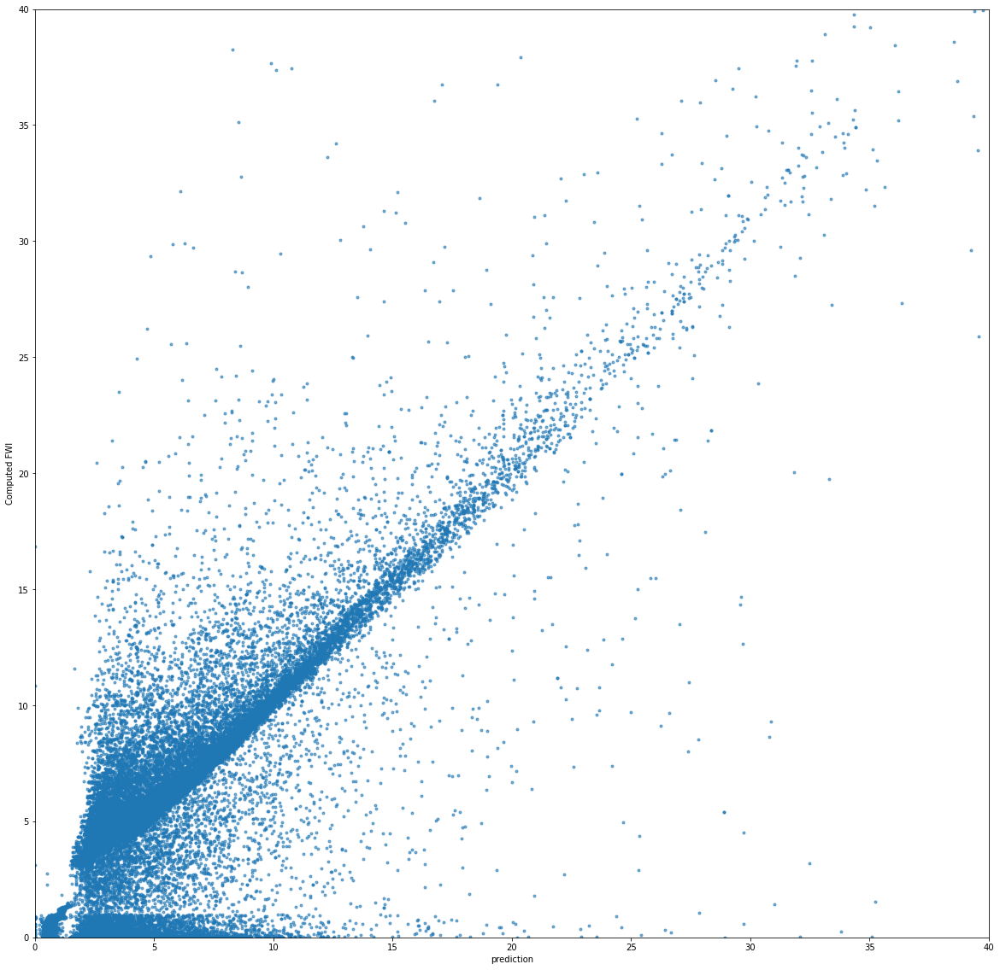

In [62]:
from pylab import *

figure(figsize = (20,20))
plot(model.predict(test_features.reshape(-1,3)), test_labels,".",alpha = 0.6)
xlabel("prediction")
ylabel("Computed FWI")
ylim(0,40)
xlim(0,40)

C:\Users\Liam\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Exception: Data must be 1-dimensional

<Figure size 1440x1440 with 0 Axes>

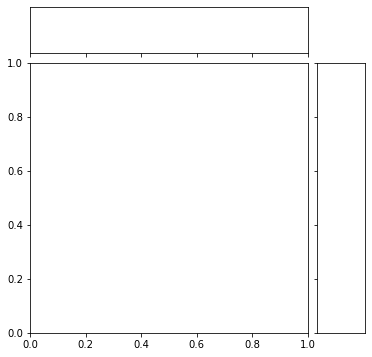

In [63]:
import seaborn as sns

figure(figsize = (20,20))
sns.jointplot(model.predict(test_features.reshape(-1,3)), test_labels,kind = 'kde')
xlabel("prediction")
ylabel("Computed FWI")
ylim(0,40)
xlim(0,40)